In [1]:
import gym
import A_FlexEnv as flex

import A_auxfunctions as fun

import stable_baselines3

from stable_baselines3 import DQN, A2C
from stable_baselines3.a2c.policies import MlpPolicy

from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.env_checker import check_env

from stable_baselines3 import SAC
from stable_baselines3 import DDPG

from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

from stable_baselines3.ddpg.policies import MlpPolicy


import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy.random as rnd
import time
import random as rnd

from time import perf_counter

# Data and Environment preparation

In [2]:
#Data
cwd=os.getcwd()
datafolder=cwd + '/Data'

#impor the data csv
env_data=pd.read_csv(datafolder + '/env_data.csv', header = None)

#make and check the environment
# Select the number of timesteps to consider
# timesteps=141
timesteps=47*4 # 4 days

#Create environment. Based on the aux functions code.
env=fun.make_env(env_data, load_num=4, timestep=timesteps, soc_max=3, eta=0.95, charge_lim=2, min_charge_step=0.2)

In [3]:
env.observation_space

Box([   0.    0.    0.    0.    0.    0. -100.    0. -100.    0.    0.], [ 188.   10.   10.    3.    3.    1.  100.    1.  100. 1000. 1000.], (11,), float32)

In [4]:
env.observation_space.high[3]

3.0

In [5]:
env.action_space

Discrete(12)

# Stable Baselines ALGORITHMS

In [6]:
##DQN
## parameters
gamma=0.99
learning_rate=1e-3
buffer_size=1e6

exploration_fraction=0.01
exploration_final_eps=0.02 
exploration_initial_eps=1.0
train_freq=1
batch_size=32
double_q=True
learning_starts=1000
target_network_update_freq=500

prioritized_replay=False
prioritized_replay_alpha=0.6
prioritized_replay_beta0=0.4
prioritized_replay_beta_iters=None
prioritized_replay_eps=1e-06
param_noise=True
n_cpu_tf_sess=None
verbose=0 
tensorboard_log=None
_init_setup_model=True
policy_kwargs=None
full_tensorboard_log=False
seed=None
# Policy='LnMlpPolicy'

t1_start = perf_counter()

## Train model
model = DQN('MlpPolicy', env, learning_rate=learning_rate, verbose=1,batch_size=batch_size,exploration_fraction=exploration_fraction,)
model.learn(total_timesteps=int(10e6))

t1_stop = perf_counter()
print("\nElapsed time:", t1_stop, t1_start)
print("Elapsed time during the whole program in seconds:", t1_stop-t1_start)

##Proximal Policy Optimization
# model = PPO("MlpPolicy", env, verbose=1)
# model.learn(total_timesteps=4e5)


## Other algorithms
#SAC
# model = SAC('MlpPolicy', env, verbose=2).learn(total_timesteps=1e5)

#A2C
# model = A2C(MlpPolicy, env, verbose=1)
# model.learn(total_timesteps=25000)



Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-512043.9999999999
-498768.2000000002
-499064.9999999999
-497979.79999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.02e+05 |
|    exploration_rate | 0.993     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 5858      |
|    time_elapsed     | 0         |
|    total_timesteps  | 752       |
-----------------------------------


/home/acr/anaconda3/lib/python3.9/site-packages/torch/cuda/__init__.py:80: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0


-552664.2000000001
-532396.6000000001
-371289.39999999997
-565476.2000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.04e+05 |
|    exploration_rate | 0.986     |
| time/               |           |
|    episodes         | 8         |
|    fps              | 6028      |
|    time_elapsed     | 0         |
|    total_timesteps  | 1504      |
-----------------------------------
-511212.6000000001
-491205.2000000001
-479209.6
-445740.19999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.96e+05 |
|    exploration_rate | 0.979     |
| time/               |           |
|    episodes         | 12        |
|    fps              | 6258      |
|    time_elapsed     | 0         |
|    total_timesteps  | 2256      |
-----------------------------------
-503693.5999999999
-525473.9999999999
-544859.6
-515538.5999999

-546100.4000000003
-551181.8
-386952.6
-522374.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.82e+05 |
|    exploration_rate | 0.857     |
| time/               |           |
|    episodes         | 80        |
|    fps              | 6137      |
|    time_elapsed     | 2         |
|    total_timesteps  | 15040     |
-----------------------------------
-532389.9999999999
-493042.8000000002
-482189.4
-457933.9999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.82e+05 |
|    exploration_rate | 0.85      |
| time/               |           |
|    episodes         | 84        |
|    fps              | 6154      |
|    time_elapsed     | 2         |
|    total_timesteps  | 15792     |
-----------------------------------
-555062.1999999997
-458191.7999999999
-488382.4000000001
-372800.60000000015
---------------

-486431.6
-489437.80000000034
-430235.00000000023
-432666.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.82e+05 |
|    exploration_rate | 0.729     |
| time/               |           |
|    episodes         | 152       |
|    fps              | 6078      |
|    time_elapsed     | 4         |
|    total_timesteps  | 28576     |
-----------------------------------
-462183.6
-431171.59999999986
-505451.7999999998
-505246.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.81e+05 |
|    exploration_rate | 0.721     |
| time/               |           |
|    episodes         | 156       |
|    fps              | 6084      |
|    time_elapsed     | 4         |
|    total_timesteps  | 29328     |
-----------------------------------
-503547.60000000003
-451543.5999999998
-490966.9999999999
-456654.20000000036
-----------

-473677.8000000001
-534988.6000000003
-542571.5999999999
-516924.60000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.84e+05 |
|    exploration_rate | 0.6       |
| time/               |           |
|    episodes         | 224       |
|    fps              | 5982      |
|    time_elapsed     | 7         |
|    total_timesteps  | 42112     |
-----------------------------------
-542232.0000000001
-397558.00000000023
-437029.19999999995
-437733.7999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.82e+05 |
|    exploration_rate | 0.593     |
| time/               |           |
|    episodes         | 228       |
|    fps              | 5980      |
|    time_elapsed     | 7         |
|    total_timesteps  | 42864     |
-----------------------------------
-403690.80000000016
-472430.00000000006
-499496.20000

-304358.59999999974
-343842.00000000023
-412116.6000000004
-385166.79999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.52e+05 |
|    exploration_rate | 0.486     |
| time/               |           |
|    episodes         | 288       |
|    fps              | 4104      |
|    time_elapsed     | 13        |
|    total_timesteps  | 54144     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+03  |
|    n_updates        | 1035      |
-----------------------------------
-257393.99999999985
-238772.8000000001
-217951.00000000003
-362470.39999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.44e+05 |
|    exploration_rate | 0.478     |
| time/               |           |
|    episodes         | 292       |
|    fps              | 3898      |
|    time_elap

-277919.20000000007
-362530.19999999966
-170110.4
-308094.99999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.47e+05 |
|    exploration_rate | 0.386     |
| time/               |           |
|    episodes         | 344       |
|    fps              | 2483      |
|    time_elapsed     | 26        |
|    total_timesteps  | 64672     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+03  |
|    n_updates        | 3667      |
-----------------------------------
-278441.3999999999
-292152.19999999995
-242548.5999999999
-268589.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.39e+05 |
|    exploration_rate | 0.378     |
| time/               |           |
|    episodes         | 348       |
|    fps              | 2426      |
|    time_elapsed     | 26        

-291529.59999999986
-256065.80000000005
-208466.80000000002
-163561.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.74e+05 |
|    exploration_rate | 0.286     |
| time/               |           |
|    episodes         | 400       |
|    fps              | 1934      |
|    time_elapsed     | 38        |
|    total_timesteps  | 75200     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 6299      |
-----------------------------------
-286101.00000000006
-241002.40000000008
-211719.80000000005
-277799.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.72e+05 |
|    exploration_rate | 0.278     |
| time/               |           |
|    episodes         | 404       |
|    fps              | 1906      |
|    time_elapsed     

-222982.40000000005
-163001.2000000001
-132273.80000000002
-207446.79999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.36e+05 |
|    exploration_rate | 0.186     |
| time/               |           |
|    episodes         | 456       |
|    fps              | 1631      |
|    time_elapsed     | 52        |
|    total_timesteps  | 85728     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 862       |
|    n_updates        | 8931      |
-----------------------------------
-199313.00000000006
-266008.8
-211508.99999999994
-254464.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.36e+05 |
|    exploration_rate | 0.178     |
| time/               |           |
|    episodes         | 460       |
|    fps              | 1617      |
|    time_elapsed     |

-214604.80000000002
-111433.40000000002
-133030.00000000003
-156292.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.92e+05 |
|    exploration_rate | 0.0856    |
| time/               |           |
|    episodes         | 512       |
|    fps              | 1466      |
|    time_elapsed     | 65        |
|    total_timesteps  | 96256     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 836       |
|    n_updates        | 11563     |
-----------------------------------
-46511.79999999999
-211179.20000000004
-117774.80000000003
-224614.59999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.89e+05 |
|    exploration_rate | 0.0784    |
| time/               |           |
|    episodes         | 516       |
|    fps              | 1457      |
|    time_ela

-105311.60000000006
-192495.40000000005
-180050.8000000001
9111.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 568       |
|    fps              | 1376      |
|    time_elapsed     | 77        |
|    total_timesteps  | 106784    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 936       |
|    n_updates        | 14195     |
-----------------------------------
-207941.00000000003
-197414.40000000008
-135934.39999999997
-198253.6000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 572       |
|    fps              | 1371      |
|    time_elapsed     | 78 

-180591.40000000005
-210981.80000000002
-206809.00000000006
-157118.00000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 624       |
|    fps              | 1315      |
|    time_elapsed     | 89        |
|    total_timesteps  | 117312    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 978       |
|    n_updates        | 16827     |
-----------------------------------
-202755.40000000008
-61974.599999999984
-210138.00000000006
25620.800000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 628       |
|    fps              | 1311      |
|    time_ela

-63637.8
-25163.99999999997
-28963.599999999977
8501.200000000019
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 680       |
|    fps              | 1267      |
|    time_elapsed     | 100       |
|    total_timesteps  | 127840    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+03  |
|    n_updates        | 19459     |
-----------------------------------
10796.199999999995
-135432.0000000001
-55118.60000000002
-195956.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 684       |
|    fps              | 1265      |
|    time_elapsed     | 101   

-19721.59999999999
-18281.4
-57713.0
-159917.40000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 736      |
|    fps              | 1231     |
|    time_elapsed     | 112      |
|    total_timesteps  | 138368   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 22091    |
----------------------------------
-197558.2000000001
-146352.00000000006
-177518.2
7055.800000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 740       |
|    fps              | 1228      |
|    time_elapsed     | 113       |
|    total_timesteps  | 139

-45984.200000000004
-64359.80000000003
-137756.0
12954.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 792       |
|    fps              | 1202      |
|    time_elapsed     | 123       |
|    total_timesteps  | 148896    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 915       |
|    n_updates        | 24723     |
-----------------------------------
-138180.2
41918.200000000026
-46407.400000000016
-39971.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 796       |
|    fps              | 1198      |
|    time_elapsed     | 124       |


-206493.80000000005
-40624.599999999984
-105832.00000000001
-38177.19999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 848       |
|    fps              | 1155      |
|    time_elapsed     | 138       |
|    total_timesteps  | 159424    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+03  |
|    n_updates        | 27355     |
-----------------------------------
16610.8
-37449.2
-27318.99999999998
-211425.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 852       |
|    fps              | 1152      |
|    time_elapsed     | 139       |
|

-36993.400000000045
-210208.40000000008
-70000.20000000001
-61499.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 904       |
|    fps              | 1117      |
|    time_elapsed     | 152       |
|    total_timesteps  | 169952    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+03  |
|    n_updates        | 29987     |
-----------------------------------
-191460.20000000004
-3881.999999999986
-173626.80000000013
-201679.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 908       |
|    fps              | 1114      |
|    time_elaps

-144375.40000000005
-196234.40000000005
-45347.19999999997
-59697.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 960       |
|    fps              | 1081      |
|    time_elapsed     | 166       |
|    total_timesteps  | 180480    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+03  |
|    n_updates        | 32619     |
-----------------------------------
-68439.00000000001
5991.200000000011
18199.600000000013
-41307.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 964       |
|    fps              | 1080      |
|    time_elapsed     | 167 

-124635.0
-35147.00000000002
-151230.80000000013
-7781.599999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1016      |
|    fps              | 1059      |
|    time_elapsed     | 180       |
|    total_timesteps  | 191008    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+03  |
|    n_updates        | 35251     |
-----------------------------------
33940.20000000002
-199971.80000000005
-191962.20000000013
-216092.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1020      |
|    fps              | 1058      |
|    time_elapsed     | 181

-27216.8
-159618.20000000007
-110132.40000000002
-105108.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -8.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1072     |
|    fps              | 1045     |
|    time_elapsed     | 192      |
|    total_timesteps  | 201536   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.76e+03 |
|    n_updates        | 37883    |
----------------------------------
-126878.4
-207975.80000000008
-82992.79999999997
-64280.60000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1076      |
|    fps              | 1044      |
|    time_elapsed     | 193       |
|    total_timesteps  | 

-88082.79999999999
-92466.20000000003
20306.000000000015
-119621.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1128      |
|    fps              | 1035      |
|    time_elapsed     | 204       |
|    total_timesteps  | 212064    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.43e+03  |
|    n_updates        | 40515     |
-----------------------------------
-38147.000000000015
-195165.8000000001
-142915.8000000001
-89094.40000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1132      |
|    fps              | 1035      |
|    time_elapsed 

-197368.80000000005
-76566.99999999996
-133427.60000000006
-208199.40000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1184      |
|    fps              | 1030      |
|    time_elapsed     | 216       |
|    total_timesteps  | 222592    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+03  |
|    n_updates        | 43147     |
-----------------------------------
23055.200000000008
25687.00000000001
-177462.4000000001
42654.200000000026
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1188     |
|    fps              | 1029     |
|    time_elapsed     | 21

-149672.20000000004
14012.79999999999
-22209.000000000007
-21697.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1240      |
|    fps              | 1024      |
|    time_elapsed     | 227       |
|    total_timesteps  | 233120    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.75e+03  |
|    n_updates        | 45779     |
-----------------------------------
-67182.99999999999
-171430.20000000016
-216543.6000000001
-35903.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1244      |
|    fps              | 1023      |
|    time_elapsed     | 228

-126262.60000000003
-94151.39999999997
-189561.6000000001
-128005.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1296      |
|    fps              | 1019      |
|    time_elapsed     | 239       |
|    total_timesteps  | 243648    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+03  |
|    n_updates        | 48411     |
-----------------------------------
-195924.8000000001
-113290.6
-167662.00000000015
-50605.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1300      |
|    fps              | 1018      |
|    time_elapsed     | 23

-108009.59999999999
-9529.400000000003
-16242.400000000001
-158760.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1352      |
|    fps              | 1008      |
|    time_elapsed     | 251       |
|    total_timesteps  | 254176    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 51043     |
-----------------------------------
-78912.19999999998
-85736.59999999998
-104141.4
-99898.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1356      |
|    fps              | 1008      |
|    time_elapsed     | 25

4019.6000000000117
-14543.200000000008
-76856.4
-49502.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1408      |
|    fps              | 991       |
|    time_elapsed     | 266       |
|    total_timesteps  | 264704    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 53675     |
-----------------------------------
-115140.40000000001
-57104.599999999984
-108035.00000000001
-58517.399999999965
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1412      |
|    fps              | 990       |
|    time_elapsed     | 2

-11064.600000000002
-36396.599999999984
-70320.39999999997
-147670.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1464      |
|    fps              | 978       |
|    time_elapsed     | 281       |
|    total_timesteps  | 275232    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.87e+03  |
|    n_updates        | 56307     |
-----------------------------------
-26554.999999999993
-42449.799999999974
-36243.599999999984
-37435.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1468      |
|    fps              | 978       |
|    time_elap

-74239.40000000001
-120465.80000000002
21907.000000000022
-12187.599999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1520      |
|    fps              | 968       |
|    time_elapsed     | 295       |
|    total_timesteps  | 285760    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+03  |
|    n_updates        | 58939     |
-----------------------------------
-14486.999999999985
-74945.60000000005
12642.0
-125212.19999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1524      |
|    fps              | 967       |
|    time_elapsed     | 296

-127615.0
-153096.8
-99092.0
-54350.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1576      |
|    fps              | 961       |
|    time_elapsed     | 308       |
|    total_timesteps  | 296288    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.69e+03  |
|    n_updates        | 61571     |
-----------------------------------
-151960.20000000007
-51551.200000000004
-92470.00000000004
-31202.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1580      |
|    fps              | 961       |
|    time_elapsed     | 308       |
|    total_timesteps

29913.200000000008
32783.80000000001
-1392.599999999995
-75827.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1632      |
|    fps              | 958       |
|    time_elapsed     | 319       |
|    total_timesteps  | 306816    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+03  |
|    n_updates        | 64203     |
-----------------------------------
-74610.59999999999
-104926.8
-107598.2
-136553.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1636      |
|    fps              | 958       |
|    time_elapsed     | 320       |
|    total_t

-89439.60000000006
-16959.799999999996
37921.800000000025
-42077.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1688      |
|    fps              | 956       |
|    time_elapsed     | 331       |
|    total_timesteps  | 317344    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 66835     |
-----------------------------------
23413.000000000004
-20535.200000000004
-12662.199999999993
6596.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1692      |
|    fps              | 956       |
|    time_elapsed  

-52228.79999999999
14776.799999999997
-69453.79999999997
24734.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1744      |
|    fps              | 955       |
|    time_elapsed     | 343       |
|    total_timesteps  | 327872    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.65e+03  |
|    n_updates        | 69467     |
-----------------------------------
29257.000000000007
8466.80000000001
17625.200000000004
-47180.59999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1748      |
|    fps              | 954       |
|    time_elapsed     | 344      

22808.40000000001
12213.599999999997
33918.20000000001
-6327.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1800     |
|    fps              | 952      |
|    time_elapsed     | 355      |
|    total_timesteps  | 338400   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.59e+03 |
|    n_updates        | 72099    |
----------------------------------
24112.000000000015
-46992.60000000003
-67584.00000000001
33272.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1804      |
|    fps              | 952       |
|    time_elapsed     | 356       |
| 

19518.60000000002
25915.40000000001
-16619.60000000001
-57278.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1856      |
|    fps              | 950       |
|    time_elapsed     | 367       |
|    total_timesteps  | 348928    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.43e+03  |
|    n_updates        | 74731     |
-----------------------------------
20234.0
-8191.800000000001
-2450.7999999999965
-12652.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1860      |
|    fps              | 948       |
|    time_elapsed     | 368    

-69909.39999999998
-83350.59999999998
-120819.80000000006
-1931.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1912      |
|    fps              | 940       |
|    time_elapsed     | 382       |
|    total_timesteps  | 359456    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+03  |
|    n_updates        | 77363     |
-----------------------------------
-44401.60000000002
-198002.00000000006
24790.800000000003
16983.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1916     |
|    fps              | 939      |
|    time_elapsed     | 383

-202153.20000000004
-99684.00000000003
29379.200000000004
-6066.600000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1968      |
|    fps              | 932       |
|    time_elapsed     | 396       |
|    total_timesteps  | 369984    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.76e+03  |
|    n_updates        | 79995     |
-----------------------------------
5450.799999999995
14120.2
26584.60000000002
26016.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1972      |
|    fps              | 931       |
|    time_elapsed     | 397     

-33748.59999999999
-34303.79999999999
8848.399999999998
5892.000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2024      |
|    fps              | 924       |
|    time_elapsed     | 411       |
|    total_timesteps  | 380512    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.48e+03  |
|    n_updates        | 82627     |
-----------------------------------
-12310.200000000004
-56564.2
26057.600000000002
24742.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2028      |
|    fps              | 923       |
|    time_elapsed     | 412       |
|    t

-66249.19999999998
20796.8
5363.5999999999985
-3546.799999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2080      |
|    fps              | 918       |
|    time_elapsed     | 425       |
|    total_timesteps  | 391040    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.19e+03  |
|    n_updates        | 85259     |
-----------------------------------
-30802.199999999993
8221.2
-18595.600000000002
-12904.199999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2084      |
|    fps              | 918       |
|    time_elapsed     | 426       |
|   

3700.0000000000055
-1918.0000000000014
25303.800000000007
-23958.000000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2136      |
|    fps              | 916       |
|    time_elapsed     | 438       |
|    total_timesteps  | 401568    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.3e+03   |
|    n_updates        | 87891     |
-----------------------------------
-32115.199999999997
-42709.8
-8426.199999999999
4929.400000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2140      |
|    fps              | 915       |
|    time_elapsed     | 439 

8109.60000000001
30717.8
32047.800000000014
17943.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2192     |
|    fps              | 914      |
|    time_elapsed     | 450      |
|    total_timesteps  | 412096   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.62e+03 |
|    n_updates        | 90523    |
----------------------------------
-2963.9999999999995
-7450.4000000000015
2742.399999999996
25972.40000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2196     |
|    fps              | 914      |
|    time_elapsed     | 451      |
|    total_timesteps 

37921.800000000025
19642.799999999996
25349.600000000006
30117.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2248     |
|    fps              | 914      |
|    time_elapsed     | 462      |
|    total_timesteps  | 422624   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.65e+03 |
|    n_updates        | 93155    |
----------------------------------
37943.60000000002
15315.800000000021
19386.800000000007
-1253.8000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2252     |
|    fps              | 914      |
|    time_elapsed     | 463      |
|    tot

23295.600000000002
20748.399999999998
14603.800000000016
22619.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2304     |
|    fps              | 913      |
|    time_elapsed     | 474      |
|    total_timesteps  | 433152   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.86e+03 |
|    n_updates        | 95787    |
----------------------------------
17393.000000000015
-1764.199999999999
17416.799999999992
25496.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2308     |
|    fps              | 913      |
|    time_elapsed     | 475      |
|    tot

-142154.80000000002
33937.80000000002
12964.600000000015
2804.9999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2360     |
|    fps              | 912      |
|    time_elapsed     | 486      |
|    total_timesteps  | 443680   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 98419    |
----------------------------------
8736.199999999997
-39153.59999999998
18873.599999999995
11650.400000000014
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2364     |
|    fps              | 911      |
|    time_elapsed     | 487      |
|    tota

19525.999999999996
15363.799999999992
6312.600000000007
-30206.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2416     |
|    fps              | 906      |
|    time_elapsed     | 501      |
|    total_timesteps  | 454208   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.26e+03 |
|    n_updates        | 101051   |
----------------------------------
14647.400000000005
15417.600000000002
3415.000000000018
32075.60000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2420     |
|    fps              | 906      |
|    time_elapsed     | 502      |
|    total_timesteps 

14793.799999999996
19933.40000000001
-91979.60000000002
11508.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2472     |
|    fps              | 901      |
|    time_elapsed     | 515      |
|    total_timesteps  | 464736   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.15e+03 |
|    n_updates        | 103683   |
----------------------------------
10741.199999999999
-12347.999999999993
30692.80000000002
16132.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2476     |
|    fps              | 901      |
|    time_elapsed     | 516      |
|    tota

16062.599999999995
-7927.0
-28090.6
38630.20000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 8.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2528     |
|    fps              | 897      |
|    time_elapsed     | 529      |
|    total_timesteps  | 475264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.9e+03  |
|    n_updates        | 106315   |
----------------------------------
11256.00000000001
23405.400000000012
3956.4000000000005
-44515.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 8.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2532     |
|    fps              | 896      |
|    time_elapsed     | 530      |
|    total_timesteps  | 476016 

22609.80000000001
12356.800000000014
33304.20000000001
8218.600000000011
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2584     |
|    fps              | 893      |
|    time_elapsed     | 543      |
|    total_timesteps  | 485792   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.9e+03  |
|    n_updates        | 108947   |
----------------------------------
7713.999999999998
12183.199999999999
2222.799999999998
16817.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2588     |
|    fps              | 893      |
|    time_elapsed     | 544      |
|    total_ti

11332.2
-50327.80000000002
11327.799999999994
-69813.39999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2640     |
|    fps              | 893      |
|    time_elapsed     | 555      |
|    total_timesteps  | 496320   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 111579   |
----------------------------------
-11234.2
1969.4000000000092
19369.800000000007
12075.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2644     |
|    fps              | 893      |
|    time_elapsed     | 556      |
|    total_timesteps  | 49707

-64521.60000000007
12764.000000000013
551.2000000000019
20332.400000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2696      |
|    fps              | 892       |
|    time_elapsed     | 568       |
|    total_timesteps  | 506848    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+03  |
|    n_updates        | 114211    |
-----------------------------------
11473.199999999995
-41960.200000000004
42608.20000000003
34585.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2700      |
|    fps              | 892       |
|    time_elapsed     

11371.399999999996
14754.999999999998
-562.9999999999978
-48089.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2752      |
|    fps              | 891       |
|    time_elapsed     | 580       |
|    total_timesteps  | 517376    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 116843    |
-----------------------------------
7334.200000000002
110.60000000000545
294.9999999999982
15300.200000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2756      |
|    fps              | 891       |
|    time_elapsed    

-9976.400000000005
8837.800000000005
13426.199999999995
19947.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2808      |
|    fps              | 891       |
|    time_elapsed     | 592       |
|    total_timesteps  | 527904    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.28e+03  |
|    n_updates        | 119475    |
-----------------------------------
-3913.999999999992
-83825.40000000002
12047.599999999997
19945.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2812      |
|    fps              | 891       |
|    time_elapsed     | 592     

765.0000000000076
22578.80000000001
4700.800000000003
10636.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2864      |
|    fps              | 891       |
|    time_elapsed     | 604       |
|    total_timesteps  | 538432    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 122107    |
-----------------------------------
26060.399999999994
-14565.199999999999
17911.20000000001
-18632.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2868      |
|    fps              | 891       |
|    time_elapsed     | 605      

13961.400000000005
15355.799999999996
3353.400000000005
11271.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2920      |
|    fps              | 887       |
|    time_elapsed     | 618       |
|    total_timesteps  | 548960    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+03  |
|    n_updates        | 124739    |
-----------------------------------
15470.200000000006
-18082.000000000007
11266.200000000003
2003.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2924      |
|    fps              | 886       |
|    time_elapsed    

-40552.80000000013
-67139.80000000006
-37755.6
-39758.20000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2976      |
|    fps              | 882       |
|    time_elapsed     | 634       |
|    total_timesteps  | 559488    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 127371    |
-----------------------------------
-32554.0
-31423.000000000007
13410.600000000015
-11977.999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2980      |
|    fps              | 881       |
|    time_elapsed     | 635       |
| 

-149142.4
20684.200000000004
-133211.9999999999
34680.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3032      |
|    fps              | 878       |
|    time_elapsed     | 649       |
|    total_timesteps  | 570016    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+03  |
|    n_updates        | 130003    |
-----------------------------------
-86106.60000000003
-2086493.9999999974
5620.000000000007
-105658.20000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3036      |
|    fps              | 877       |
|    time_elapsed     | 650  

-47663.000000000044
-79065.80000000002
16505.40000000001
-35255.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3088      |
|    fps              | 875       |
|    time_elapsed     | 663       |
|    total_timesteps  | 580544    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 471       |
|    n_updates        | 132635    |
-----------------------------------
20153.600000000006
33919.40000000002
9641.000000000016
-142752.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3092      |
|    fps              | 875       |
|    time_elapsed     | 664    

-74987.80000000009
9261.400000000005
-105125.20000000013
28769.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3144      |
|    fps              | 874       |
|    time_elapsed     | 675       |
|    total_timesteps  | 591072    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+03   |
|    n_updates        | 135267    |
-----------------------------------
8710.800000000003
14880.400000000005
-77429.39999999998
-134464.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3148      |
|    fps              | 874       |
|    time_elapsed   

-42603.4
-139374.6000000001
-133173.19999999992
-138578.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3200      |
|    fps              | 874       |
|    time_elapsed     | 688       |
|    total_timesteps  | 601600    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 768       |
|    n_updates        | 137899    |
-----------------------------------
-20325.19999999999
-67742.40000000002
-137213.8000000002
17390.400000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3204      |
|    fps              | 874       |
|    time_elapsed     | 688 

-9436.400000000012
-55851.8
21892.000000000007
-1366.2000000000044
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3256      |
|    fps              | 874       |
|    time_elapsed     | 700       |
|    total_timesteps  | 612128    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+03  |
|    n_updates        | 140531    |
-----------------------------------
-3851.9999999999977
37921.00000000002
-91839.60000000003
-100397.00000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3260      |
|    fps              | 874       |
|    time_elapsed     | 700 

-713.8000000000048
-5484.999999999997
17292.60000000001
-93983.40000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3312      |
|    fps              | 874       |
|    time_elapsed     | 711       |
|    total_timesteps  | 622656    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 948       |
|    n_updates        | 143163    |
-----------------------------------
7185.399999999992
3581.000000000009
14944.00000000001
-6308.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3316      |
|    fps              | 874       |
|    time_elapsed     | 

-83943.40000000004
-20524.199999999997
2117.2000000000135
37916.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3368      |
|    fps              | 874       |
|    time_elapsed     | 723       |
|    total_timesteps  | 633184    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 145795    |
-----------------------------------
23356.000000000015
-5613.599999999996
-22872.600000000002
-83911.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3372      |
|    fps              | 874       |
|    time_elapsed  

21276.800000000003
-79226.80000000005
17335.399999999998
-158705.00000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3424      |
|    fps              | 872       |
|    time_elapsed     | 737       |
|    total_timesteps  | 643712    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+03  |
|    n_updates        | 148427    |
-----------------------------------
-86301.40000000001
-81297.20000000007
-66543.40000000001
2680.1999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3428      |
|    fps              | 872       |
|    time_elapsed  

-78880.80000000008
2328.2000000000035
723.3999999999995
-3925.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3480      |
|    fps              | 870       |
|    time_elapsed     | 751       |
|    total_timesteps  | 654240    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.82e+03  |
|    n_updates        | 151059    |
-----------------------------------
8012.59999999999
-33052.59999999999
8110.800000000001
5096.400000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3484      |
|    fps              | 869       |
|    time_elapsed     | 

4165.599999999995
-7162.000000000004
-68397.19999999998
-42824.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3536      |
|    fps              | 866       |
|    time_elapsed     | 766       |
|    total_timesteps  | 664768    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 667       |
|    n_updates        | 153691    |
-----------------------------------
13912.199999999999
-5393.599999999991
-45182.00000000001
-26057.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3540      |
|    fps              | 866       |
|    time_elapsed    

9422.999999999969
-93810.00000000001
-39523.20000000006
-60577.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3592      |
|    fps              | 864       |
|    time_elapsed     | 781       |
|    total_timesteps  | 675296    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+03   |
|    n_updates        | 156323    |
-----------------------------------
-85228.60000000006
1409.799999999998
-97960.40000000007
-67580.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3596      |
|    fps              | 864       |
|    time_elapsed    

20671.60000000001
-70050.19999999998
-107038.59999999999
-51823.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3648      |
|    fps              | 864       |
|    time_elapsed     | 793       |
|    total_timesteps  | 685824    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 158955    |
-----------------------------------
-45485.200000000004
-118574.79999999999
10434.4
-27120.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3652      |
|    fps              | 864       |
|    time_elapsed     | 794

6762.600000000004
-119974.79999999999
12035.600000000002
42704.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3704      |
|    fps              | 864       |
|    time_elapsed     | 805       |
|    total_timesteps  | 696352    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 161587    |
-----------------------------------
16774.000000000004
-10714.599999999999
7927.0
-9958.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3708      |
|    fps              | 864       |
|    time_elapsed     | 806    

-2185.6000000000035
-73086.99999999996
-64722.80000000002
-71680.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3760      |
|    fps              | 864       |
|    time_elapsed     | 817       |
|    total_timesteps  | 706880    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+03  |
|    n_updates        | 164219    |
-----------------------------------
2071.400000000002
14168.999999999998
15400.200000000012
-49547.20000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3764      |
|    fps              | 864       |
|    time_elapsed     | 818   

23371.200000000015
10157.600000000004
23331.000000000015
27430.600000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3816      |
|    fps              | 864       |
|    time_elapsed     | 829       |
|    total_timesteps  | 717408    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+03  |
|    n_updates        | 166851    |
-----------------------------------
-59397.40000000002
-132350.9999999999
-102827.79999999999
23681.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3820      |
|    fps              | 864       |
|    time_elapsed   

-17776.8
2570.400000000003
7276.0
-35670.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3872      |
|    fps              | 865       |
|    time_elapsed     | 841       |
|    total_timesteps  | 727936    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.35e+03  |
|    n_updates        | 169483    |
-----------------------------------
-41299.60000000003
-26642.60000000001
9048.999999999995
3194.6000000000026
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3876      |
|    fps              | 865       |
|    time_elapsed     | 842       |
|    tot

-3332.4000000000083
28009.000000000007
-41943.799999999996
23337.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3928      |
|    fps              | 862       |
|    time_elapsed     | 855       |
|    total_timesteps  | 738464    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+03  |
|    n_updates        | 172115    |
-----------------------------------
6151.0000000000055
31245.800000000007
-87739.60000000002
15239.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3932      |
|    fps              | 862       |
|    time_elapsed     | 856   

13023.800000000008
-76333.40000000001
-117656.40000000005
-135389.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3984      |
|    fps              | 860       |
|    time_elapsed     | 870       |
|    total_timesteps  | 748992    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+03  |
|    n_updates        | 174747    |
-----------------------------------
28654.000000000007
-7396.600000000008
-17338.600000000013
-76102.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3988      |
|    fps              | 860       |
|    time_elapsed     | 871

20176.200000000004
16854.2
-6204.799999999994
14694.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4040      |
|    fps              | 858       |
|    time_elapsed     | 884       |
|    total_timesteps  | 759520    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+03  |
|    n_updates        | 177379    |
-----------------------------------
11344.600000000002
-65188.39999999998
31983.60000000002
28687.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4044      |
|    fps              | 858       |
|    time_elapsed     | 885      

45921.60000000001
-11180.000000000002
14561.999999999996
-108457.40000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4096      |
|    fps              | 856       |
|    time_elapsed     | 898       |
|    total_timesteps  | 770048    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 653       |
|    n_updates        | 180011    |
-----------------------------------
2767.1999999999975
-17381.399999999994
-11764.6
-7936.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4100      |
|    fps              | 856       |
|    time_elapsed     | 899 

14636.999999999993
-54543.200000000004
-7330.000000000003
-2849.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4152      |
|    fps              | 856       |
|    time_elapsed     | 911       |
|    total_timesteps  | 780576    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+03  |
|    n_updates        | 182643    |
-----------------------------------
-16557.19999999999
-183379.8000000001
-28616.8
-48961.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4156      |
|    fps              | 856       |
|    time_elapsed     | 912   

-75268.60000000002
-121076.60000000005
-89595.8
-60340.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4208      |
|    fps              | 856       |
|    time_elapsed     | 923       |
|    total_timesteps  | 791104    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 475       |
|    n_updates        | 185275    |
-----------------------------------
-78682.20000000004
-149580.4
-157373.40000000002
-106730.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4212      |
|    fps              | 856       |
|    time_elapsed     | 924       |


-90009.40000000014
-80646.79999999999
-54740.19999999999
-101883.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4264      |
|    fps              | 856       |
|    time_elapsed     | 935       |
|    total_timesteps  | 801632    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.61e+03  |
|    n_updates        | 187907    |
-----------------------------------
-47291.4
-72528.4
26027.80000000001
17333.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4268      |
|    fps              | 856       |
|    time_elapsed     | 936       |
|    

-14293.79999999999
11580.199999999997
2210.199999999999
-29938.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4320      |
|    fps              | 857       |
|    time_elapsed     | 947       |
|    total_timesteps  | 812160    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.75e+03  |
|    n_updates        | 190539    |
-----------------------------------
-34457.2
-3038.9999999999873
-34565.19999999997
-51654.799999999974
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4324      |
|    fps              | 857       |
|    time_elapsed     | 948  

13362.199999999999
-4897.199999999981
-42407.40000000001
7907.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4376      |
|    fps              | 857       |
|    time_elapsed     | 959       |
|    total_timesteps  | 822688    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+03  |
|    n_updates        | 193171    |
-----------------------------------
16024.800000000001
-11992.000000000002
-28244.39999999999
-19903.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4380      |
|    fps              | 857       |
|    time_elapsed     | 960   

-15769.400000000003
41918.40000000004
-20374.200000000004
16812.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4432      |
|    fps              | 856       |
|    time_elapsed     | 972       |
|    total_timesteps  | 833216    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 840       |
|    n_updates        | 195803    |
-----------------------------------
-2369.399999999984
-10665.199999999993
-24687.6
-48607.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4436      |
|    fps              | 856       |
|    time_elapsed     | 973       |
|    total_ti

17454.199999999997
27340.0
17517.400000000005
8250.199999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4488      |
|    fps              | 854       |
|    time_elapsed     | 987       |
|    total_timesteps  | 843744    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 198435    |
-----------------------------------
33275.200000000004
11428.400000000005
13935.400000000001
4383.400000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4492      |
|    fps              | 854       |
|    time_elapsed     | 988      

12018.6
-1940.4000000000005
-12539.599999999997
1060.2000000000053
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4544      |
|    fps              | 852       |
|    time_elapsed     | 1002      |
|    total_timesteps  | 854272    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 785       |
|    n_updates        | 201067    |
-----------------------------------
17319.199999999997
6061.000000000025
-18405.199999999993
-5830.799999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4548      |
|    fps              | 852       |
|    time_elapsed     | 1003 

-2430.3999999999987
-118187.80000000005
28719.199999999997
-18883.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4600     |
|    fps              | 850      |
|    time_elapsed     | 1016     |
|    total_timesteps  | 864800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 203699   |
----------------------------------
-10757.999999999985
-15540.199999999997
5531.6
3364.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4604      |
|    fps              | 850       |
|    time_elapsed     | 1017      |
|    tot

-22336.599999999988
20781.400000000012
-107533.6
-122680.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4656      |
|    fps              | 850       |
|    time_elapsed     | 1029      |
|    total_timesteps  | 875328    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 206331    |
-----------------------------------
-115295.19999999997
-54007.399999999994
-27632.39999999999
4531.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4660      |
|    fps              | 850       |
|    time_elapsed     | 103

-82631.4000000001
-6153.4
-1444.8000000000025
-39993.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4712      |
|    fps              | 850       |
|    time_elapsed     | 1041      |
|    total_timesteps  | 885856    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+03  |
|    n_updates        | 208963    |
-----------------------------------
9375.600000000004
-25017.4
-46680.00000000001
2151.200000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4716      |
|    fps              | 850       |
|    time_elapsed     | 1042      |
|    to

59.00000000000463
18590.80000000001
4674.999999999998
21297.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4768      |
|    fps              | 850       |
|    time_elapsed     | 1053      |
|    total_timesteps  | 896384    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 861       |
|    n_updates        | 211595    |
-----------------------------------
-3308.800000000002
-19217.2
-9179.400000000003
10192.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4772      |
|    fps              | 850       |
|    time_elapsed     | 1054      

5997.400000000004
-48376.4
1585.6000000000154
-13189.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4824      |
|    fps              | 851       |
|    time_elapsed     | 1065      |
|    total_timesteps  | 906912    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+03  |
|    n_updates        | 214227    |
-----------------------------------
7313.000000000002
15223.400000000014
2907.0000000000005
17008.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4828      |
|    fps              | 851       |
|    time_elapsed     | 1066   

28718.200000000008
-52470.80000000003
21436.600000000013
12818.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4880      |
|    fps              | 851       |
|    time_elapsed     | 1077      |
|    total_timesteps  | 917440    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+03  |
|    n_updates        | 216859    |
-----------------------------------
10880.4
2278.600000000005
-29342.40000000001
-73484.20000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4884      |
|    fps              | 851       |
|    time_elapsed     | 1078    

-95144.60000000003
-132798.40000000005
-25588.000000000004
-65151.59999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4936      |
|    fps              | 850       |
|    time_elapsed     | 1090      |
|    total_timesteps  | 927968    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.57e+03  |
|    n_updates        | 219491    |
-----------------------------------
-35388.00000000001
-83864.4000000001
8869.800000000003
-10566.399999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4940      |
|    fps              | 850       |
|    time_elapsed  

-13688.59999999999
-10075.200000000006
-239424.40000000052
-23199.200000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4992     |
|    fps              | 849      |
|    time_elapsed     | 1105     |
|    total_timesteps  | 938496   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 735      |
|    n_updates        | 222123   |
----------------------------------
3126.6000000000154
13436.60000000001
1581.1999999999975
20588.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4996      |
|    fps              | 849       |
|    time_elapsed     | 1106     

-103886.99999999999
-136475.80000000005
-68316.00000000003
-35385.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5048      |
|    fps              | 847       |
|    time_elapsed     | 1119      |
|    total_timesteps  | 949024    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+03  |
|    n_updates        | 224755    |
-----------------------------------
-58449.99999999999
-96921.2
-170356.20000000007
-34509.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5052      |
|    fps              | 847       |
|    time_elapsed     | 112

7793.000000000002
-25863.4
-8632.599999999999
10728.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5104      |
|    fps              | 846       |
|    time_elapsed     | 1133      |
|    total_timesteps  | 959552    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 739       |
|    n_updates        | 227387    |
-----------------------------------
-34067.599999999984
4896.600000000004
41914.40000000002
-18148.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5108      |
|    fps              | 846       |
|    time_elapsed     | 1134   

6864.8
-34736.99999999999
16095.2
-19370.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5160      |
|    fps              | 846       |
|    time_elapsed     | 1146      |
|    total_timesteps  | 970080    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 589       |
|    n_updates        | 230019    |
-----------------------------------
-11288.399999999985
-10121.599999999993
-2574.7999999999884
-897.5999999999784
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5164      |
|    fps              | 846       |
|    time_elapsed     | 1147      |
|  

-7165.5999999999785
7323.799999999999
-38998.399999999994
8682.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5216      |
|    fps              | 846       |
|    time_elapsed     | 1158      |
|    total_timesteps  | 980608    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.86e+03  |
|    n_updates        | 232651    |
-----------------------------------
-117989.00000000004
-83065.8000000001
-11303.400000000007
-27289.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5220      |
|    fps              | 846       |
|    time_elapsed 

-208226.6
-101109.00000000001
10819.599999999995
-18478.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5272      |
|    fps              | 846       |
|    time_elapsed     | 1170      |
|    total_timesteps  | 991136    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 235283    |
-----------------------------------
-72820.40000000002
41893.799999999996
-107357.19999999998
-139534.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5276      |
|    fps              | 846       |
|    time_elapsed     | 1171      |
|    total

-168343.6
-183436.99999999997
-204899.00000000006
-227975.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5328      |
|    fps              | 847       |
|    time_elapsed     | 1182      |
|    total_timesteps  | 1001664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.61e+03  |
|    n_updates        | 237915    |
-----------------------------------
-13044.20000000001
-56014.99999999999
-226822.0000000001
-227546.4000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5332      |
|    fps              | 847       |
|    time_elapsed     | 11

-31780.00000000001
-86518.40000000002
-33954.6
-295744.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.64e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5384      |
|    fps              | 847       |
|    time_elapsed     | 1194      |
|    total_timesteps  | 1012192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 714       |
|    n_updates        | 240547    |
-----------------------------------
-225777.19999999995
-3106.999999999996
-40528.79999999999
-225158.2000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.63e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5388      |
|    fps              | 847       |
|    time_elapsed     | 1195

-332913.00000000006
-281846.79999999993
-144291.80000000002
-331181.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5440      |
|    fps              | 847       |
|    time_elapsed     | 1207      |
|    total_timesteps  | 1022720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 871       |
|    n_updates        | 243179    |
-----------------------------------
-100970.40000000002
-424089.00000000006
-327606.80000000005
-367701.2000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5444      |
|    fps              | 846       |
|    time_elapsed     |

-508405.79999999993
-373286.4
-294478.7999999999
-447537.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.96e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5496      |
|    fps              | 845       |
|    time_elapsed     | 1221      |
|    total_timesteps  | 1033248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 371       |
|    n_updates        | 245811    |
-----------------------------------
-296078.79999999993
-379902.60000000015
-400062.0000000001
-382596.0000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5500     |
|    fps              | 845      |
|    time_elapsed     | 1222     |

-71162.20000000004
-418811.8000000001
-362633.1999999999
-327902.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5552      |
|    fps              | 844       |
|    time_elapsed     | 1236      |
|    total_timesteps  | 1043776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+03  |
|    n_updates        | 248443    |
-----------------------------------
-405416.2000000001
-488197.19999999995
-346715.0000000002
-297407.59999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5556      |
|    fps              | 843       |
|    time_elapsed     | 123

-359369.39999999997
-300176.8
-488427.59999999986
-503016.99999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5608      |
|    fps              | 842       |
|    time_elapsed     | 1250      |
|    total_timesteps  | 1054304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 900       |
|    n_updates        | 251075    |
-----------------------------------
-301903.3999999999
-419983.2
-365926.19999999984
-412134.1999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5612      |
|    fps              | 842       |
|    time_elapsed     | 1251      

-367781.2
-313586.2
-402462.19999999995
-438553.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5664      |
|    fps              | 841       |
|    time_elapsed     | 1264      |
|    total_timesteps  | 1064832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+03  |
|    n_updates        | 253707    |
-----------------------------------
-461662.2
-455080.00000000006
-433135.2
-179562.80000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5668      |
|    fps              | 841       |
|    time_elapsed     | 1265      |
|    total_timesteps  | 10

-300521.79999999976
-190593.40000000005
-310385.4
-21015.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5720      |
|    fps              | 842       |
|    time_elapsed     | 1276      |
|    total_timesteps  | 1075360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+03  |
|    n_updates        | 256339    |
-----------------------------------
-84120.40000000005
-295052.0
-451500.80000000005
-413447.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5724      |
|    fps              | 842       |
|    time_elapsed     | 1277     

-83422.2
-105844.00000000003
-25337.60000000001
-17960.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5776      |
|    fps              | 842       |
|    time_elapsed     | 1288      |
|    total_timesteps  | 1085888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 886       |
|    n_updates        | 258971    |
-----------------------------------
-10136.199999999999
-496998.3999999999
-105030.80000000002
1348.600000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.96e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5780      |
|    fps              | 842       |
|    time_elapsed     | 128

-427646.80000000005
-474585.39999999997
-301690.8
-385940.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.82e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5832      |
|    fps              | 842       |
|    time_elapsed     | 1300      |
|    total_timesteps  | 1096416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+03  |
|    n_updates        | 261603    |
-----------------------------------
-459267.1999999998
-344025.40000000014
-422646.2
-351471.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.85e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5836      |
|    fps              | 842       |
|    time_elapsed     | 1301      |
|    to

-190164.4
-62819.59999999997
-349572.8
-243975.1999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.78e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5888      |
|    fps              | 843       |
|    time_elapsed     | 1312      |
|    total_timesteps  | 1106944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 264235    |
-----------------------------------
-77418.6
-34371.399999999994
-326679.0000000001
-65636.40000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.7e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5892     |
|    fps              | 843      |
|    time_elapsed     | 1313     |
|    total_timesteps

-395837.80000000005
-195342.19999999998
-222654.39999999997
-197650.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5944      |
|    fps              | 843       |
|    time_elapsed     | 1324      |
|    total_timesteps  | 1117472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 777       |
|    n_updates        | 266867    |
-----------------------------------
7185.4
-111238.59999999999
-193816.19999999992
-81453.20000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5948      |
|    fps              | 843       |
|    time_elapsed     | 13

-166281.4
-338469.3999999998
-162821.40000000008
-336253.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6000      |
|    fps              | 842       |
|    time_elapsed     | 1339      |
|    total_timesteps  | 1128000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+03  |
|    n_updates        | 269499    |
-----------------------------------
-223139.59999999998
-337083.00000000006
-228524.19999999998
-388726.3999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6004      |
|    fps              | 842       |
|    time_elapsed     | 1340      

-186430.99999999997
-233037.80000000005
-300058.3999999999
-69481.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6056      |
|    fps              | 840       |
|    time_elapsed     | 1353      |
|    total_timesteps  | 1138528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 776       |
|    n_updates        | 272131    |
-----------------------------------
-491231.79999999993
-445108.99999999994
-246897.2
-67486.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6060      |
|    fps              | 840       |
|    time_elapsed     | 1355      |

34124.80000000001
-1435.7999999999997
-124812.79999999997
-155069.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.11e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6112      |
|    fps              | 839       |
|    time_elapsed     | 1368      |
|    total_timesteps  | 1149056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.71e+03  |
|    n_updates        | 274763    |
-----------------------------------
-76723.99999999999
-163979.8
-135536.99999999997
9293.600000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6116      |
|    fps              | 839       |
|    time_elapsed     | 136

-218861.2
-250499.59999999995
-214691.6000000001
-174572.2000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6168      |
|    fps              | 838       |
|    time_elapsed     | 1382      |
|    total_timesteps  | 1159584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 613       |
|    n_updates        | 277395    |
-----------------------------------
-68659.40000000004
-181845.60000000012
-78476.79999999996
-228007.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6172      |
|    fps              | 838       |
|    time_elapsed     | 1383      |


-82495.8
-48216.19999999999
-9240.20000000001
-30819.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6224      |
|    fps              | 839       |
|    time_elapsed     | 1394      |
|    total_timesteps  | 1170112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 587       |
|    n_updates        | 280027    |
-----------------------------------
-65823.6
-57586.80000000004
-41727.20000000002
-42284.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6228      |
|    fps              | 839       |
|    time_elapsed     | 1395      |
|   

8102.200000000006
-65720.40000000008
-20101.59999999999
-15173.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6280      |
|    fps              | 839       |
|    time_elapsed     | 1406      |
|    total_timesteps  | 1180640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+03  |
|    n_updates        | 282659    |
-----------------------------------
-24281.00000000001
16715.200000000004
3032.7999999999947
24831.200000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6284      |
|    fps              | 839       |
|    time_elapsed   

8798.599999999999
14040.400000000027
60.60000000000477
5344.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6336      |
|    fps              | 839       |
|    time_elapsed     | 1418      |
|    total_timesteps  | 1191168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 985       |
|    n_updates        | 285291    |
-----------------------------------
17342.599999999995
11359.000000000007
-47882.39999999997
-17845.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6340      |
|    fps              | 839       |
|    time_elapsed    

11997.600000000002
21915.800000000007
-112778.60000000002
-57570.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6392      |
|    fps              | 840       |
|    time_elapsed     | 1430      |
|    total_timesteps  | 1201696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 694       |
|    n_updates        | 287923    |
-----------------------------------
8028.800000000001
2953.2000000000044
-15886.800000000001
2173.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6396      |
|    fps              | 840       |
|    time_elapsed   

-52240.0
-13269.399999999989
-28440.99999999999
6772.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6448      |
|    fps              | 840       |
|    time_elapsed     | 1442      |
|    total_timesteps  | 1212224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+03  |
|    n_updates        | 290555    |
-----------------------------------
13921.40000000001
14010.6
-20591.0
17466.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6452      |
|    fps              | 840       |
|    time_elapsed     | 1443      |
|    total_timest

38721.00000000002
-18762.0
-34801.200000000026
-83906.00000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6504      |
|    fps              | 839       |
|    time_elapsed     | 1456      |
|    total_timesteps  | 1222752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+03  |
|    n_updates        | 293187    |
-----------------------------------
-99654.60000000022
10179.6
-69268.8
-70880.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6508      |
|    fps              | 839       |
|    time_elapsed     | 1457      |
|    total_time

-7967.199999999994
-5284.000000000003
13214.600000000026
-58202.799999999974
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6560      |
|    fps              | 838       |
|    time_elapsed     | 1471      |
|    total_timesteps  | 1233280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 592       |
|    n_updates        | 295819    |
-----------------------------------
-115959.39999999998
-22571.20000000002
30688.00000000002
-16409.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6564      |
|    fps              | 838       |
|    time_elapsed 

-117909.4
-142505.80000000005
-25325.600000000006
-5079.999999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6616      |
|    fps              | 837       |
|    time_elapsed     | 1485      |
|    total_timesteps  | 1243808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 298451    |
-----------------------------------
-6680.599999999996
-62117.19999999999
-51785.199999999975
5320.600000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6620      |
|    fps              | 837       |
|    time_elapsed     | 148

-5597.399999999998
-56281.40000000001
-72269.80000000002
-12556.799999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6672      |
|    fps              | 835       |
|    time_elapsed     | 1500      |
|    total_timesteps  | 1254336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.2e+03   |
|    n_updates        | 301083    |
-----------------------------------
-92367.00000000001
-69755.40000000001
-70312.59999999999
-6540.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6676      |
|    fps              | 835       |
|    time_elapsed   

6771.8000000000075
22648.800000000007
-3815.5999999999945
-8859.599999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6728      |
|    fps              | 836       |
|    time_elapsed     | 1512      |
|    total_timesteps  | 1264864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 635       |
|    n_updates        | 303715    |
-----------------------------------
26054.200000000015
-27591.20000000001
-7090.600000000003
21350.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6732      |
|    fps              | 836       |
|    time_elapsed  

-7934.799999999997
-58741.20000000005
2614.80000000001
-88736.00000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6784      |
|    fps              | 836       |
|    time_elapsed     | 1524      |
|    total_timesteps  | 1275392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 960       |
|    n_updates        | 306347    |
-----------------------------------
-11922.400000000001
-3229.400000000004
12732.200000000008
-59146.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6788      |
|    fps              | 836       |
|    time_elapsed   

10811.800000000027
16713.800000000003
7943.800000000016
16106.400000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6840      |
|    fps              | 836       |
|    time_elapsed     | 1536      |
|    total_timesteps  | 1285920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 656       |
|    n_updates        | 308979    |
-----------------------------------
7501.199999999997
-23403.200000000004
-12602.8
5222.600000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6844      |
|    fps              | 836       |
|    time_elapsed     | 1537    

5238.999999999996
-63177.000000000065
9781.199999999993
6817.399999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6896      |
|    fps              | 837       |
|    time_elapsed     | 1548      |
|    total_timesteps  | 1296448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.03e+03  |
|    n_updates        | 311611    |
-----------------------------------
13966.199999999992
24786.2
26763.20000000001
17478.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6900      |
|    fps              | 837       |
|    time_elapsed     | 1549      |

12665.000000000018
12617.800000000007
-6604.000000000004
9340.600000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6952      |
|    fps              | 837       |
|    time_elapsed     | 1560      |
|    total_timesteps  | 1306976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.12e+03  |
|    n_updates        | 314243    |
-----------------------------------
19928.800000000007
-23372.19999999999
-12210.399999999985
-9641.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6956      |
|    fps              | 837       |
|    time_elapsed   

10578.600000000013
-76482.0
29292.59999999999
-13317.599999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7008      |
|    fps              | 836       |
|    time_elapsed     | 1575      |
|    total_timesteps  | 1317504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+03  |
|    n_updates        | 316875    |
-----------------------------------
9965.599999999995
-20222.600000000013
-67653.59999999996
20717.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7012      |
|    fps              | 836       |
|    time_elapsed     | 1576   

-91328.40000000004
-7314.199999999999
-79231.39999999995
20613.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7064      |
|    fps              | 834       |
|    time_elapsed     | 1590      |
|    total_timesteps  | 1328032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 516       |
|    n_updates        | 319507    |
-----------------------------------
20742.80000000001
10533.599999999995
-86138.0
-101853.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7068      |
|    fps              | 834       |
|    time_elapsed     | 1591  

-96045.60000000003
-60020.8
-56725.60000000002
30083.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7120      |
|    fps              | 833       |
|    time_elapsed     | 1605      |
|    total_timesteps  | 1338560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.05e+03  |
|    n_updates        | 322139    |
-----------------------------------
-104580.4
-43478.999999999956
-51489.39999999996
8696.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7124      |
|    fps              | 833       |
|    time_elapsed     | 1606      |
|    total_tim

22026.400000000023
-1509.3999999999992
20617.20000000001
-15856.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7176      |
|    fps              | 832       |
|    time_elapsed     | 1620      |
|    total_timesteps  | 1349088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 922       |
|    n_updates        | 324771    |
-----------------------------------
-9105.399999999987
-75327.20000000003
2482.400000000003
-9149.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7180      |
|    fps              | 832       |
|    time_elapsed     | 1621   

-507.2000000000053
-7856.5999999999985
19288.2
2652.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7232      |
|    fps              | 832       |
|    time_elapsed     | 1633      |
|    total_timesteps  | 1359616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.41e+03  |
|    n_updates        | 327403    |
-----------------------------------
-13924.399999999987
-8543.999999999993
-4423.7999999999965
-44769.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7236      |
|    fps              | 832       |
|    time_elapsed     | 1634 

-81997.20000000001
16725.800000000003
-3093.1999999999884
-100334.80000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7288      |
|    fps              | 832       |
|    time_elapsed     | 1645      |
|    total_timesteps  | 1370144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+03  |
|    n_updates        | 330035    |
-----------------------------------
24157.200000000008
4848.800000000004
-96879.00000000006
5380.400000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7292      |
|    fps              | 832       |
|    time_elapsed   

13503.800000000005
-90059.4000000001
34524.80000000002
4695.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7344      |
|    fps              | 833       |
|    time_elapsed     | 1657      |
|    total_timesteps  | 1380672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.49e+03  |
|    n_updates        | 332667    |
-----------------------------------
5466.799999999994
16809.000000000007
-11141.799999999994
695.2000000000057
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7348      |
|    fps              | 833       |
|    time_elapsed     | 1

13837.800000000017
-22282.80000000001
25898.8
9477.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7400      |
|    fps              | 833       |
|    time_elapsed     | 1669      |
|    total_timesteps  | 1391200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 876       |
|    n_updates        | 335299    |
-----------------------------------
-2532.3999999999796
-39869.80000000002
2504.599999999999
6617.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7404      |
|    fps              | 833       |
|    time_elapsed     | 1670     

-28759.4
-11175.600000000004
2048.8000000000184
-63195.600000000035
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7456     |
|    fps              | 833      |
|    time_elapsed     | 1681     |
|    total_timesteps  | 1401728  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 706      |
|    n_updates        | 337931   |
----------------------------------
-7222.200000000003
-73844.59999999996
2641.6000000000076
-7903.000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7460      |
|    fps              | 833       |
|    time_elapsed     | 1682      |
|    to

8839.000000000002
2090.1999999999925
-14585.799999999994
-82896.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7512      |
|    fps              | 832       |
|    time_elapsed     | 1695      |
|    total_timesteps  | 1412256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 340563    |
-----------------------------------
-2333.200000000002
4373.600000000002
26022.000000000007
4084.8000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7516      |
|    fps              | 832       |
|    time_elapsed    

469.3999999999973
-60788.80000000002
-107034.00000000001
-16510.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7568     |
|    fps              | 831      |
|    time_elapsed     | 1710     |
|    total_timesteps  | 1422784  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 989      |
|    n_updates        | 343195   |
----------------------------------
948.2000000000221
-7752.199999999999
-2092.600000000015
-14391.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7572      |
|    fps              | 831       |
|    time_elapsed     | 1711      |
|    tota

650.2000000000039
-1050.599999999993
14551.199999999995
-39134.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7624     |
|    fps              | 831      |
|    time_elapsed     | 1723     |
|    total_timesteps  | 1433312  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 792      |
|    n_updates        | 345827   |
----------------------------------
7802.400000000007
4933.600000000004
-2568.99999999999
-23577.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7628      |
|    fps              | 831       |
|    time_elapsed     | 1724      |
|

11663.200000000006
5328.5999999999985
-31261.400000000005
-84501.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7680      |
|    fps              | 830       |
|    time_elapsed     | 1738      |
|    total_timesteps  | 1443840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+03  |
|    n_updates        | 348459    |
-----------------------------------
13352.200000000013
-41304.999999999985
-26188.999999999996
10723.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7684      |
|    fps              | 830       |
|    time_elapsed     | 1739

-1997.599999999998
-51116.00000000002
-5068.199999999996
-9011.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7736      |
|    fps              | 830       |
|    time_elapsed     | 1750      |
|    total_timesteps  | 1454368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.03e+03  |
|    n_updates        | 351091    |
-----------------------------------
-77319.4
-6630.199999999997
3912.599999999992
-67372.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7740      |
|    fps              | 830       |
|    time_elapsed     | 1751   

-117150.20000000008
-7372.400000000064
-7201.400000000009
-6582.40000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7792      |
|    fps              | 830       |
|    time_elapsed     | 1763      |
|    total_timesteps  | 1464896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+03  |
|    n_updates        | 353723    |
-----------------------------------
-31048.400000000005
15847.6
4979.800000000001
11249.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7796      |
|    fps              | 830       |
|    time_elapsed     | 1764   

-55006.20000000001
-9038.2
31173.20000000002
-86263.40000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7848     |
|    fps              | 831      |
|    time_elapsed     | 1775     |
|    total_timesteps  | 1475424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 678      |
|    n_updates        | 356355   |
----------------------------------
-71233.99999999999
12710.200000000012
-9680.399999999987
-9751.799999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7852      |
|    fps              | 831       |
|    time_elapsed     | 1776      |
|    total_

-76311.19999999998
28002.200000000008
-74234.4
592.2000000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7904      |
|    fps              | 831       |
|    time_elapsed     | 1787      |
|    total_timesteps  | 1485952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+03  |
|    n_updates        | 358987    |
-----------------------------------
-2029.3999999999942
-17030.59999999999
-13084.799999999994
10944.400000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7908      |
|    fps              | 831       |
|    time_elapsed     | 1787 

-84992.80000000013
-653.3999999999861
9313.200000000013
-12470.599999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7960      |
|    fps              | 831       |
|    time_elapsed     | 1798      |
|    total_timesteps  | 1496480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+03  |
|    n_updates        | 361619    |
-----------------------------------
-25542.799999999996
-15211.800000000003
13394.200000000004
20009.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7964      |
|    fps              | 831       |
|    time_elapsed 

1981.4000000000078
922.4000000000083
-1470.1999999999966
-1117.7999999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8016      |
|    fps              | 831       |
|    time_elapsed     | 1812      |
|    total_timesteps  | 1507008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.82e+03  |
|    n_updates        | 364251    |
-----------------------------------
22659.00000000002
-1830.3999999999942
-6502.199999999984
804.0000000000099
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8020      |
|    fps              | 831       |
|    time_elapsed   

4185.599999999999
-154729.19999999998
1907.8000000000138
-45442.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8072      |
|    fps              | 830       |
|    time_elapsed     | 1826      |
|    total_timesteps  | 1517536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.94e+03  |
|    n_updates        | 366883    |
-----------------------------------
571.6000000000525
9482.000000000015
-7266.199999999986
819.9999999999955
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8076      |
|    fps              | 830       |
|    time_elapsed     

20690.2
-3860.8000000000006
17369.599999999995
-1289.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8128      |
|    fps              | 829       |
|    time_elapsed     | 1841      |
|    total_timesteps  | 1528064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+03  |
|    n_updates        | 369515    |
-----------------------------------
7997.800000000004
3403.200000000002
-11045.599999999991
-62599.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8132      |
|    fps              | 829       |
|    time_elapsed     | 1842   

33228.400000000016
-76934.00000000016
-9665.000000000011
1453.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8184     |
|    fps              | 829      |
|    time_elapsed     | 1855     |
|    total_timesteps  | 1538592  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 890      |
|    n_updates        | 372147   |
----------------------------------
-6270.600000000001
27287.600000000013
-2678.6000000000035
14160.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8188      |
|    fps              | 828       |
|    time_elapsed     | 1856      |

1246.9999999999643
-1283.4000000000096
-1046.9999999999804
8811.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8240      |
|    fps              | 828       |
|    time_elapsed     | 1869      |
|    total_timesteps  | 1549120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.45e+03  |
|    n_updates        | 374779    |
-----------------------------------
6555.200000000008
2779.399999999995
5357.200000000007
7300.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8244      |
|    fps              | 828       |
|    time_elapsed     |

9394.400000000025
15182.000000000011
18896.200000000008
14723.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8296      |
|    fps              | 829       |
|    time_elapsed     | 1881      |
|    total_timesteps  | 1559648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+03  |
|    n_updates        | 377411    |
-----------------------------------
-429.4000000000001
-1156.5999999999958
-5244.999999999995
552.6000000000126
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8300      |
|    fps              | 829       |
|    time_elapsed    

-5798.199999999975
5548.599999999995
1806.1999999999962
-3030.4000000000024
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8352      |
|    fps              | 829       |
|    time_elapsed     | 1893      |
|    total_timesteps  | 1570176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 552       |
|    n_updates        | 380043    |
-----------------------------------
1333.4000000000055
8707.400000000003
9018.200000000006
-94829.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8356      |
|    fps              | 829       |
|    time_elapsed     

8040.799999999999
-116566.80000000002
-122619.00000000006
148.40000000000347
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8408     |
|    fps              | 829      |
|    time_elapsed     | 1905     |
|    total_timesteps  | 1580704  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.8e+03  |
|    n_updates        | 382675   |
----------------------------------
10864.400000000016
13974.600000000006
-8.399999999990314
-79526.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8412      |
|    fps              | 829       |
|    time_elapsed     | 1906      

-65861.79999999999
-21982.19999999999
-5628.399999999985
-16305.999999999978
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8464     |
|    fps              | 829      |
|    time_elapsed     | 1917     |
|    total_timesteps  | 1591232  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.16e+03 |
|    n_updates        | 385307   |
----------------------------------
-45865.4
-35562.79999999999
5444.200000000001
12212.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8468      |
|    fps              | 829       |
|    time_elapsed     | 1918      |
|    tota

-21232.40000000001
4663.200000000006
18129.600000000006
12659.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8520      |
|    fps              | 829       |
|    time_elapsed     | 1931      |
|    total_timesteps  | 1601760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 746       |
|    n_updates        | 387939    |
-----------------------------------
6095.000000000016
3444.0000000000014
-23669.000000000004
-74008.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8524      |
|    fps              | 828       |
|    time_elapsed    

-70710.6
7360.999999999998
-10493.999999999996
18567.400000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8576      |
|    fps              | 828       |
|    time_elapsed     | 1947      |
|    total_timesteps  | 1612288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+03  |
|    n_updates        | 390571    |
-----------------------------------
-32774.0
6190.400000000001
-49306.79999999999
-1968.999999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8580      |
|    fps              | 827       |
|    time_elapsed     | 1948      |
|    

12813.000000000011
3426.599999999997
-2697.799999999999
-30988.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8632      |
|    fps              | 827       |
|    time_elapsed     | 1961      |
|    total_timesteps  | 1622816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+03  |
|    n_updates        | 393203    |
-----------------------------------
-2719.5999999999544
15881.200000000006
-2685.3999999999974
19283.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8636      |
|    fps              | 827       |
|    time_elapsed  

4774.800000000016
764.2000000000068
4714.399999999986
-51020.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8688      |
|    fps              | 826       |
|    time_elapsed     | 1976      |
|    total_timesteps  | 1633344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+03  |
|    n_updates        | 395835    |
-----------------------------------
-5816.999999999985
-112125.4
1368.1999999999985
7482.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8692      |
|    fps              | 826       |
|    time_elapsed     | 1977      |
|    to

-9799.8
21410.000000000007
-70197.8
-423.5999999999941
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8744      |
|    fps              | 826       |
|    time_elapsed     | 1989      |
|    total_timesteps  | 1643872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 927       |
|    n_updates        | 398467    |
-----------------------------------
19368.000000000007
1997.8000000000043
2676.0000000000073
-28638.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8748      |
|    fps              | 826       |
|    time_elapsed     | 1990      |
|   

-5798.000000000007
-4432.800000000005
-6426.799999999994
-60692.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8800      |
|    fps              | 826       |
|    time_elapsed     | 2001      |
|    total_timesteps  | 1654400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3e+03     |
|    n_updates        | 401099    |
-----------------------------------
-21914.400000000038
5319.800000000022
-64177.20000000008
11301.600000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8804      |
|    fps              | 826       |
|    time_elapsed     | 2002  

-27539.800000000025
-12269.399999999998
-926.3999999999842
20310.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8856      |
|    fps              | 826       |
|    time_elapsed     | 2013      |
|    total_timesteps  | 1664928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 545       |
|    n_updates        | 403731    |
-----------------------------------
6032.000000000007
-152546.00000000006
10669.000000000005
-77050.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8860      |
|    fps              | 826       |
|    time_elapsed     | 2014

-24703.80000000002
10854.000000000004
18592.200000000008
14610.200000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8912      |
|    fps              | 827       |
|    time_elapsed     | 2025      |
|    total_timesteps  | 1675456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.73e+03  |
|    n_updates        | 406363    |
-----------------------------------
-31115.400000000118
4663.200000000004
-94.80000000000629
21996.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8916     |
|    fps              | 827      |
|    time_elapsed     | 2026

-8617.599999999997
-3461.4000000000124
-13819.200000000004
-170836.6000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8968      |
|    fps              | 827       |
|    time_elapsed     | 2037      |
|    total_timesteps  | 1685984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 599       |
|    n_updates        | 408995    |
-----------------------------------
-25170.000000000007
-5996.999999999991
5973.6
-15222.400000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8972      |
|    fps              | 827       |
|    time_elapsed     | 2038

-12587.200000000097
-59956.79999999997
7426.000000000004
41.60000000001338
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9024      |
|    fps              | 827       |
|    time_elapsed     | 2049      |
|    total_timesteps  | 1696512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.09e+03  |
|    n_updates        | 411627    |
-----------------------------------
-34469.200000000026
20347.4
-166299.6
6209.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9028      |
|    fps              | 827       |
|    time_elapsed     | 2050      |
|    

1430.200000000007
-15819.799999999994
-25109.200000000023
-77673.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9080      |
|    fps              | 827       |
|    time_elapsed     | 2063      |
|    total_timesteps  | 1707040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 619       |
|    n_updates        | 414259    |
-----------------------------------
21950.599999999995
2737.2000000000103
-37691.399999999994
-25529.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9084      |
|    fps              | 827       |
|    time_elapsed

-2593.600000000058
-22087.000000000106
-2449.199999999995
-3923.6000000000354
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9136      |
|    fps              | 826       |
|    time_elapsed     | 2077      |
|    total_timesteps  | 1717568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.01e+03  |
|    n_updates        | 416891    |
-----------------------------------
11189.599999999999
-151740.39999999997
-135190.79999999996
-10386.399999999958
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9140      |
|    fps              | 826       |
|    time_elaps

696.600000000003
1744.9999999999986
-21554.4
-20006.400000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9192      |
|    fps              | 825       |
|    time_elapsed     | 2092      |
|    total_timesteps  | 1728096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 735       |
|    n_updates        | 419523    |
-----------------------------------
-66408.79999999999
-28400.60000000001
-27768.199999999997
-78591.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9196      |
|    fps              | 825       |
|    time_elapsed     | 2093      |
|   

-13979.999999999989
-128597.59999999999
-118241.60000000003
-136988.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9248      |
|    fps              | 825       |
|    time_elapsed     | 2107      |
|    total_timesteps  | 1738624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 793       |
|    n_updates        | 422155    |
-----------------------------------
4805.000000000004
-31869.200000000063
9893.600000000008
-1342.9999999999968
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9252      |
|    fps              | 825       |
|    time_elapsed     | 21

18606.600000000013
-27769.80000000001
-44801.80000000003
809.1999999999441
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9304      |
|    fps              | 825       |
|    time_elapsed     | 2119      |
|    total_timesteps  | 1749152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.97e+03  |
|    n_updates        | 424787    |
-----------------------------------
-19106.00000000005
-3402.800000000002
-29490.600000000006
-14554.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9308      |
|    fps              | 825       |
|    time_elapsed     | 2120  

-22724.60000000002
3458.6000000000167
11453.600000000013
-6403.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9360      |
|    fps              | 825       |
|    time_elapsed     | 2131      |
|    total_timesteps  | 1759680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 686       |
|    n_updates        | 427419    |
-----------------------------------
-24670.199999999993
-19733.399999999994
3407.1999999999994
14757.200000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9364      |
|    fps              | 825       |
|    time_elapsed 

-1978.6000000000167
-6548.4
-8327.399999999994
-49383.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9416      |
|    fps              | 825       |
|    time_elapsed     | 2143      |
|    total_timesteps  | 1770208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 479       |
|    n_updates        | 430051    |
-----------------------------------
27239.800000000003
-4391.599999999984
-2053.2
-28536.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9420      |
|    fps              | 825       |
|    time_elapsed     | 2144      |
|    total_time

-109836.20000000007
-8966.800000000016
-1189.7999999999977
15412.800000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9472      |
|    fps              | 826       |
|    time_elapsed     | 2155      |
|    total_timesteps  | 1780736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 964       |
|    n_updates        | 432683    |
-----------------------------------
6625.600000000006
-4689.2
14083.79999999999
-100604.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9476      |
|    fps              | 826       |
|    time_elapsed     | 2156  

-16709.799999999992
-4489.199999999997
-9366.399999999996
-26190.400000000038
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9528      |
|    fps              | 826       |
|    time_elapsed     | 2167      |
|    total_timesteps  | 1791264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 776       |
|    n_updates        | 435315    |
-----------------------------------
-33453.0
-4020.9999999999895
4245.600000000002
15381.800000000014
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9532     |
|    fps              | 826      |
|    time_elapsed     | 2168     |
|

-82967.40000000001
-1832.3999999999974
31395.200000000033
-49.4000000000033
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9584      |
|    fps              | 825       |
|    time_elapsed     | 2182      |
|    total_timesteps  | 1801792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+03  |
|    n_updates        | 437947    |
-----------------------------------
20157.799999999992
15472.400000000005
2320.1999999999985
692.600000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9588      |
|    fps              | 825       |
|    time_elapsed     

-62760.60000000001
-54763.799999999996
-1949.8000000000015
-5256.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9640      |
|    fps              | 824       |
|    time_elapsed     | 2196      |
|    total_timesteps  | 1812320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.35e+03  |
|    n_updates        | 440579    |
-----------------------------------
17431.40000000001
-2459.199999999998
548.4000000000023
7913.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9644      |
|    fps              | 824       |
|    time_elapsed    

-37269.2
-12459.199999999995
-4082.6000000000017
22566.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9696      |
|    fps              | 824       |
|    time_elapsed     | 2211      |
|    total_timesteps  | 1822848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+03  |
|    n_updates        | 443211    |
-----------------------------------
3537.200000000008
3358.1999999999994
2295.4000000000156
-16393.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9700      |
|    fps              | 824       |
|    time_elapsed     | 2212      |
|  

-7704.399999999998
8814.399999999994
18494.799999999985
2456.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9752     |
|    fps              | 823      |
|    time_elapsed     | 2225     |
|    total_timesteps  | 1833376  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.48e+03 |
|    n_updates        | 445843   |
----------------------------------
6794.6
2299.200000000013
2041.9999999999964
6026.000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9756      |
|    fps              | 823       |
|    time_elapsed     | 2226      |
|    total_time

-7186.000000000002
-20784.6
-54669.19999999998
-14610.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9808      |
|    fps              | 824       |
|    time_elapsed     | 2237      |
|    total_timesteps  | 1843904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+03  |
|    n_updates        | 448475    |
-----------------------------------
-18728.199999999997
-9978.79999999999
-139160.40000000002
-9945.400000000078
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9812      |
|    fps              | 824       |
|    time_elapsed     | 2238

14692.200000000003
11828.599999999988
13570.199999999999
8142.400000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9864      |
|    fps              | 824       |
|    time_elapsed     | 2249      |
|    total_timesteps  | 1854432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.63e+03  |
|    n_updates        | 451107    |
-----------------------------------
-183599.40000000005
4034.1999999999975
-59022.40000000004
10027.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9868      |
|    fps              | 824       |
|    time_elapsed   

6210.2000000000035
-6463.000000000007
-152675.00000000003
-45458.79999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9920      |
|    fps              | 824       |
|    time_elapsed     | 2261      |
|    total_timesteps  | 1864960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 931       |
|    n_updates        | 453739    |
-----------------------------------
8762.400000000007
-3118.800000000001
-7351.799999999994
18014.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9924      |
|    fps              | 824       |
|    time_elapsed   

-5142.599999999998
6672.000000000014
-93519.20000000003
1285.4000000000087
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9976      |
|    fps              | 825       |
|    time_elapsed     | 2273      |
|    total_timesteps  | 1875488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+03  |
|    n_updates        | 456371    |
-----------------------------------
-2540.400000000005
15223.400000000001
-124949.00000000003
2831.000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9980      |
|    fps              | 825       |
|    time_elapsed    

-16108.000000000027
295.80000000000325
-7851.599999999997
-6571.2000000000135
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10032     |
|    fps              | 825       |
|    time_elapsed     | 2285      |
|    total_timesteps  | 1886016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+03  |
|    n_updates        | 459003    |
-----------------------------------
-26895.200000000048
-11356.999999999998
2150.800000000001
19580.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10036    |
|    fps              | 825      |
|    time_elapsed     | 2

-66174.60000000005
9181.799999999983
-4302.200000000001
-87646.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10088     |
|    fps              | 824       |
|    time_elapsed     | 2299      |
|    total_timesteps  | 1896544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 781       |
|    n_updates        | 461635    |
-----------------------------------
12280.200000000015
5363.400000000007
-18267.800000000017
15705.600000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10092     |
|    fps              | 824       |
|    time_elapsed    

-1786.6
-5100.999999999993
-10607.799999999997
-22171.600000000075
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10144    |
|    fps              | 824      |
|    time_elapsed     | 2312     |
|    total_timesteps  | 1907072  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 464267   |
----------------------------------
3723.4000000000055
-737.4000000000021
-6123.200000000003
-424.99999999999244
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10148     |
|    fps              | 824       |
|    time_elapsed     | 2313      |
|    to

-522.799999999988
-21863.80000000001
-74521.8
1007.9999999999509
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10200     |
|    fps              | 823       |
|    time_elapsed     | 2327      |
|    total_timesteps  | 1917600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+03  |
|    n_updates        | 466899    |
-----------------------------------
-3272.79999999999
11219.399999999998
5470.799999999998
-67305.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10204     |
|    fps              | 823       |
|    time_elapsed     | 2328     

25879.60000000001
9563.000000000007
2030.8000000000143
-2702.0000000000055
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10256     |
|    fps              | 823       |
|    time_elapsed     | 2342      |
|    total_timesteps  | 1928128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.12e+03  |
|    n_updates        | 469531    |
-----------------------------------
4078.2000000000103
97.80000000000399
-55459.800000000076
-28461.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10260     |
|    fps              | 823       |
|    time_elapsed   

11340.0
11655.199999999923
-90665.4
-93909.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10312     |
|    fps              | 823       |
|    time_elapsed     | 2354      |
|    total_timesteps  | 1938656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+03  |
|    n_updates        | 472163    |
-----------------------------------
-14124.99999999999
-19008.59999999999
-6913.399999999992
-3498.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10316     |
|    fps              | 823       |
|    time_elapsed     | 2355      |
|    total_time

6702.400000000017
11532.599999999995
2273.1999999999966
8962.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10368     |
|    fps              | 823       |
|    time_elapsed     | 2367      |
|    total_timesteps  | 1949184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 682       |
|    n_updates        | 474795    |
-----------------------------------
-25730.000000000007
-4554.999999999998
4124.799999999985
4958.000000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10372     |
|    fps              | 823       |
|    time_elapsed     | 

-13106.400000000005
-9508.599999999991
-7830.999999999984
4090.599999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10424     |
|    fps              | 823       |
|    time_elapsed     | 2379      |
|    total_timesteps  | 1959712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.6e+03   |
|    n_updates        | 477427    |
-----------------------------------
-6814.00000000002
1215.3999999999778
-1782.4000000000065
4782.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10428     |
|    fps              | 823       |
|    time_elapsed    

31302.400000000005
11683.800000000008
-51571.79999999999
-6412.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10480     |
|    fps              | 823       |
|    time_elapsed     | 2391      |
|    total_timesteps  | 1970240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.4e+03   |
|    n_updates        | 480059    |
-----------------------------------
19526.000000000015
-5205.399999999999
11804.000000000007
-26064.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10484     |
|    fps              | 823       |
|    time_elapsed  

10162.600000000006
-59218.800000000076
75.20000000000437
14012.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10536     |
|    fps              | 824       |
|    time_elapsed     | 2403      |
|    total_timesteps  | 1980768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 548       |
|    n_updates        | 482691    |
-----------------------------------
-11054.800000000028
-6249.600000000022
5020.800000000017
-23796.80000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10540     |
|    fps              | 824       |
|    time_elapsed   

-31925.000000000025
2161.1999999999957
6852.800000000013
-5151.200000000058
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -706     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10592    |
|    fps              | 823      |
|    time_elapsed     | 2417     |
|    total_timesteps  | 1991296  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 789      |
|    n_updates        | 485323   |
----------------------------------
-2672.2000000000066
-11762.79999999999
-21799.000000000025
-1140.5999999999942
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10596     |
|    fps              | 823       |
|    time_elapsed     | 2419    

13072.000000000002
-8176.199999999982
18139.800000000003
-1954.1999999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10648     |
|    fps              | 822       |
|    time_elapsed     | 2433      |
|    total_timesteps  | 2001824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 487955    |
-----------------------------------
-9952.400000000041
13849.400000000018
-23395.000000000065
-9871.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10652     |
|    fps              | 822       |
|    time_elapsed     | 2434 

-12308.599999999999
-1707.399999999986
-6277.200000000015
-25540.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10704     |
|    fps              | 822       |
|    time_elapsed     | 2447      |
|    total_timesteps  | 2012352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+03  |
|    n_updates        | 490587    |
-----------------------------------
3512.1999999999957
998.399999999998
-8554.399999999992
-8157.8000000000175
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10708     |
|    fps              | 822       |
|    time_elapsed     | 2448  

2001.7999999999938
-5670.600000000002
-1086.599999999997
4359.200000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10760     |
|    fps              | 821       |
|    time_elapsed     | 2461      |
|    total_timesteps  | 2022880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 493219    |
-----------------------------------
11115.400000000007
-31293.40000000006
1397.799999999997
6066.3999999999905
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10764     |
|    fps              | 821       |
|    time_elapsed     

-51004.00000000002
-90986.00000000001
-7701.800000000005
6564.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10816     |
|    fps              | 821       |
|    time_elapsed     | 2474      |
|    total_timesteps  | 2033408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 591       |
|    n_updates        | 495851    |
-----------------------------------
-8460.4
11426.39999999998
-38523.00000000004
-23060.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10820     |
|    fps              | 821       |
|    time_elapsed     | 2475     

6285.0000000000055
-16208.800000000001
-15852.600000000002
5285.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -6.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10872    |
|    fps              | 821      |
|    time_elapsed     | 2486     |
|    total_timesteps  | 2043936  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 498483   |
----------------------------------
-35973.20000000004
-95016.39999999995
4612.199999999975
-25724.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10876     |
|    fps              | 821       |
|    time_elapsed     | 2487     

-32276.200000000026
-6069.0000000000155
-3301.7999999999956
-1824.5999999999844
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10928     |
|    fps              | 822       |
|    time_elapsed     | 2498      |
|    total_timesteps  | 2054464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 686       |
|    n_updates        | 501115    |
-----------------------------------
-61568.19999999998
-3330.00000000002
-9168.799999999994
-24978.80000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10932     |
|    fps              | 822       |
|    time_elapsed

-15475.400000000018
11613.600000000006
-33635.4
10671.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10984     |
|    fps              | 822       |
|    time_elapsed     | 2510      |
|    total_timesteps  | 2064992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 947       |
|    n_updates        | 503747    |
-----------------------------------
-115827.79999999999
-58816.39999999999
10677.600000000011
-115839.80000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10988     |
|    fps              | 822       |
|    time_elapsed     | 251

-13687.600000000066
8305.000000000013
-39720.80000000007
-11462.60000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11040     |
|    fps              | 822       |
|    time_elapsed     | 2522      |
|    total_timesteps  | 2075520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 506379    |
-----------------------------------
-203622.2000000001
13389.80000000001
-7924.4000000000015
22109.199999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11044     |
|    fps              | 822       |
|    time_elapsed   

-6506.199999999994
2651.9999999999873
2760.199999999989
-419.4000000000021
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11096     |
|    fps              | 822       |
|    time_elapsed     | 2536      |
|    total_timesteps  | 2086048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+03  |
|    n_updates        | 509011    |
-----------------------------------
-35521.399999999994
10128.800000000005
8071.999999999984
-6555.799999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11100     |
|    fps              | 822       |
|    time_elapsed    

-24663.200000000055
-83730.40000000002
-13505.000000000053
-20601.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11152     |
|    fps              | 821       |
|    time_elapsed     | 2551      |
|    total_timesteps  | 2096576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.41e+03  |
|    n_updates        | 511643    |
-----------------------------------
23583.999999999978
-19860.00000000007
19486.2
1461.3999999999887
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11156     |
|    fps              | 821       |
|    time_elapsed     | 2552 

-40817.999999999985
-106864.20000000004
5565.800000000001
13529.999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11208     |
|    fps              | 821       |
|    time_elapsed     | 2565      |
|    total_timesteps  | 2107104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 514275    |
-----------------------------------
-3124.5999999999995
-36871.200000000026
419.5999999999922
-1602.0000000000841
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11212     |
|    fps              | 821       |
|    time_elapsed

-3072.1999999999985
22581.39999999999
10060.799999999996
9844.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11264     |
|    fps              | 820       |
|    time_elapsed     | 2579      |
|    total_timesteps  | 2117632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+03  |
|    n_updates        | 516907    |
-----------------------------------
-6257.200000000002
-105307.40000000004
9635.8
-12603.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11268     |
|    fps              | 820       |
|    time_elapsed     | 2580    

3372.1999999999985
-1350.399999999987
-29405.999999999985
-24532.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11320     |
|    fps              | 820       |
|    time_elapsed     | 2592      |
|    total_timesteps  | 2128160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.3e+03   |
|    n_updates        | 519539    |
-----------------------------------
-35154.8
-26278.000000000015
7613.800000000012
4898.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11324     |
|    fps              | 820       |
|    time_elapsed     | 2593      |
|   

5752.799999999996
-26131.799999999996
-74285.20000000007
-6042.599999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11376     |
|    fps              | 821       |
|    time_elapsed     | 2604      |
|    total_timesteps  | 2138688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+03  |
|    n_updates        | 522171    |
-----------------------------------
-72682.2
-13851.600000000006
-2971.3999999999755
-39634.79999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11380     |
|    fps              | 821       |
|    time_elapsed     | 2605

-30652.200000000015
-7384.799999999997
7269.199999999962
-2433.2000000000066
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11432     |
|    fps              | 821       |
|    time_elapsed     | 2616      |
|    total_timesteps  | 2149216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+03  |
|    n_updates        | 524803    |
-----------------------------------
-8212.599999999995
-9325.600000000004
-41354.40000000002
-51681.00000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11436     |
|    fps              | 821       |
|    time_elapsed  

22550.599999999995
-17591.59999999999
-2933.8000000000006
-40168.20000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11488     |
|    fps              | 821       |
|    time_elapsed     | 2628      |
|    total_timesteps  | 2159744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 527435    |
-----------------------------------
-8264.799999999994
11357.800000000003
-34607.20000000007
-8416.00000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11492     |
|    fps              | 821       |
|    time_elapsed   

24034.199999999997
14986.799999999997
-17614.00000000002
-488.79999999999563
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11544     |
|    fps              | 821       |
|    time_elapsed     | 2640      |
|    total_timesteps  | 2170272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.12e+03  |
|    n_updates        | 530067    |
-----------------------------------
-12020.999999999993
903.0000000000005
6042.800000000005
-1129.9999999999982
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11548    |
|    fps              | 821      |
|    time_elapsed     | 264

-5974.600000000048
745.9999999999854
-54517.200000000026
1547.8000000000047
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11600     |
|    fps              | 821       |
|    time_elapsed     | 2653      |
|    total_timesteps  | 2180800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 532699    |
-----------------------------------
-20231.199999999997
4361.800000000007
-37997.800000000025
8856.600000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11604     |
|    fps              | 821       |
|    time_elapsed   

9231.79999999993
-7387.000000000015
-7153.600000000037
-7787.600000000051
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11656    |
|    fps              | 821      |
|    time_elapsed     | 2668     |
|    total_timesteps  | 2191328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 814      |
|    n_updates        | 535331   |
----------------------------------
-42098.800000000025
13042.200000000003
-1827.200000000003
1457.0000000000127
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11660     |
|    fps              | 821       |
|    time_elapsed     | 2669      |


18171.20000000001
25361.399999999998
-51347.40000000003
-8134.400000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11712     |
|    fps              | 820       |
|    time_elapsed     | 2683      |
|    total_timesteps  | 2201856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 564       |
|    n_updates        | 537963    |
-----------------------------------
-5841.7999999999865
-15629.80000000003
-11150.799999999987
-10783.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11716     |
|    fps              | 820       |
|    time_elapsed 

8144.5999999999985
3697.799999999994
15661.40000000001
-6373.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11768     |
|    fps              | 820       |
|    time_elapsed     | 2697      |
|    total_timesteps  | 2212384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 854       |
|    n_updates        | 540595    |
-----------------------------------
-36407.20000000005
4465.800000000014
15443.400000000014
-23100.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11772     |
|    fps              | 820       |
|    time_elapsed     | 2698     

-5142.800000000025
-5192.600000000059
-13182.200000000006
-27122.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11824     |
|    fps              | 820       |
|    time_elapsed     | 2710      |
|    total_timesteps  | 2222912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+03  |
|    n_updates        | 543227    |
-----------------------------------
-21471.399999999994
2941.199999999991
3060.999999999962
11545.399999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11828     |
|    fps              | 820       |
|    time_elapsed  

-9397.600000000037
-24118.400000000165
-15054.999999999995
-10363.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11880     |
|    fps              | 820       |
|    time_elapsed     | 2722      |
|    total_timesteps  | 2233440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 945       |
|    n_updates        | 545859    |
-----------------------------------
-7827.600000000007
8776.799999999981
883.4000000000055
-62144.00000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11884     |
|    fps              | 820       |
|    time_elapsed  

17003.0
24490.6
-12984.800000000014
17587.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11936     |
|    fps              | 820       |
|    time_elapsed     | 2735      |
|    total_timesteps  | 2243968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.17e+03  |
|    n_updates        | 548491    |
-----------------------------------
-6076.400000000014
3554.199999999999
7308.799999999999
-24964.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11940     |
|    fps              | 820       |
|    time_elapsed     | 2735      |
|    total_timeste

-1813.9999999999945
-15126.999999999998
-30426.800000000003
4112.800000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11992     |
|    fps              | 820       |
|    time_elapsed     | 2747      |
|    total_timesteps  | 2254496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 793       |
|    n_updates        | 551123    |
-----------------------------------
-31122.200000000004
-25668.800000000017
-22586.20000000002
5276.200000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11996     |
|    fps              | 820       |
|    time_elapsed

-7002.599999999989
-9834.599999999991
-10250.599999999995
-755.5999999999949
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12048     |
|    fps              | 820       |
|    time_elapsed     | 2759      |
|    total_timesteps  | 2265024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.23e+03  |
|    n_updates        | 553755    |
-----------------------------------
-13921.800000000092
-83292.60000000006
-17051.599999999995
9718.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12052     |
|    fps              | 820       |
|    time_elapsed 

9431.800000000007
9565.799999999988
-12356.399999999985
-8143.8000000000375
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12104    |
|    fps              | 820      |
|    time_elapsed     | 2773     |
|    total_timesteps  | 2275552  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.19e+03 |
|    n_updates        | 556387   |
----------------------------------
-68564.59999999998
6072.200000000008
11482.399999999981
-1198.999999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12108     |
|    fps              | 820       |
|    time_elapsed     | 2774      |


1036.4000000000092
8124.800000000001
22839.400000000005
-31976.400000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12160     |
|    fps              | 819       |
|    time_elapsed     | 2788      |
|    total_timesteps  | 2286080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+03  |
|    n_updates        | 559019    |
-----------------------------------
3046.1999999999966
8885.4
-6044.200000000004
-38905.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12164    |
|    fps              | 819      |
|    time_elapsed     | 2789     |
|    

-47314.60000000002
16810.200000000008
-479094.00000000006
-30259.40000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12216     |
|    fps              | 819       |
|    time_elapsed     | 2803      |
|    total_timesteps  | 2296608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.9e+03   |
|    n_updates        | 561651    |
-----------------------------------
8818.199999999995
-85105.0
-46706.39999999999
14167.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12220     |
|    fps              | 819       |
|    time_elapsed     | 2804  

-21193.39999999998
16512.199999999997
-15059.79999999999
10170.400000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -9.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12272    |
|    fps              | 818      |
|    time_elapsed     | 2818     |
|    total_timesteps  | 2307136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.77e+03 |
|    n_updates        | 564283   |
----------------------------------
6182.20000000001
-8220.0
135.4000000000019
-15502.599999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12276     |
|    fps              | 818       |
|    time_elapsed     | 2819      |
|    total_t

20365.800000000017
-3913.4000000000005
-27241.20000000001
-15454.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12328     |
|    fps              | 818       |
|    time_elapsed     | 2831      |
|    total_timesteps  | 2317664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.66e+03  |
|    n_updates        | 566915    |
-----------------------------------
1100.0000000000068
4316.800000000005
258.80000000000246
-6176.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12332     |
|    fps              | 818       |
|    time_elapsed     | 2832   

-2350.5999999999885
18698.800000000003
23375.800000000007
10691.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12384     |
|    fps              | 818       |
|    time_elapsed     | 2843      |
|    total_timesteps  | 2328192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 772       |
|    n_updates        | 569547    |
-----------------------------------
-72860.40000000011
9358.599999999993
-540.1999999999965
-11829.80000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12388     |
|    fps              | 818       |
|    time_elapsed   

-16417.40000000003
-35905.400000000016
8542.200000000003
-12141.800000000016
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12440    |
|    fps              | 819      |
|    time_elapsed     | 2855     |
|    total_timesteps  | 2338720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 967      |
|    n_updates        | 572179   |
----------------------------------
-39255.60000000007
-5089.399999999998
-26569.600000000002
15959.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12444    |
|    fps              | 819      |
|    time_elapsed     | 2856     |
|    t

-20467.4
4322.600000000006
3146.4000000000256
-18930.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12496     |
|    fps              | 819       |
|    time_elapsed     | 2867      |
|    total_timesteps  | 2349248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.32e+03  |
|    n_updates        | 574811    |
-----------------------------------
-127.39999999998508
-36378.400000000045
-78.99999999999454
6912.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12500     |
|    fps              | 819       |
|    time_elapsed     | 2868 

-30906.40000000005
-13304.600000000006
-44136.0
-7145.800000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12552     |
|    fps              | 819       |
|    time_elapsed     | 2879      |
|    total_timesteps  | 2359776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 934       |
|    n_updates        | 577443    |
-----------------------------------
-54199.6
-7261.999999999996
-26897.20000000002
-1604.399999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12556     |
|    fps              | 819       |
|    time_elapsed     | 2880      |
|  

-17568.200000000008
5975.400000000023
-21344.40000000001
855.0000000000018
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12608     |
|    fps              | 819       |
|    time_elapsed     | 2893      |
|    total_timesteps  | 2370304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 580075    |
-----------------------------------
131.20000000000573
12757.000000000004
-43929.00000000003
-37347.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12612     |
|    fps              | 819       |
|    time_elapsed     | 2894   

6988.4000000000015
4819.400000000022
-16221.000000000005
-12890.000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12664     |
|    fps              | 818       |
|    time_elapsed     | 2908      |
|    total_timesteps  | 2380832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.18e+03  |
|    n_updates        | 582707    |
-----------------------------------
-25852.2
-17312.000000000015
-18659.200000000048
5764.4000000000215
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12668     |
|    fps              | 818       |
|    time_elapsed     | 290

-70400.59999999999
-20604.599999999995
-20747.399999999998
-45242.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12720     |
|    fps              | 818       |
|    time_elapsed     | 2922      |
|    total_timesteps  | 2391360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+03  |
|    n_updates        | 585339    |
-----------------------------------
-73532.99999999999
-37382.2
-93261.2
-40706.99999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12724     |
|    fps              | 818       |
|    time_elapsed     | 2924      |
|

-1849.5999999999967
-561537.1999999996
-14269.800000000003
-35100.600000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12776     |
|    fps              | 817       |
|    time_elapsed     | 2937      |
|    total_timesteps  | 2401888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 587971    |
-----------------------------------
1665.4000000000037
-275403.80000000005
-8766.999999999998
-33296.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12780     |
|    fps              | 817       |
|    time_elapsed     | 29

-26147.00000000003
806.3999999999946
-16829.0
5506.7999999999865
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12832     |
|    fps              | 817       |
|    time_elapsed     | 2950      |
|    total_timesteps  | 2412416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+03  |
|    n_updates        | 590603    |
-----------------------------------
-442.9999999999909
-53261.79999999996
849.6000000000126
8795.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12836     |
|    fps              | 817       |
|    time_elapsed     | 2950     

-50387.19999999998
-31759.599999999977
11.399999999995543
-29625.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12888     |
|    fps              | 817       |
|    time_elapsed     | 2962      |
|    total_timesteps  | 2422944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 615       |
|    n_updates        | 593235    |
-----------------------------------
-118309.40000000004
23407.000000000015
15480.199999999988
-53606.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12892     |
|    fps              | 817       |
|    time_elapse

-152503.59999999998
8061.600000000004
-11009.8
10372.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12944     |
|    fps              | 818       |
|    time_elapsed     | 2974      |
|    total_timesteps  | 2433472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.55e+03  |
|    n_updates        | 595867    |
-----------------------------------
-19137.800000000007
-34230.4
-10831.0
-3550.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12948     |
|    fps              | 818       |
|    time_elapsed     | 2975      |
|    total_timesteps  | 

9501.600000000008
-88496.0
17485.600000000002
-22129.199999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13000    |
|    fps              | 818      |
|    time_elapsed     | 2986     |
|    total_timesteps  | 2444000  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+03  |
|    n_updates        | 598499   |
----------------------------------
234.40000000000327
10000.800000000001
3535.0000000000005
4781.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13004     |
|    fps              | 818       |
|    time_elapsed     | 2987      |
|    total

2564.400000000005
9559.799999999997
-14633.400000000005
14796.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13056     |
|    fps              | 818       |
|    time_elapsed     | 2998      |
|    total_timesteps  | 2454528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.66e+03  |
|    n_updates        | 601131    |
-----------------------------------
-22764.6
7420.599999999991
-50824.6
22753.800000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13060     |
|    fps              | 818       |
|    time_elapsed     | 2999      |
|    t

6340.800000000003
1543.0000000000014
-108692.99999999997
-18349.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13112     |
|    fps              | 818       |
|    time_elapsed     | 3011      |
|    total_timesteps  | 2465056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 603763    |
-----------------------------------
8778.79999999999
-69468.2
-5886.799999999992
-68490.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13116     |
|    fps              | 818       |
|    time_elapsed     | 3012      |
|    total_times

-7807.399999999996
-7622.199999999999
18698.000000000004
6165.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13168     |
|    fps              | 818       |
|    time_elapsed     | 3026      |
|    total_timesteps  | 2475584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.56e+03  |
|    n_updates        | 606395    |
-----------------------------------
-2761.799999999983
-509.9999999999977
-207584.80000000008
-33199.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13172     |
|    fps              | 818       |
|    time_elapsed   

-71694.8
-74629.40000000001
-19036.2
676.8000000000075
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13224     |
|    fps              | 817       |
|    time_elapsed     | 3040      |
|    total_timesteps  | 2486112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.7e+03   |
|    n_updates        | 609027    |
-----------------------------------
4233.5999999999985
11584.200000000004
3532.4000000000055
-1139.2000000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13228     |
|    fps              | 817       |
|    time_elapsed     | 3041      |
|   

-8564.199999999986
2895.200000000003
-43232.60000000001
-627.1999999999948
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13280     |
|    fps              | 817       |
|    time_elapsed     | 3054      |
|    total_timesteps  | 2496640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+03  |
|    n_updates        | 611659    |
-----------------------------------
-10199.799999999992
-59098.8
11527.200000000003
14747.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13284     |
|    fps              | 817       |
|    time_elapsed     | 3055  

-99538.80000000009
-18842.400000000023
-106978.39999999998
-1091.1999999999903
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13336    |
|    fps              | 817      |
|    time_elapsed     | 3067     |
|    total_timesteps  | 2507168  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 614291   |
----------------------------------
-5194.800000000003
10120.400000000003
3991.0000000000005
-730.7999999999784
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13340     |
|    fps              | 817       |
|    time_elapsed     | 3068    

5661.800000000001
22260.000000000004
-1055.200000000002
-35472.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13392     |
|    fps              | 817       |
|    time_elapsed     | 3080      |
|    total_timesteps  | 2517696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+03  |
|    n_updates        | 616923    |
-----------------------------------
287.39999999999645
4192.800000000012
-26762.000000000007
-6265.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13396    |
|    fps              | 817      |
|    time_elapsed     | 3080

-9021.799999999996
21622.000000000015
-70107.19999999998
12762.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13448     |
|    fps              | 817       |
|    time_elapsed     | 3092      |
|    total_timesteps  | 2528224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 918       |
|    n_updates        | 619555    |
-----------------------------------
-2914.9999999999886
13017.000000000004
-4521.399999999996
-509.6000000000031
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13452    |
|    fps              | 817      |
|    time_elapsed     | 309

32049.400000000016
-7793.799999999997
35439.0
12104.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13504    |
|    fps              | 817      |
|    time_elapsed     | 3104     |
|    total_timesteps  | 2538752  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 622187   |
----------------------------------
19497.60000000001
20729.800000000007
7707.800000000001
-42686.60000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13508     |
|    fps              | 817       |
|    time_elapsed     | 3105      |
|    total_t

5077.200000000008
-8948.600000000002
-31800.999999999996
-516245.99999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13560     |
|    fps              | 818       |
|    time_elapsed     | 3116      |
|    total_timesteps  | 2549280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.66e+03  |
|    n_updates        | 624819    |
-----------------------------------
790.400000000001
11663.400000000007
10258.999999999993
-134925.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13564     |
|    fps              | 818       |
|    time_elapsed     | 3117  

10008.400000000012
-3867.599999999995
-27001.200000000004
10237.000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13616     |
|    fps              | 818       |
|    time_elapsed     | 3129      |
|    total_timesteps  | 2559808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+03  |
|    n_updates        | 627451    |
-----------------------------------
-32695.600000000028
-1097.9999999999854
-119623.00000000004
-21605.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13620    |
|    fps              | 817      |
|    time_elapsed     |

-144714.60000000015
7971.6
-1078.9999999999914
18154.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13672     |
|    fps              | 817       |
|    time_elapsed     | 3143      |
|    total_timesteps  | 2570336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 927       |
|    n_updates        | 630083    |
-----------------------------------
11398.399999999996
-6478.200000000002
-788851.8000000002
-1437558.999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13676     |
|    fps              | 817       |
|    time_elapsed     | 3144  

-146269.20000000004
-2000813.1999999995
-270451.0000000006
-1215655.8000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.98e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13728     |
|    fps              | 817       |
|    time_elapsed     | 3158      |
|    total_timesteps  | 2580864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 632715    |
-----------------------------------
-1613541.9999999984
12976.600000000019
20074.40000000001
24384.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13732     |
|    fps              | 817       |
|    time_elapsed

3968.6
22691.199999999993
16205.4
3517.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.76e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13784     |
|    fps              | 816       |
|    time_elapsed     | 3172      |
|    total_timesteps  | 2591392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+03  |
|    n_updates        | 635347    |
-----------------------------------
-37296.00000000002
296.60000000001037
3450.7999999999925
24130.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.69e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13788     |
|    fps              | 816       |
|    time_elapsed     | 3173      |
|    to

-300.19999999998754
8891.8
6755.199999999997
-113531.19999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13840     |
|    fps              | 816       |
|    time_elapsed     | 3185      |
|    total_timesteps  | 2601920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 886       |
|    n_updates        | 637979    |
-----------------------------------
-14072.799999999981
-2412063.5999999987
13542.799999999994
7419.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13844     |
|    fps              | 816       |
|    time_elapsed     | 3186  

8697.800000000003
2842.200000000013
-5532.4000000000015
4080.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.68e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13896     |
|    fps              | 816       |
|    time_elapsed     | 3197      |
|    total_timesteps  | 2612448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+03  |
|    n_updates        | 640611    |
-----------------------------------
9441.6
16839.4
-1278.000000000019
6448.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.68e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13900     |
|    fps              | 816       |
|    time_elapsed     | 3198      |
|    total

2792.6000000000004
-27800.400000000045
5392.200000000011
237.60000000001492
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13952     |
|    fps              | 817       |
|    time_elapsed     | 3210      |
|    total_timesteps  | 2622976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+03  |
|    n_updates        | 643243    |
-----------------------------------
-4500836.999999994
6737.000000000004
-10338.800000000001
-4509.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13956     |
|    fps              | 817       |
|    time_elapsed     | 3211   

-1158.5999999999924
-472.39999999998236
-5121.399999999998
3515.3999999999974
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14008     |
|    fps              | 817       |
|    time_elapsed     | 3222      |
|    total_timesteps  | 2633504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 645875    |
-----------------------------------
6195.799999999999
-1981396.999999999
-31178.200000000037
-163240.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14012     |
|    fps              | 817       |
|    time_elapsed

5619.600000000006
8842.200000000004
14181.20000000001
3459.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14064     |
|    fps              | 817       |
|    time_elapsed     | 3234      |
|    total_timesteps  | 2644032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.25e+03  |
|    n_updates        | 648507    |
-----------------------------------
21349.800000000007
934.4000000000087
-4634065.999999997
28157.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14068     |
|    fps              | 817       |
|    time_elapsed     | 3235      |


8161.199999999995
37362.60000000002
12164.599999999995
12785.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.82e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14120     |
|    fps              | 817       |
|    time_elapsed     | 3246      |
|    total_timesteps  | 2654560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 942       |
|    n_updates        | 651139    |
-----------------------------------
23322.800000000014
-12188.600000000002
7600.800000000003
11457.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.78e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14124     |
|    fps              | 817       |
|    time_elapsed     |

-1992152.399999998
-7782.5999999999985
-3773.799999999997
-4517.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.63e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14176     |
|    fps              | 817       |
|    time_elapsed     | 3261      |
|    total_timesteps  | 2665088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+03  |
|    n_updates        | 653771    |
-----------------------------------
-74305.00000000007
-548268.6
28556.799999999996
3674.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.7e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14180    |
|    fps              | 817      |
|    time_elapsed     | 3262     |
|

-35591.79999999999
11075.400000000018
-7326.399999999992
-9830.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14232     |
|    fps              | 816       |
|    time_elapsed     | 3275      |
|    total_timesteps  | 2675616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+03  |
|    n_updates        | 656403    |
-----------------------------------
-11582.800000000008
-5781.800000000007
-344274.2
-445631.8000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.7e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14236    |
|    fps              | 816      |
|    time_elapsed     | 3276     |
|

12945.99999999999
-2178730.199999999
-6280.5999999999985
10347.800000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14288    |
|    fps              | 816      |
|    time_elapsed     | 3290     |
|    total_timesteps  | 2686144  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 659035   |
----------------------------------
12216.800000000005
4966.5999999999985
-442.799999999992
-1330489.3999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14292     |
|    fps              | 816       |
|    time_elapsed     | 3291      |

-1496880.1999999988
-141705.80000000002
4992.0000000000055
12043.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14344     |
|    fps              | 816       |
|    time_elapsed     | 3304      |
|    total_timesteps  | 2696672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 844       |
|    n_updates        | 661667    |
-----------------------------------
12162.4
-23404.200000000008
12058.799999999987
12686.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14348     |
|    fps              | 816       |
|    time_elapsed     | 3305

9332.199999999992
-7460.999999999984
-5610.999999999998
12885.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14400     |
|    fps              | 816       |
|    time_elapsed     | 3316      |
|    total_timesteps  | 2707200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.8e+03   |
|    n_updates        | 664299    |
-----------------------------------
24838.600000000002
-24632.200000000033
-506771.0000000002
-4630.399999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14404     |
|    fps              | 816       |
|    time_elapsed   

10452.399999999996
1458.7999999999993
7597.4
-4847.000000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14456     |
|    fps              | 816       |
|    time_elapsed     | 3328      |
|    total_timesteps  | 2717728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 760       |
|    n_updates        | 666931    |
-----------------------------------
16172.399999999992
12104.600000000008
14215.399999999992
-7861.400000000056
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14460     |
|    fps              | 816       |
|    time_elapsed     | 3329    

3010.2000000000075
4091.9999999999995
15632.200000000004
17234.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14512    |
|    fps              | 816      |
|    time_elapsed     | 3340     |
|    total_timesteps  | 2728256  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+03 |
|    n_updates        | 669563   |
----------------------------------
14144.999999999996
279.5999999999967
-3804016.5999999973
-1222.400000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14516     |
|    fps              | 816       |
|    time_elapsed     | 3341      |

20908.60000000003
1455.4000000000028
23275.200000000008
8199.399999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14568     |
|    fps              | 816       |
|    time_elapsed     | 3352      |
|    total_timesteps  | 2738784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 958       |
|    n_updates        | 672195    |
-----------------------------------
23318.600000000006
20148.60000000001
-259049.79999999996
-239187.9999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14572     |
|    fps              | 816       |
|    time_elapsed     

-2797.4000000000005
1993.199999999997
17803.600000000006
-13167.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14624     |
|    fps              | 816       |
|    time_elapsed     | 3365      |
|    total_timesteps  | 2749312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 674827    |
-----------------------------------
-1490.4000000000005
15191.6
15910.40000000001
12078.800000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14628     |
|    fps              | 816       |
|    time_elapsed     | 3366   

7922.000000000015
3803.3999999999937
-311986.4
-133370.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14680     |
|    fps              | 816       |
|    time_elapsed     | 3379      |
|    total_timesteps  | 2759840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 677459    |
-----------------------------------
23165.0
8511.20000000003
17661.600000000006
-1522.5999999999972
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14684     |
|    fps              | 816       |
|    time_elapsed     | 3380      |
|    

2179.399999999991
-167725.2000000001
8910.399999999998
6875.800000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14736     |
|    fps              | 816       |
|    time_elapsed     | 3393      |
|    total_timesteps  | 2770368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.15e+03  |
|    n_updates        | 680091    |
-----------------------------------
-404655.1999999999
8268.199999999999
14153.599999999991
3749.599999999946
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14740     |
|    fps              | 816       |
|    time_elapsed     | 3

26097.000000000007
15364.400000000003
40161.20000000002
16466.400000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14792     |
|    fps              | 815       |
|    time_elapsed     | 3409      |
|    total_timesteps  | 2780896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 662       |
|    n_updates        | 682723    |
-----------------------------------
-8471.000000000042
-32572.200000000026
18698.800000000017
25652.799999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14796     |
|    fps              | 815       |
|    time_elapsed   

5475.000000000007
15363.600000000011
21020.4
24946.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14848    |
|    fps              | 815      |
|    time_elapsed     | 3423     |
|    total_timesteps  | 2791424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.77e+03 |
|    n_updates        | 685355   |
----------------------------------
6030.400000000008
17582.599999999988
-29469.80000000013
-2806.5999999999885
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14852    |
|    fps              | 815      |
|    time_elapsed     | 3424     |
|    total_timesteps

-5696.4000000000615
-8643.400000000016
1655.6000000000186
24181.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14904     |
|    fps              | 815       |
|    time_elapsed     | 3435      |
|    total_timesteps  | 2801952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.88e+03  |
|    n_updates        | 687987    |
-----------------------------------
15447.399999999992
4842.5999999999985
10371.800000000014
28886.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14908     |
|    fps              | 815       |
|    time_elapsed   

-9816.600000000037
8106.399999999976
17139.59999999996
9830.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14960     |
|    fps              | 815       |
|    time_elapsed     | 3447      |
|    total_timesteps  | 2812480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.48e+03  |
|    n_updates        | 690619    |
-----------------------------------
19724.999999999964
8138.200000000001
-85.40000000000464
17531.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14964     |
|    fps              | 815       |
|    time_elapsed     | 

10093.199999999999
1390.7999999999993
1197.2000000000025
-1062.1999999999862
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15016     |
|    fps              | 815       |
|    time_elapsed     | 3460      |
|    total_timesteps  | 2823008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.83e+03  |
|    n_updates        | 693251    |
-----------------------------------
4680.199999999995
-36902.20000000001
-17789.400000000063
-32855.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15020     |
|    fps              | 815       |
|    time_elapsed  

-62875.0
5012.80000000001
17342.600000000002
13260.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15072     |
|    fps              | 815       |
|    time_elapsed     | 3473      |
|    total_timesteps  | 2833536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.8e+03   |
|    n_updates        | 695883    |
-----------------------------------
12898.000000000002
-2822.000000000068
8133.200000000006
-1739.400000000011
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15076    |
|    fps              | 815      |
|    time_elapsed     | 3474     |
|    t

5437.800000000001
13296.199999999973
-40779.20000000001
12761.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15128     |
|    fps              | 815       |
|    time_elapsed     | 3485      |
|    total_timesteps  | 2844064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.91e+03  |
|    n_updates        | 698515    |
-----------------------------------
10106.200000000008
4303.80000000001
-583.1999999999985
-4717.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15132     |
|    fps              | 815       |
|    time_elapsed     | 

8900.199999999999
1172.600000000004
11589.600000000011
-15683.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15184     |
|    fps              | 816       |
|    time_elapsed     | 3497      |
|    total_timesteps  | 2854592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.54e+03  |
|    n_updates        | 701147    |
-----------------------------------
-3409.9999999999955
7862.4
14535.2
16569.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -394     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15188    |
|    fps              | 816      |
|    time_elapsed     | 3498     |
|    total_times

7859.399999999998
4090.0000000000036
-39547.80000000011
-10135.400000000034
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15240     |
|    fps              | 815       |
|    time_elapsed     | 3511      |
|    total_timesteps  | 2865120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+03  |
|    n_updates        | 703779    |
-----------------------------------
-313.2000000000072
2303.800000000005
9501.399999999998
11125.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15244     |
|    fps              | 815       |
|    time_elapsed     

20035.599999999995
10128.0
4821.199999999973
-325404.99999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15296     |
|    fps              | 815       |
|    time_elapsed     | 3526      |
|    total_timesteps  | 2875648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.9e+03   |
|    n_updates        | 706411    |
-----------------------------------
63.00000000001455
19381.2
12205.200000000004
-2668.9999999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15300     |
|    fps              | 815       |
|    time_elapsed     | 3527      |
|    t

3197.6000000000054
785.8000000000175
8752.800000000005
-599.8000000000047
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15352    |
|    fps              | 815      |
|    time_elapsed     | 3540     |
|    total_timesteps  | 2886176  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 825      |
|    n_updates        | 709043   |
----------------------------------
1493.9999999999955
6235.400000000014
2089.20000000001
21394.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15356     |
|    fps              | 815       |
|    time_elapsed     | 3541      |
|    total_time

26579.400000000005
-6175.600000000004
1456.9999999999832
-12998.999999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15408     |
|    fps              | 815       |
|    time_elapsed     | 3553      |
|    total_timesteps  | 2896704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.68e+03  |
|    n_updates        | 711675    |
-----------------------------------
2837.5999999999935
-23309.800000000007
-33979.19999999997
19082.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15412     |
|    fps              | 815       |
|    time_elapsed  

14410.600000000004
-1303.6000000000026
20896.000000000004
6344.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15464     |
|    fps              | 815       |
|    time_elapsed     | 3565      |
|    total_timesteps  | 2907232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.05e+03  |
|    n_updates        | 714307    |
-----------------------------------
10775.800000000003
415.8000000000052
-6130.799999999999
24299.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15468     |
|    fps              | 815       |
|    time_elapsed     

14168.40000000001
13965.799999999992
31813.400000000005
-6568.999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15520    |
|    fps              | 815      |
|    time_elapsed     | 3578     |
|    total_timesteps  | 2917760  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.62e+03 |
|    n_updates        | 716939   |
----------------------------------
19508.000000000007
16090.800000000008
-15047.4
17851.59999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15524    |
|    fps              | 815      |
|    time_elapsed     | 3578     |
|    total_timesteps

22052.8
-95347.8000000001
-16417.600000000013
20554.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15576     |
|    fps              | 815       |
|    time_elapsed     | 3590      |
|    total_timesteps  | 2928288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+03  |
|    n_updates        | 719571    |
-----------------------------------
9524.599999999997
38914.20000000002
-9134.599999999988
15721.199999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15580     |
|    fps              | 815       |
|    time_elapsed     | 3590      |
|    tot

34110.200000000026
31286.000000000015
18838.6
-258293.20000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -9.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15632    |
|    fps              | 815      |
|    time_elapsed     | 3602     |
|    total_timesteps  | 2938816  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.08e+03 |
|    n_updates        | 722203   |
----------------------------------
29335.800000000025
27832.799999999996
18975.6
31352.800000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15636     |
|    fps              | 815       |
|    time_elapsed     | 3603      |
|    total_timesteps

-191491.80000000028
-1658589.2000000004
858.1999999999748
-332489.3999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15688     |
|    fps              | 815       |
|    time_elapsed     | 3615      |
|    total_timesteps  | 2949344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 988       |
|    n_updates        | 724835    |
-----------------------------------
-444823.8000000001
26722.799999999992
20580.2
-197512.20000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15692     |
|    fps              | 815       |
|    time_elapsed     | 3616 

12708.400000000003
8024.6000000000095
30050.000000000007
-124053.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.71e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15744     |
|    fps              | 815       |
|    time_elapsed     | 3630      |
|    total_timesteps  | 2959872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.7e+03   |
|    n_updates        | 727467    |
-----------------------------------
18146.4
12276.999999999993
3328.2000000000135
-1417231.7999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.86e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15748     |
|    fps              | 815       |
|    time_elapsed     | 3631 

9998.799999999965
13796.599999999993
2165.6000000000026
842.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15800     |
|    fps              | 814       |
|    time_elapsed     | 3645      |
|    total_timesteps  | 2970400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 730099    |
-----------------------------------
9530.799999999996
-3186.5999999999985
4053.800000000003
-16768.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15804     |
|    fps              | 814       |
|    time_elapsed     

20678.4
-167568.40000000008
-2711.1999999999975
839.1999999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15856     |
|    fps              | 814       |
|    time_elapsed     | 3659      |
|    total_timesteps  | 2980928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 732731    |
-----------------------------------
123.79999999999427
-1648945.1999999988
-18497.600000000006
-67931.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15860     |
|    fps              | 814       |
|    time_elapsed     | 3660

9596.599999999991
-3117846.6
-90988.99999999997
-20213.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15912     |
|    fps              | 814       |
|    time_elapsed     | 3672      |
|    total_timesteps  | 2991456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.24e+03  |
|    n_updates        | 735363    |
-----------------------------------
1256.7999999999843
-1160.8000000000375
-3129.3999999999833
-11359.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15916     |
|    fps              | 814       |
|    time_elapsed     | 3

24657.199999999993
19233.399999999994
12772.999999999958
-733.0000000000309
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.88e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15968     |
|    fps              | 814       |
|    time_elapsed     | 3684      |
|    total_timesteps  | 3001984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 754       |
|    n_updates        | 737995    |
-----------------------------------
-62975.00000000002
22401.99999999998
33918.00000000004
-1637.8000000000213
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.86e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15972     |
|    fps              | 814       |
|    time_elapsed    

19419.199999999993
-1686881.3999999994
8536.799999999992
34096.800000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16024     |
|    fps              | 814       |
|    time_elapsed     | 3696      |
|    total_timesteps  | 3012512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 969       |
|    n_updates        | 740627    |
-----------------------------------
-1100793.1999999993
16076.000000000002
-1103017.2
-11265.800000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16028     |
|    fps              | 814       |
|    time_elapsed     | 36

24935.200000000008
10550.000000000002
13249.59999999997
-26514.400000000118
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.65e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16080     |
|    fps              | 815       |
|    time_elapsed     | 3708      |
|    total_timesteps  | 3023040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 593       |
|    n_updates        | 743259    |
-----------------------------------
19078.79999999999
14292.200000000004
16777.999999999953
16648.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16084     |
|    fps              | 815       |
|    time_elapsed     

-20.00000000000273
10017.199999999963
22196.399999999972
-13766.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16136     |
|    fps              | 815       |
|    time_elapsed     | 3720      |
|    total_timesteps  | 3033568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 745891    |
-----------------------------------
-390255.00000000023
-1757085.9999999963
1004.5999999999377
11299.999999999942
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16140     |
|    fps              | 815       |
|    time_elapsed

23290.99999999999
13250.799999999972
-2201.600000000022
27061.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16192     |
|    fps              | 814       |
|    time_elapsed     | 3735      |
|    total_timesteps  | 3044096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.48e+03  |
|    n_updates        | 748523    |
-----------------------------------
-1986.2000000000976
-1563435.199999999
-58006.80000000013
-984039.3999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.74e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16196     |
|    fps              | 814       |
|    time_elapsed   

-183176.59999999995
22168.800000000007
3521.8000000000147
4734.199999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16248     |
|    fps              | 814       |
|    time_elapsed     | 3750      |
|    total_timesteps  | 3054624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+03  |
|    n_updates        | 751155    |
-----------------------------------
-72669.00000000009
-155814.00000000006
22138.199999999986
-1246012.7999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16252     |
|    fps              | 814       |
|    time_elapsed 

-2160770.7999999984
1374.9999999999136
22860.800000000025
27895.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.89e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16304     |
|    fps              | 814       |
|    time_elapsed     | 3765      |
|    total_timesteps  | 3065152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.13e+03  |
|    n_updates        | 753787    |
-----------------------------------
32105.600000000017
4750.400000000003
6252.000000000002
14139.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.77e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16308     |
|    fps              | 814       |
|    time_elapsed    

-7639.6
-12355.800000000005
-104137.00000000004
-11879.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16360     |
|    fps              | 813       |
|    time_elapsed     | 3779      |
|    total_timesteps  | 3075680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.61e+03  |
|    n_updates        | 756419    |
-----------------------------------
6325.600000000005
156.39999999999964
20045.399999999998
-161235.40000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16364     |
|    fps              | 813       |
|    time_elapsed     | 3780      |
|  

25057.199999999993
-269441.80000000016
-2524713.4
17514.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16416     |
|    fps              | 813       |
|    time_elapsed     | 3792      |
|    total_timesteps  | 3086208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 924       |
|    n_updates        | 759051    |
-----------------------------------
-1128294.3999999997
12636.000000000002
-513935.20000000123
-1412896.0000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16420    |
|    fps              | 813      |
|    time_elapsed     | 3793     

6189.400000000003
2786.0000000000023
-8970.799999999992
-1591895.3999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16472     |
|    fps              | 813       |
|    time_elapsed     | 3804      |
|    total_timesteps  | 3096736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.75e+03  |
|    n_updates        | 761683    |
-----------------------------------
1877.0000000000073
-599166.2000000001
7623.999999999987
16551.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16476     |
|    fps              | 813       |
|    time_elapsed     | 3805    

-1183341.1999999986
-1415430.3999999997
8921.80000000001
11064.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16528     |
|    fps              | 814       |
|    time_elapsed     | 3817      |
|    total_timesteps  | 3107264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 922       |
|    n_updates        | 764315    |
-----------------------------------
-7687.200000000005
-2395909.199999999
-48798.8000000001
-417868.20000000036
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16532     |
|    fps              | 814       |
|    time_elapsed    

-4193244.3999999994
-1598084.1999999988
-617638.4000000006
-1319555.1999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.98e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16584     |
|    fps              | 814       |
|    time_elapsed     | 3829      |
|    total_timesteps  | 3117792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+03  |
|    n_updates        | 766947    |
-----------------------------------
-1740989.599999999
8599.599999999979
-1621830.5999999994
11389.199999999928
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.98e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16588     |
|    fps              | 814       |
|    time_elapsed

-1884234.8000000003
-1940308.800000001
-3086486.1999999997
-3649458.5999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16640     |
|    fps              | 814       |
|    time_elapsed     | 3841      |
|    total_timesteps  | 3128320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.67e+03  |
|    n_updates        | 769579    |
-----------------------------------
-759103.6000000004
-766472.5999999993
-3638355.200000005
-1767215.9999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.24e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16644     |
|    fps              | 814       |
|    time_elapse

-2251320.5999999973
-798752.1999999996
-1295008.7999999998
-551031.6000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.64e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16696     |
|    fps              | 814       |
|    time_elapsed     | 3854      |
|    total_timesteps  | 3138848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.6e+03   |
|    n_updates        | 772211    |
-----------------------------------
-494009.9999999999
-1392297.8000000005
-1668376.200000001
-882259.5999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.69e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16700     |
|    fps              | 814       |
|    time_elapsed

-1369537.1999999993
-1322525.4000000001
-1914871.1999999974
-916422.8000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.55e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16752     |
|    fps              | 813       |
|    time_elapsed     | 3869      |
|    total_timesteps  | 3149376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+04  |
|    n_updates        | 774843    |
-----------------------------------
-1236403.799999999
-1450241.3999999985
-3590281.000000006
-500649.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.56e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16756     |
|    fps              | 813       |
|    time_elaps

-1869963.2000000011
-411559.2000000001
-2185209.999999996
-1511610.9999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.55e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16808     |
|    fps              | 813       |
|    time_elapsed     | 3883      |
|    total_timesteps  | 3159904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.7e+03   |
|    n_updates        | 777475    |
-----------------------------------
-4399072.799999998
-897285.1999999995
-564341.4000000004
-972180.3999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.57e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16812     |
|    fps              | 813       |
|    time_elapsed 

-718228.6
-491603.0000000005
-366798.8000000008
-487130.0000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16864     |
|    fps              | 813       |
|    time_elapsed     | 3898      |
|    total_timesteps  | 3170432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 780107    |
-----------------------------------
-625733.9999999997
-816120.0000000002
-499648.8000000003
-1024668.5999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.24e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16868     |
|    fps              | 813       |
|    time_elapsed     | 3899

-1449573.1999999995
-680710.0000000005
-1006389.5999999999
-1380101.399999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16920     |
|    fps              | 813       |
|    time_elapsed     | 3911      |
|    total_timesteps  | 3180960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.03e+03  |
|    n_updates        | 782739    |
-----------------------------------
-498349.20000000024
-354198.20000000007
-556972.0
-934402.9999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16924     |
|    fps              | 813       |
|    time_elapsed     | 3

-802947.5999999987
-1173707.0000000012
-745007.9999999997
-803392.7999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16976     |
|    fps              | 813       |
|    time_elapsed     | 3923      |
|    total_timesteps  | 3191488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.89e+03  |
|    n_updates        | 785371    |
-----------------------------------
-1060919.9999999993
-839135.8
26030.999999999996
-1147137.3999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16980     |
|    fps              | 813       |
|    time_elapsed     | 39

-436406.9999999998
-412852.60000000003
-498859.60000000003
-120518.60000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.88e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17032     |
|    fps              | 813       |
|    time_elapsed     | 3935      |
|    total_timesteps  | 3202016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 788003    |
-----------------------------------
-1006270.1999999994
-968543.9999999995
-1591391.9999999998
-956507.9999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17036     |
|    fps              | 813       |
|    time_elaps

-709451.6000000003
-1371737.800000001
-854222.0000000001
-471023.5999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.94e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17088     |
|    fps              | 813       |
|    time_elapsed     | 3947      |
|    total_timesteps  | 3212544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+03  |
|    n_updates        | 790635    |
-----------------------------------
-1754619.2000000018
-1074010.1999999997
-713119.3999999997
-1942852.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.02e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17092     |
|    fps              | 813       |
|    time_elapsed     | 39

-759517.6000000002
-1548785.2000000004
-753096.3999999996
-649152.8000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.06e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17144     |
|    fps              | 814       |
|    time_elapsed     | 3959      |
|    total_timesteps  | 3223072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.65e+03  |
|    n_updates        | 793267    |
-----------------------------------
-554708.2000000001
-105515.20000000003
-1040156.4000000001
-1040656.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17148     |
|    fps              | 814       |
|    time_elapsed     | 3

-136205.40000000005
-108580.79999999999
-471043.39999999997
-157231.80000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17200     |
|    fps              | 813       |
|    time_elapsed     | 3973      |
|    total_timesteps  | 3233600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.07e+03  |
|    n_updates        | 795899    |
-----------------------------------
-468979.4000000001
-263915.6
-128367.19999999997
-648693.2000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -6.9e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17204    |
|    fps              | 813      |
|    time_elapsed     | 3974    

-577994.6000000002
-816970.400000001
-137805.2
-89033.99999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.99e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17256     |
|    fps              | 813       |
|    time_elapsed     | 3987      |
|    total_timesteps  | 3244128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+03  |
|    n_updates        | 798531    |
-----------------------------------
-118508.19999999994
-329699.60000000003
-328967.3999999999
-202060.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.89e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17260     |
|    fps              | 813       |
|    time_elapsed     | 398

-106264.40000000004
-407002.59999999986
-526138.2000000009
-341498.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.63e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17312     |
|    fps              | 813       |
|    time_elapsed     | 4001      |
|    total_timesteps  | 3254656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 801163    |
-----------------------------------
-489982.0000000001
-1106836.7999999993
-607325.8000000002
-339276.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.82e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17316     |
|    fps              | 813       |
|    time_elapsed

-400214.19999999995
-447446.1999999997
-205311.8
-346530.99999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17368     |
|    fps              | 812       |
|    time_elapsed     | 4016      |
|    total_timesteps  | 3265184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.64e+03  |
|    n_updates        | 803795    |
-----------------------------------
-536250.9999999995
-1440555.4000000008
-764830.9999999999
-926693.600000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17372     |
|    fps              | 812       |
|    time_elapsed     | 401

-515342.1999999997
-423437.6000000004
-126995.60000000011
-146073.6000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17424     |
|    fps              | 812       |
|    time_elapsed     | 4030      |
|    total_timesteps  | 3275712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+03  |
|    n_updates        | 806427    |
-----------------------------------
-629632.5999999997
-474802.19999999995
-521994.00000000006
-970904.6000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17428    |
|    fps              | 812      |
|    time_elapsed     | 4

-515853.20000000007
-146217.00000000006
-548275.3999999999
-399085.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17480     |
|    fps              | 812       |
|    time_elapsed     | 4042      |
|    total_timesteps  | 3286240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+04  |
|    n_updates        | 809059    |
-----------------------------------
-114428.40000000001
-100008.20000000003
-443112.6000000005
-294018.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17484     |
|    fps              | 812       |
|    time_elap

-435790.8000000002
-70963.20000000008
-531406.6000000001
-291732.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.67e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17536     |
|    fps              | 813       |
|    time_elapsed     | 4054      |
|    total_timesteps  | 3296768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.8e+03   |
|    n_updates        | 811691    |
-----------------------------------
-423659.6000000001
-86568.19999999997
-384141.8
-123708.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17540     |
|    fps              | 813       |
|    time_elapsed     | 405

-398511.4
-197446.20000000007
-232573.39999999997
-413692.39999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17592     |
|    fps              | 813       |
|    time_elapsed     | 4066      |
|    total_timesteps  | 3307296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 814323    |
-----------------------------------
-250442.80000000013
-313516.0
-150348.40000000005
-391495.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17596     |
|    fps              | 813       |
|    time_elapsed     | 4067    

-362487.8000000003
-113412.40000000007
-161174.60000000003
-107276.20000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17648    |
|    fps              | 813      |
|    time_elapsed     | 4079     |
|    total_timesteps  | 3317824  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.12e+03 |
|    n_updates        | 816955   |
----------------------------------
-90949.40000000007
-134336.00000000003
-104059.20000000017
-544833.600000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17652     |
|    fps              | 813       |
|    time_elapsed     | 4080   

-306820.39999999997
-303864.00000000006
-174293.80000000002
-106994.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.84e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17704     |
|    fps              | 813       |
|    time_elapsed     | 4093      |
|    total_timesteps  | 3328352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 819587    |
-----------------------------------
-452839.60000000003
-199447.00000000003
-232454.40000000008
-110492.19999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.87e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17708     |
|    fps              | 813       |
|    time_el

-476447.00000000006
-110059.20000000007
-276102.79999999993
-243396.20000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17760     |
|    fps              | 812       |
|    time_elapsed     | 4108      |
|    total_timesteps  | 3338880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+03  |
|    n_updates        | 822219    |
-----------------------------------
-175178.40000000005
-288449.39999999985
-297771.4
-100730.40000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17764     |
|    fps              | 812       |
|    time_elapsed     

-101006.4
-436952.00000000006
-139056.60000000003
-112282.39999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17816     |
|    fps              | 812       |
|    time_elapsed     | 4123      |
|    total_timesteps  | 3349408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.75e+03  |
|    n_updates        | 824851    |
-----------------------------------
-251533.39999999997
-113917.20000000001
-330717.4000000001
-362206.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17820     |
|    fps              | 812       |
|    time_elapsed     | 4124     

-402979.8
-478438.20000000054
-320780.19999999995
-399289.20000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17872    |
|    fps              | 811      |
|    time_elapsed     | 4138     |
|    total_timesteps  | 3359936  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.93e+03 |
|    n_updates        | 827483   |
----------------------------------
-323702.9999999998
-375438.79999999993
-206491.00000000017
-181159.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17876     |
|    fps              | 811       |
|    time_elapsed     | 4139      |
| 

-486148.39999999985
-447955.0
-132915.00000000006
-173972.20000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.65e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17928     |
|    fps              | 811       |
|    time_elapsed     | 4151      |
|    total_timesteps  | 3370464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 830115    |
-----------------------------------
-271510.80000000005
-484019.80000000016
-272376.39999999997
-299517.80000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.64e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17932     |
|    fps              | 811       |
|    time_elapsed     

-82612.8
-126156.4
-125618.00000000004
-189096.8000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17984     |
|    fps              | 811       |
|    time_elapsed     | 4163      |
|    total_timesteps  | 3380992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.88e+03  |
|    n_updates        | 832747    |
-----------------------------------
-243953.20000000024
-196348.2000000002
-92834.4
-118017.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17988     |
|    fps              | 812       |
|    time_elapsed     | 4164      |
|    total_timesteps

-533909.6000000002
-125653.60000000003
-112371.20000000001
-114441.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18040     |
|    fps              | 812       |
|    time_elapsed     | 4175      |
|    total_timesteps  | 3391520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.21e+03  |
|    n_updates        | 835379    |
-----------------------------------
-124384.00000000003
-293425.99999999994
-103411.60000000014
-251336.59999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18044     |
|    fps              | 812       |
|    time_elapsed     |

-278976.8000000001
-121868.6
-109012.00000000004
-68303.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.88e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18096     |
|    fps              | 812       |
|    time_elapsed     | 4187      |
|    total_timesteps  | 3402048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+03  |
|    n_updates        | 838011    |
-----------------------------------
-199256.80000000013
-143454.80000000016
-175988.2000000001
-101205.40000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.88e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18100     |
|    fps              | 812       |
|    time_elapsed     | 4

-238743.40000000005
-133690.60000000003
-128225.80000000005
-116984.60000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.72e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18152     |
|    fps              | 812       |
|    time_elapsed     | 4199      |
|    total_timesteps  | 3412576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.98e+03  |
|    n_updates        | 840643    |
-----------------------------------
-57530.200000000164
-238446.20000000007
-377566.8
-45244.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.74e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18156     |
|    fps              | 812       |
|    time_elapsed     |

-160316.60000000003
-84104.6
-93739.4
-89835.40000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.67e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18208     |
|    fps              | 812       |
|    time_elapsed     | 4213      |
|    total_timesteps  | 3423104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.02e+03  |
|    n_updates        | 843275    |
-----------------------------------
-169657.6
-240269.00000000015
-110985.20000000003
-85721.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.67e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18212     |
|    fps              | 812       |
|    time_elapsed     | 4214      |
|    total

-65153.800000000025
-169283.20000000007
-110153.4
-87570.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18264     |
|    fps              | 811       |
|    time_elapsed     | 4229      |
|    total_timesteps  | 3433632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.24e+03  |
|    n_updates        | 845907    |
-----------------------------------
-228630.4
-74666.80000000003
-92870.80000000013
-65004.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18268     |
|    fps              | 811       |
|    time_elapsed     | 4230      |


-85891.20000000007
-64809.60000000005
-37558.00000000001
-105774.19999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18320     |
|    fps              | 811       |
|    time_elapsed     | 4243      |
|    total_timesteps  | 3444160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.94e+03  |
|    n_updates        | 848539    |
-----------------------------------
-190053.0000000001
-75514.40000000001
-106917.20000000004
-384093.9999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18324     |
|    fps              | 811       |
|    time_elapsed 

-47177.60000000005
-34356.20000000006
-96183.19999999998
-385374.3999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18376     |
|    fps              | 811       |
|    time_elapsed     | 4257      |
|    total_timesteps  | 3454688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2e+03     |
|    n_updates        | 851171    |
-----------------------------------
-42425.00000000011
-63740.20000000007
-173542.0000000001
-27709.600000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18380     |
|    fps              | 811       |
|    time_elapsed  

-74547.80000000006
-48632.40000000027
-161306.60000000003
-36718.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18432     |
|    fps              | 811       |
|    time_elapsed     | 4270      |
|    total_timesteps  | 3465216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 853803    |
-----------------------------------
-42113.80000000012
-57600.00000000003
-307459.7999999998
-50170.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18436     |
|    fps              | 811       |
|    time_elapsed  

-43643.400000000176
-35496.20000000007
-58886.200000000026
-26502.400000000078
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18488     |
|    fps              | 811       |
|    time_elapsed     | 4283      |
|    total_timesteps  | 3475744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.42e+03  |
|    n_updates        | 856435    |
-----------------------------------
-213739.60000000003
-83704.80000000003
-42398.00000000019
-160653.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18492     |
|    fps              | 811       |
|    time_elaps

-25235.400000000016
-424052.1999999997
-148783.00000000012
-59600.20000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18544     |
|    fps              | 811       |
|    time_elapsed     | 4295      |
|    total_timesteps  | 3486272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.46e+03  |
|    n_updates        | 859067    |
-----------------------------------
-27150.400000000078
-34696.40000000008
-100462.40000000001
-149917.19999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -8.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18548    |
|    fps              | 811      |
|    time_elapsed     |

-22355.00000000003
-74804.00000000007
-22237.800000000003
-50530.80000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18600     |
|    fps              | 811       |
|    time_elapsed     | 4307      |
|    total_timesteps  | 3496800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+03  |
|    n_updates        | 861699    |
-----------------------------------
-38192.200000000055
-51331.80000000003
-190601.80000000002
-49742.40000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18604     |
|    fps              | 811       |
|    time_elapsed

-67920.40000000018
-19043.000000000065
-21856.200000000114
-44714.600000000224
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18656     |
|    fps              | 812       |
|    time_elapsed     | 4319      |
|    total_timesteps  | 3507328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.99e+03  |
|    n_updates        | 864331    |
-----------------------------------
-173902.60000000006
-58242.4
-67272.8000000001
-21899.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18660     |
|    fps              | 812       |
|    time_elapsed     | 432

-29003.000000000065
-20016.400000000034
-80966.20000000006
-79824.60000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18712     |
|    fps              | 811       |
|    time_elapsed     | 4333      |
|    total_timesteps  | 3517856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.34e+03  |
|    n_updates        | 866963    |
-----------------------------------
-152555.40000000005
-35846.8000000002
-18766.00000000014
-322822.1999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18716    |
|    fps              | 811      |
|    time_elapsed     | 43

-102715.20000000004
-106730.60000000006
-104390.00000000007
-331361.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18768     |
|    fps              | 811       |
|    time_elapsed     | 4347      |
|    total_timesteps  | 3528384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 869595    |
-----------------------------------
-24317.000000000047
-94113.79999999999
-47372.60000000015
-39079.600000000195
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18772     |
|    fps              | 811       |
|    time_elaps

-70821.00000000001
-22704.60000000009
-26810.400000000038
-56932.40000000019
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18824     |
|    fps              | 811       |
|    time_elapsed     | 4361      |
|    total_timesteps  | 3538912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.82e+03  |
|    n_updates        | 872227    |
-----------------------------------
-36941.4
-75975.20000000003
-61144.200000000026
-30348.40000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18828     |
|    fps              | 811       |
|    time_elapsed     | 4363

-65366.60000000006
-21682.800000000043
-104657.60000000012
-54344.199999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18880     |
|    fps              | 811       |
|    time_elapsed     | 4376      |
|    total_timesteps  | 3549440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.25e+03  |
|    n_updates        | 874859    |
-----------------------------------
-15550.800000000041
-22286.800000000007
-50620.60000000005
-35835.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18884     |
|    fps              | 811       |
|    time_elaps

-17017.80000000008
-19049.000000000015
-37444.00000000006
-24483.400000000067
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18936    |
|    fps              | 811      |
|    time_elapsed     | 4389     |
|    total_timesteps  | 3559968  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.7e+03  |
|    n_updates        | 877491   |
----------------------------------
-114433.00000000003
-49365.20000000019
-144725.80000000005
-16292.400000000043
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18940     |
|    fps              | 811       |
|    time_elapsed     | 4390  

-30057.200000000048
-91197.80000000003
-36324.20000000004
-105121.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18992     |
|    fps              | 811       |
|    time_elapsed     | 4401      |
|    total_timesteps  | 3570496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.51e+04  |
|    n_updates        | 880123    |
-----------------------------------
-98541.40000000004
-16093.40000000002
-30778.000000000116
-15449.400000000056
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18996     |
|    fps              | 811       |
|    time_elapse

-24980.400000000016
-13741.200000000088
-83408.40000000004
-24354.20000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19048     |
|    fps              | 811       |
|    time_elapsed     | 4413      |
|    total_timesteps  | 3581024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+03  |
|    n_updates        | 882755    |
-----------------------------------
-95187.00000000007
-81867.80000000002
-41251.60000000007
-54126.40000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19052     |
|    fps              | 811       |
|    time_elapsed 

-19894.200000000044
-33439.20000000004
-131273.60000000006
-15750.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19104     |
|    fps              | 811       |
|    time_elapsed     | 4425      |
|    total_timesteps  | 3591552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2e+03     |
|    n_updates        | 885387    |
-----------------------------------
-18934.600000000002
-26439.20000000014
-16850.80000000009
-100472.6000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19108     |
|    fps              | 811       |
|    time_elapsed

694.1999999999694
-79625.00000000015
-20606.800000000094
-115528.20000000026
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19160     |
|    fps              | 811       |
|    time_elapsed     | 4437      |
|    total_timesteps  | 3602080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.39e+03  |
|    n_updates        | 888019    |
-----------------------------------
-13176.000000000022
-11720.40000000002
-33966.80000000004
-80184.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19164     |
|    fps              | 811       |
|    time_elapsed 

-72410.00000000025
-92852.00000000001
-65290.60000000008
-76704.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19216     |
|    fps              | 811       |
|    time_elapsed     | 4450      |
|    total_timesteps  | 3612608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.89e+03  |
|    n_updates        | 890651    |
-----------------------------------
-81477.20000000001
-57465.600000000006
-72619.40000000011
-40580.600000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19220     |
|    fps              | 811       |
|    time_elapsed 

-8548.200000000037
-6415.8000000000275
-47412.000000000065
-32591.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19272     |
|    fps              | 811       |
|    time_elapsed     | 4464      |
|    total_timesteps  | 3623136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.35e+03  |
|    n_updates        | 893283    |
-----------------------------------
-40741.80000000003
-225544.00000000003
-34259.0000000001
-44128.400000000045
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19276     |
|    fps              | 811       |
|    time_elapsed

-77523.59999999999
-10862.200000000017
1032.7999999999533
-8756.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19328     |
|    fps              | 811       |
|    time_elapsed     | 4479      |
|    total_timesteps  | 3633664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+03  |
|    n_updates        | 895915    |
-----------------------------------
-111927.20000000004
-58479.20000000003
-26359.200000000015
-117083.3999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19332     |
|    fps              | 811       |
|    time_elapsed

6080.599999999972
-46428.00000000011
-25185.800000000007
-8861.800000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19384     |
|    fps              | 810       |
|    time_elapsed     | 4493      |
|    total_timesteps  | 3644192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.98e+03  |
|    n_updates        | 898547    |
-----------------------------------
-11944.600000000142
-23210.00000000002
10817.199999999993
-281134.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19388     |
|    fps              | 810       |
|    time_elapsed 

-34990.20000000003
-42603.000000000015
-58336.40000000004
-11932.000000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19440     |
|    fps              | 810       |
|    time_elapsed     | 4506      |
|    total_timesteps  | 3654720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.91e+03  |
|    n_updates        | 901179    |
-----------------------------------
-34464.40000000005
-61414.80000000005
-67982.60000000005
-48710.00000000012
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19444    |
|    fps              | 810      |
|    time_elapsed     | 45

-9134.000000000007
-69365.8
-9236.800000000007
-32404.000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19496     |
|    fps              | 811       |
|    time_elapsed     | 4519      |
|    total_timesteps  | 3665248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.06e+03  |
|    n_updates        | 903811    |
-----------------------------------
-11497.800000000016
-755.8000000000782
-56034.60000000005
-88496.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19500    |
|    fps              | 811      |
|    time_elapsed     | 4520     |
|    total_

-83409.39999999998
-33198.999999999985
-74294.00000000009
-44556.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19552     |
|    fps              | 811       |
|    time_elapsed     | 4531      |
|    total_timesteps  | 3675776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+03  |
|    n_updates        | 906443    |
-----------------------------------
-2285.0
-43531.200000000026
-21963.800000000017
-31314.399999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19556     |
|    fps              | 811       |
|    time_elapsed     | 4532      |
|

-57583.20000000013
-89293.00000000035
-18175.200000000004
-48255.40000000018
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19608     |
|    fps              | 811       |
|    time_elapsed     | 4543      |
|    total_timesteps  | 3686304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.44e+03  |
|    n_updates        | 909075    |
-----------------------------------
-23594.00000000013
-27270.20000000001
-18455.200000000033
-28442.40000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19612     |
|    fps              | 811       |
|    time_elapsed 

-19580.399999999998
-15711.200000000017
-11504.200000000012
3760.9999999999914
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19664     |
|    fps              | 811       |
|    time_elapsed     | 4555      |
|    total_timesteps  | 3696832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.78e+03  |
|    n_updates        | 911707    |
-----------------------------------
-14019.400000000003
-6728.200000000003
-10135.400000000061
-11113.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19668     |
|    fps              | 811       |
|    time_elap

-4896.0000000000055
-2832.800000000049
163.19999999998757
-23303.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19720     |
|    fps              | 811       |
|    time_elapsed     | 4567      |
|    total_timesteps  | 3707360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.13e+03  |
|    n_updates        | 914339    |
-----------------------------------
-7223.800000000005
-16012.6
-8088.799999999996
-40156.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19724     |
|    fps              | 811       |
|    time_elapsed     | 4568

-12299.200000000006
470.5999999999912
-1261.1999999999907
-26933.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19776     |
|    fps              | 811       |
|    time_elapsed     | 4582      |
|    total_timesteps  | 3717888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.89e+03  |
|    n_updates        | 916971    |
-----------------------------------
-109488.20000000004
-187472.60000000003
-25850.400000000103
-67687.40000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19780     |
|    fps              | 811       |
|    time_elapse

-4401.600000000029
-29871.600000000064
17067.600000000013
1337.1999999999723
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19832     |
|    fps              | 811       |
|    time_elapsed     | 4597      |
|    total_timesteps  | 3728416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+03  |
|    n_updates        | 919603    |
-----------------------------------
-4621.200000000013
12087.399999999985
-249496.19999999995
-248660.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19836     |
|    fps              | 811       |
|    time_elapsed

13175.400000000001
-28545.600000000002
-35593.80000000012
-36117.80000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19888    |
|    fps              | 810      |
|    time_elapsed     | 4611     |
|    total_timesteps  | 3738944  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.86e+03 |
|    n_updates        | 922235   |
----------------------------------
-26514.800000000036
-3747.4
-93915.79999999997
-2504.800000000033
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19892    |
|    fps              | 810      |
|    time_elapsed     | 4612     |
|    total_timest

10808.999999999996
-140806.4
315.199999999998
-34656.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19944     |
|    fps              | 810       |
|    time_elapsed     | 4625      |
|    total_timesteps  | 3749472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.28e+03  |
|    n_updates        | 924867    |
-----------------------------------
-5963.599999999999
-26674.6
-10792.800000000003
-1654.5999999999976
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19948     |
|    fps              | 810       |
|    time_elapsed     | 4625      |
| 

-2235.0000000000055
-3197.4000000000133
-9562.4
-41319.20000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20000     |
|    fps              | 810       |
|    time_elapsed     | 4637      |
|    total_timesteps  | 3760000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.7e+03   |
|    n_updates        | 927499    |
-----------------------------------
-3625.7999999999993
-4896.200000000015
3935.0000000000023
-38595.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20004     |
|    fps              | 810       |
|    time_elapsed     | 463

-27696.20000000005
2873.5999999999967
-14316.400000000005
-62644.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20056     |
|    fps              | 811       |
|    time_elapsed     | 4649      |
|    total_timesteps  | 3770528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.22e+03  |
|    n_updates        | 930131    |
-----------------------------------
-16255.400000000012
-35487.00000000001
4413.800000000005
7094.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20060     |
|    fps              | 811       |
|    time_elapsed     | 4649  

-2262.0000000000086
-39077.80000000006
-1872.0000000000377
-22545.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20112     |
|    fps              | 811       |
|    time_elapsed     | 4661      |
|    total_timesteps  | 3781056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.44e+03  |
|    n_updates        | 932763    |
-----------------------------------
-13461.399999999996
21667.200000000004
14079.800000000001
-7172.200000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20116     |
|    fps              | 811       |
|    time_elapsed     | 466

-40839.00000000002
-3311.600000000059
-38012.000000000015
-18902.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20168     |
|    fps              | 811       |
|    time_elapsed     | 4673      |
|    total_timesteps  | 3791584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.04e+03  |
|    n_updates        | 935395    |
-----------------------------------
14107.599999999988
-6564.800000000063
-5901.000000000073
-4500.400000000056
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20172     |
|    fps              | 811       |
|    time_elapsed 

-13012.800000000021
-946.7999999999946
-65621.60000000002
-62092.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20224     |
|    fps              | 811       |
|    time_elapsed     | 4685      |
|    total_timesteps  | 3802112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.67e+03  |
|    n_updates        | 938027    |
-----------------------------------
12370.199999999997
-5747.600000000004
-61721.000000000015
-22038.200000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20228     |
|    fps              | 811       |
|    time_elapsed

-16830.60000000002
12306.599999999993
520.5999999999967
104.4000000000027
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20280    |
|    fps              | 811      |
|    time_elapsed     | 4700     |
|    total_timesteps  | 3812640  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.01e+03 |
|    n_updates        | 940659   |
----------------------------------
18570.19999999999
-7213.400000000005
18004.400000000012
-12285.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20284     |
|    fps              | 811       |
|    time_elapsed     | 4701      |
|

-21398.20000000007
13160.399999999983
-12480.200000000012
-12620.200000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20336    |
|    fps              | 810      |
|    time_elapsed     | 4715     |
|    total_timesteps  | 3823168  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.26e+03 |
|    n_updates        | 943291   |
----------------------------------
-40641.20000000002
15768.399999999983
-14815.200000000028
8366.199999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20340     |
|    fps              | 810       |
|    time_elapsed     | 4716     

16369.599999999995
20387.399999999998
10268.999999999996
-4264.800000000048
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20392    |
|    fps              | 810      |
|    time_elapsed     | 4730     |
|    total_timesteps  | 3833696  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.66e+03 |
|    n_updates        | 945923   |
----------------------------------
-24511.80000000009
-37814.19999999998
22055.2
-40700.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20396     |
|    fps              | 810       |
|    time_elapsed     | 4731      |
|    total

-33115.80000000001
-12473.000000000007
14462.799999999994
-9138.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20448     |
|    fps              | 810       |
|    time_elapsed     | 4743      |
|    total_timesteps  | 3844224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.71e+03  |
|    n_updates        | 948555    |
-----------------------------------
-21421.40000000001
6574.199999999972
-733.2000000000644
-25830.399999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20452     |
|    fps              | 810       |
|    time_elapsed  

-1225.3999999999992
-8221.199999999997
-26866.200000000117
1140.1999999999953
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20504    |
|    fps              | 810      |
|    time_elapsed     | 4756     |
|    total_timesteps  | 3854752  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.39e+03 |
|    n_updates        | 951187   |
----------------------------------
7421.799999999999
21116.19999999998
-6028.200000000004
13108.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20508     |
|    fps              | 810       |
|    time_elapsed     | 4757      |

-28329.600000000064
10103.60000000001
-466.7999999999994
21527.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20560     |
|    fps              | 810       |
|    time_elapsed     | 4768      |
|    total_timesteps  | 3865280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.39e+03  |
|    n_updates        | 953819    |
-----------------------------------
13180.999999999985
-37681.60000000007
-45544.60000000007
-18957.400000000034
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20564     |
|    fps              | 810       |
|    time_elapsed   

-11100.600000000004
66.59999999995972
-11978.600000000026
15716.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -8.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20616    |
|    fps              | 810      |
|    time_elapsed     | 4780     |
|    total_timesteps  | 3875808  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.23e+03 |
|    n_updates        | 956451   |
----------------------------------
-207703.00000000003
16452.800000000003
-21308.599999999995
-19336.000000000164
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20620     |
|    fps              | 810       |
|    time_elapsed     | 4781   

8820.000000000002
-6441.800000000001
-13918.200000000004
-95600.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20672     |
|    fps              | 810       |
|    time_elapsed     | 4792      |
|    total_timesteps  | 3886336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.44e+03  |
|    n_updates        | 959083    |
-----------------------------------
11706.19999999996
-33081.00000000004
-39198.40000000004
-38968.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20676     |
|    fps              | 810       |
|    time_elapsed   

-31200.800000000025
-25144.000000000033
-38872.20000000001
-2375.2000000000476
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20728     |
|    fps              | 811       |
|    time_elapsed     | 4804      |
|    total_timesteps  | 3896864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.65e+03  |
|    n_updates        | 961715    |
-----------------------------------
-31360.400000000067
-112581.59999999999
-23510.800000000003
-1680.2000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20732     |
|    fps              | 811       |
|    time_ela

-21102.4
-52929.8
-103434.4
-45499.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20784     |
|    fps              | 810       |
|    time_elapsed     | 4819      |
|    total_timesteps  | 3907392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.71e+03  |
|    n_updates        | 964347    |
-----------------------------------
-55878.200000000004
-26952.4
-62548.00000000013
-24944.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20788     |
|    fps              | 810       |
|    time_elapsed     | 4820      |
|    total_timesteps 

-154722.00000000003
-11003.600000000004
7133.199999999968
33931.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20840     |
|    fps              | 810       |
|    time_elapsed     | 4835      |
|    total_timesteps  | 3917920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.25e+03  |
|    n_updates        | 966979    |
-----------------------------------
4319.199999999992
4871.199999999981
-6688.2
-98000.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20844     |
|    fps              | 810       |
|    time_elapsed     | 4836      |
|    t

10291.400000000003
17229.799999999996
-4595.799999999997
-17871.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20896    |
|    fps              | 810      |
|    time_elapsed     | 4849     |
|    total_timesteps  | 3928448  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.01e+03 |
|    n_updates        | 969611   |
----------------------------------
15507.40000000002
-23412.20000000002
-33296.8
11123.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20900     |
|    fps              | 810       |
|    time_elapsed     | 4850      |
|    tota

1286.400000000001
608.3999999999992
-131578.60000000003
-7397.200000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20952     |
|    fps              | 809       |
|    time_elapsed     | 4863      |
|    total_timesteps  | 3938976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.52e+03  |
|    n_updates        | 972243    |
-----------------------------------
-5643.600000000047
10199.0
-6598.800000000004
-615.6000000000045
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20956     |
|    fps              | 809       |
|    time_elapsed     | 4864    

-35977.600000000006
-30749.4
5679.199999999995
335.0000000000018
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21008    |
|    fps              | 809      |
|    time_elapsed     | 4876     |
|    total_timesteps  | 3949504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.6e+03  |
|    n_updates        | 974875   |
----------------------------------
-17298.000000000007
-17507.399999999994
-2626.6000000000017
-19795.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21012     |
|    fps              | 809       |
|    time_elapsed     | 4877      |
|    total_timest

-48570.400000000016
14814.19999999999
-14062.59999999999
-21933.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21064     |
|    fps              | 810       |
|    time_elapsed     | 4888      |
|    total_timesteps  | 3960032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.87e+03  |
|    n_updates        | 977507    |
-----------------------------------
-1886.2000000000403
-926.0000000000024
7143.999999999984
7431.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21068     |
|    fps              | 810       |
|    time_elapsed    

-27539.8
-29971.600000000013
2103.799999999939
9878.999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21120     |
|    fps              | 810       |
|    time_elapsed     | 4900      |
|    total_timesteps  | 3970560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.5e+03   |
|    n_updates        | 980139    |
-----------------------------------
-8508.800000000017
8735.8
-1067.600000000005
-31353.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21124     |
|    fps              | 810       |
|    time_elapsed     | 4901      |
|    to

2051.600000000006
12218.800000000008
-23409.000000000055
-45314.800000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21176     |
|    fps              | 810       |
|    time_elapsed     | 4912      |
|    total_timesteps  | 3981088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.66e+03  |
|    n_updates        | 982771    |
-----------------------------------
-19755.80000000001
7125.800000000005
10315.999999999993
5290.599999999951
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21180    |
|    fps              | 810      |
|    time_elapsed     | 4913 

-32466.199999999997
889.1999999999965
-16103.400000000016
-7749.800000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21232     |
|    fps              | 810       |
|    time_elapsed     | 4924      |
|    total_timesteps  | 3991616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.91e+03  |
|    n_updates        | 985403    |
-----------------------------------
1164.799999999983
-13848.000000000004
-16227.200000000055
-11706.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21236     |
|    fps              | 810       |
|    time_elapsed 

-22028.199999999997
2440.400000000001
2559.9999999999864
6973.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21288     |
|    fps              | 810       |
|    time_elapsed     | 4939      |
|    total_timesteps  | 4002144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.71e+03  |
|    n_updates        | 988035    |
-----------------------------------
-29392.199999999993
-32924.40000000005
-21888.600000000017
-14284.80000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21292    |
|    fps              | 810      |
|    time_elapsed     | 494

10477.2
-479.2000000000012
-29998.00000000001
-29728.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21344     |
|    fps              | 809       |
|    time_elapsed     | 4954      |
|    total_timesteps  | 4012672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.69e+03  |
|    n_updates        | 990667    |
-----------------------------------
-2333.4000000000283
10571.799999999988
-26427.8
-34054.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21348     |
|    fps              | 809       |
|    time_elapsed     | 4955      |
|  

8935.199999999999
-21005.800000000054
-28252.40000000003
-9502.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21400     |
|    fps              | 809       |
|    time_elapsed     | 4968      |
|    total_timesteps  | 4023200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.01e+03  |
|    n_updates        | 993299    |
-----------------------------------
-16927.200000000033
3557.7999999999997
-4145.400000000036
-13444.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21404     |
|    fps              | 809       |
|    time_elapsed 

3925.400000000008
12961.000000000011
-10344.000000000002
-4552.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21456     |
|    fps              | 809       |
|    time_elapsed     | 4982      |
|    total_timesteps  | 4033728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.85e+03  |
|    n_updates        | 995931    |
-----------------------------------
8084.800000000007
-44746.4
-12299.600000000004
-33587.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21460     |
|    fps              | 809       |
|    time_elapsed     | 4983  

-2078.799999999995
-1916.2000000000053
-38087.200000000004
-22551.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21512     |
|    fps              | 809       |
|    time_elapsed     | 4994      |
|    total_timesteps  | 4044256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.67e+03  |
|    n_updates        | 998563    |
-----------------------------------
-837.0000000000215
-26706.600000000006
-31945.800000000003
-43216.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21516     |
|    fps              | 809       |
|    time_elaps

6794.199999999992
-34318.8
-139.00000000003138
-257.4000000000042
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21568     |
|    fps              | 809       |
|    time_elapsed     | 5006      |
|    total_timesteps  | 4054784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.34e+03  |
|    n_updates        | 1001195   |
-----------------------------------
14759.399999999992
-36565.19999999999
14646.400000000007
-31119.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21572     |
|    fps              | 809       |
|    time_elapsed     | 5007  

-13404.199999999983
-7870.399999999996
-6128.199999999993
-29884.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21624     |
|    fps              | 810       |
|    time_elapsed     | 5018      |
|    total_timesteps  | 4065312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.35e+03  |
|    n_updates        | 1003827   |
-----------------------------------
-9776.00000000003
-19437.399999999994
4287.400000000003
10676.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21628     |
|    fps              | 810       |
|    time_elapsed     | 5019      |
|    

-10749.599999999993
-44499.000000000015
-17642.400000000016
13374.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21680     |
|    fps              | 810       |
|    time_elapsed     | 5030      |
|    total_timesteps  | 4075840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.52e+03  |
|    n_updates        | 1006459   |
-----------------------------------
3266.39999999997
-23757.600000000002
-61067.399999999965
13792.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21684     |
|    fps              | 810       |
|    time_elapsed     | 5031

15804.400000000001
-8415.200000000134
8123.599999999997
-78256.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21736     |
|    fps              | 810       |
|    time_elapsed     | 5042      |
|    total_timesteps  | 4086368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.2e+03   |
|    n_updates        | 1009091   |
-----------------------------------
-87657.00000000006
-4426.600000000019
-77782.0
-71525.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21740     |
|    fps              | 810       |
|    time_elapsed     | 5043   

-11420.799999999992
-85917.20000000007
-6794.4000000000015
14791.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21792     |
|    fps              | 810       |
|    time_elapsed     | 5057      |
|    total_timesteps  | 4096896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.05e+03  |
|    n_updates        | 1011723   |
-----------------------------------
10599.000000000011
-71772.40000000002
8048.5999999999985
-71160.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21796     |
|    fps              | 810       |
|    time_elapsed     | 5058

-83175.00000000003
-61282.80000000001
8782.799999999997
-63488.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21848     |
|    fps              | 809       |
|    time_elapsed     | 5071      |
|    total_timesteps  | 4107424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.93e+03  |
|    n_updates        | 1014355   |
-----------------------------------
-44493.399999999994
-4384.800000000001
14609.6
14111.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21852     |
|    fps              | 809       |
|    time_elapsed     | 5072   

-58152.799999999996
3472.999999999998
-57007.20000000003
-55958.000000000044
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21904     |
|    fps              | 809       |
|    time_elapsed     | 5086      |
|    total_timesteps  | 4117952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.46e+03  |
|    n_updates        | 1016987   |
-----------------------------------
-54158.60000000003
10040.200000000006
-34824.799999999996
-6751.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21908     |
|    fps              | 809       |
|    time_elapsed 

-2870.4000000000506
-52988.40000000001
17799.000000000007
-66192.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21960     |
|    fps              | 809       |
|    time_elapsed     | 5100      |
|    total_timesteps  | 4128480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.84e+03  |
|    n_updates        | 1019619   |
-----------------------------------
11182.199999999983
776.5999999999985
11475.400000000005
-43660.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21964     |
|    fps              | 809       |
|    time_elapsed     | 5101      |
|   

21879.000000000007
-38290.00000000003
-46285.60000000004
-43009.400000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22016     |
|    fps              | 809       |
|    time_elapsed     | 5113      |
|    total_timesteps  | 4139008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.33e+03  |
|    n_updates        | 1022251   |
-----------------------------------
17818.6
-30554.200000000033
-13396.00000000006
10289.400000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22020     |
|    fps              | 809       |
|    time_elapsed     | 5114 

-34547.40000000001
-8784.000000000005
-36698.00000000001
-42920.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22072     |
|    fps              | 809       |
|    time_elapsed     | 5125      |
|    total_timesteps  | 4149536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.11e+03  |
|    n_updates        | 1024883   |
-----------------------------------
-15084.800000000007
12103.400000000005
466.3999999999987
-40156.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22076     |
|    fps              | 809       |
|    time_elapsed     | 5126  

-25711.0
-18721.200000000004
6782.800000000001
-126975.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22128     |
|    fps              | 809       |
|    time_elapsed     | 5137      |
|    total_timesteps  | 4160064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+03  |
|    n_updates        | 1027515   |
-----------------------------------
-45627.19999999998
9416.400000000005
-3179.800000000023
-84770.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22132    |
|    fps              | 809      |
|    time_elapsed     | 5138     |
|    total_timesteps  |

-38128.59999999999
10949.799999999997
-19230.00000000002
-43262.400000000016
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22184    |
|    fps              | 809      |
|    time_elapsed     | 5149     |
|    total_timesteps  | 4170592  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.34e+03 |
|    n_updates        | 1030147  |
----------------------------------
-1053.600000000035
-28515.600000000006
-58480.40000000004
219.7999999999929
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22188     |
|    fps              | 809       |
|    time_elapsed     | 5150      

-38845.40000000003
-91526.39999999995
-19618.800000000007
-62588.799999999974
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22240     |
|    fps              | 810       |
|    time_elapsed     | 5161      |
|    total_timesteps  | 4181120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.28e+03  |
|    n_updates        | 1032779   |
-----------------------------------
-16680.000000000007
-42163.6
-35851.600000000035
-53413.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22244     |
|    fps              | 810       |
|    time_elapsed     | 51

-3186.400000000011
5745.599999999986
-99519.79999999999
-33808.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22296     |
|    fps              | 809       |
|    time_elapsed     | 5176      |
|    total_timesteps  | 4191648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.16e+03  |
|    n_updates        | 1035411   |
-----------------------------------
-14856.999999999993
-13010.00000000001
-26872.000000000004
-26547.39999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22300    |
|    fps              | 809      |
|    time_elapsed     | 517

-47346.99999999998
-80585.59999999998
-48059.4
-84975.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22352     |
|    fps              | 809       |
|    time_elapsed     | 5191      |
|    total_timesteps  | 4202176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.2e+03   |
|    n_updates        | 1038043   |
-----------------------------------
-20279.4
-103176.59999999996
-15134.400000000018
-51424.400000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22356     |
|    fps              | 809       |
|    time_elapsed     | 5192      |
|    total_

-109939.39999999998
-70310.39999999995
-47349.199999999975
-62784.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22408     |
|    fps              | 809       |
|    time_elapsed     | 5205      |
|    total_timesteps  | 4212704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.89e+03  |
|    n_updates        | 1040675   |
-----------------------------------
-22401.000000000007
-86831.39999999998
-78118.00000000003
-51517.000000000065
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22412     |
|    fps              | 809       |
|    time_elapsed     | 52

-101449.99999999997
-32921.20000000004
-124912.39999999998
-203635.40000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22464     |
|    fps              | 809       |
|    time_elapsed     | 5220      |
|    total_timesteps  | 4223232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+03  |
|    n_updates        | 1043307   |
-----------------------------------
-58349.200000000026
-110936.40000000004
14774.600000000008
7015.600000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22468     |
|    fps              | 809       |
|    time_elapse

-49644.60000000001
-58650.0
-101027.2
-56967.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22520     |
|    fps              | 809       |
|    time_elapsed     | 5233      |
|    total_timesteps  | 4233760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.76e+03  |
|    n_updates        | 1045939   |
-----------------------------------
-54133.200000000026
-151284.40000000002
-54405.80000000001
-74936.00000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22524     |
|    fps              | 809       |
|    time_elapsed     | 5233      |
|

-49669.00000000001
-67052.20000000003
-75346.20000000001
-71385.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22576     |
|    fps              | 809       |
|    time_elapsed     | 5245      |
|    total_timesteps  | 4244288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.65e+03  |
|    n_updates        | 1048571   |
-----------------------------------
-206214.40000000002
-136439.60000000015
-75714.20000000008
-87832.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22580     |
|    fps              | 809       |
|    time_elapsed 

-115552.79999999994
-113911.00000000001
-92500.0
-68984.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22632     |
|    fps              | 809       |
|    time_elapsed     | 5257      |
|    total_timesteps  | 4254816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.2e+03   |
|    n_updates        | 1051203   |
-----------------------------------
-102349.80000000002
-85099.40000000002
-125180.6000000001
-87766.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22636     |
|    fps              | 809       |
|    time_elapsed     | 5258      |
|

-125585.60000000005
-59092.80000000002
-88981.59999999999
-122724.79999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22688    |
|    fps              | 809      |
|    time_elapsed     | 5269     |
|    total_timesteps  | 4265344  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.51e+03 |
|    n_updates        | 1053835  |
----------------------------------
-84225.99999999997
-98341.00000000003
-84069.99999999994
-413873.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22692     |
|    fps              | 809       |
|    time_elapsed     | 5270     

-62749.59999999999
-104627.4000000001
-111788.80000000008
-86974.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22744     |
|    fps              | 809       |
|    time_elapsed     | 5281      |
|    total_timesteps  | 4275872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.48e+03  |
|    n_updates        | 1056467   |
-----------------------------------
-98834.2
-121387.80000000003
-102768.60000000005
-68734.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22748     |
|    fps              | 809       |
|    time_elapsed     | 528

-120619.40000000002
-94793.40000000002
-74926.80000000002
-153064.40000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22800     |
|    fps              | 809       |
|    time_elapsed     | 5295      |
|    total_timesteps  | 4286400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.21e+03  |
|    n_updates        | 1059099   |
-----------------------------------
-79906.19999999998
-65004.600000000006
-85844.60000000002
-64623.00000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22804     |
|    fps              | 809       |
|    time_elapsed

-435685.2
-137634.40000000005
-64140.60000000003
-62869.79999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22856     |
|    fps              | 809       |
|    time_elapsed     | 5309      |
|    total_timesteps  | 4296928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+03  |
|    n_updates        | 1061731   |
-----------------------------------
-45527.40000000003
-130278.99999999997
-62083.99999999997
-113759.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22860     |
|    fps              | 809       |
|    time_elapsed     | 53

-133468.00000000017
-102601.79999999997
-106403.20000000006
-94202.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22912     |
|    fps              | 809       |
|    time_elapsed     | 5324      |
|    total_timesteps  | 4307456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.44e+03  |
|    n_updates        | 1064363   |
-----------------------------------
-50039.40000000001
-78644.19999999998
-69146.40000000014
-106385.39999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22916     |
|    fps              | 809       |
|    time_elapse

-94864.8
-76130.19999999998
-81119.00000000006
-120297.59999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22968     |
|    fps              | 808       |
|    time_elapsed     | 5339      |
|    total_timesteps  | 4317984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.75e+03  |
|    n_updates        | 1066995   |
-----------------------------------
-174330.99999999983
-96726.20000000007
-114661.00000000003
-82889.79999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22972     |
|    fps              | 808       |
|    time_elapsed     | 534

-101233.59999999998
-80872.0
-92883.0
-112320.20000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23024     |
|    fps              | 808       |
|    time_elapsed     | 5352      |
|    total_timesteps  | 4328512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.32e+03  |
|    n_updates        | 1069627   |
-----------------------------------
-125967.00000000009
-107770.60000000006
-191369.20000000007
-141693.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23028     |
|    fps              | 808       |
|    time_elapsed     | 5353      

-154148.80000000008
-98822.79999999989
-111763.59999999998
-73752.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23080     |
|    fps              | 808       |
|    time_elapsed     | 5364      |
|    total_timesteps  | 4339040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.7e+03   |
|    n_updates        | 1072259   |
-----------------------------------
-198492.80000000005
-99932.2
-59699.80000000002
-44331.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23084     |
|    fps              | 808       |
|    time_elapsed     | 5365      |
|

-98884.80000000002
-129197.20000000007
-109693.0
-338622.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23136     |
|    fps              | 808       |
|    time_elapsed     | 5377      |
|    total_timesteps  | 4349568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.08e+03  |
|    n_updates        | 1074891   |
-----------------------------------
-94141.19999999998
-59148.00000000001
-101752.0000000001
-151606.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23140     |
|    fps              | 808       |
|    time_elapsed     | 5377      |


-8269.999999999993
-57499.80000000008
-389701.4000000001
-159378.20000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23192     |
|    fps              | 809       |
|    time_elapsed     | 5389      |
|    total_timesteps  | 4360096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+03  |
|    n_updates        | 1077523   |
-----------------------------------
-173548.80000000022
-163968.60000000027
-47290.4
-67230.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23196     |
|    fps              | 809       |
|    time_elapsed     | 539

-107661.19999999997
-41555.99999999999
-23830.800000000014
-44102.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23248     |
|    fps              | 809       |
|    time_elapsed     | 5401      |
|    total_timesteps  | 4370624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.22e+03  |
|    n_updates        | 1080155   |
-----------------------------------
-12373.199999999999
-20611.0
-69827.99999999999
-61027.19999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23252     |
|    fps              | 809       |
|    time_elapsed     | 54

-25060.80000000005
-118492.00000000001
-108650.59999999998
-20205.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23304     |
|    fps              | 809       |
|    time_elapsed     | 5414      |
|    total_timesteps  | 4381152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.72e+03  |
|    n_updates        | 1082787   |
-----------------------------------
-30154.600000000017
-66878.60000000005
-125907.20000000004
-56407.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23308     |
|    fps              | 809       |
|    time_elaps

-38820.20000000002
-102473.0
-37177.20000000002
-41686.599999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23360     |
|    fps              | 808       |
|    time_elapsed     | 5429      |
|    total_timesteps  | 4391680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 739       |
|    n_updates        | 1085419   |
-----------------------------------
-61379.00000000005
-69680.40000000004
-68149.99999999994
-36113.600000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23364     |
|    fps              | 808       |
|    time_elapsed     | 543

-159276.19999999998
-3804.59999999998
-20095.400000000005
-19086.00000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23416     |
|    fps              | 808       |
|    time_elapsed     | 5444      |
|    total_timesteps  | 4402208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.98e+03  |
|    n_updates        | 1088051   |
-----------------------------------
-46047.80000000004
-122419.20000000007
-40798.200000000004
-86408.6000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23420     |
|    fps              | 808       |
|    time_elapsed 

-133566.8
-66124.80000000012
-76496.20000000007
-16532.60000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23472    |
|    fps              | 808      |
|    time_elapsed     | 5458     |
|    total_timesteps  | 4412736  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.88e+03 |
|    n_updates        | 1090683  |
----------------------------------
6555.199999999997
-24704.40000000001
-34828.200000000004
3530.399999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23476     |
|    fps              | 808       |
|    time_elapsed     | 5459      |
|    tota

-248618.4
-418765.2000000001
-30687.200000000015
-269924.5999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23528     |
|    fps              | 808       |
|    time_elapsed     | 5471      |
|    total_timesteps  | 4423264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.37e+03  |
|    n_updates        | 1093315   |
-----------------------------------
-109650.79999999996
-148133.0
-40537.2
-193653.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23532     |
|    fps              | 808       |
|    time_elapsed     | 5472      |
|    tota

-14288.200000000003
-118345.40000000011
-5116.999999999987
-119223.59999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23584     |
|    fps              | 808       |
|    time_elapsed     | 5484      |
|    total_timesteps  | 4433792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.32e+03  |
|    n_updates        | 1095947   |
-----------------------------------
-71447.80000000002
-118123.79999999999
-10069.400000000005
-145551.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23588     |
|    fps              | 808       |
|    time_elap

4315.200000000004
-67397.4
15989.39999999999
-266755.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23640     |
|    fps              | 808       |
|    time_elapsed     | 5496      |
|    total_timesteps  | 4444320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.79e+03  |
|    n_updates        | 1098579   |
-----------------------------------
-255280.79999999993
-141255.00000000003
-12040.399999999998
-97150.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23644     |
|    fps              | 808       |
|    time_elapsed     | 5497      |
|    total_t

-40292.600000000006
-49517.19999999999
-54977.40000000006
-69160.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23696     |
|    fps              | 808       |
|    time_elapsed     | 5508      |
|    total_timesteps  | 4454848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 969       |
|    n_updates        | 1101211   |
-----------------------------------
30734.000000000015
-55326.60000000001
-22622.400000000012
18988.99999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23700     |
|    fps              | 808       |
|    time_elapsed     | 5509 

-48265.799999999996
-44999.19999999999
-57034.400000000016
-18168.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23752     |
|    fps              | 808       |
|    time_elapsed     | 5520      |
|    total_timesteps  | 4465376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.69e+03  |
|    n_updates        | 1103843   |
-----------------------------------
-165213.40000000002
-20454.99999999999
-113761.79999999997
-80212.79999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23756     |
|    fps              | 808       |
|    time_elaps

585.3999999999905
-96221.19999999994
8172.5999999999985
2901.399999999949
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23808     |
|    fps              | 808       |
|    time_elapsed     | 5534      |
|    total_timesteps  | 4475904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.64e+03  |
|    n_updates        | 1106475   |
-----------------------------------
-22278.19999999999
-96179.80000000002
-25556.000000000007
-108091.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23812     |
|    fps              | 808       |
|    time_elapsed     | 5535  

-192523.0
-96272.79999999993
-31264.200000000044
-26505.400000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23864     |
|    fps              | 808       |
|    time_elapsed     | 5548      |
|    total_timesteps  | 4486432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.11e+03  |
|    n_updates        | 1109107   |
-----------------------------------
-154349.00000000015
-224319.2000000001
-66286.40000000001
25922.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23868     |
|    fps              | 808       |
|    time_elapsed     | 55

-73630.19999999998
-63570.2
-123129.8
15239.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23920     |
|    fps              | 808       |
|    time_elapsed     | 5564      |
|    total_timesteps  | 4496960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3e+03     |
|    n_updates        | 1111739   |
-----------------------------------
14641.800000000005
21252.199999999997
387.1999999999923
33893.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23924     |
|    fps              | 808       |
|    time_elapsed     | 5565      |
|    

-235442.9999999999
-117137.40000000001
22584.400000000016
5143.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23976     |
|    fps              | 807       |
|    time_elapsed     | 5579      |
|    total_timesteps  | 4507488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+03  |
|    n_updates        | 1114371   |
-----------------------------------
-138067.00000000003
30593.000000000004
27924.000000000015
-21844.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23980     |
|    fps              | 807       |
|    time_elapsed     | 5580 

-36912.40000000003
-49276.00000000001
-32835.99999999999
-28161.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24032     |
|    fps              | 807       |
|    time_elapsed     | 5592      |
|    total_timesteps  | 4518016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.89e+03  |
|    n_updates        | 1117003   |
-----------------------------------
30631.4
4907.200000000005
12215.200000000013
26648.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24036     |
|    fps              | 807       |
|    time_elapsed     | 5593   

-26548.800000000003
-25183.800000000003
-87226.79999999997
7547.9999999999945
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24088     |
|    fps              | 808       |
|    time_elapsed     | 5604      |
|    total_timesteps  | 4528544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.1e+03   |
|    n_updates        | 1119635   |
-----------------------------------
5514.799999999961
27300.600000000002
8625.800000000005
-107090.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24092     |
|    fps              | 808       |
|    time_elapsed     | 5605 

-8198.400000000009
-8181.800000000003
24102.2
19157.399999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24144     |
|    fps              | 808       |
|    time_elapsed     | 5616      |
|    total_timesteps  | 4539072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.11e+03  |
|    n_updates        | 1122267   |
-----------------------------------
17475.80000000002
4745.000000000003
12319.399999999998
3466.000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24148     |
|    fps              | 808       |
|    time_elapsed     | 5617      

4805.400000000005
-81413.80000000002
10975.99999999992
-10325.39999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24200    |
|    fps              | 808      |
|    time_elapsed     | 5628     |
|    total_timesteps  | 4549600  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+03 |
|    n_updates        | 1124899  |
----------------------------------
893.0000000000055
-19691.799999999996
25897.000000000007
-5642.400000000045
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -593     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24204    |
|    fps              | 808      |
|    time_elapsed     | 5629     |
|    total

-8595.199999999992
-20158.999999999993
15912.399999999998
-1678.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24256     |
|    fps              | 808       |
|    time_elapsed     | 5640      |
|    total_timesteps  | 4560128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.64e+03  |
|    n_updates        | 1127531   |
-----------------------------------
1984.200000000008
-17382.20000000002
7252.200000000003
13913.799999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24260     |
|    fps              | 808       |
|    time_elapsed     | 5641    

21910.400000000016
-72398.40000000002
18526.80000000001
8085.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24312     |
|    fps              | 808       |
|    time_elapsed     | 5654      |
|    total_timesteps  | 4570656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.53e+03  |
|    n_updates        | 1130163   |
-----------------------------------
2694.8000000000025
586.0000000000008
3992.2000000000016
-16166.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24316     |
|    fps              | 808       |
|    time_elapsed     

-34187.8
-20944.59999999999
-8049.599999999988
-45461.00000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -9.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24368    |
|    fps              | 808      |
|    time_elapsed     | 5667     |
|    total_timesteps  | 4581184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.02e+03 |
|    n_updates        | 1132795  |
----------------------------------
-5949.400000000006
-20636.799999999992
15235.60000000001
12898.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24372     |
|    fps              | 808       |
|    time_elapsed     | 5668      |
|    tota

-34240.0
27300.59999999999
8363.000000000002
-18100.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24424     |
|    fps              | 808       |
|    time_elapsed     | 5681      |
|    total_timesteps  | 4591712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.31e+03  |
|    n_updates        | 1135427   |
-----------------------------------
-8642.000000000044
6811.199999999995
7511.800000000005
15187.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24428     |
|    fps              | 808       |
|    time_elapsed     | 5682     

7408.800000000003
-360.000000000001
11299.400000000014
2361.2000000000035
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24480    |
|    fps              | 807      |
|    time_elapsed     | 5696     |
|    total_timesteps  | 4602240  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.85e+03 |
|    n_updates        | 1138059  |
----------------------------------
4655.80000000001
-5493.399999999995
15295.999999999989
-9099.000000000011
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24484    |
|    fps              | 807      |
|    time_elapsed     | 5697     |
|    total_t

1296.2000000000025
-16260.800000000008
-3111.9999999999986
-1677.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24536    |
|    fps              | 807      |
|    time_elapsed     | 5709     |
|    total_timesteps  | 4612768  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.42e+03 |
|    n_updates        | 1140691  |
----------------------------------
954.0
320.6000000000049
4114.999999999994
1299.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24540    |
|    fps              | 807      |
|    time_elapsed     | 5710     |
|    total_timesteps  | 4613520  |
| train/ 

295.6000000000048
-1168.4000000000015
-33167.000000000015
-5836.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24592    |
|    fps              | 808      |
|    time_elapsed     | 5721     |
|    total_timesteps  | 4623296  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.03e+03 |
|    n_updates        | 1143323  |
----------------------------------
-8736.599999999993
-16511.999999999996
8191.600000000006
-7196.199999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 959      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24596    |
|    fps              | 808      |
|    time_elapsed     | 5722     |
|    to

-7634.799999999996
2579.0000000000064
-2476.7999999999956
-1271.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24648    |
|    fps              | 808      |
|    time_elapsed     | 5733     |
|    total_timesteps  | 4633824  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.66e+03 |
|    n_updates        | 1145955  |
----------------------------------
22343.399999999994
-7792.199999999997
-23226.400000000012
15450.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 697      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24652    |
|    fps              | 808      |
|    time_elapsed     | 5734     |
|    

-4432.000000000002
-19357.00000000005
-10648.999999999998
-144696.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24704     |
|    fps              | 808       |
|    time_elapsed     | 5745      |
|    total_timesteps  | 4644352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.48e+03  |
|    n_updates        | 1148587   |
-----------------------------------
2754.5999999999976
-36003.2
-6852.5999999999985
-7481.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24708     |
|    fps              | 808       |
|    time_elapsed     | 5746      |
| 

-1379.0000000000553
-14552.200000000012
-808.9999999999973
-6200.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24760     |
|    fps              | 808       |
|    time_elapsed     | 5758      |
|    total_timesteps  | 4654880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+03  |
|    n_updates        | 1151219   |
-----------------------------------
29816.199999999997
-802.6000000000722
14723.800000000001
-4125.400000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24764     |
|    fps              | 808       |
|    time_elapsed 

29326.600000000006
23410.400000000012
37321.40000000001
14188.599999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24816    |
|    fps              | 808      |
|    time_elapsed     | 5771     |
|    total_timesteps  | 4665408  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.12e+03 |
|    n_updates        | 1153851  |
----------------------------------
14846.400000000001
-46151.19999999999
29124.799999999996
23274.600000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24820    |
|    fps              | 808      |
|    time_elapsed     | 5772     |
|    tota

10301.199999999993
6849.200000000004
30606.600000000002
-39838.599999999984
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 24.1     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24872    |
|    fps              | 808      |
|    time_elapsed     | 5786     |
|    total_timesteps  | 4675936  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 1156483  |
----------------------------------
-32973.8
-41989.80000000002
23317.40000000001
13892.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -12.2    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24876    |
|    fps              | 808      |
|    time_elapsed     | 5787     |
|    total_timestep

27129.800000000003
20013.199999999997
12933.600000000002
22433.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 534      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24928    |
|    fps              | 807      |
|    time_elapsed     | 5801     |
|    total_timesteps  | 4686464  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.33e+03 |
|    n_updates        | 1159115  |
----------------------------------
22803.999999999993
-34623.19999999999
-69650.0
27265.600000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -738     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24932    |
|    fps              | 807      |
|    time_elapsed     | 5802     |
|    total_timesteps  | 46872

762.3999999999869
-37104.19999999999
-52658.59999999999
-48843.000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24984    |
|    fps              | 807      |
|    time_elapsed     | 5816     |
|    total_timesteps  | 4696992  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 1161747  |
----------------------------------
-32245.6
-7398.199999999999
-4147.399999999995
-366.80000000000064
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24988     |
|    fps              | 807       |
|    time_elapsed     | 5817      |
|    tot

-54615.19999999999
26748.800000000007
-9223.000000000005
2925.7999999999943
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25040     |
|    fps              | 807       |
|    time_elapsed     | 5829      |
|    total_timesteps  | 4707520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.43e+03  |
|    n_updates        | 1164379   |
-----------------------------------
-6324.399999999988
-96190.59999999996
-15195.199999999999
-3787.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25044     |
|    fps              | 807       |
|    time_elapsed 

8835.399999999996
-9471.99999999999
10234.000000000015
-51768.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25096     |
|    fps              | 807       |
|    time_elapsed     | 5842      |
|    total_timesteps  | 4718048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+03  |
|    n_updates        | 1167011   |
-----------------------------------
22644.799999999996
10686.600000000004
11463.599999999997
6577.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25100     |
|    fps              | 807       |
|    time_elapsed     

15589.600000000006
15411.400000000009
31330.999999999993
19338.40000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25152    |
|    fps              | 807      |
|    time_elapsed     | 5854     |
|    total_timesteps  | 4728576  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.21e+03 |
|    n_updates        | 1169643  |
----------------------------------
6247.999999999993
-4924.8
-22285.40000000001
-1777.9999999999914
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25156    |
|    fps              | 807      |
|    time_elapsed     | 5854     |
|    total_timesteps

6922.600000000004
1084.4000000000215
-7604.999999999998
-60186.400000000016
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.54e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25208    |
|    fps              | 807      |
|    time_elapsed     | 5866     |
|    total_timesteps  | 4739104  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.51e+03 |
|    n_updates        | 1172275  |
----------------------------------
304.60000000000446
19626.600000000006
930.7999999999956
21188.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.54e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25212    |
|    fps              | 807      |
|    time_elapsed     | 5866     |
|    tota

5383.600000000011
18716.59999999999
1960.1999999999916
757.4000000000124
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25264     |
|    fps              | 808       |
|    time_elapsed     | 5877      |
|    total_timesteps  | 4749632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.18e+03  |
|    n_updates        | 1174907   |
-----------------------------------
-1084.6000000000313
6415.200000000004
-2645.199999999996
-54371.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25268     |
|    fps              | 808       |
|    time_elapsed     

-32276.000000000007
5568.200000000001
4844.000000000006
-40096.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25320     |
|    fps              | 808       |
|    time_elapsed     | 5890      |
|    total_timesteps  | 4760160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.15e+03  |
|    n_updates        | 1177539   |
-----------------------------------
2665.6000000000013
5862.600000000004
12767.600000000002
23946.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25324     |
|    fps              | 808       |
|    time_elapsed     |

2953.9999999999823
-34821.6
22756.99999999999
5731.199999999968
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.89e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25376    |
|    fps              | 807      |
|    time_elapsed     | 5905     |
|    total_timesteps  | 4770688  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+03 |
|    n_updates        | 1180171  |
----------------------------------
13909.199999999983
11076.000000000004
8297.400000000012
-11096.800000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25380    |
|    fps              | 807      |
|    time_elapsed     | 5906     |
|    total_timesteps

-3996.999999999999
-3379.000000000029
2022.8000000000006
-7786.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 572      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25432    |
|    fps              | 807      |
|    time_elapsed     | 5919     |
|    total_timesteps  | 4781216  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.12e+03 |
|    n_updates        | 1182803  |
----------------------------------
9298.200000000008
7999.600000000002
-63579.599999999984
-91624.00000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25436     |
|    fps              | 807       |
|    time_elapsed     | 5920      |

17543.60000000002
9771.2
18789.2
7385.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25488     |
|    fps              | 807       |
|    time_elapsed     | 5933      |
|    total_timesteps  | 4791744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+03  |
|    n_updates        | 1185435   |
-----------------------------------
5096.599999999991
25263.399999999983
21913.4
16142.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25492     |
|    fps              | 807       |
|    time_elapsed     | 5934      |
|    total_timesteps  

6309.6
5734.399999999965
23313.199999999997
12766.800000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25544     |
|    fps              | 807       |
|    time_elapsed     | 5946      |
|    total_timesteps  | 4802272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.08e+03  |
|    n_updates        | 1188067   |
-----------------------------------
-22986.0
1711.799999999978
9531.399999999998
15371.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25548     |
|    fps              | 807       |
|    time_elapsed     | 5947      |
|    tota

12181.999999999982
-710.3999999999902
4166.399999999982
10656.599999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25600    |
|    fps              | 807      |
|    time_elapsed     | 5959     |
|    total_timesteps  | 4812800  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.22e+03 |
|    n_updates        | 1190699  |
----------------------------------
14857.8
14479.999999999955
-18207.60000000002
26625.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25604    |
|    fps              | 807      |
|    time_elapsed     | 5960     |
|    total_timesteps 

-345.4000000000069
11009.599999999988
23738.39999999999
20804.999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25656    |
|    fps              | 807      |
|    time_elapsed     | 5971     |
|    total_timesteps  | 4823328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.78e+03 |
|    n_updates        | 1193331  |
----------------------------------
10551.999999999975
31413.200000000008
1283.0000000000214
-12501.200000000023
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25660    |
|    fps              | 807      |
|    time_elapsed     | 5972     |
|    tot

19926.000000000004
27983.19999999998
-636.9999999999965
16918.799999999923
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25712    |
|    fps              | 807      |
|    time_elapsed     | 5983     |
|    total_timesteps  | 4833856  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.39e+03 |
|    n_updates        | 1195963  |
----------------------------------
12351.200000000003
12524.200000000004
-2365.2
2058.3999999999946
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25716    |
|    fps              | 807      |
|    time_elapsed     | 5984     |
|    total_timesteps

16889.399999999998
15750.600000000008
-20572.8
30643.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 8.87e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25768    |
|    fps              | 807      |
|    time_elapsed     | 5995     |
|    total_timesteps  | 4844384  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.32e+03 |
|    n_updates        | 1198595  |
----------------------------------
20299.800000000014
-928.7999999999988
-163.79999999999882
-7585.600000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 8.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25772    |
|    fps              | 807      |
|    time_elapsed     | 5996     |
|    total_timest

15857.199999999995
-11770.800000000003
-1991.200000000022
-4109.200000000012
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25824    |
|    fps              | 808      |
|    time_elapsed     | 6008     |
|    total_timesteps  | 4854912  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.64e+03 |
|    n_updates        | 1201227  |
----------------------------------
4025.800000000001
6754.199999999979
12106.000000000007
-11010.799999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25828    |
|    fps              | 808      |
|    time_elapsed     | 6009     |
|    tot

11405.399999999934
4970.600000000002
-20284.000000000022
-18211.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25880    |
|    fps              | 807      |
|    time_elapsed     | 6023     |
|    total_timesteps  | 4865440  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.61e+03 |
|    n_updates        | 1203859  |
----------------------------------
-14943.399999999998
14528.000000000013
-16304.599999999982
-14993.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25884    |
|    fps              | 807      |
|    time_elapsed     | 6024     |
|   

-25259.600000000064
11016.400000000007
4259.799999999997
24550.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -787     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25936    |
|    fps              | 807      |
|    time_elapsed     | 6037     |
|    total_timesteps  | 4875968  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.79e+03 |
|    n_updates        | 1206491  |
----------------------------------
6952.799999999999
9766.399999999961
22167.2
23599.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -285     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25940    |
|    fps              | 807      |
|    time_elapsed     | 6038     |
|    total_timesteps 

-8194.6
4655.5999999999585
-21051.2
25037.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25992    |
|    fps              | 772      |
|    time_elapsed     | 6323     |
|    total_timesteps  | 4886496  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.71e+03 |
|    n_updates        | 1209123  |
----------------------------------
24941.000000000007
16560.0
9608.199999999993
9174.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25996    |
|    fps              | 772      |
|    time_elapsed     | 6324     |
|    total_timesteps  | 4887248  |
| train/

2027.000000000011
4162.200000000012
6324.80000000001
20805.800000000014
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26048    |
|    fps              | 772      |
|    time_elapsed     | 6338     |
|    total_timesteps  | 4897024  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 903      |
|    n_updates        | 1211755  |
----------------------------------
7684.199999999992
-44428.80000000002
-39966.399999999994
-22392.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26052    |
|    fps              | 772      |
|    time_elapsed     | 6339     |
|    total_

19446.400000000005
-5385.200000000037
11624.199999999932
7509.400000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26104    |
|    fps              | 772      |
|    time_elapsed     | 6351     |
|    total_timesteps  | 4907552  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.96e+03 |
|    n_updates        | 1214387  |
----------------------------------
32832.40000000001
13887.199999999995
-1814.2000000000048
38494.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26108    |
|    fps              | 772      |
|    time_elapsed     | 6352     |
|    total

42948.40000000001
7488.200000000008
14575.20000000001
-104046.80000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26160    |
|    fps              | 772      |
|    time_elapsed     | 6363     |
|    total_timesteps  | 4918080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.37e+03 |
|    n_updates        | 1217019  |
----------------------------------
29852.600000000013
22580.80000000001
29410.600000000013
7439.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26164    |
|    fps              | 772      |
|    time_elapsed     | 6364     |
|    total_t

-3530.2000000000003
-9224.000000000058
9592.400000000005
5189.200000000019
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 480      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26216    |
|    fps              | 773      |
|    time_elapsed     | 6375     |
|    total_timesteps  | 4928608  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.77e+03 |
|    n_updates        | 1219651  |
----------------------------------
13775.199999999977
-8259.800000000012
-21453.800000000003
-1778.1999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -307     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26220    |
|    fps              | 773      |
|    time_elapsed     | 6376     |
|    to

14722.199999999995
11316.19999999997
19376.80000000001
31875.00000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -486     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26272    |
|    fps              | 773      |
|    time_elapsed     | 6387     |
|    total_timesteps  | 4939136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.56e+03 |
|    n_updates        | 1222283  |
----------------------------------
26719.400000000005
-62271.6
20761.79999999999
21053.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 638      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26276    |
|    fps              | 773      |
|    time_elapsed     | 6388     |
|    total_timesteps  

21477.199999999997
15640.000000000016
31793.19999999998
11605.000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26328    |
|    fps              | 773      |
|    time_elapsed     | 6401     |
|    total_timesteps  | 4949664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.55e+03 |
|    n_updates        | 1224915  |
----------------------------------
7633.799999999999
-1442.8000000000013
28308.199999999997
24150.80000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26332    |
|    fps              | 773      |
|    time_elapsed     | 6402     |
|    total

-52589.60000000002
25308.800000000007
7391.399999999994
26250.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26384    |
|    fps              | 773      |
|    time_elapsed     | 6415     |
|    total_timesteps  | 4960192  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.31e+03 |
|    n_updates        | 1227547  |
----------------------------------
18124.799999999974
18469.800000000014
18233.600000000013
15922.800000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26388    |
|    fps              | 773      |
|    time_elapsed     | 6416     |
|    total_timesteps

-60233.40000000008
11454.80000000001
-4961.799999999989
1728.3999999999946
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26440    |
|    fps              | 773      |
|    time_elapsed     | 6430     |
|    total_timesteps  | 4970720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05e+03 |
|    n_updates        | 1230179  |
----------------------------------
24860.200000000008
3014.2000000000003
12654.200000000013
33948.40000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26444    |
|    fps              | 773      |
|    time_elapsed     | 6431     |
|    total

15076.600000000011
23451.00000000001
-21211.399999999998
-4553.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26496    |
|    fps              | 772      |
|    time_elapsed     | 6444     |
|    total_timesteps  | 4981248  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.79e+03 |
|    n_updates        | 1232811  |
----------------------------------
-77028.0
-2055.399999999994
-3031.5999999999945
13427.19999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 625      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26500    |
|    fps              | 772      |
|    time_elapsed     | 6445     |
|    total_timeste

7514.200000000012
20116.800000000003
-52692.0
-1504.4000000000062
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26552     |
|    fps              | 773       |
|    time_elapsed     | 6457      |
|    total_timesteps  | 4991776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.02e+03  |
|    n_updates        | 1235443   |
-----------------------------------
-100939.79999999997
15092.800000000021
22773.599999999995
10815.000000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26556     |
|    fps              | 773       |
|    time_elapsed     | 6458 

12226.000000000016
12284.2
-8606.600000000028
25269.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26608     |
|    fps              | 773       |
|    time_elapsed     | 6470      |
|    total_timesteps  | 5002304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.6e+03   |
|    n_updates        | 1238075   |
-----------------------------------
5479.400000000012
12032.000000000007
10180.600000000011
3592.6000000000026
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26612     |
|    fps              | 773       |
|    time_elapsed     | 6470      |
|    to

-17564.400000000016
19231.599999999995
16616.19999999997
5118.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -16.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26664    |
|    fps              | 773      |
|    time_elapsed     | 6482     |
|    total_timesteps  | 5012832  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.6e+03  |
|    n_updates        | 1240707  |
----------------------------------
12832.0
6822.199999999995
15877.60000000001
176.60000000001537
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 908      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26668    |
|    fps              | 773      |
|    time_elapsed     | 6483     |
|    total_timesteps  

20922.000000000007
20700.4
10014.800000000012
13547.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26720    |
|    fps              | 773      |
|    time_elapsed     | 6494     |
|    total_timesteps  | 5023360  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.6e+03  |
|    n_updates        | 1243339  |
----------------------------------
-188188.40000000002
7958.800000000014
8320.400000000012
-10554.999999999976
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -579     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26724    |
|    fps              | 773      |
|    time_elapsed     | 6495     |
|    total_timestep

423.8000000000011
4376.599999999993
8335.400000000009
-7010.200000000064
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26776     |
|    fps              | 773       |
|    time_elapsed     | 6506      |
|    total_timesteps  | 5033888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.21e+03  |
|    n_updates        | 1245971   |
-----------------------------------
10116.799999999997
-78917.20000000001
6929.399999999996
-12965.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26780     |
|    fps              | 773       |
|    time_elapsed     |

3167.4000000000065
-26034.400000000056
-1613.999999999999
-17096.200000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26832     |
|    fps              | 773       |
|    time_elapsed     | 6519      |
|    total_timesteps  | 5044416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 1248603   |
-----------------------------------
-1052.6000000000372
8638.999999999969
-8012.399999999978
-7028.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26836    |
|    fps              | 773      |
|    time_elapsed     | 6520     |
| 

1762.800000000007
-5022.400000000072
29050.19999999995
-13575.400000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26888     |
|    fps              | 773       |
|    time_elapsed     | 6534      |
|    total_timesteps  | 5054944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 1251235   |
-----------------------------------
-6487.800000000008
9723.599999999986
-202285.00000000023
4141.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26892     |
|    fps              | 773       |
|    time_elapsed     

-305497.3999999999
19149.599999999977
-244930.59999999992
9570.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26944     |
|    fps              | 773       |
|    time_elapsed     | 6548      |
|    total_timesteps  | 5065472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+03  |
|    n_updates        | 1253867   |
-----------------------------------
4410.0000000000055
-29349.60000000013
-98991.8000000001
5415.599999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26948     |
|    fps              | 773       |
|    time_elapsed     

15025.59999999998
-235820.00000000012
5822.599999999984
-249457.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27000     |
|    fps              | 773       |
|    time_elapsed     | 6563      |
|    total_timesteps  | 5076000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+03  |
|    n_updates        | 1256499   |
-----------------------------------
-376676.00000000035
-290430.79999999993
-204421.19999999998
14727.199999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27004     |
|    fps              | 773       |
|    time_elapsed 

-476543.20000000024
16624.399999999994
-416282.40000000014
-395467.39999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27056     |
|    fps              | 773       |
|    time_elapsed     | 6577      |
|    total_timesteps  | 5086528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.97e+03  |
|    n_updates        | 1259131   |
-----------------------------------
-316919.6
3518.5999999999754
-278535.00000000006
-13118.40000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27060    |
|    fps              | 773      |
|    time_elapsed     | 6578     

-166267.00000000012
-263901.79999999993
-212907.80000000008
-318591.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.89e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27112     |
|    fps              | 773       |
|    time_elapsed     | 6589      |
|    total_timesteps  | 5097056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.4e+03   |
|    n_updates        | 1261763   |
-----------------------------------
-365289.19999999995
-326357.0000000001
-326979.4
-327713.3999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.95e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27116     |
|    fps              | 773       |
|    time_elapsed     | 

-141822.8
-181908.39999999997
-528500.8000000006
-338512.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27168     |
|    fps              | 773       |
|    time_elapsed     | 6601      |
|    total_timesteps  | 5107584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.95e+03  |
|    n_updates        | 1264395   |
-----------------------------------
-378144.40000000014
-315013.4000000003
-262672.8
-252860.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27172     |
|    fps              | 773       |
|    time_elapsed     | 6602      

-357049.00000000006
-385155.3999999998
-431808.6
-327223.4000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27224     |
|    fps              | 773       |
|    time_elapsed     | 6613      |
|    total_timesteps  | 5118112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.07e+03  |
|    n_updates        | 1267027   |
-----------------------------------
-574593.1999999997
-407635.19999999984
-431812.9999999999
-339478.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27228     |
|    fps              | 773       |
|    time_elapsed     | 6614      |


-278885.6
-452032.7999999999
-512053.59999999986
-554585.6000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.74e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27280     |
|    fps              | 774       |
|    time_elapsed     | 6625      |
|    total_timesteps  | 5128640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.63e+03  |
|    n_updates        | 1269659   |
-----------------------------------
-550433.4
-491531.1999999999
-526797.2
-554186.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.78e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27284     |
|    fps              | 774       |
|    time_elapsed     | 6626      |
|    total_timestep

-585454.4
-583598.7999999999
-561783.2000000001
-542886.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27336     |
|    fps              | 774       |
|    time_elapsed     | 6638      |
|    total_timesteps  | 5139168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.23e+03  |
|    n_updates        | 1272291   |
-----------------------------------
-568042.3999999994
-593788.0000000001
-495568.6000000001
-524756.7999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27340     |
|    fps              | 774       |
|    time_elapsed     | 6639      |
| 

-595675.2
-550976.6000000001
-563387.8000000003
-580421.4000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27392     |
|    fps              | 773       |
|    time_elapsed     | 6653      |
|    total_timesteps  | 5149696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.06e+03  |
|    n_updates        | 1274923   |
-----------------------------------
-540778.4000000001
-542580.6000000001
-577422.3999999998
-442365.4000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27396     |
|    fps              | 773       |
|    time_elapsed     | 6654 

-385821.5999999999
-572716.8
-547039.7999999999
-363036.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27448    |
|    fps              | 773      |
|    time_elapsed     | 6667     |
|    total_timesteps  | 5160224  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.18e+03 |
|    n_updates        | 1277555  |
----------------------------------
-535670.7999999998
-523344.2000000001
-491571.39999999985
-485973.5999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27452    |
|    fps              | 773      |
|    time_elapsed     | 6669     |
|    total_timesteps  | 5

-380028.3999999999
-360576.60000000003
-483158.60000000003
-536760.4000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27504     |
|    fps              | 773       |
|    time_elapsed     | 6682      |
|    total_timesteps  | 5170752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+04  |
|    n_updates        | 1280187   |
-----------------------------------
-476300.4
-544077.8
-514939.8000000002
-555227.1999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27508     |
|    fps              | 773       |
|    time_elapsed     | 6683      |


-497762.39999999997
-481858.40000000026
-417755.8
-419388.2000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27560     |
|    fps              | 773       |
|    time_elapsed     | 6696      |
|    total_timesteps  | 5181280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.42e+03  |
|    n_updates        | 1282819   |
-----------------------------------
-385435.00000000006
-515544.4000000003
-454972.80000000057
-492220.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27564     |
|    fps              | 773       |
|    time_elapsed     | 

-391419.8000000001
-361480.39999999973
-384871.7999999998
-354355.3999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.7e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27616    |
|    fps              | 773      |
|    time_elapsed     | 6708     |
|    total_timesteps  | 5191808  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.58e+03 |
|    n_updates        | 1285451  |
----------------------------------
-390235.1999999999
-355556.0
-297491.99999999994
-466122.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.64e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27620     |
|    fps              | 773       |
|    time_elapsed     | 6709      |
|    

-350312.19999999995
-449899.8
-412991.3999999999
-403787.79999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.94e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27672     |
|    fps              | 774       |
|    time_elapsed     | 6720      |
|    total_timesteps  | 5202336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.88e+03  |
|    n_updates        | 1288083   |
-----------------------------------
-356657.6
-348494.7999999999
-502987.20000000024
-451811.60000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.9e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27676    |
|    fps              | 774      |
|    time_elapsed     | 6721     |
|    to

-340156.8
-402735.2000000001
-184064.4000000001
-490224.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.76e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27728     |
|    fps              | 774       |
|    time_elapsed     | 6732      |
|    total_timesteps  | 5212864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.55e+03  |
|    n_updates        | 1290715   |
-----------------------------------
-411704.00000000093
-344049.4
-356947.4
-292977.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.76e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27732     |
|    fps              | 774       |
|    time_elapsed     | 6733      |
|    total_timestep

-501877.0000000001
-331696.59999999986
-284831.4000000001
-350379.39999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.74e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27784     |
|    fps              | 774       |
|    time_elapsed     | 6744      |
|    total_timesteps  | 5223392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.98e+03  |
|    n_updates        | 1293347   |
-----------------------------------
-403287.80000000005
-305456.5999999999
-499027.20000000007
-346703.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.73e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27788     |
|    fps              | 774       |
|    time_elaps

-472552.0
-348329.60000000044
-341703.2000000002
-374150.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27840    |
|    fps              | 774      |
|    time_elapsed     | 6756     |
|    total_timesteps  | 5233920  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.79e+03 |
|    n_updates        | 1295979  |
----------------------------------
-299861.59999999986
-279007.19999999984
-306763.1999999999
-248355.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27844     |
|    fps              | 774       |
|    time_elapsed     | 6757      |
|    total_ti

-402553.20000000007
-413781.19999999995
-331192.2
-296174.79999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27896     |
|    fps              | 774       |
|    time_elapsed     | 6771      |
|    total_timesteps  | 5244448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.69e+03  |
|    n_updates        | 1298611   |
-----------------------------------
-426401.0000000012
-360827.6000000006
-364622.00000000023
-329506.7999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27900     |
|    fps              | 774       |
|    time_elapsed     | 6

-327241.00000000006
-443936.7999999998
-583630.6000000013
-340256.00000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27952     |
|    fps              | 774       |
|    time_elapsed     | 6786      |
|    total_timesteps  | 5254976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.84e+03  |
|    n_updates        | 1301243   |
-----------------------------------
-297557.9999999998
-396120.39999999997
-294720.6
-283652.79999999976
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27956     |
|    fps              | 774       |
|    time_elapsed     | 6

-242551.7999999999
-297325.00000000035
-396327.6000000002
-288091.79999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28008     |
|    fps              | 774       |
|    time_elapsed     | 6801      |
|    total_timesteps  | 5265504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+04  |
|    n_updates        | 1303875   |
-----------------------------------
-240339.59999999998
-181254.40000000043
-239891.4
-337493.00000000105
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28012     |
|    fps              | 774       |
|    time_elapsed     | 

-315710.80000000016
-121381.0000000002
-252143.20000000004
-326394.60000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.84e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28064     |
|    fps              | 774       |
|    time_elapsed     | 6815      |
|    total_timesteps  | 5276032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.27e+03  |
|    n_updates        | 1306507   |
-----------------------------------
-346578.8000000002
-347992.80000000016
-367609.0
-192952.6000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.85e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28068     |
|    fps              | 774       |
|    time_elapsed     | 6

-225643.80000000008
-144665.8000000002
-262154.7999999999
-130674.4000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28120     |
|    fps              | 774       |
|    time_elapsed     | 6828      |
|    total_timesteps  | 5286560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.87e+03  |
|    n_updates        | 1309139   |
-----------------------------------
-151939.40000000008
-329725.0000000001
-268156.9999999998
-212465.80000000042
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28124     |
|    fps              | 774       |
|    time_elapsed

-158511.2
-116642.20000000008
-151273.80000000028
-126524.00000000028
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28176     |
|    fps              | 774       |
|    time_elapsed     | 6840      |
|    total_timesteps  | 5297088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.96e+03  |
|    n_updates        | 1311771   |
-----------------------------------
-165144.00000000012
-272274.7999999999
-132778.80000000022
-283238.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28180     |
|    fps              | 774       |
|    time_elapsed     |

-89239.2
-109756.40000000002
-78854.00000000007
-91589.00000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.79e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28232     |
|    fps              | 774       |
|    time_elapsed     | 6852      |
|    total_timesteps  | 5307616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.03e+03  |
|    n_updates        | 1314403   |
-----------------------------------
-111307.00000000004
-102878.80000000018
-323543.40000000014
-272287.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.78e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28236     |
|    fps              | 774       |
|    time_elapsed     | 68

-179375.6000000001
-336231.19999999995
-162889.80000000013
-149715.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28288     |
|    fps              | 774       |
|    time_elapsed     | 6864      |
|    total_timesteps  | 5318144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+04  |
|    n_updates        | 1317035   |
-----------------------------------
-183763.40000000008
-110561.60000000006
-105787.80000000005
-322652.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28292     |
|    fps              | 774       |
|    time_elap

-73147.4000000002
-48628.60000000008
-27305.600000000104
-103700.80000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.68e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28344     |
|    fps              | 774       |
|    time_elapsed     | 6876      |
|    total_timesteps  | 5328672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.56e+03  |
|    n_updates        | 1319667   |
-----------------------------------
-25188.00000000009
-60599.000000000065
-49059.60000000003
-297457.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.64e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28348     |
|    fps              | 774       |
|    time_elapsed

-135190.59999999995
-252919.4000000003
-97252.20000000001
-305360.0000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28400     |
|    fps              | 774       |
|    time_elapsed     | 6891      |
|    total_timesteps  | 5339200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.88e+03  |
|    n_updates        | 1322299   |
-----------------------------------
-141744.60000000012
-305189.00000000035
-116307.59999999999
-111564.60000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28404     |
|    fps              | 774       |
|    time_elaps

-170089.4000000001
-87431.59999999999
-96143.60000000003
-113994.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28456     |
|    fps              | 774       |
|    time_elapsed     | 6906      |
|    total_timesteps  | 5349728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.3e+03   |
|    n_updates        | 1324931   |
-----------------------------------
-126457.99999999997
-157732.00000000012
-60733.999999999985
-96971.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28460     |
|    fps              | 774       |
|    time_elapse

-574133.4000000012
-2026700.3999999955
-967198.6000000004
-1887645.5999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.67e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28512     |
|    fps              | 774       |
|    time_elapsed     | 6921      |
|    total_timesteps  | 5360256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.53e+03  |
|    n_updates        | 1327563   |
-----------------------------------
-114420.20000000004
-1124405.2000000016
-953856.6000000001
-101826.80000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.86e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28516     |
|    fps              | 774       |
|    time_elaps

-2732200.7999999975
-3059504.2000000016
-1026774.7999999999
-2056013.9999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.33e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28568     |
|    fps              | 774       |
|    time_elapsed     | 6935      |
|    total_timesteps  | 5370784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.42e+03  |
|    n_updates        | 1330195   |
-----------------------------------
-3858424.3999999976
-1584866.1999999993
-3829587.199999994
-2357093.7999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28572     |
|    fps              | 774       |
|    time_ela

-3818853.1999999955
-2059022.3999999987
-2168522.9999999977
-2414961.999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.33e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28624     |
|    fps              | 774       |
|    time_elapsed     | 6947      |
|    total_timesteps  | 5381312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.99e+04  |
|    n_updates        | 1332827   |
-----------------------------------
-4703222.399999996
-1908324.9999999986
-2672689.8000000003
-2959714.800000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.4e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28628    |
|    fps              | 774      |
|    time_elapsed     |

-3048680.9999999953
-3949230.599999997
-3734214.6
-2168245.799999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.56e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28680     |
|    fps              | 774       |
|    time_elapsed     | 6959      |
|    total_timesteps  | 5391840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.29e+03  |
|    n_updates        | 1335459   |
-----------------------------------
-2532608.7999999993
-3001766.7999999975
-3185912.3999999994
-1509032.5999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.58e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28684     |
|    fps              | 774       |
|    time_elapsed     |

-4153469.599999996
-3898922.599999995
-2095191.7999999998
-2190219.9999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.46e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28736     |
|    fps              | 774       |
|    time_elapsed     | 6971      |
|    total_timesteps  | 5402368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+04  |
|    n_updates        | 1338091   |
-----------------------------------
-1975612.3999999992
-2350617.399999996
-96757.00000000001
-3478946.5999999973
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.42e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28740     |
|    fps              | 774       |
|    time_elapse

-3639700.7999999984
-2275793.9999999986
-2362593.999999997
-4163919.799999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.4e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28792    |
|    fps              | 775      |
|    time_elapsed     | 6984     |
|    total_timesteps  | 5412896  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.06e+03 |
|    n_updates        | 1340723  |
----------------------------------
-3558797.599999995
-2591177.399999996
-2232427.999999996
-3343346.1999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.41e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28796     |
|    fps              | 775       |
|    time_elapsed     | 6984    

-3017509.599999996
-3420972.8000000003
-1804271.3999999987
-98286.60000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.5e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28848    |
|    fps              | 775      |
|    time_elapsed     | 6996     |
|    total_timesteps  | 5423424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.73e+03 |
|    n_updates        | 1343355  |
----------------------------------
-557225.2
-1705048.199999999
-2195460.399999998
-1809624.5999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.43e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28852     |
|    fps              | 775       |
|    time_elapsed     | 6997      |
|    

-1848227.9999999998
-2349575.0
-3659190.599999998
-2321121.999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.21e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28904     |
|    fps              | 774       |
|    time_elapsed     | 7011      |
|    total_timesteps  | 5433952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.15e+04  |
|    n_updates        | 1345987   |
-----------------------------------
-3019235.399999996
-3277169.199999997
-1595288.7999999996
-1944593.599999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.19e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28908     |
|    fps              | 774       |
|    time_elapsed     | 70

-1714000.999999999
-122539.6
-100034.2000000001
-2494938.9999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.01e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28960     |
|    fps              | 774       |
|    time_elapsed     | 7026      |
|    total_timesteps  | 5444480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.48e+03  |
|    n_updates        | 1348619   |
-----------------------------------
-1942293.599999999
-1946756.7999999984
-170808.60000000015
-1823844.7999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.96e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28964     |
|    fps              | 774       |
|    time_elapsed     | 7

-2516697.599999999
-1744966.9999999986
-2400235.5999999964
-1217693.5999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.83e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29016     |
|    fps              | 774       |
|    time_elapsed     | 7041      |
|    total_timesteps  | 5455008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1e+04     |
|    n_updates        | 1351251   |
-----------------------------------
-2383086.7999999984
-1545646.8000000003
-2726879.599999997
-119835.80000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.78e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29020     |
|    fps              | 774       |
|    time_elap

-131486.20000000013
-1686325.0
-106084.6
-26410.600000000042
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.59e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29072     |
|    fps              | 774       |
|    time_elapsed     | 7055      |
|    total_timesteps  | 5465536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.91e+03  |
|    n_updates        | 1353883   |
-----------------------------------
-194372.00000000015
-994260.7999999996
-103905.4
-2661876.1999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.51e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29076     |
|    fps              | 774       |
|    time_elapsed     | 7056      |
|    t

-139674.4
-207943.6
-35590.00000000001
-119159.00000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29128     |
|    fps              | 774       |
|    time_elapsed     | 7067      |
|    total_timesteps  | 5476064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.09e+03  |
|    n_updates        | 1356515   |
-----------------------------------
-70464.60000000002
-96698.00000000004
-127396.79999999999
-120359.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.75e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29132     |
|    fps              | 774       |
|    time_elapsed     | 7068      |

-2017581.2000000016
-1484849.4000000001
-74828.20000000003
-3111891.8000000026
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29184     |
|    fps              | 774       |
|    time_elapsed     | 7079      |
|    total_timesteps  | 5486592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.18e+03  |
|    n_updates        | 1359147   |
-----------------------------------
-3223176.599999996
-114265.00000000007
-2377574.799999996
-2159460.399999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29188     |
|    fps              | 774       |
|    time_elapse

-1453571.6
-2290033.599999997
-44349.40000000001
-16152.600000000028
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.02e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29240     |
|    fps              | 775       |
|    time_elapsed     | 7091      |
|    total_timesteps  | 5497120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+04  |
|    n_updates        | 1361779   |
-----------------------------------
-1420706.199999998
-69135.59999999999
-2155604.9999999963
-121810.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29244     |
|    fps              | 775       |
|    time_elapsed     | 7

-91027.60000000003
-114381.79999999999
-112274.80000000006
-41639.00000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29296     |
|    fps              | 775       |
|    time_elapsed     | 7103      |
|    total_timesteps  | 5507648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.68e+03  |
|    n_updates        | 1364411   |
-----------------------------------
-115500.00000000004
-1985103.3999999973
-78578.80000000005
-115294.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29300     |
|    fps              | 775       |
|    time_elaps

-116474.4
-128223.60000000008
-58502.399999999994
-112209.40000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29352     |
|    fps              | 775       |
|    time_elapsed     | 7116      |
|    total_timesteps  | 5518176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.83e+03  |
|    n_updates        | 1367043   |
-----------------------------------
-114366.80000000008
-41194.00000000002
-588545.2000000001
-67863.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.94e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29356     |
|    fps              | 775       |
|    time_elapsed     | 7

-2023945.1999999974
-56470.00000000001
-1949243.599999999
-2263244.199999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29408     |
|    fps              | 775       |
|    time_elapsed     | 7130      |
|    total_timesteps  | 5528704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.51e+04  |
|    n_updates        | 1369675   |
-----------------------------------
-2583530.8
-1678287.7999999977
-1662131.3999999983
-593580.5999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29412     |
|    fps              | 775       |
|    time_elapsed     | 7

-22100.800000000017
-98469.40000000007
-1814207.399999999
-74664.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29464     |
|    fps              | 775       |
|    time_elapsed     | 7145      |
|    total_timesteps  | 5539232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.21e+03  |
|    n_updates        | 1372307   |
-----------------------------------
-189007.8
-1321050.2
-2048019.9999999984
-165306.60000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29468     |
|    fps              | 775       |
|    time_elapsed     | 7146      

-20952.00000000001
-1765572.5999999975
-1258671.0000000002
-1104373.2000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29520     |
|    fps              | 775       |
|    time_elapsed     | 7159      |
|    total_timesteps  | 5549760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.55e+03  |
|    n_updates        | 1374939   |
-----------------------------------
-95378.40000000011
-33610.60000000003
-1554668.9999999981
-206143.99999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -9.9e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29524    |
|    fps              | 775      |
|    time_elapsed     |

-1512334.7999999986
-328373.60000000003
-100253.4
-139195.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.92e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29576     |
|    fps              | 775       |
|    time_elapsed     | 7173      |
|    total_timesteps  | 5560288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.43e+03  |
|    n_updates        | 1377571   |
-----------------------------------
-1226366.3999999997
-1023438.8000000005
-112674.60000000003
-977016.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.69e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29580     |
|    fps              | 775       |
|    time_elapsed     | 7174    

-83641.60000000008
-505399.60000000015
-1538312.7999999998
-554724.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29632     |
|    fps              | 775       |
|    time_elapsed     | 7185      |
|    total_timesteps  | 5570816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.77e+03  |
|    n_updates        | 1380203   |
-----------------------------------
-512599.00000000006
-991008.3999999992
-111152.2000000001
-1009608.2000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -9.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29636    |
|    fps              | 775      |
|    time_elapsed     | 7186     

-479365.2000000001
-104756.40000000014
-648358.6
-403175.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29688     |
|    fps              | 775       |
|    time_elapsed     | 7197      |
|    total_timesteps  | 5581344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+04   |
|    n_updates        | 1382835   |
-----------------------------------
-446664.8000000001
-331157.5999999999
-563442.8000000004
-944865.0000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29692     |
|    fps              | 775       |
|    time_elapsed     | 719

-396304.0
-603461.9999999999
-518472.40000000055
-445750.9999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29744     |
|    fps              | 775       |
|    time_elapsed     | 7209      |
|    total_timesteps  | 5591872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.52e+03  |
|    n_updates        | 1385467   |
-----------------------------------
-514512.79999999964
-404892.4000000001
-71152.60000000017
-252831.80000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29748    |
|    fps              | 775      |
|    time_elapsed     | 7210     |

-306857.8
-115332.20000000006
-429715.4
-293901.5999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29800     |
|    fps              | 775       |
|    time_elapsed     | 7221      |
|    total_timesteps  | 5602400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.47e+03  |
|    n_updates        | 1388099   |
-----------------------------------
-418473.9999999999
-412806.0000000001
-401223.0
-588425.3999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29804     |
|    fps              | 775       |
|    time_elapsed     | 7222      |
|    total

-389705.60000000003
-487854.79999999993
-313930.8
-220959.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29856     |
|    fps              | 775       |
|    time_elapsed     | 7233      |
|    total_timesteps  | 5612928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.75e+03  |
|    n_updates        | 1390731   |
-----------------------------------
-47120.59999999997
-386132.6
-131449.80000000005
-455522.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29860     |
|    fps              | 775       |
|    time_elapsed     | 7234      

-172938.2000000001
-80529.00000000003
-186217.80000000005
-396719.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.89e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29912     |
|    fps              | 775       |
|    time_elapsed     | 7248      |
|    total_timesteps  | 5623456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+04  |
|    n_updates        | 1393363   |
-----------------------------------
-342692.59999999974
-158755.80000000008
-199328.8000000001
-482604.7999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.82e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29916     |
|    fps              | 775       |
|    time_elapse

-213122.60000000006
-126825.20000000014
-95732.60000000011
-201868.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29968     |
|    fps              | 775       |
|    time_elapsed     | 7263      |
|    total_timesteps  | 5633984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.99e+03  |
|    n_updates        | 1395995   |
-----------------------------------
-90965.60000000005
-224308.2
-97236.40000000002
-135290.00000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29972     |
|    fps              | 775       |
|    time_elapsed     | 7264      |

-137137.20000000007
-139378.2000000001
-353938.60000000003
-151344.40000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.89e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30024     |
|    fps              | 775       |
|    time_elapsed     | 7279      |
|    total_timesteps  | 5644512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.54e+03  |
|    n_updates        | 1398627   |
-----------------------------------
-109452.20000000003
-198225.40000000005
-136553.0
-304140.9999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.89e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30028     |
|    fps              | 775       |
|    time_elapsed     | 

-160235.60000000006
-175748.2000000001
-204358.20000000004
-170599.40000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30080     |
|    fps              | 775       |
|    time_elapsed     | 7293      |
|    total_timesteps  | 5655040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.71e+03  |
|    n_updates        | 1401259   |
-----------------------------------
-87549.00000000003
-136757.80000000005
-159849.6000000001
-122866.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30084     |
|    fps              | 775       |
|    time_elapsed     | 7

-20576.19999999999
-68636.40000000005
-39409.40000000007
-33143.59999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30136     |
|    fps              | 775       |
|    time_elapsed     | 7306      |
|    total_timesteps  | 5665568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.92e+03  |
|    n_updates        | 1403891   |
-----------------------------------
-157148.00000000006
-200048.80000000008
-135028.4000000001
-159364.80000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30140     |
|    fps              | 775       |
|    time_elapsed

-139811.80000000008
-132370.80000000005
-24147.800000000047
-114910.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30192     |
|    fps              | 775       |
|    time_elapsed     | 7319      |
|    total_timesteps  | 5676096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.52e+03  |
|    n_updates        | 1406523   |
-----------------------------------
-28683.600000000042
-130871.60000000002
-35280.20000000009
-33341.80000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30196     |
|    fps              | 775       |
|    time_elapsed     | 

-27545.20000000003
-29208.6
-116542.59999999998
-38561.40000000018
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30248    |
|    fps              | 775      |
|    time_elapsed     | 7331     |
|    total_timesteps  | 5686624  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.78e+03 |
|    n_updates        | 1409155  |
----------------------------------
-36103.6
-68380.00000000001
-168153.79999999987
-201530.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30252     |
|    fps              | 775       |
|    time_elapsed     | 7332      |
|    total_timesteps  | 56

-86333.00000000001
-37215.0
-58626.199999999975
-111822.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30304     |
|    fps              | 775       |
|    time_elapsed     | 7343      |
|    total_timesteps  | 5697152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.39e+03  |
|    n_updates        | 1411787   |
-----------------------------------
-48991.99999999999
-54523.20000000001
-32844.2
-28666.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30308     |
|    fps              | 775       |
|    time_elapsed     | 7344      |
|

-33943.6
-35293.2
-28882.400000000034
-51748.99999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30360     |
|    fps              | 775       |
|    time_elapsed     | 7355      |
|    total_timesteps  | 5707680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.19e+04  |
|    n_updates        | 1414419   |
-----------------------------------
-50522.60000000002
-217366.19999999995
-124290.40000000005
-42553.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30364     |
|    fps              | 775       |
|    time_elapsed     | 7356      |
|

-63023.999999999985
-44675.20000000002
-67685.6
-57175.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30416     |
|    fps              | 775       |
|    time_elapsed     | 7370      |
|    total_timesteps  | 5718208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.83e+03  |
|    n_updates        | 1417051   |
-----------------------------------
-84130.80000000003
-49391.20000000005
-59465.79999999998
-68350.2000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30420     |
|    fps              | 775       |
|    time_elapsed     | 7372      |
|   

-204979.19999999992
-98856.4
-50171.599999999984
-56486.20000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30472     |
|    fps              | 775       |
|    time_elapsed     | 7386      |
|    total_timesteps  | 5728736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.59e+03  |
|    n_updates        | 1419683   |
-----------------------------------
-40917.80000000001
-21910.799999999992
-217113.79999999996
-147655.40000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -6.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30476    |
|    fps              | 775      |
|    time_elapsed     | 7387     

-43298.60000000001
-133086.4
-50578.00000000006
-53912.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30528     |
|    fps              | 775       |
|    time_elapsed     | 7400      |
|    total_timesteps  | 5739264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.85e+03  |
|    n_updates        | 1422315   |
-----------------------------------
-64932.79999999999
-102926.40000000001
-130477.59999999998
-72976.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30532     |
|    fps              | 775       |
|    time_elapsed     | 740

-51633.2
-251376.80000000002
-138615.20000000004
-44981.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30584     |
|    fps              | 775       |
|    time_elapsed     | 7414      |
|    total_timesteps  | 5749792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.54e+03  |
|    n_updates        | 1424947   |
-----------------------------------
-50583.20000000004
-118436.99999999999
-118237.59999999996
-54281.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30588     |
|    fps              | 775       |
|    time_elapsed     | 74

-17009.200000000048
-35876.80000000001
-23562.00000000007
-17470.40000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30640     |
|    fps              | 775       |
|    time_elapsed     | 7426      |
|    total_timesteps  | 5760320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.07e+03  |
|    n_updates        | 1427579   |
-----------------------------------
-32531.600000000013
-33262.00000000004
-23119.800000000007
-105137.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30644     |
|    fps              | 775       |
|    time_elapsed     | 74

-146968.60000000003
-227561.80000000005
-52831.79999999999
-33212.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30696     |
|    fps              | 775       |
|    time_elapsed     | 7439      |
|    total_timesteps  | 5770848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.49e+03  |
|    n_updates        | 1430211   |
-----------------------------------
-30734.80000000002
-60616.600000000006
-41412.19999999998
-47177.99999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30700     |
|    fps              | 775       |
|    time_elapsed

-20773.60000000002
-49066.99999999999
-20575.200000000055
-37180.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30752     |
|    fps              | 775       |
|    time_elapsed     | 7451      |
|    total_timesteps  | 5781376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.88e+03  |
|    n_updates        | 1432843   |
-----------------------------------
-53651.20000000002
-221274.40000000002
-51568.60000000001
-34959.20000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -6.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30756    |
|    fps              | 775      |
|    time_elapsed     | 7

-221962.4
-73403.59999999999
-51524.6
-61171.99999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30808     |
|    fps              | 776       |
|    time_elapsed     | 7463      |
|    total_timesteps  | 5791904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.55e+03  |
|    n_updates        | 1435475   |
-----------------------------------
-49748.19999999999
-62620.40000000004
-43375.999999999985
-41357.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30812     |
|    fps              | 776       |
|    time_elapsed     | 7464      |
|    total_t

-22659.800000000047
-44206.599999999984
-47642.4
-45347.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30864     |
|    fps              | 776       |
|    time_elapsed     | 7475      |
|    total_timesteps  | 5802432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.96e+03  |
|    n_updates        | 1438107   |
-----------------------------------
-53982.20000000001
-34538.00000000002
-183923.40000000005
-19144.20000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30868     |
|    fps              | 776       |
|    time_elapsed     | 747

-41989.79999999997
-21266.6
-120078.2
-24186.4000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30920     |
|    fps              | 776       |
|    time_elapsed     | 7490      |
|    total_timesteps  | 5812960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.38e+03  |
|    n_updates        | 1440739   |
-----------------------------------
-49073.599999999984
-28606.600000000028
-52776.00000000001
-40781.599999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30924     |
|    fps              | 776       |
|    time_elapsed     | 7491      |
|

-41783.799999999996
-35188.60000000002
-42606.80000000001
-66954.00000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30976     |
|    fps              | 775       |
|    time_elapsed     | 7505      |
|    total_timesteps  | 5823488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.86e+03  |
|    n_updates        | 1443371   |
-----------------------------------
-45627.99999999997
-162798.4
-61457.79999999999
-46250.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30980     |
|    fps              | 775       |
|    time_elapsed     | 7506      |
| 

-27037.799999999996
-81717.6
-50031.19999999993
-77440.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31032    |
|    fps              | 775      |
|    time_elapsed     | 7520     |
|    total_timesteps  | 5834016  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.06e+03 |
|    n_updates        | 1446003  |
----------------------------------
-29393.200000000048
-107214.00000000001
-49433.800000000025
-81972.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31036     |
|    fps              | 775       |
|    time_elapsed     | 7521      |
|    

-112964.20000000008
-153631.6000000001
-32366.99999999998
-92432.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31088     |
|    fps              | 775       |
|    time_elapsed     | 7534      |
|    total_timesteps  | 5844544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.48e+03  |
|    n_updates        | 1448635   |
-----------------------------------
-12846.400000000003
-69108.00000000003
-27361.600000000042
-33607.80000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31092     |
|    fps              | 775       |
|    time_elapsed

-21870.999999999993
-93500.20000000013
-18971.20000000001
-75919.00000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31144     |
|    fps              | 775       |
|    time_elapsed     | 7547      |
|    total_timesteps  | 5855072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.68e+03  |
|    n_updates        | 1451267   |
-----------------------------------
-221371.20000000004
-27053.40000000006
-17938.40000000001
-36390.20000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31148     |
|    fps              | 775       |
|    time_elapsed 

-47067.00000000004
-204395.79999999996
-149089.40000000002
-223423.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31200     |
|    fps              | 775       |
|    time_elapsed     | 7559      |
|    total_timesteps  | 5865600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+04  |
|    n_updates        | 1453899   |
-----------------------------------
-37863.6
-23565.60000000001
-13235.80000000011
-19713.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31204     |
|    fps              | 775       |
|    time_elapsed     | 75

-202245.20000000004
-15450.600000000006
-14778.200000000003
-40578.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31256     |
|    fps              | 657       |
|    time_elapsed     | 8932      |
|    total_timesteps  | 5876128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.5e+03   |
|    n_updates        | 1456531   |
-----------------------------------
-32807.40000000002
-184980.80000000002
-25273.199999999993
-17742.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31260     |
|    fps              | 657       |
|    time_elapsed     | 

-10113.000000000004
-5154.799999999993
-13186.400000000074
-6664.199999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31312     |
|    fps              | 658       |
|    time_elapsed     | 8945      |
|    total_timesteps  | 5886656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.85e+03  |
|    n_updates        | 1459163   |
-----------------------------------
-23680.400000000038
-35057.00000000001
-10855.200000000012
-7003.800000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31316     |
|    fps              | 658       |
|    time_elapse

-16059.99999999998
-62777.799999999996
-17633.4
-13845.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31368    |
|    fps              | 658      |
|    time_elapsed     | 8958     |
|    total_timesteps  | 5897184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.18e+03 |
|    n_updates        | 1461795  |
----------------------------------
-16235.400000000012
-12842.400000000001
-50273.20000000002
-9916.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31372     |
|    fps              | 658       |
|    time_elapsed     | 8959      |
|    total_timest

-10873.000000000018
-31317.20000000002
-55312.79999999999
-23039.80000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31424     |
|    fps              | 658       |
|    time_elapsed     | 8973      |
|    total_timesteps  | 5907712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.51e+03  |
|    n_updates        | 1464427   |
-----------------------------------
-13444.600000000004
-180312.99999999994
-16433.600000000006
-19197.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31428     |
|    fps              | 658       |
|    time_elapsed     | 89

-90343.80000000005
-16157.800000000007
-11621.80000000003
-20064.200000000106
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31480     |
|    fps              | 658       |
|    time_elapsed     | 8987      |
|    total_timesteps  | 5918240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.64e+03  |
|    n_updates        | 1467059   |
-----------------------------------
-261028.39999999988
-12824.800000000028
-24494.999999999975
-59962.99999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31484     |
|    fps              | 658       |
|    time_elaps

-6899.399999999998
-54275.19999999999
-21081.600000000028
-122163.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31536     |
|    fps              | 658       |
|    time_elapsed     | 9002      |
|    total_timesteps  | 5928768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.79e+03  |
|    n_updates        | 1469691   |
-----------------------------------
-86482.80000000002
-9066.200000000019
-12628.000000000005
-53180.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31540     |
|    fps              | 658       |
|    time_elapsed

-2650.5999999999967
-159273.80000000008
-6883.000000000033
651.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31592     |
|    fps              | 658       |
|    time_elapsed     | 9016      |
|    total_timesteps  | 5939296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.06e+03  |
|    n_updates        | 1472323   |
-----------------------------------
-36587.19999999999
-472.9999999999982
-1921.0000000000468
2856.399999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31596     |
|    fps              | 658       |
|    time_elapsed  

-12331.00000000001
1286.400000000003
-4447.399999999994
-141873.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31648     |
|    fps              | 659       |
|    time_elapsed     | 9028      |
|    total_timesteps  | 5949824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.18e+03  |
|    n_updates        | 1474955   |
-----------------------------------
2718.8000000000015
-11675.000000000002
3842.200000000004
706.1999999999971
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31652     |
|    fps              | 659       |
|    time_elapsed    

-110072.2
25.999999999997726
-630.3999999999951
-160083.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31704     |
|    fps              | 659       |
|    time_elapsed     | 9040      |
|    total_timesteps  | 5960352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.38e+03  |
|    n_updates        | 1477587   |
-----------------------------------
-142436.8
-6348.600000000002
-5563.600000000005
-9752.999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31708    |
|    fps              | 659      |
|    time_elapsed     | 9041     |
|    total

-192275.40000000005
-14926.2
-6603.600000000001
-5089.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31760     |
|    fps              | 659       |
|    time_elapsed     | 9052      |
|    total_timesteps  | 5970880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.42e+03  |
|    n_updates        | 1480219   |
-----------------------------------
-86330.60000000003
-5825.6
-43044.399999999994
-2404.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31764    |
|    fps              | 659      |
|    time_elapsed     | 9053     |
|    total_t

-109514.60000000008
-91844.80000000005
-112501.20000000006
-81924.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31816     |
|    fps              | 659       |
|    time_elapsed     | 9064      |
|    total_timesteps  | 5981408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.99e+03  |
|    n_updates        | 1482851   |
-----------------------------------
3423.599999999999
-133753.19999999998
5116.799999999941
-97135.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31820     |
|    fps              | 659       |
|    time_elapsed  

-851.6000000000073
-5374.800000000011
-130654.19999999995
-162341.40000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31872     |
|    fps              | 660       |
|    time_elapsed     | 9077      |
|    total_timesteps  | 5991936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.96e+03  |
|    n_updates        | 1485483   |
-----------------------------------
1159.600000000003
-65120.6
-976.2000000000385
-123959.80000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31876     |
|    fps              | 660       |
|    time_elapsed     | 9078

4359.800000000007
-3662.800000000027
-94923.00000000003
-42248.60000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31928     |
|    fps              | 660       |
|    time_elapsed     | 9092      |
|    total_timesteps  | 6002464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.82e+03  |
|    n_updates        | 1488115   |
-----------------------------------
-53892.200000000004
10609.200000000015
7272.59999999999
-136904.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31932    |
|    fps              | 660      |
|    time_elapsed     | 9093     |
|   

-9341.600000000011
-56466.200000000004
-204723.8000000001
8.199999999996521
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31984    |
|    fps              | 660      |
|    time_elapsed     | 9107     |
|    total_timesteps  | 6012992  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.96e+03 |
|    n_updates        | 1490747  |
----------------------------------
-2414.2000000000016
-89295.0000000002
3688.1999999999953
-99583.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31988     |
|    fps              | 660       |
|    time_elapsed     | 9109      |

16199.199999999993
8711.8
9237.199999999997
2415.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32040     |
|    fps              | 660       |
|    time_elapsed     | 9122      |
|    total_timesteps  | 6023520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.02e+03  |
|    n_updates        | 1493379   |
-----------------------------------
5095.199999999995
-32476.199999999993
14628.599999999977
8095.799999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32044     |
|    fps              | 660       |
|    time_elapsed     | 9123      |


10790.200000000013
-472.4000000000069
14774.800000000027
9960.399999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32096     |
|    fps              | 660       |
|    time_elapsed     | 9136      |
|    total_timesteps  | 6034048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.64e+03  |
|    n_updates        | 1496011   |
-----------------------------------
-3129.2000000000107
-89118.00000000006
-90479.60000000002
-64258.600000000064
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32100     |
|    fps              | 660       |
|    time_elapsed  

4917.8
-3960.7999999999975
-122757.20000000004
-2183.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32152     |
|    fps              | 660       |
|    time_elapsed     | 9148      |
|    total_timesteps  | 6044576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.28e+03  |
|    n_updates        | 1498643   |
-----------------------------------
-4668.799999999998
-108321.40000000004
-1846.6000000000763
-96351.60000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32156     |
|    fps              | 660       |
|    time_elapsed     | 9149

8690.800000000001
16977.20000000001
-34354.00000000006
-3990.0000000000155
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32208     |
|    fps              | 660       |
|    time_elapsed     | 9160      |
|    total_timesteps  | 6055104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.5e+03   |
|    n_updates        | 1501275   |
-----------------------------------
-7436.800000000003
-18443.200000000015
-590.4000000000083
13280.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32212     |
|    fps              | 661       |
|    time_elapsed   

-49744.00000000001
925.1999999999989
-41645.4
-6853.799999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32264     |
|    fps              | 661       |
|    time_elapsed     | 9172      |
|    total_timesteps  | 6065632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.44e+03  |
|    n_updates        | 1503907   |
-----------------------------------
-88056.20000000001
-12152.8
-50749.200000000026
-8949.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32268     |
|    fps              | 661       |
|    time_elapsed     | 9173      |
|    total_time

12071.199999999995
-84513.40000000033
13415.2
14851.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32320     |
|    fps              | 661       |
|    time_elapsed     | 9184      |
|    total_timesteps  | 6076160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.26e+03  |
|    n_updates        | 1506539   |
-----------------------------------
12799.600000000002
8780.799999999983
-48919.20000000001
-210077.79999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32324     |
|    fps              | 661       |
|    time_elapsed     | 9185   

-21107.00000000005
-55916.60000000016
-49703.20000000006
41.199999999993906
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32376     |
|    fps              | 661       |
|    time_elapsed     | 9197      |
|    total_timesteps  | 6086688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.8e+03   |
|    n_updates        | 1509171   |
-----------------------------------
10371.199999999993
6109.599999999993
10917.199999999975
-12382.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32380    |
|    fps              | 661      |
|    time_elapsed     | 9198

2318.000000000003
-12904.800000000001
-2956.3999999999955
13.599999999995816
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32432     |
|    fps              | 661       |
|    time_elapsed     | 9211      |
|    total_timesteps  | 6097216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.51e+03  |
|    n_updates        | 1511803   |
-----------------------------------
-6440.599999999989
4460.799999999997
7094.599999999991
8889.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32436     |
|    fps              | 661       |
|    time_elapsed     | 9212     

2589.9999999999945
-10726.200000000012
1005.3999999999996
-10440.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32488     |
|    fps              | 662       |
|    time_elapsed     | 9226      |
|    total_timesteps  | 6107744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.9e+03   |
|    n_updates        | 1514435   |
-----------------------------------
583.9999999999873
3087.80000000001
-68059.99999999999
-9541.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32492     |
|    fps              | 662       |
|    time_elapsed    

-59055.8
5069.800000000016
-2767.7999999999956
-136678.20000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32544     |
|    fps              | 662       |
|    time_elapsed     | 9241      |
|    total_timesteps  | 6118272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.89e+03  |
|    n_updates        | 1517067   |
-----------------------------------
-108257.80000000009
-74650.00000000003
-2569.2000000000035
-92381.79999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32548    |
|    fps              | 662      |
|    time_elapsed     | 9242     |


34906.40000000003
8859.8
20652.6
1470.000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32600     |
|    fps              | 662       |
|    time_elapsed     | 9254      |
|    total_timesteps  | 6128800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.2e+03   |
|    n_updates        | 1519699   |
-----------------------------------
19471.4
20027.6
25408.0
-118086.2000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32604     |
|    fps              | 662       |
|    time_elapsed     | 9255      |
|    total_timesteps  | 6129552   |
| trai

6293.199999999996
-8107.999999999988
-33894.4
-16179.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32656    |
|    fps              | 662      |
|    time_elapsed     | 9267     |
|    total_timesteps  | 6139328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.26e+03 |
|    n_updates        | 1522331  |
----------------------------------
-8669.800000000001
6344.800000000005
-78471.80000000003
3399.599999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32660     |
|    fps              | 662       |
|    time_elapsed     | 9268      |
|    total_

-82842.40000000001
4051.9999999999977
-4294.6
10894.999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32712     |
|    fps              | 662       |
|    time_elapsed     | 9279      |
|    total_timesteps  | 6149856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+04  |
|    n_updates        | 1524963   |
-----------------------------------
12257.600000000006
-3968.3999999999996
4220.799999999994
-1712.7999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32716     |
|    fps              | 662       |
|    time_elapsed     | 9280  

14768.399999999996
23357.599999999995
-43667.0
422.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32768     |
|    fps              | 662       |
|    time_elapsed     | 9291      |
|    total_timesteps  | 6160384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.86e+03  |
|    n_updates        | 1527595   |
-----------------------------------
-32494.40000000003
-12119.6
12138.399999999996
-96025.60000000012
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32772    |
|    fps              | 663      |
|    time_elapsed     | 9292     |
|    total_time

816.6000000000049
-2174.999999999989
11582.000000000002
2843.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32824     |
|    fps              | 663       |
|    time_elapsed     | 9304      |
|    total_timesteps  | 6170912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.74e+03  |
|    n_updates        | 1530227   |
-----------------------------------
9542.2
4110.999999999997
1681.8000000000084
2084.399999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32828     |
|    fps              | 663       |
|    time_elapsed     | 9304      |

-9585.39999999998
-76842.2
-926.4000000000065
-104055.20000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32880     |
|    fps              | 663       |
|    time_elapsed     | 9316      |
|    total_timesteps  | 6181440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.61e+03  |
|    n_updates        | 1532859   |
-----------------------------------
-31036.60000000004
4917.0000000000055
1098.9999999999982
1952.3999999999833
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32884     |
|    fps              | 663       |
|    time_elapsed     | 9317  

-8310.60000000003
-4148.399999999996
1811.7999999999852
4133.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32936     |
|    fps              | 663       |
|    time_elapsed     | 9330      |
|    total_timesteps  | 6191968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.76e+03  |
|    n_updates        | 1535491   |
-----------------------------------
-1322.600000000009
-5301.4
8383.60000000001
-9195.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32940     |
|    fps              | 663       |
|    time_elapsed     | 9331      |
|    total

-2058.599999999993
-3560.7999999999993
-454.6000000000096
-10357.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32992     |
|    fps              | 663       |
|    time_elapsed     | 9345      |
|    total_timesteps  | 6202496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.87e+03  |
|    n_updates        | 1538123   |
-----------------------------------
-1730.2000000000003
3324.599999999947
9533.399999999994
-2748.5999999999954
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32996    |
|    fps              | 663      |
|    time_elapsed     | 93

-67757.0
-58173.600000000064
955.5999999999967
905.3999999999946
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33048     |
|    fps              | 663       |
|    time_elapsed     | 9359      |
|    total_timesteps  | 6213024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+04  |
|    n_updates        | 1540755   |
-----------------------------------
-50114.000000000044
-30934.19999999998
8924.600000000015
-171543.2000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33052     |
|    fps              | 663       |
|    time_elapsed     | 9361   

37031.40000000001
-48258.0
-29714.199999999997
-6401.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33104     |
|    fps              | 663       |
|    time_elapsed     | 9374      |
|    total_timesteps  | 6223552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.74e+03  |
|    n_updates        | 1543387   |
-----------------------------------
-74915.20000000003
-211574.60000000012
-10285.599999999995
-3014.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33108    |
|    fps              | 663      |
|    time_elapsed     | 9374     |
|

-56899.20000000006
-6992.599999999997
-7076.400000000003
23350.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33160     |
|    fps              | 664       |
|    time_elapsed     | 9386      |
|    total_timesteps  | 6234080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.72e+03  |
|    n_updates        | 1546019   |
-----------------------------------
-12347.800000000001
-66714.20000000001
-8875.199999999995
-4590.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33164     |
|    fps              | 664       |
|    time_elapsed   

-10000.799999999992
26818.4
-454.19999999999254
-13454.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33216     |
|    fps              | 664       |
|    time_elapsed     | 9398      |
|    total_timesteps  | 6244608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.52e+03  |
|    n_updates        | 1548651   |
-----------------------------------
-35152.399999999994
-8213.599999999999
-40146.00000000003
5085.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33220     |
|    fps              | 664       |
|    time_elapsed     | 9399

-402.20000000000573
-2111.600000000028
-16937.800000000003
5234.999999999965
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33272     |
|    fps              | 664       |
|    time_elapsed     | 9411      |
|    total_timesteps  | 6255136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.96e+03  |
|    n_updates        | 1551283   |
-----------------------------------
-49961.200000000026
18224.800000000003
5975.799999999989
10684.399999999967
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33276    |
|    fps              | 664      |
|    time_elapsed     | 941

-11106.199999999993
9508.600000000002
-2604.7999999999956
-1085.999999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33328     |
|    fps              | 664       |
|    time_elapsed     | 9423      |
|    total_timesteps  | 6265664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.25e+03  |
|    n_updates        | 1553915   |
-----------------------------------
11542.799999999996
-5179.399999999998
-5245.199999999994
-1734.4000000000028
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33332     |
|    fps              | 664       |
|    time_elapsed 

8127.200000000012
-6415.799999999999
-70123.40000000001
-1901.0000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33384     |
|    fps              | 665       |
|    time_elapsed     | 9435      |
|    total_timesteps  | 6276192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.32e+03  |
|    n_updates        | 1556547   |
-----------------------------------
1600.400000000001
11320.399999999998
-14961.000000000005
-58421.20000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33388     |
|    fps              | 665       |
|    time_elapsed   

214.00000000001046
-200494.40000000005
-4371.99999999999
17821.79999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33440    |
|    fps              | 665      |
|    time_elapsed     | 9451     |
|    total_timesteps  | 6286720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.03e+03 |
|    n_updates        | 1559179  |
----------------------------------
2883.599999999999
-56274.39999999998
7508.600000000004
1315.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33444     |
|    fps              | 665       |
|    time_elapsed     | 9452      |
|  

-86859.80000000005
-2953.6000000000095
-1674.599999999998
2304.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33496     |
|    fps              | 665       |
|    time_elapsed     | 9466      |
|    total_timesteps  | 6297248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.05e+03  |
|    n_updates        | 1561811   |
-----------------------------------
26074.6
119.4000000000101
-45419.60000000001
-53224.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33500     |
|    fps              | 665       |
|    time_elapsed     | 9467   

30639.80000000001
-150048.2000000001
4164.5999999999985
10309.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33552     |
|    fps              | 665       |
|    time_elapsed     | 9481      |
|    total_timesteps  | 6307776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.39e+03  |
|    n_updates        | 1564443   |
-----------------------------------
-63493.600000000006
12811.399999999994
34693.800000000025
-38048.60000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33556    |
|    fps              | 665      |
|    time_elapsed     | 9482 

12131.999999999998
-556.8000000000011
30169.800000000014
-56996.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33608     |
|    fps              | 665       |
|    time_elapsed     | 9495      |
|    total_timesteps  | 6318304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.89e+03  |
|    n_updates        | 1567075   |
-----------------------------------
-285743.8000000001
11431.599999999993
-1065.7999999999834
9484.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33612     |
|    fps              | 665       |
|    time_elapsed  

17363.399999999998
30613.20000000001
28617.000000000015
3533.0000000000164
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33664     |
|    fps              | 665       |
|    time_elapsed     | 9507      |
|    total_timesteps  | 6328832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.33e+04  |
|    n_updates        | 1569707   |
-----------------------------------
21363.600000000006
18857.600000000002
-4296.200000000001
5352.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33668     |
|    fps              | 665       |
|    time_elapsed     | 9508     

9785.800000000005
-831.7999999999824
-11109.200000000004
201.00000000000853
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33720     |
|    fps              | 665       |
|    time_elapsed     | 9519      |
|    total_timesteps  | 6339360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.68e+03  |
|    n_updates        | 1572339   |
-----------------------------------
-12825.599999999997
-2398.599999999986
6805.4
2868.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33724    |
|    fps              | 665      |
|    time_elapsed     | 9520     |
|    

6839.999999999998
3692.200000000001
45927.2
9570.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33776     |
|    fps              | 666       |
|    time_elapsed     | 9531      |
|    total_timesteps  | 6349888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.47e+03  |
|    n_updates        | 1574971   |
-----------------------------------
19401.000000000004
26706.200000000008
8364.600000000004
9699.599999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33780     |
|    fps              | 666       |
|    time_elapsed     | 9532      |


15418.600000000008
-30962.000000000007
-48417.79999999998
70.00000000000227
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33832    |
|    fps              | 666      |
|    time_elapsed     | 9543     |
|    total_timesteps  | 6360416  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.28e+03 |
|    n_updates        | 1577603  |
----------------------------------
7334.800000000007
10638.400000000023
-1777.400000000032
-174541.80000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 376      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33836    |
|    fps              | 666      |
|    time_elapsed     | 9544     |
|    tot

15397.000000000011
20033.399999999998
13521.400000000001
22763.600000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33888     |
|    fps              | 666       |
|    time_elapsed     | 9557      |
|    total_timesteps  | 6370944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.43e+03  |
|    n_updates        | 1580235   |
-----------------------------------
-5140.399999999999
8814.200000000003
-38837.00000000001
16203.800000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33892    |
|    fps              | 666      |
|    time_elapsed     | 9558 

-3106.999999999994
23471.600000000002
4657.4
1547.7999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33944     |
|    fps              | 666       |
|    time_elapsed     | 9572      |
|    total_timesteps  | 6381472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.4e+03   |
|    n_updates        | 1582867   |
-----------------------------------
14192.000000000013
1660.1999999999998
-3186.0
4089.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33948     |
|    fps              | 666       |
|    time_elapsed     | 9573      |
|    tot

14937.800000000008
12035.200000000008
-5879.599999999994
20001.40000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34000     |
|    fps              | 666       |
|    time_elapsed     | 9587      |
|    total_timesteps  | 6392000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.53e+03  |
|    n_updates        | 1585499   |
-----------------------------------
8242.200000000003
14862.200000000006
4201.0
23689.00000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34004    |
|    fps              | 666      |
|    time_elapsed     | 9588     |
|    tot

4357.400000000011
-5875.999999999999
16899.800000000007
76.60000000000491
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34056     |
|    fps              | 666       |
|    time_elapsed     | 9602      |
|    total_timesteps  | 6402528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.12e+03  |
|    n_updates        | 1588131   |
-----------------------------------
-6438.399999999996
-7935.800000000014
-63896.80000000001
-1107.400000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34060     |
|    fps              | 666       |
|    time_elapsed     

-51792.60000000001
10215.800000000016
10820.20000000001
-7710.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34112     |
|    fps              | 666       |
|    time_elapsed     | 9615      |
|    total_timesteps  | 6413056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.03e+03  |
|    n_updates        | 1590763   |
-----------------------------------
-2569.8000000000006
-3084.9999999999923
-8983.400000000001
-2466.799999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34116     |
|    fps              | 666       |
|    time_elapsed  

-4698.600000000001
-8207.600000000002
-3669.599999999998
-7589.199999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34168     |
|    fps              | 667       |
|    time_elapsed     | 9628      |
|    total_timesteps  | 6423584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+04  |
|    n_updates        | 1593395   |
-----------------------------------
10860.200000000023
-9255.399999999983
22996.000000000033
-984.8000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34172     |
|    fps              | 667       |
|    time_elapsed   

-9642.999999999996
5008.200000000004
-16294.00000000002
-463.999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34224     |
|    fps              | 667       |
|    time_elapsed     | 9640      |
|    total_timesteps  | 6434112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.8e+03   |
|    n_updates        | 1596027   |
-----------------------------------
2037.4000000000033
-12006.400000000005
1588.200000000022
13542.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34228     |
|    fps              | 667       |
|    time_elapsed     |

-6993.5999999999985
3582.2000000000207
3487.000000000004
-5869.799999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34280     |
|    fps              | 667       |
|    time_elapsed     | 9652      |
|    total_timesteps  | 6444640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.36e+03  |
|    n_updates        | 1598659   |
-----------------------------------
3394.4000000000046
10075.599999999993
7495.000000000024
20202.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34284     |
|    fps              | 667       |
|    time_elapsed    

6858.400000000005
8011.599999999997
4205.200000000003
6307.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34336     |
|    fps              | 667       |
|    time_elapsed     | 9664      |
|    total_timesteps  | 6455168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.37e+03  |
|    n_updates        | 1601291   |
-----------------------------------
-9892.200000000004
-5609.399999999994
-11037.199999999993
9062.800000000012
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34340    |
|    fps              | 667      |
|    time_elapsed     | 9665    

217.4000000000101
5525.199999999992
-2375.5999999999945
-3609.1999999999953
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -100     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34392    |
|    fps              | 668      |
|    time_elapsed     | 9677     |
|    total_timesteps  | 6465696  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.55e+03 |
|    n_updates        | 1603923  |
----------------------------------
13070.800000000016
8846.400000000003
-2211.999999999988
4976.80000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 103      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34396    |
|    fps              | 668      |
|    time_elapsed     | 9678     |
|    total_

848.3999999999122
-5108.999999999999
8979.199999999913
10324.200000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34448     |
|    fps              | 668       |
|    time_elapsed     | 9692      |
|    total_timesteps  | 6476224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.07e+03  |
|    n_updates        | 1606555   |
-----------------------------------
3643.9999999999995
14209.000000000011
1079.600000000013
3643.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34452     |
|    fps              | 668       |
|    time_elapsed     | 9693      |

-1744.0000000000023
14264.599999999997
-1563.9999999999795
-8249.39999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34504    |
|    fps              | 668      |
|    time_elapsed     | 9706     |
|    total_timesteps  | 6486752  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.1e+03  |
|    n_updates        | 1609187  |
----------------------------------
-841.2000000000007
-13496.600000000004
-21568.8
-15631.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34508     |
|    fps              | 668       |
|    time_elapsed     | 9707      |
|    total_timest

4924.400000000009
1058.8000000000015
-2572.800000000002
303.9999999999982
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34560     |
|    fps              | 668       |
|    time_elapsed     | 9721      |
|    total_timesteps  | 6497280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.45e+03  |
|    n_updates        | 1611819   |
-----------------------------------
-3686.799999999989
-1209.6000000000004
-19104.399999999983
2779.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34564     |
|    fps              | 668       |
|    time_elapsed    

-4296.799999999995
-12790.8
10685.200000000013
11527.000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34616     |
|    fps              | 668       |
|    time_elapsed     | 9734      |
|    total_timesteps  | 6507808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.07e+03  |
|    n_updates        | 1614451   |
-----------------------------------
10266.400000000001
4938.199999999999
4262.800000000008
-3102.9999999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34620     |
|    fps              | 668       |
|    time_elapsed     | 9735   

-6587.799999999984
41922.400000000045
-13220.399999999996
-7088.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34672     |
|    fps              | 668       |
|    time_elapsed     | 9747      |
|    total_timesteps  | 6518336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.22e+03  |
|    n_updates        | 1617083   |
-----------------------------------
-14095.400000000001
-65545.8
14474.600000000002
-581.9999999999856
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34676     |
|    fps              | 668       |
|    time_elapsed     | 9748

-4465.599999999989
10901.600000000013
-389.0000000000059
4161.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34728     |
|    fps              | 668       |
|    time_elapsed     | 9759      |
|    total_timesteps  | 6528864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.45e+03  |
|    n_updates        | 1619715   |
-----------------------------------
-8300.999999999993
-28201.399999999983
-67083.2
17690.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34732     |
|    fps              | 669       |
|    time_elapsed     | 9760      |
|    t

7336.799999999943
4960.200000000012
-74003.59999999998
23864.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34784     |
|    fps              | 669       |
|    time_elapsed     | 9771      |
|    total_timesteps  | 6539392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.65e+03  |
|    n_updates        | 1622347   |
-----------------------------------
-15993.400000000005
2926.20000000001
1579.6000000000063
-53723.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34788     |
|    fps              | 669       |
|    time_elapsed     | 

-10401.599999999984
-5768.199999999999
3003.400000000025
11959.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34840     |
|    fps              | 669       |
|    time_elapsed     | 9783      |
|    total_timesteps  | 6549920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+04  |
|    n_updates        | 1624979   |
-----------------------------------
-6080.200000000044
6648.800000000025
3914.800000000019
-5622.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34844     |
|    fps              | 669       |
|    time_elapsed     

-74873.60000000003
11187.599999999951
-31145.999999999985
-6424.599999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34896     |
|    fps              | 669       |
|    time_elapsed     | 9796      |
|    total_timesteps  | 6560448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.24e+03  |
|    n_updates        | 1627611   |
-----------------------------------
26884.20000000003
-9201.99999999998
-55621.200000000004
-21713.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34900     |
|    fps              | 669       |
|    time_elapsed  

-126838.60000000002
17515.19999999997
-139048.60000000006
20207.999999999924
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34952     |
|    fps              | 669       |
|    time_elapsed     | 9810      |
|    total_timesteps  | 6570976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.54e+03  |
|    n_updates        | 1630243   |
-----------------------------------
-15848.19999999999
7249.199999999995
-9571.799999999987
-7646.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34956     |
|    fps              | 669       |
|    time_elapsed   

-1141.0000000000027
-67044.19999999995
-10360.799999999996
9550.800000000021
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35008     |
|    fps              | 669       |
|    time_elapsed     | 9825      |
|    total_timesteps  | 6581504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.71e+03  |
|    n_updates        | 1632875   |
-----------------------------------
-19299.599999999995
6810.799999999999
93.00000000000261
-3012.9999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35012     |
|    fps              | 669       |
|    time_elapsed  

29271.8
31263.800000000007
15978.799999999992
-11885.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 194      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35064    |
|    fps              | 669      |
|    time_elapsed     | 9840     |
|    total_timesteps  | 6592032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.43e+03 |
|    n_updates        | 1635507  |
----------------------------------
33878.20000000002
859.9999999999982
29324.200000000004
20678.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35068    |
|    fps              | 669      |
|    time_elapsed     | 9841     |
|    total_timesteps

-58418.60000000002
-36793.399999999994
-116269.79999999999
-148405.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35120     |
|    fps              | 670       |
|    time_elapsed     | 9854      |
|    total_timesteps  | 6602560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.5e+04   |
|    n_updates        | 1638139   |
-----------------------------------
38706.80000000004
12119.200000000008
15442.400000000005
18831.800000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35124     |
|    fps              | 670       |
|    time_elapsed 

-56436.19999999999
-30282.4
-54047.79999999998
-26051.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35176    |
|    fps              | 670      |
|    time_elapsed     | 9866     |
|    total_timesteps  | 6613088  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.85e+03 |
|    n_updates        | 1640771  |
----------------------------------
-167010.20000000013
12607.200000000012
-146821.8000000001
19490.20000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35180     |
|    fps              | 670       |
|    time_elapsed     | 9867      |
|    tota

-2344.99999999999
-151311.80000000005
14186.599999999999
-9914.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35232    |
|    fps              | 670      |
|    time_elapsed     | 9878     |
|    total_timesteps  | 6623616  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.73e+03 |
|    n_updates        | 1643403  |
----------------------------------
-105082.80000000002
-44028.99999999998
-120733.6
-186007.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35236     |
|    fps              | 670       |
|    time_elapsed     | 9879      |
|    to

-1382.3999999999958
-2125.1999999999925
-37987.20000000003
245.20000000000755
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35288     |
|    fps              | 670       |
|    time_elapsed     | 9890      |
|    total_timesteps  | 6634144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.62e+03  |
|    n_updates        | 1646035   |
-----------------------------------
-28162.39999999999
-44396.40000000004
-1779.2000000000003
12955.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35292     |
|    fps              | 670       |
|    time_elapsed

-12429.999999999993
-17258.799999999992
9489.400000000003
-3381.199999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35344     |
|    fps              | 670       |
|    time_elapsed     | 9902      |
|    total_timesteps  | 6644672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.18e+03  |
|    n_updates        | 1648667   |
-----------------------------------
19419.199999999975
-39028.79999999997
15442.200000000003
29854.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35348     |
|    fps              | 670       |
|    time_elapsed  

1623.199999999983
7138.399999999989
17039.799999999996
-10716.800000000056
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 388      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35400    |
|    fps              | 671      |
|    time_elapsed     | 9915     |
|    total_timesteps  | 6655200  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.55e+03 |
|    n_updates        | 1651299  |
----------------------------------
5973.400000000006
-15703.999999999993
-36905.0
12142.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -571     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35404    |
|    fps              | 671      |
|    time_elapsed     | 9916     |
|    total_timestep

-17427.4
-6367.599999999986
2542.200000000003
3309.5999999999967
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -544     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35456    |
|    fps              | 671      |
|    time_elapsed     | 9930     |
|    total_timesteps  | 6665728  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.57e+03 |
|    n_updates        | 1653931  |
----------------------------------
-7315.200000000026
856.0000000000036
-3617.7999999999993
5164.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -888     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35460    |
|    fps              | 671      |
|    time_elapsed     | 9931     |
|    total_timesteps  | 6666480

-1239.8000000000002
-8012.799999999992
17738.800000000025
-10423.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35512    |
|    fps              | 671      |
|    time_elapsed     | 9944     |
|    total_timesteps  | 6676256  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.32e+04 |
|    n_updates        | 1656563  |
----------------------------------
13290.399999999981
4314.199999999997
607.4000000000005
18195.40000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35516    |
|    fps              | 671      |
|    time_elapsed     | 9946     |
|    tota

19674.799999999992
203.600000000009
25948.800000000017
22314.200000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35568    |
|    fps              | 671      |
|    time_elapsed     | 9959     |
|    total_timesteps  | 6686784  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.46e+04 |
|    n_updates        | 1659195  |
----------------------------------
3248.200000000002
19940.599999999988
-2512.3999999999983
-6129.60000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.89e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35572    |
|    fps              | 671      |
|    time_elapsed     | 9960     |
|    total_

37868.80000000001
-1182.5999999999958
-5960.200000000024
18631.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35624    |
|    fps              | 671      |
|    time_elapsed     | 9972     |
|    total_timesteps  | 6697312  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.75e+03 |
|    n_updates        | 1661827  |
----------------------------------
3393.800000000005
30598.2
20633.999999999996
-5827.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35628    |
|    fps              | 671      |
|    time_elapsed     | 9973     |
|    total_timesteps

-82793.20000000003
-3538.199999999994
-12523.8
-48713.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35680    |
|    fps              | 671      |
|    time_elapsed     | 9985     |
|    total_timesteps  | 6707840  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+04 |
|    n_updates        | 1664459  |
----------------------------------
-7024.600000000004
14111.800000000032
1776.600000000009
576.8000000000084
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35684     |
|    fps              | 671       |
|    time_elapsed     | 9985      |
|    total_

-7874.599999999991
5048.000000000007
33791.60000000003
-17676.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35736     |
|    fps              | 672       |
|    time_elapsed     | 9997      |
|    total_timesteps  | 6718368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.31e+03  |
|    n_updates        | 1667091   |
-----------------------------------
2114.799999999996
-31689.00000000001
-59034.199999999975
-17137.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35740     |
|    fps              | 672       |
|    time_elapsed     | 9998   

-63452.20000000005
14489.799999999997
-3704.7999999999993
-17483.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35792     |
|    fps              | 672       |
|    time_elapsed     | 10009     |
|    total_timesteps  | 6728896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.5e+03   |
|    n_updates        | 1669723   |
-----------------------------------
26650.400000000012
2613.5999999999976
-251355.60000000003
-237477.5999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35796     |
|    fps              | 672       |
|    time_elapsed

1567.599999999998
34662.60000000002
-62363.2
17017.00000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35848    |
|    fps              | 672      |
|    time_elapsed     | 10022    |
|    total_timesteps  | 6739424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.04e+03 |
|    n_updates        | 1672355  |
----------------------------------
5642.000000000013
-77578.4
-8141.200000000003
16142.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35852     |
|    fps              | 672       |
|    time_elapsed     | 10023     |
|    total_timesteps  |

-18780.399999999994
7079.000000000004
-193669.80000000005
9016.800000000014
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -6.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35904    |
|    fps              | 672      |
|    time_elapsed     | 10034    |
|    total_timesteps  | 6749952  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.92e+03 |
|    n_updates        | 1674987  |
----------------------------------
-27034.600000000006
3525.200000000015
32692.60000000001
-1556.599999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35908     |
|    fps              | 672       |
|    time_elapsed     | 10035     |


-499789.5999999998
14975.4
20799.600000000006
-1386561.2000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35960     |
|    fps              | 672       |
|    time_elapsed     | 10049     |
|    total_timesteps  | 6760480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.03e+03  |
|    n_updates        | 1677619   |
-----------------------------------
12836.199999999999
18136.600000000013
2944.400000000009
4907.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35964     |
|    fps              | 672       |
|    time_elapsed     | 10050   

-4105.400000000004
993.6000000000035
4323.600000000004
-25914.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36016     |
|    fps              | 672       |
|    time_elapsed     | 10064     |
|    total_timesteps  | 6771008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.65e+03  |
|    n_updates        | 1680251   |
-----------------------------------
267.4000000000033
34720.40000000004
10131.000000000005
-448.59999999998627
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36020     |
|    fps              | 672       |
|    time_elapsed     |

-115622.60000000002
-119555.40000000001
-102730.20000000007
285.9999999999943
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36072     |
|    fps              | 672       |
|    time_elapsed     | 10079     |
|    total_timesteps  | 6781536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.85e+03  |
|    n_updates        | 1682883   |
-----------------------------------
8177.0000000000055
-1822.1999999999991
12281.799999999997
-25830.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36076     |
|    fps              | 672       |
|    time_elapse

27373.60000000001
1342.6000000000067
4136.200000000009
15627.399999999963
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36128     |
|    fps              | 672       |
|    time_elapsed     | 10093     |
|    total_timesteps  | 6792064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.32e+03  |
|    n_updates        | 1685515   |
-----------------------------------
-7057.599999999996
12823.200000000013
12273.999999999993
10120.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36132     |
|    fps              | 672       |
|    time_elapsed     

19432.800000000007
5897.0000000000055
2382.2000000000176
2460.6000000000054
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36184    |
|    fps              | 673      |
|    time_elapsed     | 10106    |
|    total_timesteps  | 6802592  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.27e+03 |
|    n_updates        | 1688147  |
----------------------------------
-133675.80000000002
4735.199999999995
1134.6000000000085
2130.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36188     |
|    fps              | 673       |
|    time_elapsed     | 10107     |
|    total_

-7576.19999999999
23808.400000000016
7004.799999999988
7439.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36240     |
|    fps              | 673       |
|    time_elapsed     | 10118     |
|    total_timesteps  | 6813120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.29e+03  |
|    n_updates        | 1690779   |
-----------------------------------
2924.0000000000014
19336.399999999994
2149.600000000006
-8182.1999999999825
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36244     |
|    fps              | 673       |
|    time_elapsed     |

-31201.400000000005
-31820.2
-25251.400000000012
14047.599999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36296    |
|    fps              | 673      |
|    time_elapsed     | 10131    |
|    total_timesteps  | 6823648  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.96e+03 |
|    n_updates        | 1693411  |
----------------------------------
21302.8
28505.000000000004
-65.99999999999329
-49535.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36300     |
|    fps              | 673       |
|    time_elapsed     | 10132     |
|    total_timesteps  | 6824

192.00000000000227
14279.400000000007
17754.800000000007
-68575.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36352     |
|    fps              | 673       |
|    time_elapsed     | 10144     |
|    total_timesteps  | 6834176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+04  |
|    n_updates        | 1696043   |
-----------------------------------
-138272.60000000006
29323.199999999997
-5079.0
-57230.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36356     |
|    fps              | 673       |
|    time_elapsed     | 10145 

-1661.6000000000095
-22120.400000000012
29439.800000000017
9311.200000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36408     |
|    fps              | 673       |
|    time_elapsed     | 10157     |
|    total_timesteps  | 6844704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.02e+03  |
|    n_updates        | 1698675   |
-----------------------------------
-14974.600000000002
22625.40000000003
-7662.199999999997
-123106.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36412     |
|    fps              | 673       |
|    time_elapsed 

14677.8
311.6000000000008
29353.80000000001
8929.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36464     |
|    fps              | 673       |
|    time_elapsed     | 10172     |
|    total_timesteps  | 6855232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.71e+03  |
|    n_updates        | 1701307   |
-----------------------------------
-23758.999999999993
-47088.99999999999
2912.0000000000014
-84852.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36468     |
|    fps              | 673       |
|    time_elapsed     | 10173    

-2527.800000000004
6924.4000000000015
4997.999999999996
7064.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36520     |
|    fps              | 674       |
|    time_elapsed     | 10186     |
|    total_timesteps  | 6865760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.72e+03  |
|    n_updates        | 1703939   |
-----------------------------------
3222.599999999998
-19794.599999999995
-130594.60000000005
-69252.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36524     |
|    fps              | 674       |
|    time_elapsed    

17473.4
37345.00000000001
18223.0
7552.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36576     |
|    fps              | 674       |
|    time_elapsed     | 10200     |
|    total_timesteps  | 6876288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.51e+03  |
|    n_updates        | 1706571   |
-----------------------------------
4305.000000000002
-8811.199999999992
6858.999999999998
8191.000000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36580     |
|    fps              | 674       |
|    time_elapsed     | 10201     |
|    total_

11947.600000000002
30668.800000000007
6146.400000000014
21358.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36632     |
|    fps              | 674       |
|    time_elapsed     | 10214     |
|    total_timesteps  | 6886816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.14e+03  |
|    n_updates        | 1709203   |
-----------------------------------
10791.400000000009
12831.600000000017
6865.6
6761.000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36636     |
|    fps              | 674       |
|    time_elapsed     | 10215     

18089.2
25698.200000000015
-6160.7999999999865
-4261.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36688     |
|    fps              | 674       |
|    time_elapsed     | 10226     |
|    total_timesteps  | 6897344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.35e+03  |
|    n_updates        | 1711835   |
-----------------------------------
24121.800000000025
12873.999999999998
28142.799999999996
-51543.59999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -518     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36692    |
|    fps              | 674      |
|    time_elapsed     | 10227    |
|  

18175.00000000002
6395.799999999959
3222.200000000001
-51026.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36744    |
|    fps              | 674      |
|    time_elapsed     | 10238    |
|    total_timesteps  | 6907872  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.93e+03 |
|    n_updates        | 1714467  |
----------------------------------
26676.200000000008
-10562.400000000007
-5060.399999999999
-6550.599999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36748    |
|    fps              | 674      |
|    time_elapsed     | 10239    |
|    total_timesteps

18487.4
7039.799999999994
21459.6
-69012.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36800    |
|    fps              | 674      |
|    time_elapsed     | 10250    |
|    total_timesteps  | 6918400  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.61e+03 |
|    n_updates        | 1717099  |
----------------------------------
19872.599999999995
15541.800000000005
8794.399999999998
-23254.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36804    |
|    fps              | 674      |
|    time_elapsed     | 10251    |
|    total_timesteps  | 6919152  |
| trai

-428.9999999999982
-48781.79999999998
9983.400000000007
10062.00000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 72.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36856    |
|    fps              | 675      |
|    time_elapsed     | 10262    |
|    total_timesteps  | 6928928  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.66e+03 |
|    n_updates        | 1719731  |
----------------------------------
-3808.9999999999945
29912.40000000001
11405.000000000007
30511.600000000017
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 542      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36860    |
|    fps              | 675      |
|    time_elapsed     | 10263    |
|    total

8831.200000000003
28138.80000000001
24185.799999999996
-46383.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36912     |
|    fps              | 675       |
|    time_elapsed     | 10275     |
|    total_timesteps  | 6939456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.62e+03  |
|    n_updates        | 1722363   |
-----------------------------------
-55714.199999999975
7052.200000000021
-5069.799999999996
-24198.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36916    |
|    fps              | 675      |
|    time_elapsed     | 10276    |
|   

-83766.8
-83326.59999999999
17502.2
-72368.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36968     |
|    fps              | 675       |
|    time_elapsed     | 10290     |
|    total_timesteps  | 6949984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.63e+03  |
|    n_updates        | 1724995   |
-----------------------------------
-98159.40000000007
14265.800000000005
22511.399999999998
8821.000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36972     |
|    fps              | 675       |
|    time_elapsed     | 10291     |
|    total_times

-90497.00000000003
-63506.40000000003
-16783.399999999998
1493.6000000000063
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37024     |
|    fps              | 675       |
|    time_elapsed     | 10305     |
|    total_timesteps  | 6960512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.67e+03  |
|    n_updates        | 1727627   |
-----------------------------------
-325.99999999999363
-24866.000000000004
-60705.20000000003
-19309.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37028     |
|    fps              | 675       |
|    time_elapse

-54465.79999999998
25999.0
-64956.200000000026
-96246.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37080     |
|    fps              | 675       |
|    time_elapsed     | 10320     |
|    total_timesteps  | 6971040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+04  |
|    n_updates        | 1730259   |
-----------------------------------
-64124.59999999997
24631.599999999984
10910.200000000004
8308.600000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37084     |
|    fps              | 675       |
|    time_elapsed     | 10321     |
|    

-55114.59999999998
18617.0
-108104.60000000006
-69740.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37136     |
|    fps              | 675       |
|    time_elapsed     | 10333     |
|    total_timesteps  | 6981568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.4e+03   |
|    n_updates        | 1732891   |
-----------------------------------
-10092.99999999999
-85838.40000000008
26592.800000000017
27198.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37140     |
|    fps              | 675       |
|    time_elapsed     | 10334     |
|    

-59247.799999999996
15465.200000000017
33848.20000000001
6872.200000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37192    |
|    fps              | 675      |
|    time_elapsed     | 10346    |
|    total_timesteps  | 6992096  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.98e+04 |
|    n_updates        | 1735523  |
----------------------------------
-130698.60000000008
14635.000000000007
20620.199999999997
-13874.999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37196     |
|    fps              | 675       |
|    time_elapsed     | 10347     

18056.0
-4592.599999999991
12701.600000000006
7045.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37248     |
|    fps              | 676       |
|    time_elapsed     | 10358     |
|    total_timesteps  | 7002624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.36e+03  |
|    n_updates        | 1738155   |
-----------------------------------
-84697.00000000001
-11508.400000000001
25892.40000000002
-1764.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37252     |
|    fps              | 676       |
|    time_elapsed     | 10359   

8921.999999999995
12250.600000000006
-24917.199999999997
2361.2000000000053
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37304     |
|    fps              | 676       |
|    time_elapsed     | 10370     |
|    total_timesteps  | 7013152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.95e+03  |
|    n_updates        | 1740787   |
-----------------------------------
-13621.599999999999
8646.199999999999
9475.600000000013
-1077.1999999999957
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37308     |
|    fps              | 676       |
|    time_elapsed   

-10382.0
-13361.599999999993
-9037.99999999999
22631.800000000032
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37360    |
|    fps              | 676      |
|    time_elapsed     | 10382    |
|    total_timesteps  | 7023680  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.06e+03 |
|    n_updates        | 1743419  |
----------------------------------
8198.6
7610.000000000011
-78880.40000000004
-13843.799999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37364    |
|    fps              | 676      |
|    time_elapsed     | 10383    |
|    total_timesteps  | 702443

-78420.40000000001
15543.800000000001
9050.799999999994
-14148.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37416     |
|    fps              | 676       |
|    time_elapsed     | 10396     |
|    total_timesteps  | 7034208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.34e+03  |
|    n_updates        | 1746051   |
-----------------------------------
9558.600000000008
-10345.8
-74786.60000000003
18046.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37420     |
|    fps              | 676       |
|    time_elapsed     | 10397  

-66135.0
-28763.0
37965.60000000002
-86208.00000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37472     |
|    fps              | 676       |
|    time_elapsed     | 10410     |
|    total_timesteps  | 7044736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+04  |
|    n_updates        | 1748683   |
-----------------------------------
-44380.99999999999
-25026.200000000004
6916.799999999996
-26617.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37476    |
|    fps              | 676      |
|    time_elapsed     | 10411    |
|    total_ti

-4131.199999999984
-15610.60000000001
-1055.9999999999966
8348.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -8.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37528    |
|    fps              | 676      |
|    time_elapsed     | 10424    |
|    total_timesteps  | 7055264  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.95e+03 |
|    n_updates        | 1751315  |
----------------------------------
-47980.59999999998
-18106.799999999996
-9004.59999999999
-14840.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37532     |
|    fps              | 676       |
|    time_elapsed     | 10425     |
|    tota

-2587.999999999999
-5705.4000000000015
1774.5999999999967
15501.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37584     |
|    fps              | 676       |
|    time_elapsed     | 10438     |
|    total_timesteps  | 7065792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.31e+03  |
|    n_updates        | 1753947   |
-----------------------------------
20163.6
14834.20000000003
8431.000000000016
-8908.799999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37588     |
|    fps              | 676       |
|    time_elapsed     | 10439   

13039.200000000012
15576.399999999981
18911.6
877.4000000000083
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 931      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37640    |
|    fps              | 676      |
|    time_elapsed     | 10454    |
|    total_timesteps  | 7076320  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.61e+03 |
|    n_updates        | 1756579  |
----------------------------------
16756.400000000023
-6861.400000000001
8101.200000000012
105.00000000000546
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 957      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37644    |
|    fps              | 676      |
|    time_elapsed     | 10455    |
|    total_timesteps 

15606.800000000012
-20970.40000000011
8822.000000000005
5717.200000000021
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37696     |
|    fps              | 677       |
|    time_elapsed     | 10467     |
|    total_timesteps  | 7086848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.88e+03  |
|    n_updates        | 1759211   |
-----------------------------------
871.7999999999979
4403.800000000001
-28990.199999999993
5075.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37700     |
|    fps              | 677       |
|    time_elapsed     | 

2139.400000000003
339.60000000000997
400.2000000000039
-2342.3999999999933
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37752    |
|    fps              | 677      |
|    time_elapsed     | 10479    |
|    total_timesteps  | 7097376  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.47e+03 |
|    n_updates        | 1761843  |
----------------------------------
9492.200000000006
3009.800000000001
-12316.399999999998
-17510.999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37756     |
|    fps              | 677       |
|    time_elapsed     | 10480     |


-9759.0
-4524.999999999994
18846.4
-12940.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 712      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37808    |
|    fps              | 677      |
|    time_elapsed     | 10492    |
|    total_timesteps  | 7107904  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.01e+03 |
|    n_updates        | 1764475  |
----------------------------------
8708.800000000005
12240.200000000012
-2427.6000000000004
273.4000000000028
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37812    |
|    fps              | 677      |
|    time_elapsed     | 10493    |
|    total_timesteps  | 710865

12777.00000000001
12767.000000000004
-3964.9999999999973
15041.800000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37864    |
|    fps              | 677      |
|    time_elapsed     | 10504    |
|    total_timesteps  | 7118432  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.37e+04 |
|    n_updates        | 1767107  |
----------------------------------
15706.399999999992
33450.20000000001
7669.6
-8910.400000000052
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37868    |
|    fps              | 677      |
|    time_elapsed     | 10505    |
|    total_timesteps 

-5758.599999999999
4083.2000000000007
3470.1999999999985
-4311.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37920     |
|    fps              | 677       |
|    time_elapsed     | 10517     |
|    total_timesteps  | 7128960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.92e+03  |
|    n_updates        | 1769739   |
-----------------------------------
6307.000000000005
6680.000000000027
-1021.1999999999898
-207561.20000000024
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37924     |
|    fps              | 677       |
|    time_elapsed   

-10968.399999999994
-11181.600000000002
14273.199999999999
8316.800000000021
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37976     |
|    fps              | 677       |
|    time_elapsed     | 10532     |
|    total_timesteps  | 7139488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.1e+04   |
|    n_updates        | 1772371   |
-----------------------------------
10339.00000000001
7582.0
5751.200000000008
2343.200000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37980     |
|    fps              | 677       |
|    time_elapsed     | 10533     

-9229.199999999992
-18375.999999999996
-29378.399999999994
-20874.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38032     |
|    fps              | 677       |
|    time_elapsed     | 10547     |
|    total_timesteps  | 7150016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.55e+03  |
|    n_updates        | 1775003   |
-----------------------------------
-41794.200000000004
6169.6
4381.600000000011
2952.6000000000026
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38036     |
|    fps              | 677       |
|    time_elapsed     | 10548

-10542.200000000023
-5294.399999999998
-18402.600000000002
5607.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38088    |
|    fps              | 677      |
|    time_elapsed     | 10562    |
|    total_timesteps  | 7160544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.42e+03 |
|    n_updates        | 1777635  |
----------------------------------
9262.800000000007
-16346.8
24185.800000000003
10347.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38092     |
|    fps              | 677       |
|    time_elapsed     | 10563     |
|    total_timesteps

-34297.8
-45080.39999999998
-115614.99999999999
-45831.59999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38144     |
|    fps              | 677       |
|    time_elapsed     | 10576     |
|    total_timesteps  | 7171072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.34e+03  |
|    n_updates        | 1780267   |
-----------------------------------
20171.40000000001
-9633.600000000002
145.00000000000728
38655.60000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38148    |
|    fps              | 678      |
|    time_elapsed     | 10577    |
|   

13970.399999999987
-78262.2000000001
-119081.40000000002
-13103.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38200     |
|    fps              | 678       |
|    time_elapsed     | 10590     |
|    total_timesteps  | 7181600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.87e+03  |
|    n_updates        | 1782899   |
-----------------------------------
10725.400000000003
10378.999999999995
4883.800000000001
-727.4000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38204     |
|    fps              | 678       |
|    time_elapsed   

-34728.99999999999
-124862.8000000001
-139830.80000000005
-51272.79999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38256     |
|    fps              | 678       |
|    time_elapsed     | 10603     |
|    total_timesteps  | 7192128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.15e+03  |
|    n_updates        | 1785531   |
-----------------------------------
-136780.80000000002
-79456.20000000001
-108551.00000000013
-55322.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38260     |
|    fps              | 678       |
|    time_elapsed

-35554.600000000006
3143.4000000000106
-31682.60000000001
-13124.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38312    |
|    fps              | 678      |
|    time_elapsed     | 10615    |
|    total_timesteps  | 7202656  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.39e+03 |
|    n_updates        | 1788163  |
----------------------------------
16026.399999999998
-18351.800000000003
-17061.600000000002
-40702.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38316     |
|    fps              | 678       |
|    time_elapsed     | 10616     |
|    t

911.400000000011
-59886.60000000004
-33556.399999999994
-21073.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38368     |
|    fps              | 678       |
|    time_elapsed     | 10628     |
|    total_timesteps  | 7213184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.15e+04  |
|    n_updates        | 1790795   |
-----------------------------------
-5955.199999999999
-21875.199999999997
-26928.80000000003
-35479.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38372     |
|    fps              | 678       |
|    time_elapsed     | 10629 

-3864.999999999999
-59987.39999999999
14080.800000000003
1069.2000000000144
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38424     |
|    fps              | 678       |
|    time_elapsed     | 10641     |
|    total_timesteps  | 7223712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.6e+03   |
|    n_updates        | 1793427   |
-----------------------------------
-28226.399999999998
-13329.799999999996
-371.9999999999968
-69991.40000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38428     |
|    fps              | 678       |
|    time_elapsed 

-954836.0000000013
-2218.4000000000224
-18406.200000000008
-22173.60000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38480     |
|    fps              | 679       |
|    time_elapsed     | 10653     |
|    total_timesteps  | 7234240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.5e+03   |
|    n_updates        | 1796059   |
-----------------------------------
-18379.600000000002
12045.400000000009
-29319.000000000036
-8219.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38484     |
|    fps              | 679       |
|    time_elapse

-1102182.0
-21107.600000000006
-10541.200000000003
-15804.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38536     |
|    fps              | 679       |
|    time_elapsed     | 10667     |
|    total_timesteps  | 7244768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.39e+03  |
|    n_updates        | 1798691   |
-----------------------------------
19983.000000000004
12007.399999999996
18609.200000000004
13394.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38540     |
|    fps              | 679       |
|    time_elapsed     | 10

7270.0
25409.200000000004
-692143.6000000003
728.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38592     |
|    fps              | 679       |
|    time_elapsed     | 10682     |
|    total_timesteps  | 7255296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.31e+03  |
|    n_updates        | 1801323   |
-----------------------------------
34028.40000000002
-153646.4000000004
18863.799999999996
-37861.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38596     |
|    fps              | 679       |
|    time_elapsed     | 10683     

-1573213.2000000007
-852524.0
-1223128.4000000004
-2287.8000000000147
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38648     |
|    fps              | 679       |
|    time_elapsed     | 10697     |
|    total_timesteps  | 7265824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.41e+03  |
|    n_updates        | 1803955   |
-----------------------------------
294.0000000000023
-8436.199999999992
19708.999999999993
27715.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38652     |
|    fps              | 679       |
|    time_elapsed     | 106

-43052.8
-28894.39999999999
-297424.19999999984
-8357.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38704    |
|    fps              | 679      |
|    time_elapsed     | 10711    |
|    total_timesteps  | 7276352  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.75e+03 |
|    n_updates        | 1806587  |
----------------------------------
-6726.200000000006
-79923.00000000006
5047.200000000004
6254.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38708     |
|    fps              | 679       |
|    time_elapsed     | 10712     |
|    total

7668.000000000009
12684.799999999988
9496.799999999997
1260.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38760     |
|    fps              | 679       |
|    time_elapsed     | 10724     |
|    total_timesteps  | 7286880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.72e+03  |
|    n_updates        | 1809219   |
-----------------------------------
6469.799999999997
-1492.6000000000058
-11798.600000000002
3041.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38764     |
|    fps              | 679       |
|    time_elapsed     

-14387.599999999997
-6357.400000000011
23513.999999999985
-28335.40000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38816     |
|    fps              | 679       |
|    time_elapsed     | 10736     |
|    total_timesteps  | 7297408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.58e+03  |
|    n_updates        | 1811851   |
-----------------------------------
7633.199999999992
3642.8000000000075
-3352.0000000000105
792.9999999999809
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38820     |
|    fps              | 679       |
|    time_elapsed   

-2235.600000000002
-9651.6
1123.1999999998993
715.799999999962
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38872     |
|    fps              | 679       |
|    time_elapsed     | 10748     |
|    total_timesteps  | 7307936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.97e+03  |
|    n_updates        | 1814483   |
-----------------------------------
16532.8
-22624.8
8932.199999999986
-6942.599999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38876    |
|    fps              | 679      |
|    time_elapsed     | 10749    |
|    total_timesteps  | 7308

-12917.800000000008
8442.199999999983
37984.200000000004
12342.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38928    |
|    fps              | 679      |
|    time_elapsed     | 10763    |
|    total_timesteps  | 7318464  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.01e+03 |
|    n_updates        | 1817115  |
----------------------------------
5335.799999999999
-4502.4
11928.199999999986
12765.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38932     |
|    fps              | 679       |
|    time_elapsed     | 10764     |
|    total_

26179.800000000014
17531.399999999987
-21391.000000000022
-13199.400000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38984     |
|    fps              | 679       |
|    time_elapsed     | 10779     |
|    total_timesteps  | 7328992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+03  |
|    n_updates        | 1819747   |
-----------------------------------
-84083.00000000013
-693.3999999999942
-13619.00000000009
-22299.600000000057
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38988    |
|    fps              | 679      |
|    time_elapsed     | 1

-16071.60000000004
-26206.40000000001
20741.800000000003
-34555.800000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39040     |
|    fps              | 679       |
|    time_elapsed     | 10794     |
|    total_timesteps  | 7339520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.56e+03  |
|    n_updates        | 1822379   |
-----------------------------------
15387.2
30720.4
-20307.20000000001
-19773.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39044     |
|    fps              | 679       |
|    time_elapsed     | 10795     |
|    

-43194.99999999998
14464.000000000002
12869.799999999985
-8408.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39096    |
|    fps              | 679      |
|    time_elapsed     | 10809    |
|    total_timesteps  | 7350048  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.49e+03 |
|    n_updates        | 1825011  |
----------------------------------
-17223.20000000001
20189.59999999998
-29196.200000000008
-32536.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39100     |
|    fps              | 679       |
|    time_elapsed     | 10810     

-1872.000000000034
9262.599999999982
-41036.999999999985
-26454.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39152     |
|    fps              | 680       |
|    time_elapsed     | 10822     |
|    total_timesteps  | 7360576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.9e+03   |
|    n_updates        | 1827643   |
-----------------------------------
-44947.79999999999
20108.000000000004
22074.199999999997
11847.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39156     |
|    fps              | 680       |
|    time_elapsed     | 10823 

26768.8
30586.40000000001
-8900.599999999995
-4915.000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39208     |
|    fps              | 680       |
|    time_elapsed     | 10834     |
|    total_timesteps  | 7371104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.71e+03  |
|    n_updates        | 1830275   |
-----------------------------------
-9784.799999999992
12590.199999999995
-18098.6
16775.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39212     |
|    fps              | 680       |
|    time_elapsed     | 10835     |
|    t

-77100.8000000002
-50306.6
17395.4
-68450.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39264     |
|    fps              | 680       |
|    time_elapsed     | 10847     |
|    total_timesteps  | 7381632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.64e+03  |
|    n_updates        | 1832907   |
-----------------------------------
-5757.599999999991
-3809.599999999997
-55042.000000000015
17308.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39268     |
|    fps              | 680       |
|    time_elapsed     | 10847     |
|    total_timesteps  | 73

14920.400000000005
-36961.8
-2421.7999999999947
5667.000000000018
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39320    |
|    fps              | 680      |
|    time_elapsed     | 10859    |
|    total_timesteps  | 7392160  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.38e+03 |
|    n_updates        | 1835539  |
----------------------------------
6879.599999999997
-27539.199999999993
-12852.6
-81144.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39324     |
|    fps              | 680       |
|    time_elapsed     | 10860     |
|    total_timestep

10781.800000000001
5103.600000000013
-15059.800000000003
-34270.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39376     |
|    fps              | 680       |
|    time_elapsed     | 10871     |
|    total_timesteps  | 7402688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6e+03     |
|    n_updates        | 1838171   |
-----------------------------------
-20819.600000000028
-47657.6
-16301.6
-3060.999999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39380     |
|    fps              | 680       |
|    time_elapsed     | 10872     |
|  

13476.600000000002
2274.8000000000056
24087.40000000001
3473.6000000000067
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39432    |
|    fps              | 680      |
|    time_elapsed     | 10887    |
|    total_timesteps  | 7413216  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.54e+03 |
|    n_updates        | 1840803  |
----------------------------------
24085.000000000015
11473.199999999997
7543.200000000003
6174.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39436     |
|    fps              | 680       |
|    time_elapsed     | 10888     |
| 

28096.000000000004
-8325.800000000001
5514.400000000014
26638.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39488     |
|    fps              | 680       |
|    time_elapsed     | 10902     |
|    total_timesteps  | 7423744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.5e+03   |
|    n_updates        | 1843435   |
-----------------------------------
1627.4000000000087
-3856.800000000001
25369.20000000002
-6516.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39492    |
|    fps              | 680      |
|    time_elapsed     | 10903  

-107829.2
24615.000000000004
-24090.0
20261.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39544    |
|    fps              | 681      |
|    time_elapsed     | 10916    |
|    total_timesteps  | 7434272  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.3e+03  |
|    n_updates        | 1846067  |
----------------------------------
-13720.800000000003
30048.400000000038
9339.200000000008
19984.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39548    |
|    fps              | 681      |
|    time_elapsed     | 10917    |
|    total_timesteps  | 743

-48467.40000000007
18117.60000000001
29966.600000000006
-29532.800000000032
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39600    |
|    fps              | 681      |
|    time_elapsed     | 10931    |
|    total_timesteps  | 7444800  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+04 |
|    n_updates        | 1848699  |
----------------------------------
-1089.1999999999898
-1409.6000000000058
28787.000000000004
26610.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39604    |
|    fps              | 681      |
|    time_elapsed     | 10932    |
|    t

-17810.4
15983.199999999993
18118.400000000016
7374.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39656    |
|    fps              | 681      |
|    time_elapsed     | 10946    |
|    total_timesteps  | 7455328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.28e+03 |
|    n_updates        | 1851331  |
----------------------------------
10809.599999999999
-17215.19999999999
-60024.2
16776.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39660    |
|    fps              | 681      |
|    time_elapsed     | 10947    |
|    total_timesteps  | 74560

47.59999999997689
31182.600000000006
-13699.399999999992
8209.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 269      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39712    |
|    fps              | 681      |
|    time_elapsed     | 10961    |
|    total_timesteps  | 7465856  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.13e+03 |
|    n_updates        | 1853963  |
----------------------------------
13722.599999999999
-15398.80000000001
16232.799999999996
-7368.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -223     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39716    |
|    fps              | 681      |
|    time_elapsed     | 10962    |
|    tota

-13602.799999999974
-98774.2
-11753.2
-259394.40000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39768     |
|    fps              | 681       |
|    time_elapsed     | 10973     |
|    total_timesteps  | 7476384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.86e+03  |
|    n_updates        | 1856595   |
-----------------------------------
15509.799999999996
-12853.199999999997
15459.600000000008
-77357.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39772     |
|    fps              | 681       |
|    time_elapsed     | 10974     |
|    total_

-37662.00000000001
-31352.40000000011
-258502.40000000008
-757448.2000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39824     |
|    fps              | 681       |
|    time_elapsed     | 10987     |
|    total_timesteps  | 7486912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+04  |
|    n_updates        | 1859227   |
-----------------------------------
-72939.40000000001
132.2000000000021
27901.600000000002
-487368.6000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.11e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39828     |
|    fps              | 681       |
|    time_elapsed   

-110578.00000000004
9927.600000000006
-30881.8
20833.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39880     |
|    fps              | 681       |
|    time_elapsed     | 11000     |
|    total_timesteps  | 7497440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.9e+03   |
|    n_updates        | 1861859   |
-----------------------------------
-122313.00000000009
-73747.00000000007
8194.800000000012
-90689.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39884     |
|    fps              | 681       |
|    time_elapsed     | 11001     |
|    

-4480.399999999993
-385925.0000000007
-120018.39999999995
23655.399999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39936     |
|    fps              | 681       |
|    time_elapsed     | 11015     |
|    total_timesteps  | 7507968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.23e+03  |
|    n_updates        | 1864491   |
-----------------------------------
-87258.80000000003
12087.600000000002
18630.39999999999
18716.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39940     |
|    fps              | 681       |
|    time_elapsed   

-24812.200000000103
-1144.5999999999983
15995.400000000001
8020.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39992     |
|    fps              | 681       |
|    time_elapsed     | 11030     |
|    total_timesteps  | 7518496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.59e+03  |
|    n_updates        | 1867123   |
-----------------------------------
24422.199999999983
-35074.20000000013
-69903.20000000001
-16271.799999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39996     |
|    fps              | 681       |
|    time_elapsed 

14789.200000000006
-61996.20000000001
-6035.399999999992
6764.000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40048     |
|    fps              | 681       |
|    time_elapsed     | 11045     |
|    total_timesteps  | 7529024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.14e+03  |
|    n_updates        | 1869755   |
-----------------------------------
5579.000000000004
33793.40000000001
-54675.19999999999
22291.20000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40052    |
|    fps              | 681      |
|    time_elapsed     | 11046   

-78904.80000000002
-33763.2
5623.199999999995
-72092.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40104     |
|    fps              | 681       |
|    time_elapsed     | 11059     |
|    total_timesteps  | 7539552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+03  |
|    n_updates        | 1872387   |
-----------------------------------
29324.40000000001
8368.4
-22855.399999999983
14170.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40108    |
|    fps              | 681      |
|    time_elapsed     | 11060    |
|    total_timesteps  | 75

10157.399999999989
20206.199999999993
23590.000000000015
19543.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40160     |
|    fps              | 681       |
|    time_elapsed     | 11072     |
|    total_timesteps  | 7550080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.13e+03  |
|    n_updates        | 1875019   |
-----------------------------------
7636.0000000000055
6955.800000000002
-20141.999999999993
-14733.800000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40164     |
|    fps              | 681       |
|    time_elapsed  

15386.600000000006
-3850.3999999999983
23958.200000000015
12941.800000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40216     |
|    fps              | 682       |
|    time_elapsed     | 11084     |
|    total_timesteps  | 7560608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.96e+03  |
|    n_updates        | 1877651   |
-----------------------------------
31924.60000000001
24009.20000000002
6668.6000000000095
23248.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -967     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40220    |
|    fps              | 682      |
|    time_elapsed     | 11085

16054.200000000008
12664.400000000001
-64226.80000000004
5472.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 65.9     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40272    |
|    fps              | 682      |
|    time_elapsed     | 11097    |
|    total_timesteps  | 7571136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.67e+03 |
|    n_updates        | 1880283  |
----------------------------------
-59723.400000000016
-24424.0
-32146.6
-287097.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40276     |
|    fps              | 682       |
|    time_elapsed     | 11098     |
|    total_timeste

-36774.8
16903.200000000004
-62952.799999999996
12713.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40328     |
|    fps              | 682       |
|    time_elapsed     | 11109     |
|    total_timesteps  | 7581664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.03e+03  |
|    n_updates        | 1882915   |
-----------------------------------
-10920.999999999993
22780.799999999992
15411.799999999996
16252.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40332     |
|    fps              | 682       |
|    time_elapsed     | 11110     |
|  

-30153.80000000006
34027.40000000003
-2097.9999999999886
28951.400000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40384     |
|    fps              | 682       |
|    time_elapsed     | 11123     |
|    total_timesteps  | 7592192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.2e+03   |
|    n_updates        | 1885547   |
-----------------------------------
-26873.8
-22719.400000000012
16100.000000000004
-1806.400000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40388     |
|    fps              | 682       |
|    time_elapsed     | 11124

14176.000000000011
-148114.60000000018
-222066.80000000037
-99455.20000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40440    |
|    fps              | 682      |
|    time_elapsed     | 11138    |
|    total_timesteps  | 7602720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.36e+03 |
|    n_updates        | 1888179  |
----------------------------------
8862.19999999999
-29579.60000000001
9650.000000000011
-90528.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40444     |
|    fps              | 682       |
|    time_elapsed     | 11139     |


-137475.00000000026
34979.60000000001
12745.599999999991
17484.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40496     |
|    fps              | 682       |
|    time_elapsed     | 11153     |
|    total_timesteps  | 7613248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.22e+03  |
|    n_updates        | 1890811   |
-----------------------------------
-80082.6000000001
18126.800000000014
16820.20000000001
-64939.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40500     |
|    fps              | 682       |
|    time_elapsed     | 11154     |
|    to

-144349.0000000001
-229700.00000000017
-169151.4
-224546.00000000023
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -8.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40552    |
|    fps              | 682      |
|    time_elapsed     | 11167    |
|    total_timesteps  | 7623776  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.16e+03 |
|    n_updates        | 1893443  |
----------------------------------
21278.19999999998
-159770.00000000023
-96558.00000000012
-310403.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40556     |
|    fps              | 682       |
|    time_elapsed     | 11168     |
|    

-122144.60000000017
-105174.20000000007
-126205.60000000008
-215782.8000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40608     |
|    fps              | 682       |
|    time_elapsed     | 11180     |
|    total_timesteps  | 7634304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.29e+03  |
|    n_updates        | 1896075   |
-----------------------------------
-134918.80000000016
-139833.00000000006
-148701.20000000007
-116536.40000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40612     |
|    fps              | 682       |
|    time_ela

-188539.40000000029
-262423.00000000035
-141349.00000000003
-197049.20000000036
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40664     |
|    fps              | 683       |
|    time_elapsed     | 11192     |
|    total_timesteps  | 7644832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.78e+03  |
|    n_updates        | 1898707   |
-----------------------------------
-196789.60000000006
-134007.19999999998
-263794.0000000001
-222645.8000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40668     |
|    fps              | 683       |
|    time_elap

-454209.6000000003
-100219.20000000017
-2183317.600000001
-550353.2000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40720     |
|    fps              | 683       |
|    time_elapsed     | 11204     |
|    total_timesteps  | 7655360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.13e+03  |
|    n_updates        | 1901339   |
-----------------------------------
-251573.20000000016
-391758.8000000002
-209428.60000000024
-1287985.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40724     |
|    fps              | 683       |
|    time_elapsed     | 1

-3073113.0000000033
-2177524.4000000013
-251981.39999999994
-618394.2000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40776     |
|    fps              | 683       |
|    time_elapsed     | 11217     |
|    total_timesteps  | 7665888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.7e+03   |
|    n_updates        | 1903971   |
-----------------------------------
-526393.0
-2239922.4000000013
-1218563.4
-253443.6000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.48e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40780     |
|    fps              | 683       |
|    time_elapsed     | 11218    

-90364.40000000005
-509461.1999999998
-1839424.2000000011
-2161803.4000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.48e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40832     |
|    fps              | 683       |
|    time_elapsed     | 11230     |
|    total_timesteps  | 7676416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.5e+03   |
|    n_updates        | 1906603   |
-----------------------------------
-183421.4000000001
-323033.00000000006
-353223.7999999998
-332708.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40836     |
|    fps              | 683       |
|    time_elapsed     | 11

-872258.5999999997
-75567.00000000003
-48502.60000000004
-630596.1999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40888     |
|    fps              | 683       |
|    time_elapsed     | 11245     |
|    total_timesteps  | 7686944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.24e+03  |
|    n_updates        | 1909235   |
-----------------------------------
-1239049.5999999996
-648994.9999999995
-702030.9999999997
-2748006.2000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40892     |
|    fps              | 683       |
|    time_elapsed 

-92993.40000000002
-99738.60000000003
-773166.6000000002
-1577021.5999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40944     |
|    fps              | 683       |
|    time_elapsed     | 11260     |
|    total_timesteps  | 7697472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+04  |
|    n_updates        | 1911867   |
-----------------------------------
-563242.0000000003
-277990.8
-980359.8000000005
-78406.00000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40948     |
|    fps              | 683       |
|    time_elapsed     | 1126

-294388.79999999993
-2295118.5999999978
-1924304.7999999993
-393673.4000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41000    |
|    fps              | 683      |
|    time_elapsed     | 11274    |
|    total_timesteps  | 7708000  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.8e+03  |
|    n_updates        | 1914499  |
----------------------------------
-931531.2
-275686.6
-439686.6000000002
-1521168.2000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41004     |
|    fps              | 683       |
|    time_elapsed     | 11276     |
|    total_ti

-3190923.199999998
-129179.8000000001
-2768011.8
-3151689.8000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.44e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41056     |
|    fps              | 683       |
|    time_elapsed     | 11290     |
|    total_timesteps  | 7718528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.02e+03  |
|    n_updates        | 1917131   |
-----------------------------------
-3216019.800000001
-3552806.1999999993
-3391735.8000000017
-2408216.6000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.55e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41060     |
|    fps              | 683       |
|    time_elapsed     | 

-3935387.799999999
-3739570.3999999953
-2810121.199999999
-3481470.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.71e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41112     |
|    fps              | 683       |
|    time_elapsed     | 11304     |
|    total_timesteps  | 7729056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+04  |
|    n_updates        | 1919763   |
-----------------------------------
-3458292.999999999
-3272903.5999999987
-44227.20000000004
-742684.7999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.74e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41116     |
|    fps              | 683       |
|    time_elapsed     | 11

-3244656.2000000025
-3491388.000000001
-3136090.8000000017
-3189445.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.06e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41168     |
|    fps              | 683       |
|    time_elapsed     | 11319     |
|    total_timesteps  | 7739584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.15e+03  |
|    n_updates        | 1922395   |
-----------------------------------
-86383.00000000006
-3640935.399999997
-2472131.4000000013
-2498462.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41172     |
|    fps              | 683       |
|    time_elapsed     | 11320    

-3415355.6000000006
-2816346.8000000026
-3451200.400000004
-3269421.0000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.19e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41224     |
|    fps              | 683       |
|    time_elapsed     | 11333     |
|    total_timesteps  | 7750112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+04  |
|    n_updates        | 1925027   |
-----------------------------------
-3543395.9999999986
-4867843.799999997
-3361967.1999999955
-3122966.400000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.2e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41228    |
|    fps              | 683      |
|    time_elapsed     |

-1493130.1999999967
-4189030.399999997
-4169979.7999999993
-4148450.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.37e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41280     |
|    fps              | 683       |
|    time_elapsed     | 11347     |
|    total_timesteps  | 7760640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+04  |
|    n_updates        | 1927659   |
-----------------------------------
-4176927.800000002
-5124232.400000013
-4026264.599999999
-4273959.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.41e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41284     |
|    fps              | 683       |
|    time_elapsed     | 11348     

-3880134.9999999977
-4879712.599999996
-5166646.999999997
-4499873.599999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.87e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41336     |
|    fps              | 683       |
|    time_elapsed     | 11362     |
|    total_timesteps  | 7771168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+04  |
|    n_updates        | 1930291   |
-----------------------------------
-3822694.1999999965
-4573295.1999999955
-3501996.599999998
-4642969.999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.88e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41340     |
|    fps              | 683       |
|    time_elapsed

-4059081.1999999983
-3359947.3999999976
-4342923.2
-3718754.6000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.87e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41392     |
|    fps              | 683       |
|    time_elapsed     | 11377     |
|    total_timesteps  | 7781696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+04  |
|    n_updates        | 1932923   |
-----------------------------------
-4035057.5999999954
-4132297.6000000015
-3226594.5999999996
-2780380.1999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.85e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41396     |
|    fps              | 683       |
|    time_elapsed    

-4701738.999999995
-4825152.799999998
-4618460.1999999955
-4770719.999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.74e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41448     |
|    fps              | 683       |
|    time_elapsed     | 11393     |
|    total_timesteps  | 7792224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+04  |
|    n_updates        | 1935555   |
-----------------------------------
-5328511.800000002
-4568044.199999999
-4889504.599999994
-4844471.800000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.8e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41452    |
|    fps              | 683      |
|    time_elapsed     | 113

-4308053.399999996
-4623956.199999993
-1709773.3999999987
-3123994.200000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41504     |
|    fps              | 683       |
|    time_elapsed     | 11409     |
|    total_timesteps  | 7802752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.74e+03  |
|    n_updates        | 1938187   |
-----------------------------------
-4075207.399999997
-3147922.0000000014
-284004.2000000001
-3729182.8000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4e+06   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41508    |
|    fps              | 683      |
|    time_elapsed     | 1

-4091236.3999999966
-4238229.600000002
-3093389.3999999943
-4488395.199999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.87e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41560     |
|    fps              | 683       |
|    time_elapsed     | 11424     |
|    total_timesteps  | 7813280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+04  |
|    n_updates        | 1940819   |
-----------------------------------
-4029576.399999998
-4218913.6
-3681861.999999997
-4124250.399999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.83e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41564     |
|    fps              | 683       |
|    time_elapsed     | 11

-4880553.200000004
-4233279.399999993
-5194843.799999996
-5022841.799999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.1e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41616    |
|    fps              | 683      |
|    time_elapsed     | 11438    |
|    total_timesteps  | 7823808  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.7e+03  |
|    n_updates        | 1943451  |
----------------------------------
-3972588.1999999946
-4932605.799999998
-4404791.599999996
-4616326.399999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.13e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41620     |
|    fps              | 683       |
|    time_elapsed     | 11439     

-4835005.399999994
-5050571.399999992
-5175712.799999994
-4995463.399999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.5e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41672    |
|    fps              | 684      |
|    time_elapsed     | 11452    |
|    total_timesteps  | 7834336  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+04 |
|    n_updates        | 1946083  |
----------------------------------
-4632243.199999998
-4631350.199999992
-4973210.599999994
-4434589.399999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.51e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41676     |
|    fps              | 684       |
|    time_elapsed     | 11453     |

-4623237.399999998
-5049147.199999998
-4481041.59999999
-3463050.1999999955
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.42e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41728     |
|    fps              | 684       |
|    time_elapsed     | 11467     |
|    total_timesteps  | 7844864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+04   |
|    n_updates        | 1948715   |
-----------------------------------
-4242422.799999992
-4073515.199999994
-4523984.2
-5935878.1999999955
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.42e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41732     |
|    fps              | 684       |
|    time_elapsed     | 114

-3397283.9999999963
-3281785.599999999
-3690967.7999999984
-3477373.599999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.12e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41784     |
|    fps              | 684       |
|    time_elapsed     | 11482     |
|    total_timesteps  | 7855392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+04  |
|    n_updates        | 1951347   |
-----------------------------------
-4329531.799999997
-4365862.799999992
-4593439.599999991
-4180812.799999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.11e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41788     |
|    fps              | 684       |
|    time_elapsed 

-3865573.9999999953
-3946786.3999999957
-3823361.599999995
-4121221.799999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.04e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41840     |
|    fps              | 684       |
|    time_elapsed     | 11498     |
|    total_timesteps  | 7865920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.79e+03  |
|    n_updates        | 1953979   |
-----------------------------------
-3728002.399999996
-4290214.399999996
-3331125.7999999956
-3871955.5999999945
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.02e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41844     |
|    fps              | 684       |
|    time_elapse

-3460483.799999997
-4115022.1999999946
-3918758.9999999925
-3301324.9999999935
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.84e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41896     |
|    fps              | 684       |
|    time_elapsed     | 11513     |
|    total_timesteps  | 7876448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+04  |
|    n_updates        | 1956611   |
-----------------------------------
-3489396.1999999923
-3787643.3999999966
-4013531.5999999973
-3857641.3999999953
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.84e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41900     |
|    fps              | 684       |
|    time_ela

-3411447.3999999976
-3625527.7999999938
-3818422.7999999938
-3367809.3999999957
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.6e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41952    |
|    fps              | 684      |
|    time_elapsed     | 11529    |
|    total_timesteps  | 7886976  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+04 |
|    n_updates        | 1959243  |
----------------------------------
-3028159.9999999963
-3868507.3999999966
-3683123.7999999956
-3702255.3999999953
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.58e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41956     |
|    fps              | 684       |
|    time_elapsed     | 115

-2802473.999999997
-3927829.1999999955
-3406767.1999999974
-3676536.799999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.47e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42008     |
|    fps              | 684       |
|    time_elapsed     | 11544     |
|    total_timesteps  | 7897504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1e+04     |
|    n_updates        | 1961875   |
-----------------------------------
-3604759.9999999967
-3625076.7999999938
-2786282.3999999985
-2982949.9999999953
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.46e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42012     |
|    fps              | 684       |
|    time_elap

-3063081.1999999974
-3484290.799999997
-3539594.999999995
-3538440.799999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.29e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42064     |
|    fps              | 684       |
|    time_elapsed     | 11557     |
|    total_timesteps  | 7908032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.19e+03  |
|    n_updates        | 1964507   |
-----------------------------------
-2643221.799999996
-3122971.999999994
-3753852.9999999935
-2758796.799999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.28e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42068     |
|    fps              | 684       |
|    time_elapsed 

-206695.6000000001
-2082671.999999998
-2659872.399999996
-3067899.9999999953
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.05e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42120     |
|    fps              | 684       |
|    time_elapsed     | 11569     |
|    total_timesteps  | 7918560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.04e+04  |
|    n_updates        | 1967139   |
-----------------------------------
-3213896.599999993
-4336728.399999996
-2884215.799999997
-3396691.199999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.05e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42124     |
|    fps              | 684       |
|    time_elapsed  

-3202183.9999999967
-2099356.5999999987
-3248238.199999995
-3046606.399999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.9e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42176    |
|    fps              | 684      |
|    time_elapsed     | 11581    |
|    total_timesteps  | 7929088  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+04 |
|    n_updates        | 1969771  |
----------------------------------
-2652678.1999999946
-2747174.399999994
-3054244.399999993
-2934017.199999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.88e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42180     |
|    fps              | 684       |
|    time_elapsed     | 11582   

-2344746.3999999966
-3240878.999999994
-2440694.399999998
-3292986.3999999966
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.83e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42232     |
|    fps              | 684       |
|    time_elapsed     | 11593     |
|    total_timesteps  | 7939616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.4e+04   |
|    n_updates        | 1972403   |
-----------------------------------
-2400905.5999999954
-2929130.1999999983
-2685485.399999999
-2339785.3999999976
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.81e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42236     |
|    fps              | 684       |
|    time_elaps

-2562113.9999999944
-2529782.9999999953
-3199634.3999999953
-2467524.3999999957
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.76e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42288     |
|    fps              | 684       |
|    time_elapsed     | 11608     |
|    total_timesteps  | 7950144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+04  |
|    n_updates        | 1975035   |
-----------------------------------
-2259579.199999998
-2620798.199999996
-2134405.1999999974
-2201983.599999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.74e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42292     |
|    fps              | 684       |
|    time_elaps

-2897371.799999992
-2553660.199999993
-2992809.599999994
-2098919.399999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.72e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42344     |
|    fps              | 684       |
|    time_elapsed     | 11623     |
|    total_timesteps  | 7960672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+04  |
|    n_updates        | 1977667   |
-----------------------------------
-1092803.2000000007
-2484154.399999997
-2323037.999999996
-2069521.7999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.68e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42348     |
|    fps              | 684       |
|    time_elapsed 

-1899111.3999999983
-1229136.9999999995
-1523797.9999999972
-2006878.1999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.49e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42400     |
|    fps              | 684       |
|    time_elapsed     | 11637     |
|    total_timesteps  | 7971200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.5e+03   |
|    n_updates        | 1980299   |
-----------------------------------
-2150104.399999999
-2153655.8
-2194036.3999999985
-2185420.9999999963
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.47e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42404     |
|    fps              | 684       |
|    time_elapsed     

-887030.1999999994
-2263041.7999999975
-2197347.0000000005
-1854761.1999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.17e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42456     |
|    fps              | 685       |
|    time_elapsed     | 11651     |
|    total_timesteps  | 7981728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.74e+04  |
|    n_updates        | 1982931   |
-----------------------------------
-1763248.5999999978
-1527941.7999999984
-2163578.999999998
-1619713.599999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.14e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42460     |
|    fps              | 685       |
|    time_elaps

-1559356.4
-2364702.799999999
-1701765.3999999992
-1368078.6000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42512     |
|    fps              | 685       |
|    time_elapsed     | 11664     |
|    total_timesteps  | 7992256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.66e+04  |
|    n_updates        | 1985563   |
-----------------------------------
-1992559.999999996
-1966783.9999999981
-1874418.3999999987
-1922699.5999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.03e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42516     |
|    fps              | 685       |
|    time_elapsed     |

-1878979.5999999987
-2020237.9999999988
-2296863.5999999978
-1748139.1999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.01e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42568     |
|    fps              | 685       |
|    time_elapsed     | 11676     |
|    total_timesteps  | 8002784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.34e+04  |
|    n_updates        | 1988195   |
-----------------------------------
-2106139.399999998
-2127445.999999997
-2271734.799999995
-1822133.199999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2e+06   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42572    |
|    fps              | 685      |
|    time_elapsed     | 

-2214999.999999999
-2444830.5999999973
-2147279.5999999978
-2636848.799999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.06e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42624     |
|    fps              | 685       |
|    time_elapsed     | 11688     |
|    total_timesteps  | 8013312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+04  |
|    n_updates        | 1990827   |
-----------------------------------
-2379969.399999995
-2664865.9999999963
-2487708.9999999935
-2243139.5999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.08e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42628     |
|    fps              | 685       |
|    time_elaps

-2523991.3999999966
-2586450.3999999985
-2577674.1999999974
-2500597.999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.26e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42680     |
|    fps              | 685       |
|    time_elapsed     | 11700     |
|    total_timesteps  | 8023840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.57e+04  |
|    n_updates        | 1993459   |
-----------------------------------
-1982687.1999999972
-1932749.5999999966
-2797366.1999999965
-2106811.9999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.26e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42684     |
|    fps              | 685       |
|    time_ela

-2370358.5999999978
-1496958.9999999984
-2383215.199999997
-2416788.399999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.39e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42736     |
|    fps              | 685       |
|    time_elapsed     | 11712     |
|    total_timesteps  | 8034368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+04  |
|    n_updates        | 1996091   |
-----------------------------------
-2092931.9999999977
-2275745.399999997
-2019930.9999999986
-2510594.5999999954
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.41e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42740     |
|    fps              | 685       |
|    time_elaps

-1794002.2
-2666847.799999997
-1839102.399999998
-2435455.599999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.46e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42792     |
|    fps              | 686       |
|    time_elapsed     | 11726     |
|    total_timesteps  | 8044896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.99e+04  |
|    n_updates        | 1998723   |
-----------------------------------
-2806896.999999999
-2640585.199999995
-2479805.1999999974
-2756205.400000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.46e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42796     |
|    fps              | 686       |
|    time_elapsed     | 117

-2246641.7999999975
-2134326.9999999967
-2733372.599999995
-2297530.1999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42848     |
|    fps              | 686       |
|    time_elapsed     | 11741     |
|    total_timesteps  | 8055424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.52e+04  |
|    n_updates        | 2001355   |
-----------------------------------
-2644339.599999997
-3006973.599999995
-2605824.1999999974
-2465255.199999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.52e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42852     |
|    fps              | 686       |
|    time_elapse

-2536216.7999999993
-2385279.1999999993
-2363771.1999999997
-2267014.9999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.56e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42904     |
|    fps              | 686       |
|    time_elapsed     | 11756     |
|    total_timesteps  | 8065952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.03e+04  |
|    n_updates        | 2003987   |
-----------------------------------
-2790464.9999999967
-2208477.5999999973
-2155578.199999998
-2044479.9999999981
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.56e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42908     |
|    fps              | 686       |
|    time_ela

-2483160.5999999978
-2970627.399999995
-2755963.399999997
-2824239.7999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.61e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42960     |
|    fps              | 686       |
|    time_elapsed     | 11771     |
|    total_timesteps  | 8076480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.65e+03  |
|    n_updates        | 2006619   |
-----------------------------------
-2711454.999999998
-1900253.7999999989
-2791161.199999997
-2774401.3999999957
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.61e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42964     |
|    fps              | 686       |
|    time_elapse

-2043544.599999997
-2673649.399999997
-2068444.3999999985
-2080751.9999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.69e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43016     |
|    fps              | 686       |
|    time_elapsed     | 11783     |
|    total_timesteps  | 8087008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.95e+04  |
|    n_updates        | 2009251   |
-----------------------------------
-2867319.1999999974
-2616610.999999997
-2999906.5999999954
-1900311.9999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.7e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43020    |
|    fps              | 686      |
|    time_elapsed     |

-2836467.599999995
-2377738.1999999974
-2391925.1999999965
-2634108.399999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.64e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43072     |
|    fps              | 686       |
|    time_elapsed     | 11795     |
|    total_timesteps  | 8097536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.83e+04  |
|    n_updates        | 2011883   |
-----------------------------------
-2512654.9999999977
-2922808.9999999977
-2433320.1999999965
-2490346.199999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.65e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43076     |
|    fps              | 686       |
|    time_elaps

-2567612.399999997
-2499476.7999999993
-2571252.199999996
-2509400.599999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.58e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43128     |
|    fps              | 686       |
|    time_elapsed     | 11807     |
|    total_timesteps  | 8108064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+04  |
|    n_updates        | 2014515   |
-----------------------------------
-2529899.199999997
-2585564.799999998
-2546882.199999999
-2423825.0000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.57e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43132     |
|    fps              | 686       |
|    time_elapsed 

-2666505.199999998
-2703776.199999995
-2849808.199999996
-2298492.9999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.54e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43184     |
|    fps              | 686       |
|    time_elapsed     | 11819     |
|    total_timesteps  | 8118592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.02e+03  |
|    n_updates        | 2017147   |
-----------------------------------
-1899972.799999999
-2666389.799999996
-2386127.9999999986
-2430215.9999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43188     |
|    fps              | 686       |
|    time_elapsed

-2387635.5999999973
-1910832.9999999984
-2725039.7999999984
-2543576.1999999955
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.54e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43240     |
|    fps              | 687       |
|    time_elapsed     | 11832     |
|    total_timesteps  | 8129120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+04  |
|    n_updates        | 2019779   |
-----------------------------------
-2338392.799999995
-2706398.199999995
-2795968.3999999985
-2526619.199999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.55e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43244     |
|    fps              | 687       |
|    time_elaps

-1523610.9999999972
-2362778.3999999976
-2524417.5999999973
-2758114.7999999966
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.51e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43296     |
|    fps              | 687       |
|    time_elapsed     | 11846     |
|    total_timesteps  | 8139648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.91e+04  |
|    n_updates        | 2022411   |
-----------------------------------
-2248612.1999999965
-2230471.799999997
-2065620.399999999
-2200305.399999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.49e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43300     |
|    fps              | 687       |
|    time_elaps

-2630527.3999999976
-2183711.1999999993
-2095833.3999999978
-2523657.599999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.43e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43352     |
|    fps              | 687       |
|    time_elapsed     | 11861     |
|    total_timesteps  | 8150176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+04  |
|    n_updates        | 2025043   |
-----------------------------------
-1980656.5999999996
-2271405.999999997
-2478936.599999996
-2203444.9999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.41e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43356     |
|    fps              | 687       |
|    time_elaps

-1893364.399999999
-2395412.399999999
-2690775.1999999974
-2096026.9999999981
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.35e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43408     |
|    fps              | 687       |
|    time_elapsed     | 11875     |
|    total_timesteps  | 8160704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.61e+04  |
|    n_updates        | 2027675   |
-----------------------------------
-2223049.3999999966
-1952025.1999999967
-2755327.399999999
-2414966.9999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.34e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43412     |
|    fps              | 687       |
|    time_elaps

-1446903.1999999997
-2096528.1999999993
-2736661.5999999973
-2226154.199999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.2e+06 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43464    |
|    fps              | 687      |
|    time_elapsed     | 11891    |
|    total_timesteps  | 8171232  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.77e+04 |
|    n_updates        | 2030307  |
----------------------------------
-1613815.999999998
-2317890.7999999975
-2293629.599999999
-1606507.5999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.19e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43468     |
|    fps              | 687       |
|    time_elapsed     | 11892 

-1822241.6000000008
-2172178.400000002
-2554587.799999996
-1458847.6000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.14e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43520     |
|    fps              | 687       |
|    time_elapsed     | 11907     |
|    total_timesteps  | 8181760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+04  |
|    n_updates        | 2032939   |
-----------------------------------
-2505835.3999999953
-2429651.400000001
-1463328.2000000002
-2436225.599999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.15e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43524     |
|    fps              | 687       |
|    time_elapse

-2415961.3999999957
-2380453.5999999996
-2180616.9999999986
-1955189.1999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.04e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43576     |
|    fps              | 687       |
|    time_elapsed     | 11921     |
|    total_timesteps  | 8192288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.37e+04  |
|    n_updates        | 2035571   |
-----------------------------------
-2635001.5999999978
-2376376.799999994
-2032164.5999999982
-2671675.399999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.06e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43580     |
|    fps              | 687       |
|    time_elap

-2343249.1999999955
-2515010.999999997
-1381779.5999999996
-2030067.9999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.81e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43632     |
|    fps              | 687       |
|    time_elapsed     | 11935     |
|    total_timesteps  | 8202816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.97e+04  |
|    n_updates        | 2038203   |
-----------------------------------
-2331378.599999997
-2186457.7999999975
-1840390.1999999995
-1854367.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.81e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43636     |
|    fps              | 687       |
|    time_elapsed     |

-174139.40000000052
-156807.20000000007
-1761784.6000000008
-157001.60000000033
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.28e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43688     |
|    fps              | 687       |
|    time_elapsed     | 11949     |
|    total_timesteps  | 8213344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.92e+04  |
|    n_updates        | 2040835   |
-----------------------------------
-166757.2000000004
-160937.6000000003
-150189.80000000048
-164334.40000000043
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.21e+06 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43692     |
|    fps              | 687       |
|    time_elap

-142595.00000000015
-158486.20000000013
-190336.40000000005
-136550.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43744     |
|    fps              | 687       |
|    time_elapsed     | 11965     |
|    total_timesteps  | 8223872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.88e+04  |
|    n_updates        | 2043467   |
-----------------------------------
-176095.80000000013
-1670749.5999999999
-214987.80000000028
-190459.80000000045
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43748     |
|    fps              | 687       |
|    time_el

-207039.00000000026
-177908.40000000026
-180251.60000000012
-169755.60000000036
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.89e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43800     |
|    fps              | 687       |
|    time_elapsed     | 11980     |
|    total_timesteps  | 8234400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.1e+04   |
|    n_updates        | 2046099   |
-----------------------------------
-152840.4000000003
-145719.40000000037
-176552.2000000001
-202500.60000000056
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43804     |
|    fps              | 687       |
|    time_elap

-313997.0000000003
-107958.00000000007
-187330.0000000002
-193489.60000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43856     |
|    fps              | 687       |
|    time_elapsed     | 11996     |
|    total_timesteps  | 8244928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.67e+04  |
|    n_updates        | 2048731   |
-----------------------------------
-153443.40000000017
-203661.4000000002
-168035.60000000044
-167117.80000000037
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43860     |
|    fps              | 687       |
|    time_elaps

-161158.40000000008
-174413.60000000003
-164702.40000000002
-146516.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.96e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43912     |
|    fps              | 687       |
|    time_elapsed     | 12011     |
|    total_timesteps  | 8255456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+04  |
|    n_updates        | 2051363   |
-----------------------------------
-156222.40000000008
-118155.80000000016
-162416.0000000002
-172854.00000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.95e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43916     |
|    fps              | 687       |
|    time_elapsed     |

-152389.4000000001
-165783.40000000008
-156415.6000000001
-152553.40000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43968     |
|    fps              | 687       |
|    time_elapsed     | 12026     |
|    total_timesteps  | 8265984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+04  |
|    n_updates        | 2053995   |
-----------------------------------
-183251.80000000034
-158306.80000000002
-118827.60000000005
-142730.20000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.6e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43972    |
|    fps              | 687      |
|    time_elapsed     

-115251.6
-142396.60000000024
-142320.2
-110819.00000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44024     |
|    fps              | 687       |
|    time_elapsed     | 12040     |
|    total_timesteps  | 8276512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.6e+04   |
|    n_updates        | 2056627   |
-----------------------------------
-154272.80000000008
-151567.4
-173633.60000000006
-120429.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44028     |
|    fps              | 687       |
|    time_elapsed     | 12041     |
|    t

-153568.80000000008
-137253.00000000006
-95117.60000000012
-67044.20000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44080    |
|    fps              | 687      |
|    time_elapsed     | 12054    |
|    total_timesteps  | 8287040  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.91e+04 |
|    n_updates        | 2059259  |
----------------------------------
-112049.80000000002
-93667.40000000004
-218177.2000000001
-146956.00000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44084     |
|    fps              | 687       |
|    time_elapsed     | 12055  

-141734.60000000006
-124984.60000000018
-120070.19999999997
-325763.4000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44136     |
|    fps              | 687       |
|    time_elapsed     | 12068     |
|    total_timesteps  | 8297568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.82e+04  |
|    n_updates        | 2061891   |
-----------------------------------
-261676.80000000008
-192880.20000000013
-48302.40000000003
-248760.00000000023
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44140     |
|    fps              | 687       |
|    time_elap

-44555.20000000001
-115981.80000000003
-153131.80000000002
-139100.4000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44192     |
|    fps              | 687       |
|    time_elapsed     | 12083     |
|    total_timesteps  | 8308096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.27e+04  |
|    n_updates        | 2064523   |
-----------------------------------
-137979.20000000004
-144668.80000000005
-135217.80000000002
-46216.00000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44196     |
|    fps              | 687       |
|    time_elaps

-128506.20000000004
-135686.40000000005
-141817.00000000003
-119698.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44248     |
|    fps              | 687       |
|    time_elapsed     | 12099     |
|    total_timesteps  | 8318624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.39e+04  |
|    n_updates        | 2067155   |
-----------------------------------
-109070.40000000007
-114106.6
-146986.2000000001
-154214.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44252     |
|    fps              | 687       |
|    time_elapsed     |

-111869.80000000006
-49298.20000000007
-76700.59999999999
-128484.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44304     |
|    fps              | 687       |
|    time_elapsed     | 12114     |
|    total_timesteps  | 8329152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.66e+04  |
|    n_updates        | 2069787   |
-----------------------------------
-97057.00000000001
-102173.20000000008
-115188.00000000004
-133915.40000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44308     |
|    fps              | 687       |
|    time_elaps

-93644.20000000003
-94696.20000000001
-147007.80000000008
-168860.80000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44360     |
|    fps              | 687       |
|    time_elapsed     | 12129     |
|    total_timesteps  | 8339680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7e+04     |
|    n_updates        | 2072419   |
-----------------------------------
-107475.79999999999
-111832.40000000001
-86554.99999999997
-115230.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44364     |
|    fps              | 687       |
|    time_elaps

-126818.79999999999
-100351.20000000003
-93050.40000000001
-110481.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44416     |
|    fps              | 687       |
|    time_elapsed     | 12144     |
|    total_timesteps  | 8350208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.36e+04  |
|    n_updates        | 2075051   |
-----------------------------------
-103950.4
-54013.400000000016
-33658.4
-62282.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44420     |
|    fps              | 687       |
|    time_elapsed     | 12145     |

-40891.60000000002
-46299.20000000009
-113884.59999999998
-46471.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44472     |
|    fps              | 687       |
|    time_elapsed     | 12158     |
|    total_timesteps  | 8360736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+04  |
|    n_updates        | 2077683   |
-----------------------------------
-104275.20000000001
-98928.2
-112637.8
-119321.20000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44476     |
|    fps              | 687       |
|    time_elapsed     | 12159     |

-85858.6
-32765.200000000033
-55185.399999999994
-91795.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44528     |
|    fps              | 687       |
|    time_elapsed     | 12172     |
|    total_timesteps  | 8371264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.46e+04  |
|    n_updates        | 2080315   |
-----------------------------------
-119483.4
-89916.6
-35558.79999999999
-115512.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44532     |
|    fps              | 687       |
|    time_elapsed     | 12173     |
|    total_timesteps

-86707.99999999997
-43469.0
-55562.40000000002
-68663.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44584     |
|    fps              | 687       |
|    time_elapsed     | 12186     |
|    total_timesteps  | 8381792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.48e+04  |
|    n_updates        | 2082947   |
-----------------------------------
-39040.00000000001
-94133.40000000001
-105044.00000000004
-102581.00000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44588    |
|    fps              | 687      |
|    time_elapsed     | 12187    |
|

-18720.20000000002
-46411.200000000026
-80433.59999999999
-45473.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44640     |
|    fps              | 687       |
|    time_elapsed     | 12201     |
|    total_timesteps  | 8392320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.49e+04  |
|    n_updates        | 2085579   |
-----------------------------------
-81353.00000000001
-59136.60000000002
-50124.79999999998
-45358.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44644     |
|    fps              | 687       |
|    time_elapsed     | 12202

-56384.40000000005
-86530.59999999998
-38966.79999999999
-53664.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44696     |
|    fps              | 687       |
|    time_elapsed     | 12216     |
|    total_timesteps  | 8402848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.43e+04  |
|    n_updates        | 2088211   |
-----------------------------------
-67398.20000000008
-63133.6
-79902.00000000004
-50784.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44700     |
|    fps              | 687       |
|    time_elapsed     | 12217

-57450.80000000003
-103431.00000000004
-86434.40000000013
-60881.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44752     |
|    fps              | 687       |
|    time_elapsed     | 12232     |
|    total_timesteps  | 8413376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+04  |
|    n_updates        | 2090843   |
-----------------------------------
-110278.00000000004
-60615.60000000004
-52303.80000000007
-84109.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44756     |
|    fps              | 687       |
|    time_elapsed     | 1223

-33664.400000000016
-43812.799999999996
-67195.8
-66121.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44808     |
|    fps              | 687       |
|    time_elapsed     | 12247     |
|    total_timesteps  | 8423904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.61e+04  |
|    n_updates        | 2093475   |
-----------------------------------
-78861.00000000001
-106994.40000000002
-49478.0
-127452.00000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44812     |
|    fps              | 687       |
|    time_elapsed     | 12248     |
|    total

-49202.00000000004
-62769.00000000004
-42903.399999999994
-54400.000000000124
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44864     |
|    fps              | 687       |
|    time_elapsed     | 12262     |
|    total_timesteps  | 8434432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.71e+04  |
|    n_updates        | 2096107   |
-----------------------------------
-58099.6
-146535.79999999993
-77835.80000000002
-43832.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44868     |
|    fps              | 687       |
|    time_elapsed     | 122

-65447.00000000004
-78361.80000000002
-10415.400000000025
-101529.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44920     |
|    fps              | 687       |
|    time_elapsed     | 12276     |
|    total_timesteps  | 8444960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.79e+04  |
|    n_updates        | 2098739   |
-----------------------------------
-174090.8
-106756.20000000004
-82475.19999999998
-159081.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44924     |
|    fps              | 687       |
|    time_elapsed     | 12277     |

-128431.60000000002
-110290.80000000005
-139021.60000000003
-134302.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44976     |
|    fps              | 687       |
|    time_elapsed     | 12290     |
|    total_timesteps  | 8455488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.92e+04  |
|    n_updates        | 2101371   |
-----------------------------------
-71154.8
-88646.60000000003
-133574.60000000003
-127103.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44980     |
|    fps              | 687       |
|    time_elapsed     | 12291     

-88159.2
-49080.400000000074
-67012.79999999999
-115450.60000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45032     |
|    fps              | 688       |
|    time_elapsed     | 12304     |
|    total_timesteps  | 8466016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.44e+04  |
|    n_updates        | 2104003   |
-----------------------------------
-61433.99999999998
-148812.80000000005
-138867.80000000005
-73222.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45036     |
|    fps              | 688       |
|    time_elapsed     | 12

-208514.40000000008
-199108.40000000002
-239424.80000000005
-1114669.1999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45088     |
|    fps              | 688       |
|    time_elapsed     | 12318     |
|    total_timesteps  | 8476544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.6e+04   |
|    n_updates        | 2106635   |
-----------------------------------
-200106.0
-43547.59999999999
-156255.2000000001
-203201.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45092     |
|    fps              | 688       |
|    time_elapsed     | 

-134739.80000000005
-82885.40000000004
-1150059.9999999995
-146605.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.66e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45144     |
|    fps              | 688       |
|    time_elapsed     | 12334     |
|    total_timesteps  | 8487072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.47e+04  |
|    n_updates        | 2109267   |
-----------------------------------
-75704.00000000012
-196073.2000000002
-776508.2
-217350.20000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.74e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45148     |
|    fps              | 688       |
|    time_elapsed     | 12

-1018020.5999999986
-453022.00000000064
-1092493.5999999982
-1032499.1999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45200     |
|    fps              | 688       |
|    time_elapsed     | 12349     |
|    total_timesteps  | 8497600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.09e+04  |
|    n_updates        | 2111899   |
-----------------------------------
-238114.20000000007
-134019.60000000006
-1097252.7999999998
-238487.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45204     |
|    fps              | 688       |
|    time_el

-208920.00000000026
-198670.60000000003
-63233.000000000015
-106128.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45256     |
|    fps              | 688       |
|    time_elapsed     | 12364     |
|    total_timesteps  | 8508128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+04  |
|    n_updates        | 2114531   |
-----------------------------------
-46926.20000000004
-499833.8000000001
-72645.40000000005
-52029.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.99e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45260     |
|    fps              | 688       |
|    time_elaps

-164075.00000000003
-90647.79999999994
-211572.60000000018
-124599.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.93e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45312     |
|    fps              | 688       |
|    time_elapsed     | 12379     |
|    total_timesteps  | 8518656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.05e+04  |
|    n_updates        | 2117163   |
-----------------------------------
-181456.2
-213262.59999999998
-71046.39999999998
-216694.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.91e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45316     |
|    fps              | 688       |
|    time_elapsed     | 

-88649.40000000007
-165945.40000000014
-51400.8
-96440.5999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45368     |
|    fps              | 688       |
|    time_elapsed     | 12393     |
|    total_timesteps  | 8529184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.59e+04  |
|    n_updates        | 2119795   |
-----------------------------------
-649972.7999999995
-673886.6000000001
-62071.8
-183732.60000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45372     |
|    fps              | 688       |
|    time_elapsed     | 12394     |
|  

-42520.4
-741372.799999999
-588740.799999999
-691719.1999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.75e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45424     |
|    fps              | 688       |
|    time_elapsed     | 12407     |
|    total_timesteps  | 8539712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.62e+04  |
|    n_updates        | 2122427   |
-----------------------------------
-564112.3999999998
-82100.99999999997
-116019.0
-56924.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.75e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45428     |
|    fps              | 688       |
|    time_elapsed     | 12409     |
|    

-43938.2
-637222.3999999989
-178600.39999999994
-57834.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45480     |
|    fps              | 688       |
|    time_elapsed     | 12421     |
|    total_timesteps  | 8550240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.03e+04  |
|    n_updates        | 2125059   |
-----------------------------------
-29261.800000000007
-46430.99999999999
7284.000000000005
-695166.1999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45484    |
|    fps              | 688      |
|    time_elapsed     | 12422    |
|    total_t

-135531.0000000001
-60616.80000000001
-61429.0
-77131.80000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2.6e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45536    |
|    fps              | 688      |
|    time_elapsed     | 12436    |
|    total_timesteps  | 8560768  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.96e+04 |
|    n_updates        | 2127691  |
----------------------------------
-62704.40000000003
-50767.00000000003
-569631.6000000006
-204228.80000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45540     |
|    fps              | 688       |
|    time_elapsed     | 12437     |
|    tot

-163612.80000000013
-40539.200000000026
-42809.0
-130965.00000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45592     |
|    fps              | 688       |
|    time_elapsed     | 12452     |
|    total_timesteps  | 8571296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.35e+04  |
|    n_updates        | 2130323   |
-----------------------------------
-50042.999999999985
-70817.6
-129302.20000000004
-77394.40000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45596     |
|    fps              | 688       |
|    time_elapsed     | 12453     |

-4299.000000000038
-600639.1999999993
402.7999999999894
-51807.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45648     |
|    fps              | 688       |
|    time_elapsed     | 12468     |
|    total_timesteps  | 8581824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.03e+04  |
|    n_updates        | 2132955   |
-----------------------------------
-16025.800000000052
-39943.80000000002
-23366.6
-43663.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45652     |
|    fps              | 688       |
|    time_elapsed     | 12469 

-88425.20000000004
-9491.599999999993
-510520.6000000011
-728600.3999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45704     |
|    fps              | 688       |
|    time_elapsed     | 12484     |
|    total_timesteps  | 8592352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.26e+04  |
|    n_updates        | 2135587   |
-----------------------------------
-108988.79999999999
-119121.80000000006
-557850.9999999999
-637549.7999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45708     |
|    fps              | 688       |
|    time_elapsed 

-104836.2
-91097.20000000001
-63376.600000000006
-462897.4000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45760     |
|    fps              | 688       |
|    time_elapsed     | 12499     |
|    total_timesteps  | 8602880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.88e+04  |
|    n_updates        | 2138219   |
-----------------------------------
-451762.79999999993
-466906.60000000003
-71581.8000000002
-466711.8000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45764     |
|    fps              | 688       |
|    time_elapsed     | 125

-97271.20000000003
-121846.6000000001
-108631.40000000004
-126323.80000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45816     |
|    fps              | 688       |
|    time_elapsed     | 12513     |
|    total_timesteps  | 8613408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.94e+04  |
|    n_updates        | 2140851   |
-----------------------------------
-194561.00000000012
-118322.20000000008
-69949.40000000002
-179006.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45820     |
|    fps              | 688       |
|    time_elapse

-179722.8
-382815.40000000026
-674542.5999999997
-431916.39999999956
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45872     |
|    fps              | 688       |
|    time_elapsed     | 12527     |
|    total_timesteps  | 8623936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.76e+04  |
|    n_updates        | 2143483   |
-----------------------------------
-101035.20000000006
-461708.00000000076
-532457.7999999999
-477847.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45876     |
|    fps              | 688       |
|    time_elapsed     | 

-79999.00000000007
-191251.39999999994
-91742.60000000008
-567347.4000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45928     |
|    fps              | 688       |
|    time_elapsed     | 12541     |
|    total_timesteps  | 8634464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.86e+04  |
|    n_updates        | 2146115   |
-----------------------------------
-389540.99999999994
-567480.5999999997
-426254.40000000026
-596310.7999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45932     |
|    fps              | 688       |
|    time_elapsed

-461960.2000000006
-527103.200000001
-320764.6
-418045.5999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45984     |
|    fps              | 688       |
|    time_elapsed     | 12555     |
|    total_timesteps  | 8644992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.39e+04  |
|    n_updates        | 2148747   |
-----------------------------------
-201698.99999999988
-514918.00000000064
-488034.4000000009
-176659.9999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45988     |
|    fps              | 688       |
|    time_elapsed     | 1255

-472150.80000000045
-484972.4
-210736.60000000003
-464002.60000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.71e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46040     |
|    fps              | 688       |
|    time_elapsed     | 12570     |
|    total_timesteps  | 8655520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.51e+04  |
|    n_updates        | 2151379   |
-----------------------------------
-173989.59999999998
-494500.00000000047
-73997.19999999998
-119263.80000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.68e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46044     |
|    fps              | 688       |
|    time_elapsed     |

-163831.6
-115977.8
-210781.2
-400356.6000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46096     |
|    fps              | 688       |
|    time_elapsed     | 12586     |
|    total_timesteps  | 8666048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.9e+04   |
|    n_updates        | 2154011   |
-----------------------------------
-502056.40000000055
-196133.00000000015
-102554.20000000013
-489428.19999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46100    |
|    fps              | 688      |
|    time_elapsed     | 12587    |
|    total_times

-407246.80000000005
-550455.9999999994
-115717.00000000006
-146808.40000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46152     |
|    fps              | 688       |
|    time_elapsed     | 12601     |
|    total_timesteps  | 8676576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.68e+04  |
|    n_updates        | 2156643   |
-----------------------------------
-424974.2000000006
-418054.4000000005
-501819.0000000006
-433518.20000000077
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46156     |
|    fps              | 688       |
|    time_elapse

-279399.8000000001
-120270.80000000015
-327376.4
-61425.20000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46208     |
|    fps              | 688       |
|    time_elapsed     | 12616     |
|    total_timesteps  | 8687104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.06e+04  |
|    n_updates        | 2159275   |
-----------------------------------
-446103.00000000035
-94116.6000000001
-260042.00000000017
-155333.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46212     |
|    fps              | 688       |
|    time_elapsed     | 12

-277275.40000000026
-434940.8000000008
-148083.8000000001
-417488.40000000066
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46264     |
|    fps              | 688       |
|    time_elapsed     | 12630     |
|    total_timesteps  | 8697632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.75e+04  |
|    n_updates        | 2161907   |
-----------------------------------
-392944.00000000023
-430825.60000000073
-424413.4000000005
-359987.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46268     |
|    fps              | 688       |
|    time_elaps

-212426.4
478.599999999985
-267783.80000000005
-68793.80000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46320     |
|    fps              | 688       |
|    time_elapsed     | 12644     |
|    total_timesteps  | 8708160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+04  |
|    n_updates        | 2164539   |
-----------------------------------
-192170.00000000006
-56769.40000000001
29847.600000000006
-232397.6000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46324     |
|    fps              | 688       |
|    time_elapsed     | 12645

-54289.80000000001
-172643.40000000017
-49815.80000000005
7189.600000000018
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46376     |
|    fps              | 688       |
|    time_elapsed     | 12658     |
|    total_timesteps  | 8718688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+04  |
|    n_updates        | 2167171   |
-----------------------------------
-11420.600000000028
-284355.2000000001
-204065.60000000003
-61996.8000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46380     |
|    fps              | 688       |
|    time_elapsed  

2831.7999999999756
-382369.20000000036
-86646.00000000009
-241725.40000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46432     |
|    fps              | 688       |
|    time_elapsed     | 12672     |
|    total_timesteps  | 8729216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.08e+04  |
|    n_updates        | 2169803   |
-----------------------------------
-97748.60000000005
-54026.40000000008
-24211.2
-73180.40000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46436    |
|    fps              | 688      |
|    time_elapsed     | 12673    |
|

-53119.200000000026
13440.000000000002
-58370.4
-56091.8000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -7.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46488    |
|    fps              | 688      |
|    time_elapsed     | 12687    |
|    total_timesteps  | 8739744  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.31e+04 |
|    n_updates        | 2172435  |
----------------------------------
-85402.00000000015
-51735.20000000004
-88767.40000000005
7578.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46492     |
|    fps              | 688       |
|    time_elapsed     | 12689     |
|    total_timesteps 

7448.799999999999
-78050.40000000011
-58238.60000000005
-179990.79999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46544     |
|    fps              | 688       |
|    time_elapsed     | 12703     |
|    total_timesteps  | 8750272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.31e+04  |
|    n_updates        | 2175067   |
-----------------------------------
-96948.40000000036
-115955.00000000006
-55423.40000000017
13999.599999999955
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46548     |
|    fps              | 688       |
|    time_elapsed  

4713.999999999999
-55063.20000000001
-12997.600000000017
-45335.600000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46600     |
|    fps              | 688       |
|    time_elapsed     | 12718     |
|    total_timesteps  | 8760800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.33e+04  |
|    n_updates        | 2177699   |
-----------------------------------
11685.599999999993
-48766.00000000003
-2018.6000000000463
-25045.200000000033
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -4.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46604    |
|    fps              | 688      |
|    time_elapsed     | 1

-184076.3999999999
-52726.60000000007
-55168.00000000008
-48243.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46656     |
|    fps              | 688       |
|    time_elapsed     | 12733     |
|    total_timesteps  | 8771328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.98e+04  |
|    n_updates        | 2180331   |
-----------------------------------
-56472.600000000064
-71767.00000000001
-18200.000000000044
-14321.800000000094
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46660     |
|    fps              | 688       |
|    time_elapsed

-5968.000000000025
-24856.20000000002
-50487.79999999999
25512.199999999968
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46712     |
|    fps              | 688       |
|    time_elapsed     | 12748     |
|    total_timesteps  | 8781856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.8e+04   |
|    n_updates        | 2182963   |
-----------------------------------
-55431.40000000001
-182025.4
12659.199999999973
20432.999999999975
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -3.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46716    |
|    fps              | 688      |
|    time_elapsed     | 12749    |
| 

15510.599999999977
2103.799999999988
16660.799999999974
-56137.80000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46768     |
|    fps              | 688       |
|    time_elapsed     | 12762     |
|    total_timesteps  | 8792384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.08e+04  |
|    n_updates        | 2185595   |
-----------------------------------
-49157.799999999996
-47080.59999999999
18086.2
17030.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46772     |
|    fps              | 688       |
|    time_elapsed     | 12763   

27243.599999999977
-38097.20000000002
-51795.40000000002
10080.199999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46824     |
|    fps              | 688       |
|    time_elapsed     | 12776     |
|    total_timesteps  | 8802912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.5e+04   |
|    n_updates        | 2188227   |
-----------------------------------
-9101.200000000004
6837.399999999994
-72761.20000000001
6232.799999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46828     |
|    fps              | 688       |
|    time_elapsed     

16298.00000000001
6906.799999999984
-51464.40000000007
1233.3999999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -9.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46880     |
|    fps              | 689       |
|    time_elapsed     | 12790     |
|    total_timesteps  | 8813440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.64e+04  |
|    n_updates        | 2190859   |
-----------------------------------
22111.19999999998
12788.999999999995
30499.59999999999
19341.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -8e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46884    |
|    fps              | 689      |
|    time_elapsed     | 12791   

-1584.800000000001
25337.40000000001
2549.199999999964
2544.1999999999975
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -618     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46936    |
|    fps              | 689      |
|    time_elapsed     | 12805    |
|    total_timesteps  | 8823968  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.28e+04 |
|    n_updates        | 2193491  |
----------------------------------
31378.999999999996
15915.999999999976
12327.999999999987
20071.199999999975
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 213      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46940    |
|    fps              | 689      |
|    time_elapsed     | 12806    |
|    total

3516.1999999999653
20591.799999999945
8084.999999999949
38936.800000000025
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46992    |
|    fps              | 689      |
|    time_elapsed     | 12820    |
|    total_timesteps  | 8834496  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.31e+04 |
|    n_updates        | 2196123  |
----------------------------------
-6953.800000000016
2130.999999999999
18289.799999999992
12048.199999999972
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46996    |
|    fps              | 689      |
|    time_elapsed     | 12821    |
|    total

7602.800000000003
-1508.0000000000227
17615.59999999998
20124.399999999983
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47048    |
|    fps              | 689      |
|    time_elapsed     | 12836    |
|    total_timesteps  | 8845024  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+04 |
|    n_updates        | 2198755  |
----------------------------------
12999.799999999997
36638.79999999999
18189.400000000005
28081.39999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47052    |
|    fps              | 689      |
|    time_elapsed     | 12837    |
|    total_

33857.400000000016
24143.40000000001
-94793.80000000002
686.1999999999946
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47104    |
|    fps              | 689      |
|    time_elapsed     | 12851    |
|    total_timesteps  | 8855552  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.98e+04 |
|    n_updates        | 2201387  |
----------------------------------
23884.60000000001
7586.799999999998
4997.799999999983
10042.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.87e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47108    |
|    fps              | 689      |
|    time_elapsed     | 12852    |
|    total_ti

11434.6
9804.399999999989
-975.7999999999989
26366.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47160    |
|    fps              | 689      |
|    time_elapsed     | 12866    |
|    total_timesteps  | 8866080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.34e+04 |
|    n_updates        | 2204019  |
----------------------------------
3707.799999999979
16055.199999999972
9073.599999999984
-113093.79999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47164    |
|    fps              | 689      |
|    time_elapsed     | 12867    |
|    total_timesteps 

12668.800000000016
40820.40000000002
8871.799999999988
18054.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47216     |
|    fps              | 689       |
|    time_elapsed     | 12880     |
|    total_timesteps  | 8876608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+04  |
|    n_updates        | 2206651   |
-----------------------------------
33908.00000000002
27405.00000000001
19486.00000000001
-20958.599999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47220     |
|    fps              | 689       |
|    time_elapsed     | 

20110.59999999999
19154.0
8214.199999999992
31872.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47272    |
|    fps              | 689      |
|    time_elapsed     | 12894    |
|    total_timesteps  | 8887136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.89e+04 |
|    n_updates        | 2209283  |
----------------------------------
19883.4
25896.400000000005
7788.199999999992
25842.200000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47276    |
|    fps              | 689      |
|    time_elapsed     | 12895    |
|    total_timesteps  | 8887888  

-26914.4
41849.80000000004
26640.800000000003
26829.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47328    |
|    fps              | 689      |
|    time_elapsed     | 12908    |
|    total_timesteps  | 8897664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.01e+04 |
|    n_updates        | 2211915  |
----------------------------------
8246.999999999996
22681.800000000003
-21746.200000000004
-88757.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47332    |
|    fps              | 689      |
|    time_elapsed     | 12909    |
|    total_timesteps  | 88984

19224.399999999994
19597.400000000005
-26421.4
-90372.20000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47384    |
|    fps              | 689      |
|    time_elapsed     | 12922    |
|    total_timesteps  | 8908192  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.65e+04 |
|    n_updates        | 2214547  |
----------------------------------
10428.199999999999
28665.600000000002
22468.600000000002
18639.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47388    |
|    fps              | 689      |
|    time_elapsed     | 12924    |
|    total_timeste

26022.200000000004
28617.799999999996
2870.200000000005
-4336.2000000000035
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.28e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47440    |
|    fps              | 689      |
|    time_elapsed     | 12938    |
|    total_timesteps  | 8918720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.56e+04 |
|    n_updates        | 2217179  |
----------------------------------
18317.400000000005
-25003.000000000004
3414.5999999999876
10863.999999999984
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47444    |
|    fps              | 689      |
|    time_elapsed     | 12939    |
|    to

19974.999999999996
14191.999999999996
16946.39999999999
20045.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47496    |
|    fps              | 689      |
|    time_elapsed     | 12953    |
|    total_timesteps  | 8929248  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.07e+04 |
|    n_updates        | 2219811  |
----------------------------------
12272.39999999999
7172.799999999992
19448.19999999997
-36290.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47500    |
|    fps              | 689      |
|    time_elapsed     | 12954    |
|    total_timesteps  | 8930000  

11385.399999999996
27716.000000000004
5382.400000000001
20846.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47552    |
|    fps              | 689      |
|    time_elapsed     | 12969    |
|    total_timesteps  | 8939776  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.29e+04 |
|    n_updates        | 2222443  |
----------------------------------
-22801.200000000004
6443.399999999999
16054.000000000007
10976.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47556    |
|    fps              | 689      |
|    time_elapsed     | 12970    |
|    tota

-3706.0000000000023
3531.399999999992
16052.199999999995
29363.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47608    |
|    fps              | 689      |
|    time_elapsed     | 12984    |
|    total_timesteps  | 8950304  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.48e+04 |
|    n_updates        | 2225075  |
----------------------------------
-30281.60000000002
16696.799999999996
8059.199999999996
7428.799999999988
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47612    |
|    fps              | 689      |
|    time_elapsed     | 12985    |
|    total

23386.8
7653.4
4204.599999999988
6012.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47664    |
|    fps              | 689      |
|    time_elapsed     | 12998    |
|    total_timesteps  | 8960832  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.38e+04 |
|    n_updates        | 2227707  |
----------------------------------
15790.000000000004
8644.199999999984
4764.199999999999
20300.599999999955
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47668    |
|    fps              | 689      |
|    time_elapsed     | 12999    |
|    total_timesteps  | 8961584  |


30966.2
24661.600000000006
5289.000000000001
20657.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 475      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47720    |
|    fps              | 689      |
|    time_elapsed     | 13012    |
|    total_timesteps  | 8971360  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.31e+04 |
|    n_updates        | 2230339  |
----------------------------------
20693.200000000008
18127.399999999983
-18740.20000000001
20613.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 581      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47724    |
|    fps              | 689      |
|    time_elapsed     | 13013    |
|    total_timesteps

-3182.6000000000026
26694.999999999993
25850.00000000002
26737.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47776    |
|    fps              | 689      |
|    time_elapsed     | 13026    |
|    total_timesteps  | 8981888  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.21e+04 |
|    n_updates        | 2232971  |
----------------------------------
-26923.200000000008
8767.999999999984
20852.00000000001
12065.199999999983
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47780    |
|    fps              | 689      |
|    time_elapsed     | 13027    |
|    total_timesteps

11532.599999999982
-64506.40000000009
4887.999999999972
11329.799999999977
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47832    |
|    fps              | 689      |
|    time_elapsed     | 13040    |
|    total_timesteps  | 8992416  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.8e+04  |
|    n_updates        | 2235603  |
----------------------------------
23194.400000000012
30055.60000000001
20736.20000000002
11955.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47836    |
|    fps              | 689      |
|    time_elapsed     | 13041    |
|    total_

-5413.999999999986
17559.79999999997
16627.999999999993
-19053.20000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47888    |
|    fps              | 689      |
|    time_elapsed     | 13056    |
|    total_timesteps  | 9002944  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.12e+04 |
|    n_updates        | 2238235  |
----------------------------------
6941.599999999983
16697.799999999992
23618.4
-19225.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47892    |
|    fps              | 689      |
|    time_elapsed     | 13057    |
|    total_timesteps

3210.7999999999934
-33734.200000000004
16625.800000000017
11442.799999999983
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 8.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47944    |
|    fps              | 689      |
|    time_elapsed     | 13071    |
|    total_timesteps  | 9013472  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.17e+04 |
|    n_updates        | 2240867  |
----------------------------------
-20694.199999999997
26071.20000000002
15965.599999999966
-22894.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47948    |
|    fps              | 689      |
|    time_elapsed     | 13073    |
|    t

12899.599999999964
-22080.40000000003
25366.00000000002
8667.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48000    |
|    fps              | 689      |
|    time_elapsed     | 13087    |
|    total_timesteps  | 9024000  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.82e+04 |
|    n_updates        | 2243499  |
----------------------------------
16907.400000000012
-4250.599999999999
18571.200000000004
8988.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48004    |
|    fps              | 689      |
|    time_elapsed     | 13088    |
|    total_

16610.00000000001
-7699.79999999999
12117.399999999998
12585.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1e+04    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48056    |
|    fps              | 689      |
|    time_elapsed     | 13102    |
|    total_timesteps  | 9034528  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.73e+04 |
|    n_updates        | 2246131  |
----------------------------------
8099.600000000006
11582.399999999987
16833.000000000004
18787.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48060    |
|    fps              | 689      |
|    time_elapsed     | 13103    |
|    total_t

-21573.000000000007
20631.800000000003
-18852.6
20688.80000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48112    |
|    fps              | 689      |
|    time_elapsed     | 13116    |
|    total_timesteps  | 9045056  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.13e+04 |
|    n_updates        | 2248763  |
----------------------------------
6878.3999999999705
16716.199999999993
25355.600000000013
-12919.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48116    |
|    fps              | 689      |
|    time_elapsed     | 13117    |
|    total_timesteps  | 9045

-16242.800000000007
18697.799999999996
16666.400000000005
12708.999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48168    |
|    fps              | 689      |
|    time_elapsed     | 13130    |
|    total_timesteps  | 9055584  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.34e+04 |
|    n_updates        | 2251395  |
----------------------------------
20141.199999999993
13380.000000000015
5629.999999999996
17412.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 9.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48172    |
|    fps              | 689      |
|    time_elapsed     | 13131    |
|    tot

18721.6
25182.2
-6230.400000000016
23254.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48224    |
|    fps              | 689      |
|    time_elapsed     | 13145    |
|    total_timesteps  | 9066112  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.47e+04 |
|    n_updates        | 2254027  |
----------------------------------
5960.400000000003
-3707.1999999999975
7895.399999999992
-26824.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48228    |
|    fps              | 689      |
|    time_elapsed     | 13146    |
|    total_timesteps  | 9066864  |
| train/         

-24209.600000000002
16781.20000000001
-1125.0000000000032
20727.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48280    |
|    fps              | 689      |
|    time_elapsed     | 13159    |
|    total_timesteps  | 9076640  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.01e+04 |
|    n_updates        | 2256659  |
----------------------------------
4309.6
12937.6
10763.40000000001
6444.199999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48284    |
|    fps              | 689      |
|    time_elapsed     | 13160    |
|    total_timesteps  | 9077392 

746.5999999999912
28661.200000000015
-4353.5999999999985
18691.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.98e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48336    |
|    fps              | 689      |
|    time_elapsed     | 13174    |
|    total_timesteps  | 9087168  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.4e+04  |
|    n_updates        | 2259291  |
----------------------------------
5562.4
13918.599999999999
22681.199999999993
13543.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 7.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48340    |
|    fps              | 689      |
|    time_elapsed     | 13175    |
|    total_timesteps  | 9087920

16886.599999999988
25242.199999999997
-35888.00000000001
10882.000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48392    |
|    fps              | 689      |
|    time_elapsed     | 13188    |
|    total_timesteps  | 9097696  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.76e+04 |
|    n_updates        | 2261923  |
----------------------------------
21233.799999999996
13222.800000000001
22003.79999999999
10247.600000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48396    |
|    fps              | 689      |
|    time_elapsed     | 13190    |
|    tota

8807.000000000007
6232.400000000007
25290.799999999996
5963.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48448    |
|    fps              | 689      |
|    time_elapsed     | 13203    |
|    total_timesteps  | 9108224  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.79e+04 |
|    n_updates        | 2264555  |
----------------------------------
16542.40000000001
-35755.00000000001
-3086.8000000000043
8052.00000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48452    |
|    fps              | 689      |
|    time_elapsed     | 13204    |
|    total_ti

200.0000000000019
17207.0
-10988.599999999999
27410.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48504    |
|    fps              | 689      |
|    time_elapsed     | 13218    |
|    total_timesteps  | 9118752  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.31e+04 |
|    n_updates        | 2267187  |
----------------------------------
20718.000000000004
14200.60000000001
29986.40000000001
-1063.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48508    |
|    fps              | 689      |
|    time_elapsed     | 13219    |
|    total_timesteps

2837.600000000004
-18907.200000000008
7073.600000000008
-17205.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48560    |
|    fps              | 689      |
|    time_elapsed     | 13233    |
|    total_timesteps  | 9129280  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.78e+04 |
|    n_updates        | 2269819  |
----------------------------------
-992.1999999999958
8196.799999999996
-14950.6
-21464.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48564    |
|    fps              | 689      |
|    time_elapsed     | 13234    |
|    total_timestep

-3238.400000000001
12048.399999999983
-1166.200000000003
16107.400000000018
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48616    |
|    fps              | 689      |
|    time_elapsed     | 13247    |
|    total_timesteps  | 9139808  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.97e+04 |
|    n_updates        | 2272451  |
----------------------------------
-8679.800000000014
-32563.999999999996
8166.399999999996
32631.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 5.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48620    |
|    fps              | 689      |
|    time_elapsed     | 13248    |
|    tot

21301.399999999998
11092.600000000004
6886.79999999999
5756.800000000016
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48672    |
|    fps              | 689      |
|    time_elapsed     | 13261    |
|    total_timesteps  | 9150336  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.7e+04  |
|    n_updates        | 2275083  |
----------------------------------
-426.0
45849.20000000002
12759.999999999996
27181.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48676    |
|    fps              | 689      |
|    time_elapsed     | 13262    |
|    total_timesteps  | 

-1213.799999999998
-3589.9999999999995
19505.600000000002
6126.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48728    |
|    fps              | 690      |
|    time_elapsed     | 13276    |
|    total_timesteps  | 9160864  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.65e+04 |
|    n_updates        | 2277715  |
----------------------------------
470.7999999999846
4302.599999999997
8842.600000000004
4202.7999999999965
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48732    |
|    fps              | 690      |
|    time_elapsed     | 13277    |
|    total_t

24095.400000000005
20817.200000000004
3639.199999999999
8957.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48784     |
|    fps              | 690       |
|    time_elapsed     | 13291     |
|    total_timesteps  | 9171392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+04  |
|    n_updates        | 2280347   |
-----------------------------------
12814.200000000006
-20049.40000000001
5646.200000000006
-527.0000000000051
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48788     |
|    fps              | 690       |
|    time_elapsed     |

936.3999999999959
15472.199999999999
9404.4
14083.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48840     |
|    fps              | 690       |
|    time_elapsed     | 13306     |
|    total_timesteps  | 9181920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.12e+04  |
|    n_updates        | 2282979   |
-----------------------------------
-21021.600000000006
-26117.6
-18630.200000000023
10750.000000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48844     |
|    fps              | 690       |
|    time_elapsed     | 13307     |
|    

17317.000000000007
-14411.399999999998
-19342.00000000001
8938.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -436     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48896    |
|    fps              | 690      |
|    time_elapsed     | 13322    |
|    total_timesteps  | 9192448  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.96e+04 |
|    n_updates        | 2285611  |
----------------------------------
-2501.800000000006
-19556.400000000005
12143.800000000007
29933.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48900    |
|    fps              | 690      |
|    time_elapsed     | 13323    |
|    to

-20795.600000000024
-82956.6000000003
26000.40000000001
24611.40000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 4.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48952    |
|    fps              | 689      |
|    time_elapsed     | 13337    |
|    total_timesteps  | 9202976  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.45e+04 |
|    n_updates        | 2288243  |
----------------------------------
-29669.600000000013
25216.0
-39349.600000000006
-13967.799999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48956    |
|    fps              | 689      |
|    time_elapsed     | 13338    |
|    total_timeste

29347.6
-8471.400000000003
16126.800000000003
344.0000000000017
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49008    |
|    fps              | 690      |
|    time_elapsed     | 13352    |
|    total_timesteps  | 9213504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.77e+04 |
|    n_updates        | 2290875  |
----------------------------------
-1643.6000000000017
-2152.8000000000166
25382.000000000007
6765.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49012    |
|    fps              | 690      |
|    time_elapsed     | 13353    |
|    total_timestep

10266.600000000013
22556.800000000007
-64792.00000000011
5732.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49064    |
|    fps              | 690      |
|    time_elapsed     | 13366    |
|    total_timesteps  | 9224032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.09e+04 |
|    n_updates        | 2293507  |
----------------------------------
16799.200000000008
8825.599999999999
10149.8
10820.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49068    |
|    fps              | 690      |
|    time_elapsed     | 13367    |
|    total_timesteps  | 9224784 

-22594.999999999993
8844.200000000003
7006.399999999989
21290.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 3.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49120    |
|    fps              | 690      |
|    time_elapsed     | 13380    |
|    total_timesteps  | 9234560  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.25e+04 |
|    n_updates        | 2296139  |
----------------------------------
14841.199999999999
42678.20000000002
4269.6
53.79999999999961
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 6.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49124    |
|    fps              | 690      |
|    time_elapsed     | 13381    |
|    total_timesteps  |

8891.4
18585.2
1398.8000000000002
-87591.40000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49176    |
|    fps              | 690      |
|    time_elapsed     | 13394    |
|    total_timesteps  | 9245088  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.24e+04 |
|    n_updates        | 2298771  |
----------------------------------
436.1999999999971
4689.799999999997
6672.799999999988
18685.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49180    |
|    fps              | 690      |
|    time_elapsed     | 13395    |
|    total_timesteps  | 9245840  |

7032.000000000007
4916.200000000018
-25352.000000000022
-18436.000000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49232     |
|    fps              | 690       |
|    time_elapsed     | 13409     |
|    total_timesteps  | 9255616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.22e+04  |
|    n_updates        | 2301403   |
-----------------------------------
4744.6
-23895.600000000035
5122.999999999993
6890.799999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49236     |
|    fps              | 690       |
|    time_elapsed     | 13410    

8204.999999999993
3572.199999999996
2959.9999999999955
-1023.2000000000102
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49288     |
|    fps              | 690       |
|    time_elapsed     | 13424     |
|    total_timesteps  | 9266144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+04  |
|    n_updates        | 2304035   |
-----------------------------------
7090.9999999999945
-18716.800000000003
1778.3999999999878
21960.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49292     |
|    fps              | 690       |
|    time_elapsed    

1703.0000000000218
8732.19999999997
9459.799999999996
42583.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 68.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49344    |
|    fps              | 690      |
|    time_elapsed     | 13439    |
|    total_timesteps  | 9276672  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.32e+04 |
|    n_updates        | 2306667  |
----------------------------------
1730.2000000000012
29458.999999999996
12199.000000000002
18113.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49348    |
|    fps              | 690      |
|    time_elapsed     | 13440    |
|    total_timesteps  

4870.799999999992
2161.9999999999914
-14582.600000000002
12028.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49400    |
|    fps              | 690      |
|    time_elapsed     | 13454    |
|    total_timesteps  | 9287200  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.46e+04 |
|    n_updates        | 2309299  |
----------------------------------
29217.0
28069.400000000005
-19614.6
4190.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49404    |
|    fps              | 690      |
|    time_elapsed     | 13455    |
|    total_timesteps  | 928795

3607.799999999996
4366.599999999993
14701.2
-276.79999999999745
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -670     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49456    |
|    fps              | 690      |
|    time_elapsed     | 13468    |
|    total_timesteps  | 9297728  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.51e+04 |
|    n_updates        | 2311931  |
----------------------------------
-19080.2
-18477.399999999994
12878.199999999997
-1066.9999999999927
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49460     |
|    fps              | 690       |
|    time_elapsed     | 13469     |
|    total_timestep

609.4000000000145
17372.4
15320.000000000005
-15737.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49512     |
|    fps              | 690       |
|    time_elapsed     | 13482     |
|    total_timesteps  | 9308256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.99e+04  |
|    n_updates        | 2314563   |
-----------------------------------
10084.599999999995
-18517.400000000005
9562.600000000017
12197.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49516     |
|    fps              | 690       |
|    time_elapsed     | 13483     |
|    t

46007.800000000025
-171333.2000000001
33920.800000000025
4869.799999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49568     |
|    fps              | 690       |
|    time_elapsed     | 13496     |
|    total_timesteps  | 9318784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.64e+04  |
|    n_updates        | 2317195   |
-----------------------------------
2177.600000000001
-9813.399999999998
17287.800000000007
2200.4000000000115
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49572     |
|    fps              | 690       |
|    time_elapsed     

21859.600000000002
22597.200000000026
17224.600000000006
-3465.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 633      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49624    |
|    fps              | 690      |
|    time_elapsed     | 13510    |
|    total_timesteps  | 9329312  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+04 |
|    n_updates        | 2319827  |
----------------------------------
23301.400000000005
185.1999999999989
24729.0
9898.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 1.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49628    |
|    fps              | 690      |
|    time_elapsed     | 13511    |
|    total_timesteps 

-384.39999999999736
-12999.200000000004
25348.399999999998
30050.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49680     |
|    fps              | 690       |
|    time_elapsed     | 13524     |
|    total_timesteps  | 9339840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.24e+04  |
|    n_updates        | 2322459   |
-----------------------------------
14137.599999999993
6268.799999999997
-21623.200000000015
14152.999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49684     |
|    fps              | 690       |
|    time_elapsed  

-190303.00000000006
-27992.199999999997
9554.800000000012
-28182.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49736     |
|    fps              | 690       |
|    time_elapsed     | 13540     |
|    total_timesteps  | 9350368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+04  |
|    n_updates        | 2325091   |
-----------------------------------
5545.399999999994
12190.000000000002
3735.3999999999933
-27634.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49740     |
|    fps              | 690       |
|    time_elapsed     | 13541

-4932.799999999993
6916.999999999998
-23973.400000000005
-22061.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49792     |
|    fps              | 690       |
|    time_elapsed     | 13556     |
|    total_timesteps  | 9360896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.47e+04  |
|    n_updates        | 2327723   |
-----------------------------------
1511.9999999999968
-26041.79999999999
2998.0000000000005
20756.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49796     |
|    fps              | 690       |
|    time_elapsed     | 13557 

1805.5999999999904
5447.999999999987
-4308.800000000006
-12981.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -6e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49848    |
|    fps              | 690      |
|    time_elapsed     | 13571    |
|    total_timesteps  | 9371424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.08e+04 |
|    n_updates        | 2330355  |
----------------------------------
-8066.200000000001
-294.0000000000059
-116109.8
-15641.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49852     |
|    fps              | 690       |
|    time_elapsed     | 13572     |
|    to

3550.000000000007
-85794.20000000003
-27940.399999999994
13539.799999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49904     |
|    fps              | 690       |
|    time_elapsed     | 13586     |
|    total_timesteps  | 9381952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.89e+04  |
|    n_updates        | 2332987   |
-----------------------------------
-15622.800000000003
-443.40000000000146
5420.000000000003
-33.59999999999718
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49908     |
|    fps              | 690       |
|    time_elapsed  

-20893.40000000001
1463.8000000000052
-452.1999999999912
-26137.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49960     |
|    fps              | 690       |
|    time_elapsed     | 13601     |
|    total_timesteps  | 9392480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+04  |
|    n_updates        | 2335619   |
-----------------------------------
-16257.599999999995
-1052.5999999999963
-80275.60000000011
-19489.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49964     |
|    fps              | 690       |
|    time_elapsed     | 136

-9074.8
-4373.599999999998
-527.5999999999967
13471.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50016     |
|    fps              | 690       |
|    time_elapsed     | 13615     |
|    total_timesteps  | 9403008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+04  |
|    n_updates        | 2338251   |
-----------------------------------
3641.000000000013
-3642.8000000000143
10639.000000000015
-22141.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50020     |
|    fps              | 690       |
|    time_elapsed     | 13615 

-11428.600000000006
-5000.400000000005
33901.00000000002
-1067.8000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50072     |
|    fps              | 690       |
|    time_elapsed     | 13628     |
|    total_timesteps  | 9413536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+04  |
|    n_updates        | 2340883   |
-----------------------------------
-8566.399999999998
-4891.799999999995
-13750.399999999998
-8428.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50076     |
|    fps              | 690       |
|    time_elapsed 

12851.599999999993
4231.599999999996
7259.399999999996
17955.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -775     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50128    |
|    fps              | 690      |
|    time_elapsed     | 13644    |
|    total_timesteps  | 9424064  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.9e+04  |
|    n_updates        | 2343515  |
----------------------------------
28680.000000000015
196.99999999999682
-73804.80000000016
24051.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -473     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50132    |
|    fps              | 690      |
|    time_elapsed     | 13645    |
|    total_timesteps  

18163.200000000008
-3719.599999999997
187.00000000000034
-375.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50184    |
|    fps              | 690      |
|    time_elapsed     | 13660    |
|    total_timesteps  | 9434592  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.08e+04 |
|    n_updates        | 2346147  |
----------------------------------
-13522.600000000002
-8116.399999999988
23327.40000000002
11483.19999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 2.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50188    |
|    fps              | 690      |
|    time_elapsed     | 13661    |
|    total

10154.599999999997
-6729.200000000002
24852.200000000023
-3126.8000000000065
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -73.7    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50240    |
|    fps              | 690      |
|    time_elapsed     | 13675    |
|    total_timesteps  | 9445120  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.54e+04 |
|    n_updates        | 2348779  |
----------------------------------
6651.399999999995
-22279.999999999985
-16387.4
27932.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -15.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50244    |
|    fps              | 690      |
|    time_elapsed     | 13676    |
|    total_timesteps  | 9445

-10315.2
-1298.2000000000003
-7909.400000000007
11976.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | 406      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50296    |
|    fps              | 690      |
|    time_elapsed     | 13691    |
|    total_timesteps  | 9455648  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.51e+04 |
|    n_updates        | 2351411  |
----------------------------------
-112048.20000000017
-10889.799999999985
-10576.400000000001
-4682.200000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -584     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50300    |
|    fps              | 690      |
|    time_elapsed     | 13692    |
|    total_tim

-9787.400000000001
651.5999999999972
-23419.200000000004
-8505.799999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50352     |
|    fps              | 690       |
|    time_elapsed     | 13707     |
|    total_timesteps  | 9466176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+04  |
|    n_updates        | 2354043   |
-----------------------------------
5244.200000000006
-12173.999999999998
-7137.799999999988
3307.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -5.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50356    |
|    fps              | 690      |
|    time_elapsed     | 13708

22620.400000000016
-16138.400000000003
-13401.799999999987
-81005.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50408     |
|    fps              | 690       |
|    time_elapsed     | 13721     |
|    total_timesteps  | 9476704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.93e+04  |
|    n_updates        | 2356675   |
-----------------------------------
-3671.0000000000005
-75118.80000000008
15493.400000000001
7106.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50412     |
|    fps              | 690       |
|    time_elapsed 

-19528.6
6667.600000000002
-12906.399999999998
-15900.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50464     |
|    fps              | 690       |
|    time_elapsed     | 13736     |
|    total_timesteps  | 9487232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.67e+04  |
|    n_updates        | 2359307   |
-----------------------------------
-9908.399999999998
-9049.199999999997
9352.400000000012
6910.600000000012
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50468     |
|    fps              | 690       |
|    time_elapsed     | 13737  

-18835.6
4242.9999999999945
-8950.8
15694.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50520     |
|    fps              | 690       |
|    time_elapsed     | 13750     |
|    total_timesteps  | 9497760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.12e+04  |
|    n_updates        | 2361939   |
-----------------------------------
-153302.00000000003
-23954.200000000004
-25973.600000000006
-19332.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50524     |
|    fps              | 690       |
|    time_elapsed     | 13751     |
|    total_t

-7808.600000000007
-30266.8
-7033.4000000000015
10944.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50576     |
|    fps              | 690       |
|    time_elapsed     | 13765     |
|    total_timesteps  | 9508288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.9e+04   |
|    n_updates        | 2364571   |
-----------------------------------
8873.399999999996
30886.80000000002
12969.8
-496.8000000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50580     |
|    fps              | 690       |
|    time_elapsed     | 13766     |
|    t

16330.200000000006
6209.4
7598.200000000006
-9577.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50632     |
|    fps              | 690       |
|    time_elapsed     | 13781     |
|    total_timesteps  | 9518816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.03e+04  |
|    n_updates        | 2367203   |
-----------------------------------
-15593.600000000002
11721.400000000009
-29975.000000000004
-13320.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50636    |
|    fps              | 690      |
|    time_elapsed     | 13782    |
|   

-8963.399999999998
-211001.0
-17557.000000000007
-8468.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50688     |
|    fps              | 690       |
|    time_elapsed     | 13797     |
|    total_timesteps  | 9529344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.28e+04  |
|    n_updates        | 2369835   |
-----------------------------------
-26640.600000000002
-22772.4
24964.600000000024
16223.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50692     |
|    fps              | 690       |
|    time_elapsed     | 13798     |
|

-30182.800000000007
18236.000000000015
-28770.399999999998
5611.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50744     |
|    fps              | 690       |
|    time_elapsed     | 13812     |
|    total_timesteps  | 9539872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.68e+04  |
|    n_updates        | 2372467   |
-----------------------------------
-28016.399999999998
41905.20000000003
26145.800000000003
29894.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50748     |
|    fps              | 690       |
|    time_elapsed  

-32465.599999999995
2770.0000000000014
8363.400000000014
-6935.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50800     |
|    fps              | 690       |
|    time_elapsed     | 13825     |
|    total_timesteps  | 9550400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.36e+04  |
|    n_updates        | 2375099   |
-----------------------------------
-113385.40000000008
-96553.40000000004
-9019.000000000013
22160.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50804     |
|    fps              | 690       |
|    time_elapsed  

-1660.7999999999906
16347.399999999998
-5834.000000000004
-26833.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50856    |
|    fps              | 690      |
|    time_elapsed     | 13837    |
|    total_timesteps  | 9560928  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.83e+04 |
|    n_updates        | 2377731  |
----------------------------------
-6282.599999999998
9457.999999999996
38696.600000000035
16367.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50860    |
|    fps              | 690      |
|    time_elapsed     | 13838    |
|    to

-28895.799999999996
-38193.6
18085.2
873.3999999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50912     |
|    fps              | 691       |
|    time_elapsed     | 13850     |
|    total_timesteps  | 9571456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.82e+04  |
|    n_updates        | 2380363   |
-----------------------------------
34636.00000000001
18067.799999999992
-29487.799999999996
-36664.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50916     |
|    fps              | 691       |
|    time_elapsed     | 13851     |
|    

24146.200000000008
-29658.399999999994
-28716.200000000004
9244.200000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50968     |
|    fps              | 691       |
|    time_elapsed     | 13862     |
|    total_timesteps  | 9581984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+04  |
|    n_updates        | 2382995   |
-----------------------------------
-21299.599999999984
8760.000000000011
-29285.999999999993
20599.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50972     |
|    fps              | 691       |
|    time_elapsed     | 13862

-24550.399999999994
-950.1999999999953
-183546.20000000016
-88253.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51024     |
|    fps              | 691       |
|    time_elapsed     | 13874     |
|    total_timesteps  | 9592512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.15e+04  |
|    n_updates        | 2385627   |
-----------------------------------
-18041.999999999993
-161201.19999999998
-192833.20000000004
-23216.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51028     |
|    fps              | 691       |
|    time_elapsed     | 1

-35170.79999999999
4311.199999999995
355.99999999999363
-5928.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51080     |
|    fps              | 691       |
|    time_elapsed     | 13890     |
|    total_timesteps  | 9603040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.43e+04  |
|    n_updates        | 2388259   |
-----------------------------------
-17501.399999999994
-309.00000000000546
28005.00000000001
16899.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51084     |
|    fps              | 691       |
|    time_elapsed   

37274.40000000001
-1681.8000000000015
-15725.199999999993
-17617.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51136     |
|    fps              | 691       |
|    time_elapsed     | 13904     |
|    total_timesteps  | 9613568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.89e+04  |
|    n_updates        | 2390891   |
-----------------------------------
26016.799999999992
24723.8
25760.000000000015
9574.400000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51140     |
|    fps              | 691       |
|    time_elapsed     | 13906     |
|    

14338.599999999997
-20163.999999999996
-94647.60000000011
-24479.399999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51192     |
|    fps              | 691       |
|    time_elapsed     | 13920     |
|    total_timesteps  | 9624096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.79e+04  |
|    n_updates        | 2393523   |
-----------------------------------
20786.2
24704.200000000004
22003.199999999997
-8437.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51196     |
|    fps              | 691       |
|    time_elapsed     | 13921

37924.00000000002
12866.600000000006
6960.999999999996
-124029.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51248     |
|    fps              | 691       |
|    time_elapsed     | 13934     |
|    total_timesteps  | 9634624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.86e+04  |
|    n_updates        | 2396155   |
-----------------------------------
-24552.599999999995
-20822.8
-16664.799999999996
904.4000000000042
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51252     |
|    fps              | 691       |
|    time_elapsed     | 13935 

-8874.199999999997
1440.800000000008
7589.599999999993
36922.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51304     |
|    fps              | 691       |
|    time_elapsed     | 13949     |
|    total_timesteps  | 9645152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.92e+04  |
|    n_updates        | 2398787   |
-----------------------------------
-3622.4000000000065
-34512.8
35397.60000000003
-7606.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51308    |
|    fps              | 691      |
|    time_elapsed     | 13950    |
|    

-137865.80000000008
598.9999999999945
-11655.599999999997
-9606.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51360     |
|    fps              | 691       |
|    time_elapsed     | 13963     |
|    total_timesteps  | 9655680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.88e+04  |
|    n_updates        | 2401419   |
-----------------------------------
-11554.999999999978
-86353.40000000004
-86102.8000000001
-2922.0000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51364     |
|    fps              | 691       |
|    time_elapsed 

-2712.7999999999934
-20743.800000000003
-171231.60000000015
-15838.599999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51416     |
|    fps              | 691       |
|    time_elapsed     | 13977     |
|    total_timesteps  | 9666208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.13e+04  |
|    n_updates        | 2404051   |
-----------------------------------
-29338.6
-26138.8
-15389.800000000003
11038.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51420     |
|    fps              | 691       |
|    time_elapsed     | 13978     |

4349.000000000003
-189387.8000000003
-6253.199999999974
-46677.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51472     |
|    fps              | 691       |
|    time_elapsed     | 13990     |
|    total_timesteps  | 9676736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+04  |
|    n_updates        | 2406683   |
-----------------------------------
-125058.80000000019
35276.4
-35971.599999999984
2888.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -3.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51476     |
|    fps              | 691       |
|    time_elapsed     | 13991 

12159.799999999992
-198726.40000000034
-368666.00000000076
-97224.80000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51528     |
|    fps              | 691       |
|    time_elapsed     | 14005     |
|    total_timesteps  | 9687264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.89e+04  |
|    n_updates        | 2409315   |
-----------------------------------
14920.199999999997
-4453.999999999995
-4863.999999999991
-29299.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51532     |
|    fps              | 691       |
|    time_elapsed

12886.199999999993
11493.399999999998
31275.4
-24675.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51584     |
|    fps              | 691       |
|    time_elapsed     | 14020     |
|    total_timesteps  | 9697792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.79e+04  |
|    n_updates        | 2411947   |
-----------------------------------
8471.999999999998
-25443.999999999996
-29385.399999999998
7608.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51588     |
|    fps              | 691       |
|    time_elapsed     | 14022     |
|    total_times

-13522.599999999984
-719285.8000000003
16717.199999999997
16833.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51640     |
|    fps              | 691       |
|    time_elapsed     | 14036     |
|    total_timesteps  | 9708320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.2e+04   |
|    n_updates        | 2414579   |
-----------------------------------
-13506.000000000004
6452.5999999999985
16826.80000000001
-9531.399999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51644     |
|    fps              | 691       |
|    time_elapsed  

22185.2
9787.800000000005
-7133.599999999996
-14706.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51696     |
|    fps              | 691       |
|    time_elapsed     | 14051     |
|    total_timesteps  | 9718848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+04  |
|    n_updates        | 2417211   |
-----------------------------------
-9316.8
-30963.000000000004
18129.800000000003
1565.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51700     |
|    fps              | 691       |
|    time_elapsed     | 14052     |
|    t

3498.4000000000015
6127.000000000007
-6745.399999999996
16771.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51752     |
|    fps              | 691       |
|    time_elapsed     | 14066     |
|    total_timesteps  | 9729376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.52e+04  |
|    n_updates        | 2419843   |
-----------------------------------
-12032.399999999994
21450.0
-11513.799999999997
-10235.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51756     |
|    fps              | 691       |
|    time_elapsed     | 14067     |
|   

-7703.200000000005
-13603.399999999994
22029.00000000001
8326.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51808     |
|    fps              | 691       |
|    time_elapsed     | 14080     |
|    total_timesteps  | 9739904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.03e+04  |
|    n_updates        | 2422475   |
-----------------------------------
-22172.599999999995
25499.800000000017
3628.800000000001
-3310.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51812     |
|    fps              | 691       |
|    time_elapsed     

1016.3999999999996
1013.8000000000084
174.99999999999454
13726.200000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51864     |
|    fps              | 691       |
|    time_elapsed     | 14095     |
|    total_timesteps  | 9750432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.76e+04  |
|    n_updates        | 2425107   |
-----------------------------------
2419.8000000000193
-6153.5999999999985
12243.400000000012
-6298.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51868     |
|    fps              | 691       |
|    time_elapsed     | 14096 

-116836.80000000016
8294.000000000002
1665.0000000000055
-12277.400000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51920     |
|    fps              | 691       |
|    time_elapsed     | 14108     |
|    total_timesteps  | 9760960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+04  |
|    n_updates        | 2427739   |
-----------------------------------
11571.400000000012
5065.400000000007
22078.400000000027
-16141.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51924     |
|    fps              | 691       |
|    time_elapsed  

18839.6
-9014.399999999996
-97691.00000000003
-3626.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51976     |
|    fps              | 691       |
|    time_elapsed     | 14124     |
|    total_timesteps  | 9771488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+04  |
|    n_updates        | 2430371   |
-----------------------------------
16060.999999999993
-4022.600000000003
-73473.40000000001
14891.600000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51980     |
|    fps              | 691       |
|    time_elapsed     | 14126  

-20929.800000000003
-17675.600000000002
18868.20000000001
20616.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52032     |
|    fps              | 691       |
|    time_elapsed     | 14140     |
|    total_timesteps  | 9782016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.86e+04  |
|    n_updates        | 2433003   |
-----------------------------------
-16148.199999999992
-32144.199999999997
7009.2000000000135
33403.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52036    |
|    fps              | 691      |
|    time_elapsed     | 14141    |
|

-2507.3999999999946
-145573.80000000005
-28974.799999999992
30857.800000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52088     |
|    fps              | 691       |
|    time_elapsed     | 14155     |
|    total_timesteps  | 9792544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.34e+04  |
|    n_updates        | 2435635   |
-----------------------------------
-33585.399999999994
-5799.799999999999
6937.000000000002
-18989.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52092    |
|    fps              | 691      |
|    time_elapsed     | 14156    |


26076.200000000026
-76818.00000000003
-1547.9999999999986
-13558.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52144     |
|    fps              | 691       |
|    time_elapsed     | 14170     |
|    total_timesteps  | 9803072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.57e+03  |
|    n_updates        | 2438267   |
-----------------------------------
26739.999999999996
9632.200000000006
-204880.80000000008
10616.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52148     |
|    fps              | 691       |
|    time_elapsed     | 14171

-7552.199999999992
-10053.399999999994
-3767.1999999999816
-113839.79999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52200     |
|    fps              | 691       |
|    time_elapsed     | 14185     |
|    total_timesteps  | 9813600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+04  |
|    n_updates        | 2440899   |
-----------------------------------
12225.2
-30186.99999999999
-11416.400000000007
4907.200000000017
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52204    |
|    fps              | 691      |
|    time_elapsed     | 14186    |
|

16142.000000000002
-5558.799999999999
31419.600000000013
29339.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52256     |
|    fps              | 691       |
|    time_elapsed     | 14199     |
|    total_timesteps  | 9824128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.72e+04  |
|    n_updates        | 2443531   |
-----------------------------------
14857.000000000024
-58990.0
-76658.00000000001
-107920.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52260     |
|    fps              | 691       |
|    time_elapsed     | 14200

-25424.800000000003
18627.400000000005
-9671.600000000002
-77644.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52312     |
|    fps              | 691       |
|    time_elapsed     | 14213     |
|    total_timesteps  | 9834656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+04  |
|    n_updates        | 2446163   |
-----------------------------------
-55228.79999999999
38768.20000000004
-114922.60000000006
-4258.199999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52316    |
|    fps              | 691      |
|    time_elapsed     | 14214    |
| 

344.2000000000062
-9716.999999999993
-11022.999999999996
570.5999999999931
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52368     |
|    fps              | 691       |
|    time_elapsed     | 14228     |
|    total_timesteps  | 9845184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+04  |
|    n_updates        | 2448795   |
-----------------------------------
-7018.6
20344.800000000025
-96901.4
-119773.80000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52372     |
|    fps              | 691       |
|    time_elapsed     | 14228     |
|    

-87087.2
16869.999999999993
18683.40000000001
-86516.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52424     |
|    fps              | 692       |
|    time_elapsed     | 14241     |
|    total_timesteps  | 9855712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.85e+04  |
|    n_updates        | 2451427   |
-----------------------------------
-6795.5999999999985
-8211.800000000005
-2866.8000000000006
-39110.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52428     |
|    fps              | 692       |
|    time_elapsed     | 14242

-90907.6000000001
-45172.600000000006
37876.00000000004
-11695.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52480     |
|    fps              | 691       |
|    time_elapsed     | 14257     |
|    total_timesteps  | 9866240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.61e+04  |
|    n_updates        | 2454059   |
-----------------------------------
-3512.800000000006
-34283.2
-15407.399999999996
-77632.60000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52484     |
|    fps              | 691       |
|    time_elapsed     | 14258

-4353.400000000006
5707.20000000001
-24914.799999999996
27440.000000000036
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52536     |
|    fps              | 691       |
|    time_elapsed     | 14273     |
|    total_timesteps  | 9876768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+04  |
|    n_updates        | 2456691   |
-----------------------------------
-10398.99999999999
32091.600000000028
-39731.799999999996
-12219.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52540     |
|    fps              | 691       |
|    time_elapsed  

9628.800000000008
4082.200000000002
-132547.20000000004
-68238.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52592     |
|    fps              | 691       |
|    time_elapsed     | 14289     |
|    total_timesteps  | 9887296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+04  |
|    n_updates        | 2459323   |
-----------------------------------
-3113.999999999997
34712.80000000003
-1123.3999999999992
34786.600000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52596     |
|    fps              | 691       |
|    time_elapsed    

29461.000000000004
-19364.59999999999
-17821.199999999997
-73544.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52648     |
|    fps              | 691       |
|    time_elapsed     | 14304     |
|    total_timesteps  | 9897824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+04  |
|    n_updates        | 2461955   |
-----------------------------------
-119327.40000000011
-91359.60000000011
-105234.60000000011
23952.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52652     |
|    fps              | 691       |
|    time_elapsed

6199.799999999999
3767.399999999999
-68648.40000000002
2464.1999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52704     |
|    fps              | 692       |
|    time_elapsed     | 14318     |
|    total_timesteps  | 9908352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.6e+04   |
|    n_updates        | 2464587   |
-----------------------------------
4928.600000000011
-116800.40000000013
14747.599999999997
-114483.40000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52708     |
|    fps              | 692       |
|    time_elapsed    

-6997.199999999993
-18852.20000000002
13539.400000000012
30549.600000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52760     |
|    fps              | 692       |
|    time_elapsed     | 14332     |
|    total_timesteps  | 9918880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+04  |
|    n_updates        | 2467219   |
-----------------------------------
22700.000000000015
-40933.4
-42239.999999999985
-8256.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52764     |
|    fps              | 692       |
|    time_elapsed     | 14333

-25585.60000000001
6911.4000000000215
14131.4
1744.6000000000126
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -4.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52816     |
|    fps              | 692       |
|    time_elapsed     | 14346     |
|    total_timesteps  | 9929408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.05e+04  |
|    n_updates        | 2469851   |
-----------------------------------
-182593.80000000013
31589.000000000015
3763.800000000025
2244.8000000000143
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52820     |
|    fps              | 692       |
|    time_elapsed     | 14347  

-1671.4000000000015
-25722.399999999998
1012.3999999999924
16881.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52872     |
|    fps              | 692       |
|    time_elapsed     | 14360     |
|    total_timesteps  | 9939936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.22e+04  |
|    n_updates        | 2472483   |
-----------------------------------
-11126.000000000004
-2981.999999999995
-5773.599999999995
837.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52876     |
|    fps              | 692       |
|    time_elapsed     | 14361

12303.800000000017
5582.199999999999
-35597.799999999996
-10806.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52928     |
|    fps              | 692       |
|    time_elapsed     | 14376     |
|    total_timesteps  | 9950464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.18e+04  |
|    n_updates        | 2475115   |
-----------------------------------
20625.800000000014
7621.400000000003
-24650.2
-17261.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -8.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52932     |
|    fps              | 692       |
|    time_elapsed     | 14377

-15430.800000000021
684.3999999999851
-21158.00000000001
-6805.599999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 188      |
|    ep_rew_mean      | -8e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52984    |
|    fps              | 692      |
|    time_elapsed     | 14391    |
|    total_timesteps  | 9960992  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.41e+04 |
|    n_updates        | 2477747  |
----------------------------------
22853.600000000002
-22692.59999999999
1007.2000000000207
-350.59999999998945
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -7.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52988     |
|    fps              | 692       |
|    time_elapsed     | 14393     

3941.9999999999523
23369.799999999992
14184.800000000001
-37009.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -2.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53040     |
|    fps              | 692       |
|    time_elapsed     | 14407     |
|    total_timesteps  | 9971520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.59e+04  |
|    n_updates        | 2480379   |
-----------------------------------
-37698.399999999994
12137.799999999988
6888.4000000000015
22820.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -1.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53044     |
|    fps              | 692       |
|    time_elapsed  

-19514.0
7613.000000000022
1041.4000000000178
-20258.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53096     |
|    fps              | 692       |
|    time_elapsed     | 14422     |
|    total_timesteps  | 9982048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.46e+04  |
|    n_updates        | 2483011   |
-----------------------------------
-2538.800000000001
-16319.99999999999
25601.400000000005
4326.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -5.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53100     |
|    fps              | 692       |
|    time_elapsed     | 14423  

-83245.00000000013
7631.200000000006
-2542.5999999999963
-18403.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53152     |
|    fps              | 692       |
|    time_elapsed     | 14436     |
|    total_timesteps  | 9992576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+04  |
|    n_updates        | 2485643   |
-----------------------------------
17651.8
-8941.39999999999
31336.4
4890.400000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 188       |
|    ep_rew_mean      | -6.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53156     |
|    fps              | 692       |
|    time_elapsed     | 14437     |
|    to

# Load a trained model

In [36]:
#Load + Save Model
# Save model
model.save('DQN_4days_Charge_Discharge_Observations_13000seconds')

#Load Model
# filename='DQN_4days_Charge_Discharge_Observations_13000seconds'
# filename = 'DQN_4days_Charge_Discharge_Observations_9672seconds'
# model_trained = DQN.load(filename, env=env) 

# filename='ppo_1day_5e6steps_7910seconds' # Na verdade bastam bastante menos steps mas este dá sempre 10 de reward
# model_trained = PPO.load(filename, env=env) #

# filename='A2C_1day_6e5_steps_1088seconds'
# model_trained = A2C.load(filename, env=env) #

# model_trained = DQN.load('flexenv_dqn', env=env)

# model=model_trained


# Modificação António do Evaluate Agent

In [8]:
## Enjoy trained agent
action_track=[]
state_track=[]
obs = env.reset()
rewards_track = []
load_track = []
grid_track = []
PV_track = []

for i in range(timesteps):
    action, states = model.predict(obs)
    print(obs)
    print(action)
    print('')
#     print(states)
    action_track.append(int(action))
    state_track.append(obs)
    obs, rewards, done, info = env.step(action)
    rewards_track.append(rewards)
    load_track.append(obs[2])
    grid_track.append(obs[9])
    PV_track.append(obs[10])

    
    env.render()

state_track=np.array(state_track)

#translate actions into charging power
action_numbers = action_track
action_track=[env.get_charge_discharge(k) for k in action_track]

[0.    0.    0.198 0.    0.    0.17  0.    0.    0.    0.    0.   ]
6

[1.000e+00 0.000e+00 4.500e-01 0.000e+00 0.000e+00 1.700e-01 2.775e+02
 0.000e+00 2.775e+02 4.500e-01 0.000e+00]
7

[2.000e+00 0.000e+00 1.860e-01 0.000e+00 0.000e+00 1.700e-01 5.682e+02
 0.000e+00 2.907e+02 1.860e-01 0.000e+00]
7

[3.000e+00 0.000e+00 5.040e-01 0.000e+00 0.000e+00 1.700e-01 8.430e+02
 0.000e+00 2.748e+02 5.040e-01 0.000e+00]
7

[4.0000e+00 0.0000e+00 5.7000e-01 0.0000e+00 0.0000e+00 1.7000e-01
 1.1145e+03 0.0000e+00 2.7150e+02 5.7000e-01 0.0000e+00]
7

[5.0000e+00 0.0000e+00 6.3600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 1.3827e+03 0.0000e+00 2.6820e+02 6.3600e-01 0.0000e+00]
7

[6.000e+00 0.000e+00 5.940e-01 0.000e+00 0.000e+00 1.700e-01 1.653e+03
 0.000e+00 2.703e+02 5.940e-01 0.000e+00]
7

[7.0000e+00 0.0000e+00 2.5200e-01 0.0000e+00 0.0000e+00 1.7000e-01
 1.9404e+03 0.0000e+00 2.8740e+02 2.5200e-01 0.0000e+00]
7

[8.0000e+00 0.0000e+00 4.2600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 2.2191e+03 0.000

[1.06000e+02 0.00000e+00 9.66000e-01 6.00000e-03 6.00000e-03 1.70000e-01
 2.31983e+04 0.00000e+00 2.51700e+02 9.66000e-01 2.00000e+00]
6

[1.07000e+02 0.00000e+00 5.70000e-01 6.00000e-03 6.00000e-03 1.70000e-01
 2.34698e+04 0.00000e+00 2.71500e+02 5.70000e-01 2.00000e+00]
6

[1.08000e+02 0.00000e+00 7.38000e-01 6.00000e-03 6.00000e-03 1.70000e-01
 2.37329e+04 0.00000e+00 2.63100e+02 7.38000e-01 2.00000e+00]
6

[1.09000e+02 0.00000e+00 4.20000e-01 6.00000e-03 6.00000e-03 1.70000e-01
 2.40119e+04 0.00000e+00 2.79000e+02 4.20000e-01 2.00000e+00]
6

[1.10000e+02 0.00000e+00 6.42000e-01 6.00000e-03 6.00000e-03 1.70000e-01
 2.42798e+04 0.00000e+00 2.67900e+02 6.42000e-01 2.00000e+00]
6

[1.11000e+02 0.00000e+00 4.68000e-01 6.00000e-03 6.00000e-03 1.70000e-01
 2.45564e+04 0.00000e+00 2.76600e+02 4.68000e-01 2.00000e+00]
6

[1.1200e+02 1.6000e-02 5.8800e-01 6.0000e-03 6.0000e-03 1.7000e-01
 2.4827e+04 3.6750e+01 2.7060e+02 5.8800e-01 2.0000e+00]
11

[1.1300000e+02 8.9500003e-02 6.6000003e-01 1

In [9]:
action_numbers

[6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 10,
 10,
 10,
 0,
 10,
 0,
 10,
 9,
 10,
 5,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 8,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 11,
 5,
 5,
 5,
 5,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 11,
 11,
 11,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 8,
 9,
 11,
 6,
 9,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 4,
 7,
 8,
 7,
 6,
 6,
 6,
 11,
 6,
 6,
 6,
 6,
 11,
 11,
 11,
 11,
 6,
 6,
 11,
 6,
 11,
 11,
 11,
 6,
 11,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 1,
 9]

In [10]:
action_track

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.2000000000000002,
 1.2000000000000002,
 1.2000000000000002,
 2.0,
 1.2000000000000002,
 2.0,
 1.2000000000000002,
 0.8000000000000003,
 1.2000000000000002,
 -0.3999999999999999,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.40000000000000036,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.40000000000000036,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 0.8000000000000003,
 1.6,
 -0.3999999999999999,
 -0.3999999999999999,
 -0.3999999999999999,
 -0.3999999999999999,
 0.0,
 0.0,
 0.0,
 0.0,
 0.

In [11]:
# State definition
        # 0-->t : time slot
        # 1-->gen : PV generation at timeslot t
        # 2-->load : Load at timeslot t
        # 3--> SOC : State of charge
        # 4-->SOC_1 : State of charge t-1
        # 5-->tar : Electricity tariff at timeslot t
        # 6-->R  : total reward per episode
        # 7 --> sc: self-consumption
        # 8 --> r :reward


In [12]:
rewards_track

[277.5,
 290.7,
 274.8,
 271.5,
 268.2,
 270.3,
 287.4,
 278.7,
 291.6,
 277.2,
 288.9,
 280.8,
 283.8,
 270.9,
 264.0,
 277.8,
 275.1,
 288.6,
 278.40000000000003,
 283.0,
 282.90000000000003,
 279.4,
 287.7,
 262.9,
 276.90000000000003,
 285.0,
 285.6,
 283.9,
 282.0,
 287.4,
 277.5,
 292.5,
 276.9,
 273.6,
 266.7,
 270.6,
 284.1,
 280.5,
 289.2,
 277.5,
 292.2,
 278.1,
 287.4,
 270.6,
 267.9,
 273.0,
 273.3,
 291.6,
 277.2,
 288.9,
 280.5,
 285.0,
 284.1,
 274.5,
 272.4,
 -3737.3,
 283.8,
 276.9,
 288.3,
 280.5,
 283.5,
 286.5,
 277.8,
 287.7,
 261.4,
 276.4,
 263.8,
 288.09999999999997,
 279.4,
 283.0,
 286.3,
 276.7,
 291.4,
 276.5,
 275.8,
 263.5,
 271.3,
 280.0,
 280.59999999999997,
 287.2,
 276.7,
 278.29999999999995,
 258.70000000000005,
 247.00000000000003,
 224.5,
 202.0,
 192.0,
 136.49999999999997,
 -116.09999999999997,
 75.89999999999998,
 146.70000000000002,
 131.39999999999998,
 119.70000000000002,
 97.19999999999999,
 122.70000000000002,
 139.79999999999998,
 127.20000

In [13]:
load_track

[0.45,
 0.186,
 0.504,
 0.57,
 0.636,
 0.594,
 0.252,
 0.426,
 0.168,
 0.456,
 0.222,
 0.384,
 0.324,
 0.582,
 0.72,
 0.444,
 0.474,
 0.204,
 0.408,
 0.3,
 0.318,
 0.372,
 0.222,
 0.726,
 0.438,
 0.72,
 0.288,
 0.342,
 0.36,
 0.252,
 0.45,
 0.15,
 0.462,
 0.528,
 0.666,
 0.588,
 0.318,
 0.39,
 0.216,
 0.45,
 0.156,
 0.438,
 0.252,
 0.588,
 0.642,
 0.54,
 0.534,
 0.168,
 0.456,
 0.222,
 0.39,
 0.3,
 0.318,
 0.51,
 0.552,
 0.738,
 0.324,
 0.462,
 0.234,
 0.39,
 0.33,
 0.27,
 0.444,
 0.246,
 0.756,
 0.456,
 0.708,
 0.222,
 0.396,
 0.324,
 0.258,
 0.45,
 0.156,
 0.462,
 0.468,
 0.714,
 0.558,
 0.384,
 0.372,
 0.24,
 0.45,
 0.402,
 1.218,
 1.452,
 1.902,
 2.352,
 2.16,
 3.27,
 8.322,
 4.482,
 3.066,
 3.372,
 3.606,
 4.056,
 3.546,
 3.204,
 3.456,
 2.31,
 2.946,
 0.426,
 0.75,
 0.45,
 0.684,
 0.846,
 0.816,
 0.966,
 0.57,
 0.738,
 0.42,
 0.642,
 0.468,
 0.588,
 0.66,
 0.834,
 0.78,
 0.6,
 0.54,
 0.402,
 0.378,
 0.312,
 0.318,
 0.558,
 1.23,
 1.248,
 0.936,
 0.972,
 2.472,
 0.36,
 0.42,
 0.21

In [14]:
grid_track

[0.45,
 0.186,
 0.504,
 0.57,
 0.636,
 0.594,
 0.252,
 0.426,
 0.168,
 0.456,
 0.222,
 0.384,
 0.324,
 0.582,
 0.72,
 0.444,
 0.474,
 0.204,
 0.408,
 0.3,
 0.318,
 0.372,
 0.222,
 0.726,
 0.438,
 0.32,
 0.288,
 0.342,
 0.36,
 0.252,
 0.45,
 0.15,
 0.462,
 0.528,
 0.666,
 0.588,
 0.318,
 0.39,
 0.216,
 0.45,
 0.156,
 0.438,
 0.252,
 0.588,
 0.642,
 0.54,
 0.534,
 0.168,
 0.456,
 0.222,
 0.39,
 0.3,
 0.318,
 0.51,
 0.552,
 0.738,
 0.324,
 0.462,
 0.234,
 0.39,
 0.33,
 0.27,
 0.444,
 0.246,
 0.756,
 0.456,
 0.708,
 0.222,
 0.396,
 0.324,
 0.258,
 0.45,
 0.156,
 0.462,
 0.468,
 0.714,
 0.558,
 0.384,
 0.372,
 0.24,
 0.45,
 0.402,
 0.818,
 1.052,
 1.502,
 1.952,
 2.16,
 3.27,
 8.322,
 4.482,
 3.066,
 3.372,
 3.606,
 4.056,
 3.546,
 3.204,
 3.456,
 2.31,
 2.946,
 0.426,
 0.75,
 0.45,
 0.684,
 0.846,
 0.816,
 0.966,
 0.57,
 0.738,
 0.42,
 0.642,
 0.468,
 0.588,
 0.66,
 0.834,
 0.78,
 0.6,
 0.54,
 0.402,
 0.378,
 0.312,
 0.318,
 0.558,
 1.23,
 1.248,
 0.936,
 0.972,
 2.472,
 0.36,
 0.42,
 0.21

In [15]:
PV_track

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.4,
 0.8,
 1.2,
 1.6,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8,
 2.8

# Plots

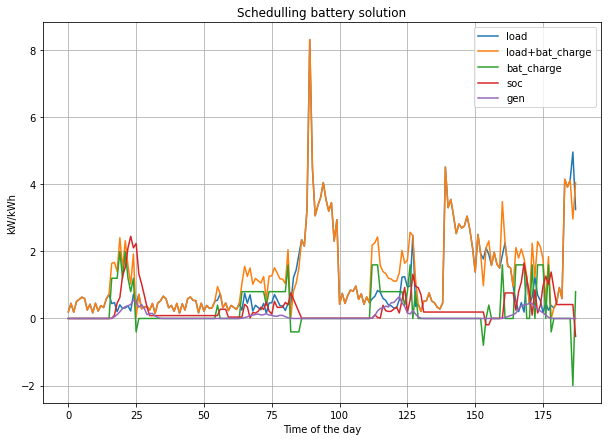

In [16]:
flex.makeplot(48,state_track[:,3],action_track,env.data[:,0],env.data[:,1],env) # O Tempo e o Env não estão a fazer nada
# makeplot(T,soc,sol,gen,load,env): Tempo, SOC, Bat_Charge, Generation, load, env

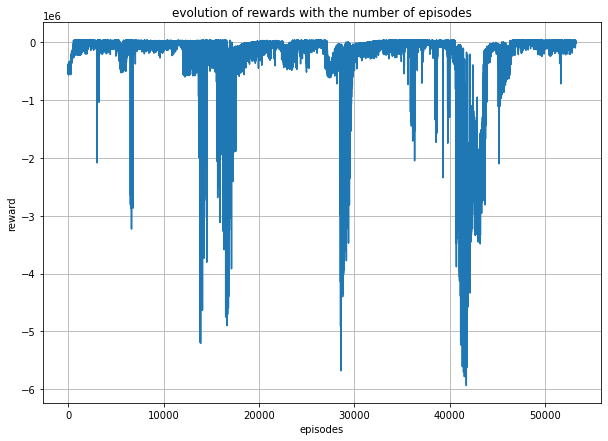

In [17]:
flex.reward_plot(env.R_Total)

In [18]:
evaluate_policy(model,env, n_eval_episodes=10)

/home/acr/anaconda3/lib/python3.9/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


30864.800000000017
30864.800000000017
30864.800000000017
30864.800000000017
30864.800000000017
30864.800000000017
30864.800000000017
30864.800000000017
30864.800000000017
30864.800000000017


(30864.799934387207, 0.0)

# Studying the battery

In [19]:
SOC = state_track[:,3]
bat_charge = action_track # Bat_charge
gen = env.data[:,0]
load = env.data[:,1]

In [20]:
state_track

array([[ 0.0000e+00,  0.0000e+00,  1.9800e-01, ...,  0.0000e+00,
         0.0000e+00,  0.0000e+00],
       [ 1.0000e+00,  0.0000e+00,  4.5000e-01, ...,  2.7750e+02,
         4.5000e-01,  0.0000e+00],
       [ 2.0000e+00,  0.0000e+00,  1.8600e-01, ...,  2.9070e+02,
         1.8600e-01,  0.0000e+00],
       ...,
       [ 1.8500e+02,  0.0000e+00,  4.1280e+00, ...,  9.3600e+01,
         4.1280e+00,  3.2000e+00],
       [ 1.8600e+02,  0.0000e+00,  4.9680e+00, ...,  5.1600e+01,
         4.9680e+00,  3.2000e+00],
       [ 1.8700e+02,  0.0000e+00,  3.2520e+00, ..., -3.0646e+03,
         1.2520e+00,  5.2000e+00]], dtype=float32)

In [21]:
def myplot(x):
    plt.figure(figsize=(10,6))
    plt.plot(x)

In [22]:
env.data

array([[0.0, 0.198],
       [0.0, 0.44999999999999996],
       [0.0, 0.186],
       [0.0, 0.504],
       [0.0, 0.5700000000000001],
       [0.0, 0.636],
       [0.0, 0.5940000000000001],
       [0.0, 0.252],
       [0.0, 0.42599999999999993],
       [0.0, 0.168],
       [0.0, 0.45599999999999996],
       [0.0, 0.22199999999999998],
       [0.0, 0.384],
       [0.0, 0.324],
       [0.0, 0.5820000000000001],
       [0.0, 0.72],
       [0.012, 0.44399999999999995],
       [0.05, 0.474],
       [0.115, 0.20400000000000001],
       [0.1975, 0.40800000000000003],
       [0.298, 0.30000000000000004],
       [0.3535, 0.318],
       [0.379, 0.372],
       [0.419, 0.22199999999999998],
       [0.551, 0.726],
       [0.4715, 0.43799999999999994],
       [0.3345, 0.72],
       [0.4165, 0.28800000000000003],
       [0.3045, 0.342],
       [0.1135, 0.36],
       [0.141, 0.252],
       [0.1525, 0.44999999999999996],
       [0.076, 0.15000000000000002],
       [0.029, 0.46199999999999997],
       [0.0

Text(0, 0.5, 'gen')

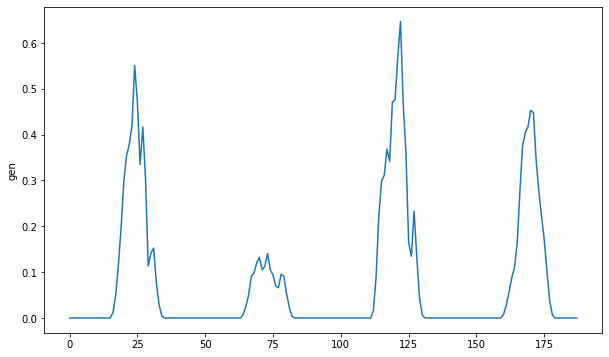

In [23]:
myplot(gen)
plt.ylabel('gen')

In [24]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0075, 0.025, 0.05,
       0.0905, 0.0985, 0.1205, 0.132, 0.105, 0.113, 0.141, 0.1045, 0.094,
       0.0695, 0.066, 0.0955, 0.0905, 0.053, 0.023, 0.004, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.016, 0.0895, 0.2235, 0.2985, 0.311, 0.3685, 0.342, 0.4705,
       0.4765, 0.5695, 0.647, 0.4675, 0.361, 0.1645, 0.1345, 0.2335,
       0.133, 0.0445, 0.0065, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

Text(0, 0.5, 'load')

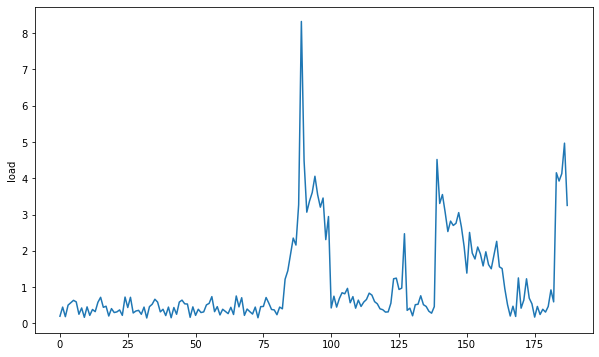

In [25]:
myplot(load)
plt.ylabel('load')

Text(0, 0.5, 'SOC')

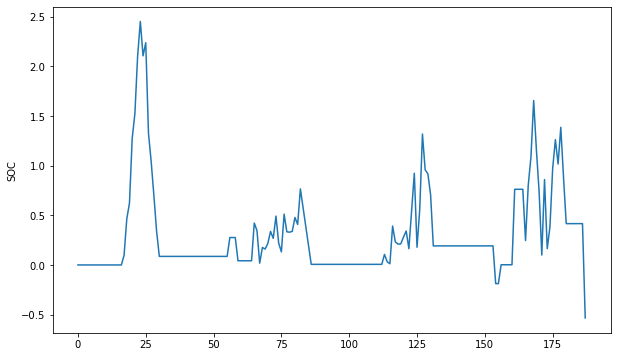

In [26]:
myplot(SOC)
plt.ylabel('SOC')

Text(0, 0.5, 'Battery Charge')

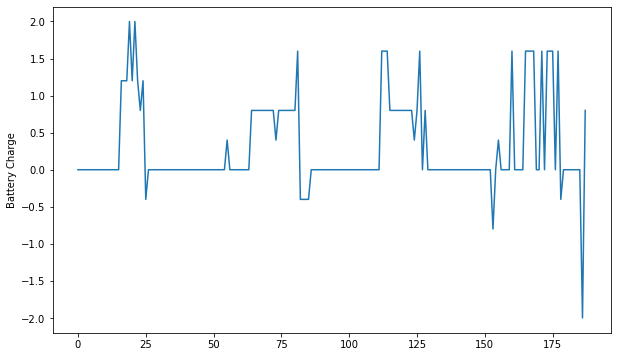

In [27]:
myplot(bat_charge)
plt.ylabel('Battery Charge')

Text(0, 0.5, 'Rewards track')

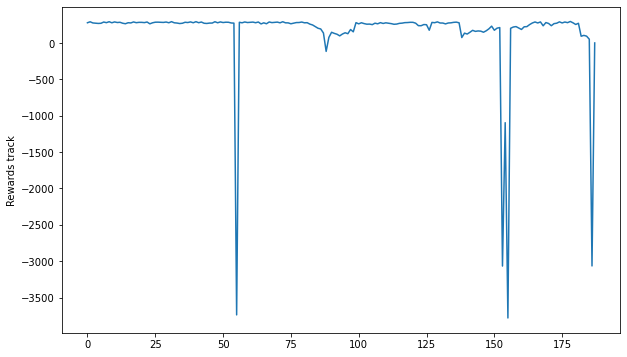

In [28]:
myplot(rewards_track)
plt.ylabel('Rewards track')

Text(0, 0.5, 'Energy taken from the grid')

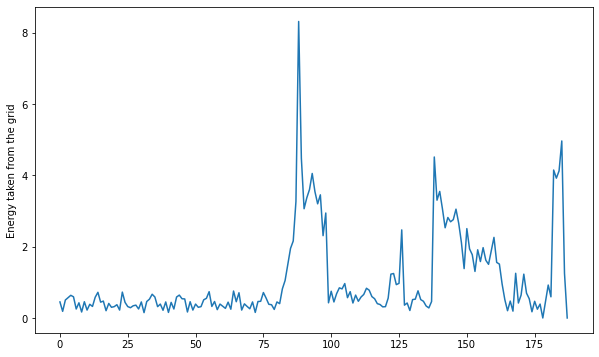

In [29]:
myplot(grid_track)
plt.ylabel('Energy taken from the grid')

Text(0, 0.5, 'Energy used from PV track')

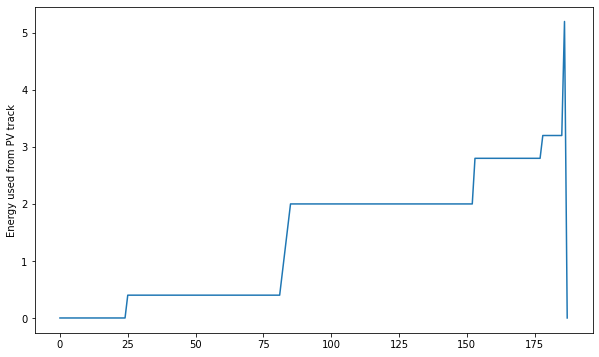

In [30]:
myplot(PV_track)
plt.ylabel('Energy used from PV track')

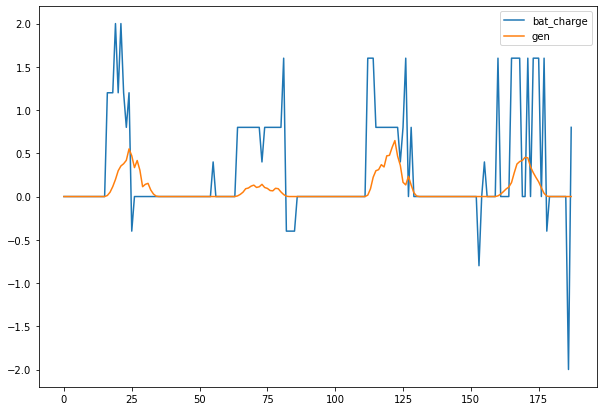

In [31]:
plt.figure(figsize=(10,7))
plt.legend
plt.plot(bat_charge,label='bat_charge')
plt.plot(gen,label='gen')
plt.legend()
plt.show()

In [32]:
eta = 0.95
dh=30*(1/60)

In [33]:
SOC

array([ 0.000e+00,  0.000e+00,  0.000e+00,  0.000e+00,  0.000e+00,
        0.000e+00,  0.000e+00,  0.000e+00,  0.000e+00,  0.000e+00,
        0.000e+00,  0.000e+00,  0.000e+00,  0.000e+00,  0.000e+00,
        0.000e+00,  0.000e+00,  9.600e-02,  4.620e-01,  6.240e-01,
        1.274e+00,  1.526e+00,  2.104e+00,  2.452e+00,  2.106e+00,
        2.238e+00,  1.328e+00,  1.040e+00,  6.980e-01,  3.380e-01,
        8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,
        8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,
        8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,
        8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,
        8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,  8.600e-02,
        8.600e-02,  2.760e-01,  2.760e-01,  2.760e-01,  4.200e-02,
        4.200e-02,  4.200e-02,  4.200e-02,  4.200e-02,  4.200e-02,
        4.220e-01,  3.460e-01,  1.800e-02,  1.760e-01,  1.600e-01,
        2.160e-01,  3.380e-01,  2.680e-01,  4.920e-01,  2.200e

In [34]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0075, 0.025, 0.05,
       0.0905, 0.0985, 0.1205, 0.132, 0.105, 0.113, 0.141, 0.1045, 0.094,
       0.0695, 0.066, 0.0955, 0.0905, 0.053, 0.023, 0.004, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.016, 0.0895, 0.2235, 0.2985, 0.311, 0.3685, 0.342, 0.4705,
       0.4765, 0.5695, 0.647, 0.4675, 0.361, 0.1645, 0.1345, 0.2335,
       0.133, 0.0445, 0.0065, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [35]:
C=np.array(bat_charge)*eta*dh
Sum=[]
Sumi = 0
for i in range(len(np.array(bat_charge)*eta*dh)):
    Sumi+= C[i]
    Sum.append(Sumi)
Sum

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.5700000000000001,
 1.1400000000000001,
 1.7100000000000002,
 2.66,
 3.2300000000000004,
 4.180000000000001,
 4.750000000000001,
 5.130000000000001,
 5.700000000000001,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.510000000000002,
 5.700000000000002,
 5.700000000000002,
 5.700000000000002,
 5.700000000000002,
 5.700000000000002,
 5.700000000000002,
 5.7000000000